In [1]:
%pip install -q --upgrade "yfinance>=0.2.54" --no-cache-dir
import yfinance as yf
import cvxpy as cp
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler

from dataclasses import dataclass
from datetime import datetime, timedelta

In [2]:
etfs = ['SPY', 'QQQ', 'DIA', 'IWM', 'XLF', 'XLK', 'XBI', 'XLB', 'XLE', 'TLT']

In [3]:
for etf in etfs:
    data = yf.Ticker(etf).history(period="max")
    if not data.empty:
        print(f"{etf}: Data available from {data.index.min().date()} to {data.index.max().date()}")
    else:
        print(f"{etf}: No data found.")

SPY: Data available from 1993-01-29 to 2025-05-09
QQQ: Data available from 1999-03-10 to 2025-05-09
DIA: Data available from 1998-01-20 to 2025-05-09
IWM: Data available from 2000-05-26 to 2025-05-09
XLF: Data available from 1998-12-22 to 2025-05-09
XLK: Data available from 1998-12-22 to 2025-05-09
XBI: Data available from 2006-02-06 to 2025-05-09
XLB: Data available from 1998-12-22 to 2025-05-09
XLE: Data available from 1998-12-22 to 2025-05-09
TLT: Data available from 2002-07-30 to 2025-05-09


In [4]:
# Define date range
start_date = '2000-01-01'
end_date = datetime.today().strftime('%Y-%m-%d')

In [5]:
data = yf.download(etfs, start=start_date, end=end_date)['Close']

YF.download() has changed argument auto_adjust default to True


[*********************100%***********************]  10 of 10 completed


In [6]:
adj_close = data.rename(columns=lambda x: x.upper()) # Ensure consistency
adj_close = adj_close.reset_index()
adj_close['Date'] = pd.to_datetime(adj_close['Date'])
adj_close

Ticker,Date,DIA,IWM,QQQ,SPY,TLT,XBI,XLB,XLE,XLF,XLK
0,2000-01-03,65.682808,NaN,80.314339,92.414886,NaN,NaN,14.739730,13.739202,11.262165,41.488522
1,2000-01-04,63.521725,NaN,74.804596,88.800957,NaN,NaN,14.597830,13.480583,10.769830,39.383698
2,2000-01-05,64.344536,NaN,72.897377,88.959816,NaN,NaN,15.200906,13.836185,10.685209,38.799019
3,2000-01-06,64.670128,NaN,67.891006,87.530090,NaN,NaN,15.591123,14.369591,11.154468,37.512741
4,2000-01-07,66.840279,NaN,76.287994,92.613472,NaN,NaN,15.582255,14.523147,11.339092,38.167591
...,...,...,...,...,...,...,...,...,...,...,...
6372,2025-05-05,412.260010,198.940002,485.929993,563.510010,87.239998,82.650002,84.300003,80.500000,49.439999,215.460007
6373,2025-05-06,408.239990,196.770004,481.410004,558.799988,87.529999,77.169998,83.690002,80.519997,49.160000,213.669998
6374,2025-05-07,411.049988,197.419998,483.299988,561.150024,87.900002,77.349998,83.230003,80.550003,49.450001,215.809998
6375,2025-05-08,413.880005,201.179993,488.290009,565.059998,86.919998,78.040001,84.339996,81.610001,49.860001,217.869995


In [7]:
# Return calculation
return_df = data.pct_change().dropna()

In [8]:
# cumulative return
cum_return_df = (1 + return_df).cumprod()

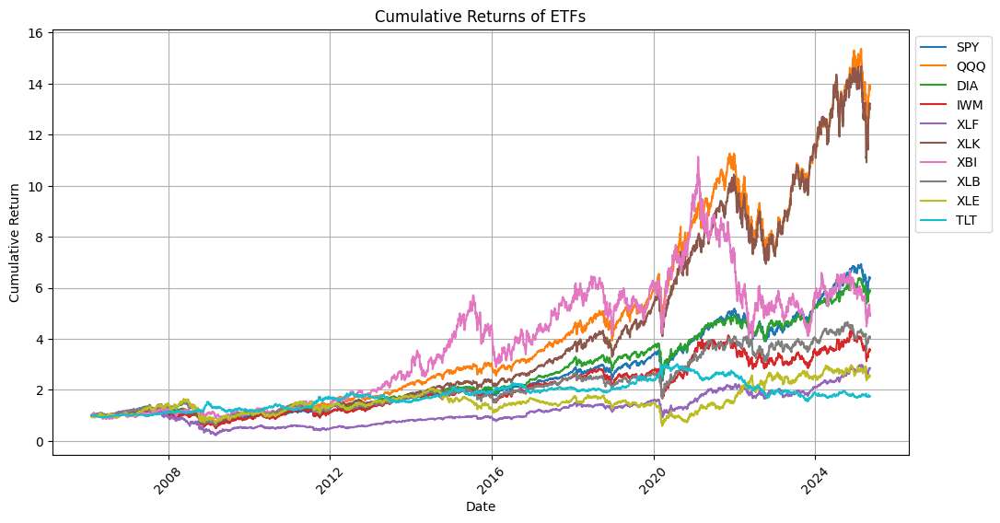

In [9]:
# Cumulative return (compounded)
plt.figure(figsize=(12, 6))
for etf in etfs:
    plt.plot(cum_return_df.index, cum_return_df[etf], label=etf)

plt.title("Cumulative Returns of ETFs")
plt.xlabel("Date")
plt.ylabel("Cumulative Return")
plt.legend(loc='upper left', bbox_to_anchor=(1, 1))
plt.grid()
plt.xticks(rotation=45)
plt.show()

In [10]:
# Split into training and test sets
train_data, test_data = train_test_split(return_df, test_size=0.2, shuffle=False)
return_df

Ticker,DIA,IWM,QQQ,SPY,TLT,XBI,XLB,XLE,XLF,XLK
Date,,,,,,,,,,
2006-02-07,-0.004999,-0.016156,-0.004411,-0.008847,-0.004724,-0.003046,-0.026233,-0.041741,-0.006632,-0.002827
2006-02-08,0.010328,0.006315,0.011568,0.009085,-0.002318,-0.000407,0.001623,0.000185,0.006358,0.019376
2006-02-09,0.002302,-0.005160,-0.009489,-0.001659,0.004536,0.009372,0.003240,-0.022794,0.002527,-0.004636
2006-02-10,0.002665,-0.002103,0.006141,0.001820,-0.005507,0.002826,-0.001938,-0.003603,0.005671,0.007918
2006-02-13,-0.000733,-0.006603,-0.011474,-0.001816,0.000111,-0.014090,-0.010032,-0.003996,-0.003760,-0.009243
...,...,...,...,...,...,...,...,...,...,...
2025-05-05,-0.001888,-0.007682,-0.005933,-0.005734,-0.005585,-0.010180,-0.007418,-0.018053,-0.006431,-0.005309
2025-05-06,-0.009751,-0.010908,-0.009302,-0.008358,0.003324,-0.066304,-0.007236,0.000248,-0.005663,-0.008308
2025-05-07,0.006883,0.003303,0.003926,0.004206,0.004227,0.002333,-0.005496,0.000373,0.005899,0.010015


In [11]:
# Data Preprocessing (mean, covariance, etc)
daily_returns = return_df.dropna(axis=0)
print("Daily Arithmetic Returns:")
print(daily_returns)

mean_returns = daily_returns.mean()
print("\nMean returns:")
print(mean_returns)

covariance_matrix = daily_returns.cov().to_numpy()
print("\nCovariance Matrix:")
print(covariance_matrix)


Daily Arithmetic Returns:
Ticker           DIA       IWM       QQQ       SPY       TLT       XBI  \
Date                                                                     
2006-02-07 -0.004999 -0.016156 -0.004411 -0.008847 -0.004724 -0.003046   
2006-02-08  0.010328  0.006315  0.011568  0.009085 -0.002318 -0.000407   
2006-02-09  0.002302 -0.005160 -0.009489 -0.001659  0.004536  0.009372   
2006-02-10  0.002665 -0.002103  0.006141  0.001820 -0.005507  0.002826   
2006-02-13 -0.000733 -0.006603 -0.011474 -0.001816  0.000111 -0.014090   
...              ...       ...       ...       ...       ...       ...   
2025-05-05 -0.001888 -0.007682 -0.005933 -0.005734 -0.005585 -0.010180   
2025-05-06 -0.009751 -0.010908 -0.009302 -0.008358  0.003324 -0.066304   
2025-05-07  0.006883  0.003303  0.003926  0.004206  0.004227  0.002333   
2025-05-08  0.006885  0.019046  0.010325  0.006968 -0.011149  0.008921   
2025-05-09 -0.003528 -0.001839 -0.000655 -0.001274  0.001496 -0.021143   

Ticker     

array([[<Axes: title={'center': 'DIA'}>, <Axes: title={'center': 'IWM'}>,
        <Axes: title={'center': 'QQQ'}>],
       [<Axes: title={'center': 'SPY'}>, <Axes: title={'center': 'TLT'}>,
        <Axes: title={'center': 'XBI'}>],
       [<Axes: title={'center': 'XLB'}>, <Axes: title={'center': 'XLE'}>,
        <Axes: title={'center': 'XLF'}>],
       [<Axes: title={'center': 'XLK'}>, <Axes: >, <Axes: >]],
      dtype=object)

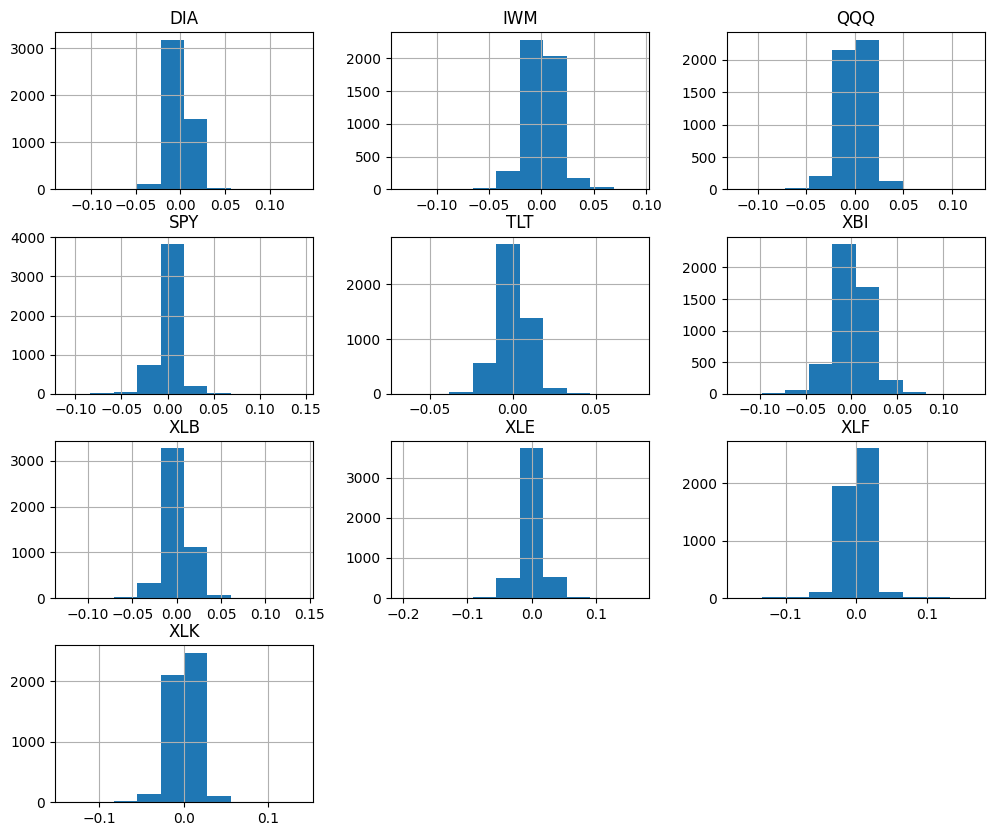

In [12]:
daily_returns.hist(figsize = (12, 10))

## Set up optimization model

### Markowitz Portfolio Optimization Problem

The goal of Markowitz Portfolio Optimization is to minimize risk for a given level of expected return or to maximize return for a given level of risk. This is mathematically formulated as follows:

\begin{align}
\text{Minimize: } &x^T V x \\
\text{Subject to: } & \mu^T x + \mu_0 x_0\geq R\\
&e^T x + x_0 = 1\\
&x_i \geq 0 \quad \text{for every } i = 1, \dots, K
\end{align}

Here we impose the no-shorting and self-financing constraint.

In [13]:
mu0 = 0 #daily interest rate
n = len(etfs) #number of assets

# Create decision variables
w = cp.Variable(n)
c = cp.Variable(1)

# Set the target returns
R = 0.0006

# Set up returns and risk expressions
ret = mean_returns.to_numpy() @ w + mu0 * c #return
risk = w.T @ covariance_matrix @ w #risk (standard deviation)

# Set up objective and constraints
obj = cp.Minimize(risk)
constraints = [0.0 <= w, #no shorting
               0<= c, # no borrowing
               R <= ret, # target return level
               cp.sum(w) + c == 1 # self-financing
               ]

prob = cp.Problem(obj, constraints)

# Solve the problem!
try:
    prob.solve(solver = cp.CLARABEL)
    print ("Optimal portfolio")
    print ("----------------------")
    for s in range(len(etfs)):
        print (" Investment in {} : {}% of the portfolio".format(etfs[s],round(100*w.value[s],2)))
    print(f'Cash: {c.value}')
    print ("----------------------")
    return_percentages = ret.value * 100
    risk_value = risk.value
    print (f"Exp ret = {return_percentages}%")
    print (f"Expected risk    = {risk_value}%")
except Exception as e:
    print(e)
    print(e)


Optimal portfolio
----------------------
 Investment in SPY : 0.0% of the portfolio
 Investment in QQQ : 0.0% of the portfolio
 Investment in DIA : 91.41% of the portfolio
 Investment in IWM : 0.0% of the portfolio
 Investment in XLF : 8.58% of the portfolio
 Investment in XLK : 0.0% of the portfolio
 Investment in XBI : 0.0% of the portfolio
 Investment in XLB : 0.0% of the portfolio
 Investment in XLE : 0.0% of the portfolio
 Investment in TLT : 0.01% of the portfolio
Cash: [2.04957591e-07]
----------------------
Exp ret = [0.06]%
Expected risk    = 0.0001583886347923428%


## CVaR Optimization Problem

We can set up the portfolio optimization problem of minimizing CVaR subject to a target return as follows:

\begin{align}
\text{Minimize: } &\text{CVaR}(w, \alpha)  \\
\text{Subject to: } & \mu^T w + \mu_0 c\geq R\\
&e^T w + c = 1\\
&w_i \geq 0 \quad \text{for every } i = 1, \dots, K
\end{align}

where $\alpha$ is the confidence level.

In [14]:
# Compute daily log returns from closing prices
daily_log_returns = np.log(data / data.shift(1)).dropna()

# Compute mean log returns and covariance matrix from log returns
mean_log_returns = daily_log_returns.mean()
cov_log = daily_log_returns.cov().to_numpy()

# Generate return scenarios based on a multivariate normal distribution
num_scen = 20000  # number of scenarios

# Generate log return scenarios
log_returns_scenarios = np.random.multivariate_normal(mean_log_returns, cov_log, num_scen)
linear_returns_scenarios = np.exp(log_returns_scenarios) - 1

# Set parameters for CVaR optimization
mu0 = 0  # daily interest rate
n = len(etfs)  # number of assets (using the etfs)

# Set the target returns
R_target = 0.0006

# set CVaR confidence level
alpha = 0.95

# Create decision variables
w = cp.Variable(n)
c = cp.Variable(1)

# Set up returns and risk expressions
ret = mean_returns.to_numpy() @ w + mu0 * c
risk = cp.atoms.cvar(-linear_returns_scenarios @ w, alpha)

# Set up objective and constraints
obj = cp.Minimize(risk)
constraints = [
    w >= 0,  # no shorting
    c >= 0,  # no borrowing
    ret >= R_target, # target return level
    cp.sum(w) + c == 1  # self-financing
]

prob = cp.Problem(obj, constraints)
result = prob.solve(solver=cp.CLARABEL)

# Display the optimal portfolio allocation and the CVaR risk
print("CVaR Optimization - Optimal Portfolio")
print("---------------------------------------")
for i, asset in enumerate(etfs):
    print(f" Investment in {asset}: {round(100 * w.value[i], 2)}%")
print(f" Cash: {c.value}")
print(f"Expected Portfolio Return: {round(ret.value.item() * 100, 2)}%")
print(f"Portfolio CVaR (Loss): {round(risk.value, 4)}")

CVaR Optimization - Optimal Portfolio
---------------------------------------
 Investment in SPY: 0.0%
 Investment in QQQ: 0.0%
 Investment in DIA: 91.42%
 Investment in IWM: 0.0%
 Investment in XLF: 8.58%
 Investment in XLK: 0.0%
 Investment in XBI: 0.0%
 Investment in XLB: -0.0%
 Investment in XLE: 0.0%
 Investment in TLT: 0.0%
 Cash: [-1.8606922e-12]
Expected Portfolio Return: 0.06%
Portfolio CVaR (Loss): 0.0255


## L1 Regularization (Lasso)

Purpose: Achieve sparse portfolios by driving some asset weights to zero

In [15]:
def l1_regularized_portfolio(expected_returns,
                             covariance_matrix,
                             gamma=0.01,
                             eta=0.1,
                             w_min=0.01):
    """
    Min-variance with:
      • L1 penalty (lasso) for sparsity: gamma * ||w||₁
      • Diversification penalty: eta * ||w – (1/n)||₂²
      • Floor constraint: w_i >= w_min for all i
    Returns optimal weights (no cash bucket).
    """
    n_assets = len(expected_returns)
    w = cp.Variable(n_assets)

    # basic quantities
    risk = cp.quad_form(w, covariance_matrix)
    ret  = expected_returns @ w

    # diversification penalty: squared distance to uniform
    uniform = np.ones(n_assets) / n_assets
    div_penalty = cp.sum_squares(w - uniform)

    # objective: risk – return + L1 + diversification
    obj = cp.Minimize(
        risk
        - ret
        + gamma * cp.norm1(w)
        + eta   * div_penalty
    )

    constraints = [
        cp.sum(w) == 1,      # fully invested
        w >= w_min           # at least w_min in every ETF
    ]

    prob = cp.Problem(obj, constraints)
    prob.solve(solver=cp.CLARABEL)

    return w.value.flatten()

## L2 Regularization (Ridge)
Purpose: Reduce extreme weights without enforcing sparsity

In [16]:
def l2_regularized_portfolio(expected_returns,
                             covariance_matrix,
                             gamma=0.1,
                             eta=0.1,
                             w_min=0.01):
    """
    Ridge+diversification portfolio:
      • risk – return
      • + gamma * ||w||₂
      • + eta   * ||w – (1/n)||₂²
      • w_i >= w_min, sum w = 1
    """
    n_assets = len(expected_returns)
    w = cp.Variable(n_assets)

    risk = cp.quad_form(w, covariance_matrix)
    ret  = expected_returns @ w

    # diversification penalty: squared distance to uniform
    uniform = np.ones(n_assets) / n_assets
    div_penalty = cp.sum_squares(w - uniform)

    obj = cp.Minimize(
        risk
        - ret
        + gamma * cp.norm(w, 2)
        + eta   * div_penalty
    )

    constraints = [
        cp.sum(w) == 1,
        w >= w_min
    ]

    prob = cp.Problem(obj, constraints)
    prob.solve(solver=cp.CLARABEL)
    return w.value.flatten()

## Performance-Based Regularization (PBR)

Purpose: Ensure stability by capping risk and return estimates fluctuations

In [17]:
def mean_variance_pbr_rank1(returns,
                            gamma=0.1,
                            epsilon=0.1,
                            eta=0.1,
                            w_min=0.01):
    """
    PBR rank-1 + diversification + floor:
      • risk – return
      • + gamma * ||w||₁
      • + eta   * ||w – (1/n)||₂²
      • sample_var_risk + sample_var_return <= epsilon
      • w_i >= w_min, sum w = 1
    """
    n_samples, n_assets = returns.shape
    emp_ret = returns.mean(axis=0)
    emp_cov = np.cov(returns.T)

    w = cp.Variable(n_assets)

    risk = cp.quad_form(w, emp_cov)
    ret  = emp_ret @ w

    var_risk   = cp.quad_form(w, emp_cov)
    var_return = cp.sum_squares(returns @ w) / n_samples

    # diversification penalty
    uniform = np.ones(n_assets) / n_assets
    div_penalty = cp.sum_squares(w - uniform)

    obj = cp.Minimize(
        risk
        - ret
        + gamma * cp.norm1(w)
        + eta   * div_penalty
    )

    constraints = [
        cp.sum(w) == 1,
        w >= w_min,
        var_risk + var_return <= epsilon
    ]

    prob = cp.Problem(obj, constraints)
    prob.solve(solver=cp.CLARABEL)
    return w.value.flatten()

In [18]:
def mean_cvar_pbr(returns,
                  alpha=0.95,
                  gamma=0.1,
                  epsilon=0.1,
                  eta=0.1,
                  w_min=0.01):
    """
    CVaR-PBR + diversification + floor:
      • Minimize cvar + gamma * ||w||₁ + eta * ||w – (1/n)||₂²
      • z constraints for CVaR, sum(z) <= (1/(1-α))ε
      • w_i >= w_min, sum w = 1
    """
    n_samples, n_assets = returns.shape
    w    = cp.Variable(n_assets)
    cvar = cp.Variable()
    z    = cp.Variable(n_samples)

    # diversification penalty
    uniform = np.ones(n_assets) / n_assets
    div_penalty = cp.sum_squares(w - uniform)

    obj = cp.Minimize(
        cvar
        + gamma * cp.norm1(w)
        + eta   * div_penalty
    )

    constraints = [
        cp.sum(w) == 1,
        w >= w_min,
        z >= -returns @ w - cvar,
        z >= 0,
        cp.sum(z) <= (1/(1-alpha)) * epsilon
    ]

    prob = cp.Problem(obj, constraints)
    prob.solve(solver=cp.CLARABEL)
    return w.value.flatten()

## Rebalancing Portfolio (Weekly)

- Weekly data is typically more robust
- Use weekly data and rebalance monthly, so every 4 weeks
- Want to answer: How much did the portfolio actually earn in the month that you are holding it?


In [19]:
# ---------- helper functions ----------
def print_results(tickers, w, c, ret, risk_val):
    print("Optimal portfolio")
    print("----------------------")
    for i, t in enumerate(tickers):
        print(f" Investment in {t} : {round(100*w[i],2)}%")
    print(f"Cash: {c}")
    print("----------------------")
    print(f"Exp ret = {ret*100}%")
    print(f"Expected risk = {risk_val}%")

def compute_log_returns(prices: pd.DataFrame):
    log_r = np.log(prices / prices.shift(1)).dropna()
    return log_r, log_r.mean(), log_r.cov().to_numpy()

def project_returns(prices_window: pd.DataFrame, horizon_wks: int):
    log_r, mu_log, cov_log = compute_log_returns(prices_window)
    mu_h   = horizon_wks * mu_log
    cov_h  = horizon_wks * cov_log
    mu_lin = np.exp(mu_h + 0.5*np.diag(cov_h)) - 1
    cov_lin = np.outer(mu_lin+1, mu_lin+1)*(np.exp(cov_h)-1)
    return mu_lin.values, cov_lin

def calc_portfolio_returns(window_prices, weights, cash):
    port_val = cash + window_prices.dot(weights)
    return port_val.pct_change().dropna()

def realized_sharpe(r, rf=0, horizon_wks=4):
    excess = r - rf
    sr = excess.mean()/excess.std()*np.sqrt(52/horizon_wks)
    return sr

def max_drawdown(ret_series):
    """
    Peak-to-trough loss of an equity curve.
    Parameters
    ----------
    ret_series : 1-D iterable of period returns (list, ndarray, Series)
    Returns
    -------
    mdd : float   # expressed as a positive fraction, e.g. 0.23 = −23 %
    """
    arr = np.asarray(ret_series, dtype=float).ravel()   # <-- convert once
    if arr.size == 0:
        return 0.0

    equity = np.cumprod(1 + arr)
    peaks  = np.maximum.accumulate(equity)
    drawd  = 1 - equity / peaks
    return drawd.max()

def plot_weight_scatter(date_label, tickers, weights,
                        marker='o', base_size=400, figsize=(6,3.5),
                        color="#1f77b4"):
    """
    Scatter plot of portfolio weights for a single rebalance date.

    Parameters
    ----------
    date_label : str or datetime-like
        Text shown in the title (e.g., '2016-11-27').
    tickers : list[str]
        Asset symbols in the same order as `weights`.
    weights : 1-D array-like
        Portfolio weights; must sum to 1.
    marker : str
        Marker style passed to plt.scatter.
    base_size : int
        Size multiplier so dots scale roughly with weight (%).
    figsize : tuple
        Matplotlib figure size in inches.
    color : str
        Marker face colour.
    """
    w = np.asarray(weights, dtype=float).ravel()
    x = np.arange(len(tickers))

    plt.figure(figsize=figsize)
    plt.scatter(x, w*100,
                s=base_size*w,       # size ∝ weight
                marker=marker, color=color, edgecolor="k", linewidth=0.4)

    plt.xticks(x, tickers, rotation=45, ha="right")
    plt.ylabel("Weight (%)")
    plt.title(f"Portfolio Weights on {date_label}")
    plt.ylim(0, max(15, w.max()*100*1.15))
    plt.grid(axis='y', alpha=0.25)
    plt.tight_layout()
    plt.show()

# ---------- data classes & optimiser ----------
@dataclass
class Parameters:
    w_min: np.ndarray; w_max: np.ndarray
    c_min: float;      c_max: float
    z_min: np.ndarray; z_max: np.ndarray
    T_tar: float;      L_tar: float
    risk_target: float
    gamma_hold: float; gamma_trade: float
    gamma_turn: float; gamma_risk: float

@dataclass
class Data:
    w_prev: np.ndarray; mean: np.ndarray
    risk_free: float;   cov: np.ndarray
    kappa_short: np.ndarray; kappa_borrow: float
    kappa_spread: np.ndarray; kappa_impact: np.ndarray

def markowitz(data: Data, p: Parameters):
    n = len(data.mean)
    w, c = cp.Variable(n), cp.Variable()
    z     = w - data.w_prev
    T     = cp.norm1(z)/2
    L     = cp.norm1(w)
    risk  = cp.quad_form(w, data.cov)
    ret   = w.T @ data.mean
    obj   = ret
    constr = [
        cp.sum(w)+c == 1,
        p.w_min <= w, w <= p.w_max,
        p.c_min <= c, c <= p.c_max,
        p.z_min <= z, z <= p.z_max,
        T <= p.T_tar,
        L <= p.L_tar,
        risk <= p.risk_target
    ]
    prob = cp.Problem(cp.Maximize(obj), constr)
    prob.solve()
    return w.value, c.value, ret.value, risk.value

# ---------- weekly prices ----------
weekly_px = yf.download(etfs, start=start_date, end=end_date,interval="1wk")["Close"].dropna()

rebalance_wks = 4      # monthly
lookback_wks  = 12     # trailing three months
rf_rate       = 0.0

# parameter set (no shorting / no borrowing to match earlier model)
n_assets = len(etfs)
params = Parameters(
    w_min=np.zeros(n_assets),
    w_max=np.ones(n_assets),
    c_min=0.0,
    c_max=1.0,
    z_min=-np.ones(n_assets),
    z_max=np.ones(n_assets),
    T_tar=1.0, L_tar=1.0, risk_target=0.03,
    gamma_hold=0.0, gamma_trade=0.0, gamma_turn=0.0, gamma_risk=0.0)

# ---------- rolling rebalance ----------
w_prev = np.ones(n_assets)/n_assets  # start equal‑weight
c_prev = 0.0
dates  = weekly_px.index
monthly_returns = []
for i in range(lookback_wks, len(dates)-rebalance_wks, rebalance_wks):
    # training window
    win_prices = weekly_px.iloc[i-lookback_wks:i]
    mu, cov    = project_returns(win_prices, horizon_wks=rebalance_wks)
    data_obj = Data(w_prev=w_prev, mean=mu, risk_free=rf_rate, cov=cov,
        kappa_short=np.zeros(n_assets), kappa_borrow=0.0,
        kappa_spread=np.zeros(n_assets), kappa_impact=np.zeros(n_assets))

    w_opt, c_opt, exp_ret, exp_risk = markowitz(data_obj, params)
    print(f"\nRebalance date: {dates[i].date()}")
    print_results(etfs, w_opt, c_opt, exp_ret, exp_risk)

    # realised performance over holding month
    hold_slice = weekly_px.iloc[i:i+rebalance_wks]
    realised_r = calc_portfolio_returns(hold_slice, w_prev, c_prev)
    realised_ret = (1+realised_r).prod() - 1
    monthly_returns.append(realised_ret)
    monthly_excess = monthly_returns  # assuming rf = 0

    mean_monthly = np.mean(monthly_excess)
    std_monthly = np.std(monthly_excess)

    mdd = max_drawdown(monthly_returns)

    monthly_sharpe = mean_monthly / std_monthly if std_monthly > 1e-8 else 0
    annualized_sharpe = monthly_sharpe * np.sqrt(12)

    print("\n--- Portfolio Performance Summary (Base Markowitz) ---")
    print(f"Average Monthly Return     : {round(mean_monthly * 100, 2)}%")
    print(f"Monthly Sharpe Ratio       : {round(monthly_sharpe, 3)}")
    print(f"Annualized Sharpe Ratio    : {round(annualized_sharpe, 3)}")
    print(f"Maximum Drawdown         : {round(mdd*100, 2)}%")

[*********************100%***********************]  10 of 10 completed


[*********************100%***********************]  10 of 10 completed



=== Rebalance on 2012-03-25 ===
Optimal portfolio
----------------------
 Investment in SPY : 0.0%
 Investment in QQQ : 0.0%
 Investment in DIA : 0.0%
 Investment in IWM : 0.0%
 Investment in XLF : 0.0%
 Investment in XLK : 0.0%
 Investment in XBI : 0.0%
 Investment in XLB : 0.0%
 Investment in XLE : 100.0%
 Investment in TLT : 0.0%
Cash: 2.0423534096489687e-08
----------------------
Exp ret = 6.219292961768949%
Expected risk = 0.0019878066824456178%


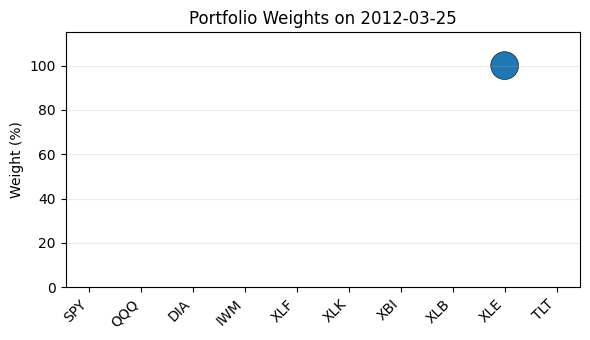


=== Rebalance on 2012-04-22 ===
Optimal portfolio
----------------------
 Investment in SPY : 0.0%
 Investment in QQQ : 0.0%
 Investment in DIA : 100.0%
 Investment in IWM : 0.0%
 Investment in XLF : 0.0%
 Investment in XLK : 0.0%
 Investment in XBI : 0.0%
 Investment in XLB : 0.0%
 Investment in XLE : 0.0%
 Investment in TLT : 0.0%
Cash: 5.432277407789636e-08
----------------------
Exp ret = 2.182472527780877%
Expected risk = 0.0006247016120428108%


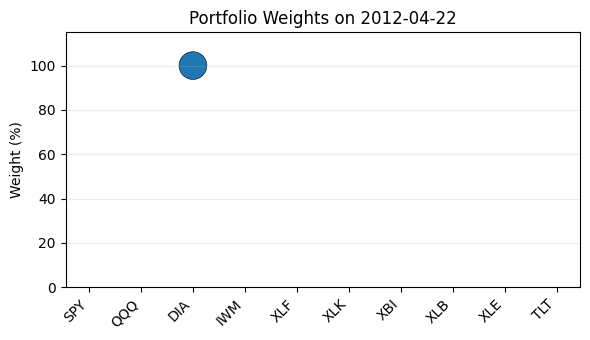


=== Rebalance on 2012-05-20 ===
Optimal portfolio
----------------------
 Investment in SPY : 0.0%
 Investment in QQQ : 0.0%
 Investment in DIA : 0.0%
 Investment in IWM : 0.0%
 Investment in XLF : 100.0%
 Investment in XLK : 0.0%
 Investment in XBI : 0.0%
 Investment in XLB : 0.0%
 Investment in XLE : 0.0%
 Investment in TLT : 0.0%
Cash: 2.1692787579678693e-08
----------------------
Exp ret = 2.51542726268272%
Expected risk = 0.0019899444252302447%


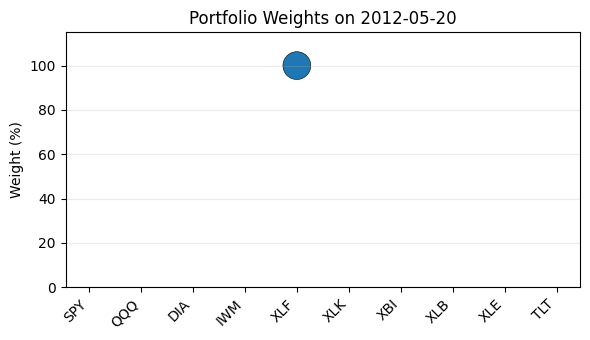


=== Rebalance on 2012-06-17 ===
Optimal portfolio
----------------------
 Investment in SPY : 0.0%
 Investment in QQQ : 0.0%
 Investment in DIA : 0.0%
 Investment in IWM : 0.0%
 Investment in XLF : 100.0%
 Investment in XLK : 0.0%
 Investment in XBI : 0.0%
 Investment in XLB : 0.0%
 Investment in XLE : 0.0%
 Investment in TLT : 0.0%
Cash: 1.1436481008727993e-08
----------------------
Exp ret = 4.82914364664821%
Expected risk = 0.0027682573091853957%


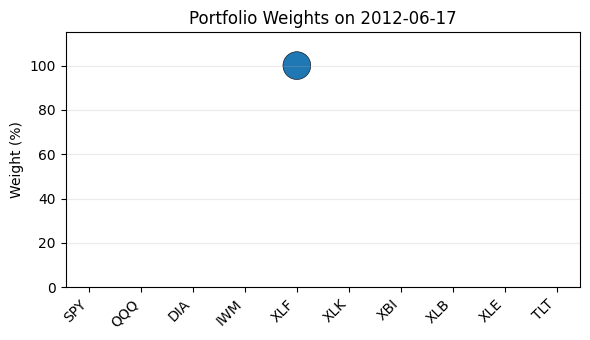


=== Rebalance on 2012-07-15 ===
Optimal portfolio
----------------------
 Investment in SPY : 0.0%
 Investment in QQQ : 0.0%
 Investment in DIA : 0.0%
 Investment in IWM : 0.0%
 Investment in XLF : 0.0%
 Investment in XLK : 100.0%
 Investment in XBI : 0.0%
 Investment in XLB : 0.0%
 Investment in XLE : 0.0%
 Investment in TLT : 0.0%
Cash: 3.563060796427874e-08
----------------------
Exp ret = 4.227575031642377%
Expected risk = 0.0069649376220045425%


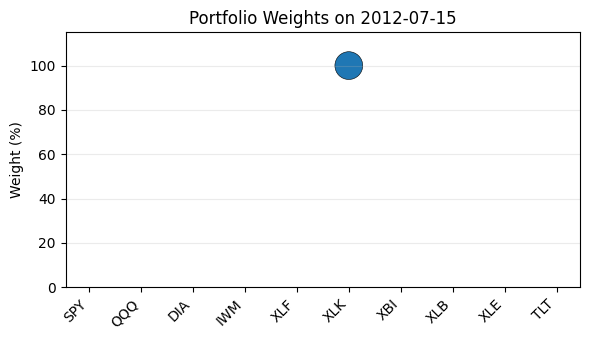


=== Rebalance on 2012-08-12 ===
Optimal portfolio
----------------------
 Investment in SPY : 0.0%
 Investment in QQQ : 0.0%
 Investment in DIA : 0.0%
 Investment in IWM : 0.0%
 Investment in XLF : 0.0%
 Investment in XLK : 0.0%
 Investment in XBI : 0.0%
 Investment in XLB : 100.0%
 Investment in XLE : 0.0%
 Investment in TLT : 0.0%
Cash: 7.81929872834755e-09
----------------------
Exp ret = 4.257324207567057%
Expected risk = 0.0035055601860359067%


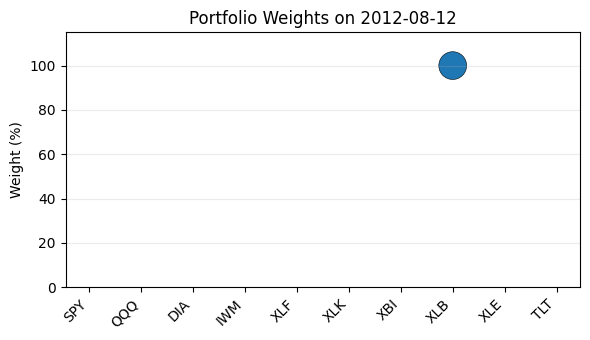


=== Rebalance on 2012-09-09 ===
Optimal portfolio
----------------------
 Investment in SPY : 0.0%
 Investment in QQQ : 0.0%
 Investment in DIA : 0.0%
 Investment in IWM : 0.0%
 Investment in XLF : 0.0%
 Investment in XLK : 0.0%
 Investment in XBI : 0.0%
 Investment in XLB : 100.0%
 Investment in XLE : 0.0%
 Investment in TLT : 0.0%
Cash: 8.49990018420379e-10
----------------------
Exp ret = 5.535570062818866%
Expected risk = 0.0013408846197702953%


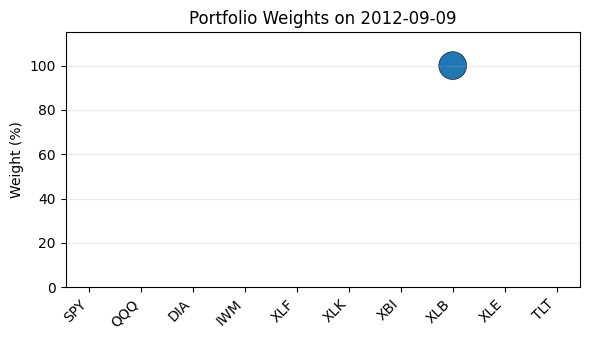


=== Rebalance on 2012-10-07 ===
Optimal portfolio
----------------------
 Investment in SPY : 0.0%
 Investment in QQQ : 0.0%
 Investment in DIA : 0.0%
 Investment in IWM : 0.0%
 Investment in XLF : 0.0%
 Investment in XLK : 0.0%
 Investment in XBI : 0.0%
 Investment in XLB : 0.0%
 Investment in XLE : 100.0%
 Investment in TLT : 0.0%
Cash: 5.341314021259404e-09
----------------------
Exp ret = 4.341731424652219%
Expected risk = 0.0017738724976854676%


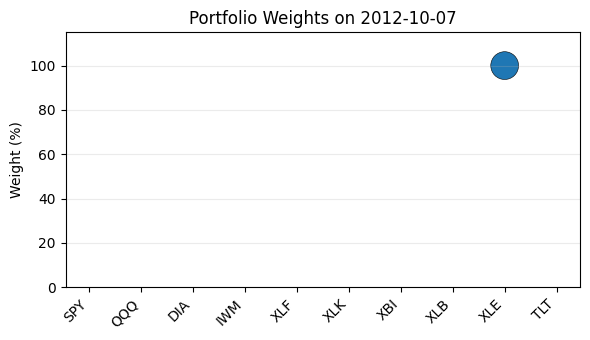


=== Rebalance on 2012-11-04 ===
Optimal portfolio
----------------------
 Investment in SPY : 0.0%
 Investment in QQQ : 0.0%
 Investment in DIA : 0.0%
 Investment in IWM : 0.0%
 Investment in XLF : 0.0%
 Investment in XLK : 0.0%
 Investment in XBI : 0.0%
 Investment in XLB : 0.0%
 Investment in XLE : 100.0%
 Investment in TLT : 0.0%
Cash: 2.3471611005255586e-08
----------------------
Exp ret = 2.313201530646919%
Expected risk = 0.0021588831106394454%


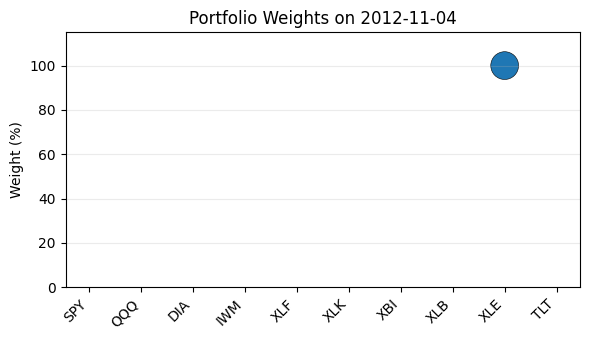


=== Rebalance on 2012-12-02 ===
Optimal portfolio
----------------------
 Investment in SPY : 0.0%
 Investment in QQQ : 0.0%
 Investment in DIA : 0.0%
 Investment in IWM : 0.0%
 Investment in XLF : 100.0%
 Investment in XLK : 0.0%
 Investment in XBI : 0.0%
 Investment in XLB : 0.0%
 Investment in XLE : 0.0%
 Investment in TLT : 0.0%
Cash: 9.032207947642771e-08
----------------------
Exp ret = 2.116482016332186%
Expected risk = 0.0015875991018922564%


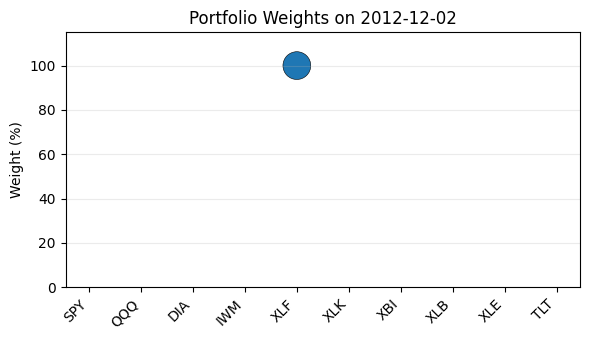


=== Rebalance on 2012-12-30 ===
Optimal portfolio
----------------------
 Investment in SPY : 0.0%
 Investment in QQQ : 0.0%
 Investment in DIA : 0.0%
 Investment in IWM : 0.0%
 Investment in XLF : 0.0%
 Investment in XLK : 0.0%
 Investment in XBI : 0.0%
 Investment in XLB : 0.0%
 Investment in XLE : 100.0%
 Investment in TLT : 0.0%
Cash: 1.1214364272021216e-07
----------------------
Exp ret = 1.1610318642677457%
Expected risk = 0.0017611178849768253%


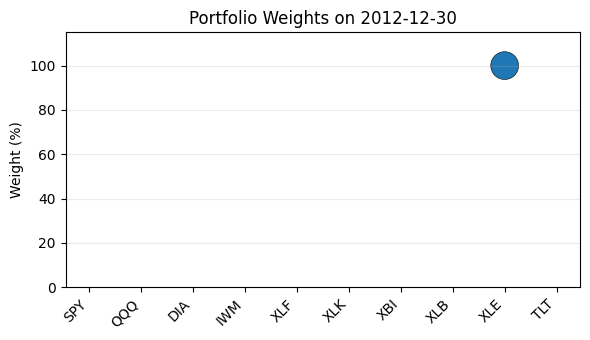


=== Rebalance on 2013-01-27 ===
Optimal portfolio
----------------------
 Investment in SPY : 0.0%
 Investment in QQQ : 0.0%
 Investment in DIA : 0.0%
 Investment in IWM : 0.0%
 Investment in XLF : 0.0%
 Investment in XLK : 100.0%
 Investment in XBI : 0.0%
 Investment in XLB : 0.0%
 Investment in XLE : 0.0%
 Investment in TLT : 0.0%
Cash: 2.229063158173878e-08
----------------------
Exp ret = 5.159910199315519%
Expected risk = 0.0033963116634502387%


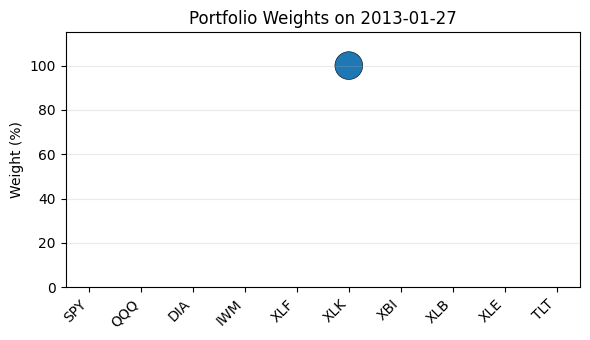


=== Rebalance on 2013-02-24 ===
Optimal portfolio
----------------------
 Investment in SPY : 0.0%
 Investment in QQQ : 100.0%
 Investment in DIA : 0.0%
 Investment in IWM : 0.0%
 Investment in XLF : 0.0%
 Investment in XLK : 0.0%
 Investment in XBI : 0.0%
 Investment in XLB : 0.0%
 Investment in XLE : 0.0%
 Investment in TLT : 0.0%
Cash: 2.9050189482303925e-08
----------------------
Exp ret = 4.182310154356249%
Expected risk = 0.0013996229610803883%


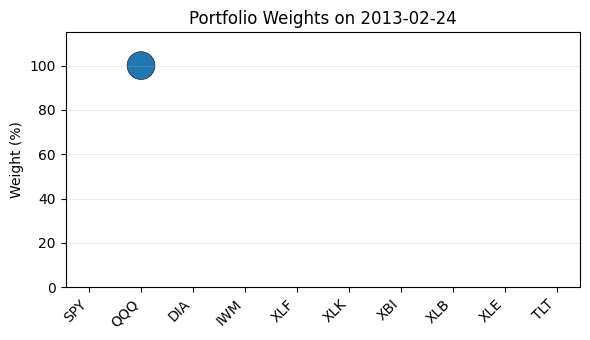


=== Rebalance on 2013-03-24 ===
Optimal portfolio
----------------------
 Investment in SPY : 100.0%
 Investment in QQQ : 0.0%
 Investment in DIA : 0.0%
 Investment in IWM : 0.0%
 Investment in XLF : 0.0%
 Investment in XLK : 0.0%
 Investment in XBI : 0.0%
 Investment in XLB : 0.0%
 Investment in XLE : 0.0%
 Investment in TLT : 0.0%
Cash: 6.791500658826595e-09
----------------------
Exp ret = 3.092278083162053%
Expected risk = 0.00022270131668622234%


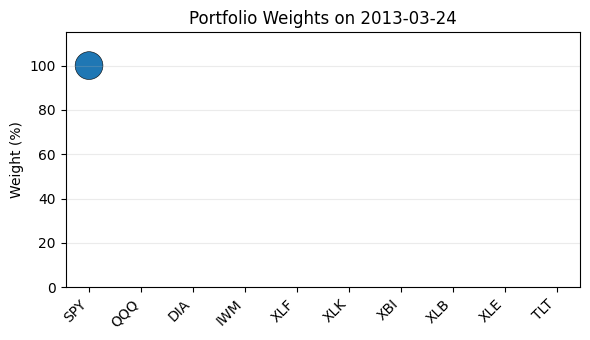


=== Rebalance on 2013-04-21 ===
Optimal portfolio
----------------------
 Investment in SPY : 0.0%
 Investment in QQQ : 0.0%
 Investment in DIA : 0.0%
 Investment in IWM : 0.0%
 Investment in XLF : 0.0%
 Investment in XLK : 100.0%
 Investment in XBI : 0.0%
 Investment in XLB : 0.0%
 Investment in XLE : 0.0%
 Investment in TLT : 0.0%
Cash: 1.185844517903479e-08
----------------------
Exp ret = 3.746668146991086%
Expected risk = 0.002566738174856089%


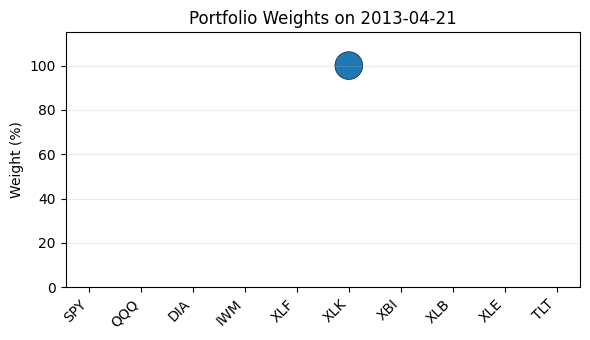


=== Rebalance on 2013-05-19 ===
Optimal portfolio
----------------------
 Investment in SPY : 0.0%
 Investment in QQQ : 0.0%
 Investment in DIA : 0.0%
 Investment in IWM : 0.0%
 Investment in XLF : 0.0%
 Investment in XLK : 100.0%
 Investment in XBI : 0.0%
 Investment in XLB : 0.0%
 Investment in XLE : 0.0%
 Investment in TLT : 0.0%
Cash: 1.7955707922088442e-09
----------------------
Exp ret = 5.618741424389345%
Expected risk = 0.002706687988840268%


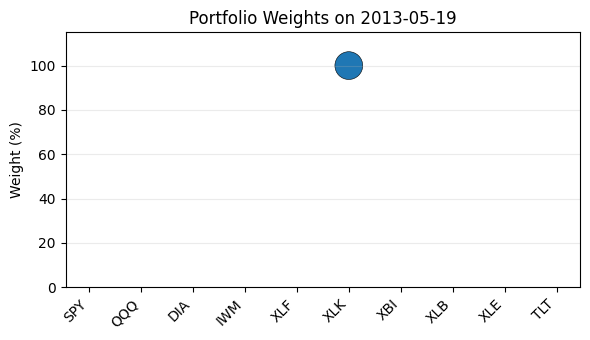


=== Rebalance on 2013-06-16 ===
Optimal portfolio
----------------------
 Investment in SPY : 0.0%
 Investment in QQQ : 0.0%
 Investment in DIA : 0.0%
 Investment in IWM : 0.0%
 Investment in XLF : 0.0%
 Investment in XLK : 0.0%
 Investment in XBI : 0.0%
 Investment in XLB : 0.0%
 Investment in XLE : 100.0%
 Investment in TLT : 0.0%
Cash: 5.2969337085612433e-08
----------------------
Exp ret = 2.6973473237239016%
Expected risk = 0.001680900259555265%


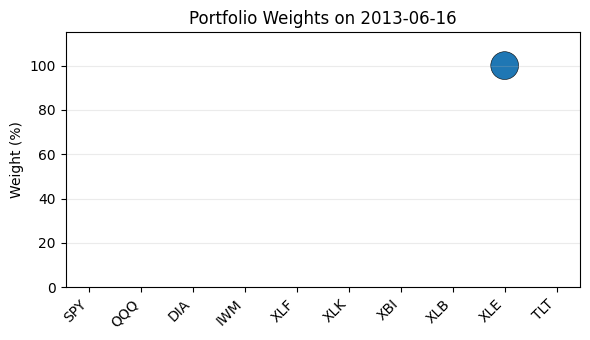


=== Rebalance on 2013-07-14 ===
Optimal portfolio
----------------------
 Investment in SPY : 0.0%
 Investment in QQQ : 0.0%
 Investment in DIA : 0.0%
 Investment in IWM : 0.0%
 Investment in XLF : 0.0%
 Investment in XLK : 100.0%
 Investment in XBI : 0.0%
 Investment in XLB : 0.0%
 Investment in XLE : 0.0%
 Investment in TLT : 0.0%
Cash: 3.131075828146008e-09
----------------------
Exp ret = 4.703507774102981%
Expected risk = 0.0056553487640461095%


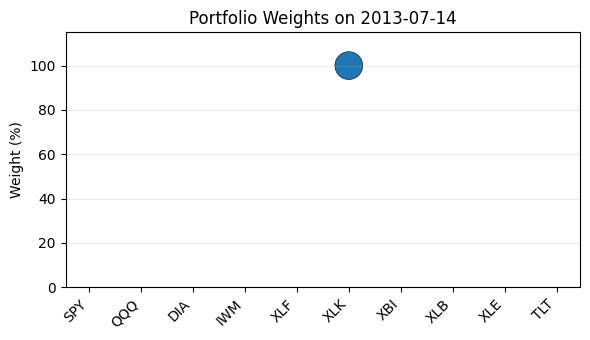


=== Rebalance on 2013-08-11 ===
Optimal portfolio
----------------------
 Investment in SPY : 0.0%
 Investment in QQQ : 0.0%
 Investment in DIA : 0.0%
 Investment in IWM : 0.0%
 Investment in XLF : 0.0%
 Investment in XLK : 100.0%
 Investment in XBI : 0.0%
 Investment in XLB : 0.0%
 Investment in XLE : 0.0%
 Investment in TLT : 0.0%
Cash: 1.0768658137911956e-09
----------------------
Exp ret = 3.4224928182486214%
Expected risk = 0.006444930541566563%


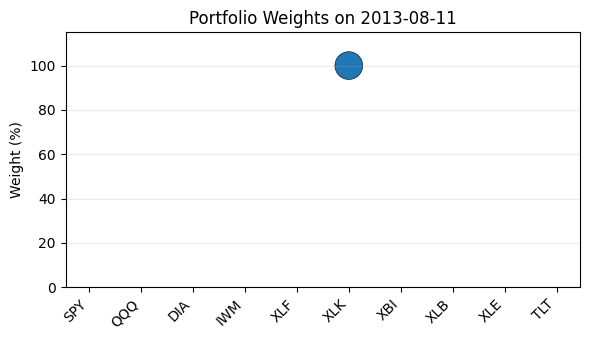


=== Rebalance on 2013-09-08 ===
Optimal portfolio
----------------------
 Investment in SPY : 0.0%
 Investment in QQQ : 0.0%
 Investment in DIA : 0.0%
 Investment in IWM : 0.0%
 Investment in XLF : 0.0%
 Investment in XLK : 100.0%
 Investment in XBI : 0.0%
 Investment in XLB : 0.0%
 Investment in XLE : 0.0%
 Investment in TLT : 0.0%
Cash: 5.956352120250997e-09
----------------------
Exp ret = 8.356008920252798%
Expected risk = 0.0069701451568837695%


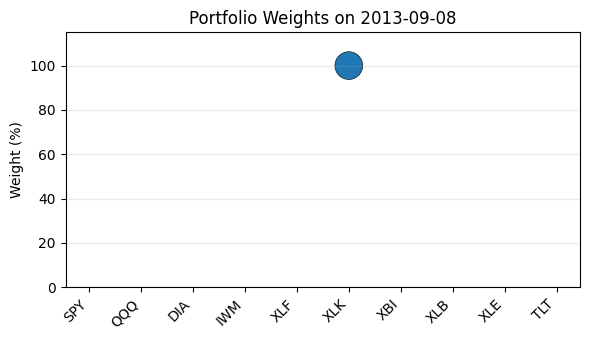


=== Rebalance on 2013-10-06 ===
Optimal portfolio
----------------------
 Investment in SPY : 0.0%
 Investment in QQQ : 0.0%
 Investment in DIA : 0.0%
 Investment in IWM : 0.0%
 Investment in XLF : 0.0%
 Investment in XLK : 100.0%
 Investment in XBI : 0.0%
 Investment in XLB : 0.0%
 Investment in XLE : 0.0%
 Investment in TLT : 0.0%
Cash: 2.1630249419385816e-09
----------------------
Exp ret = 3.303684984653073%
Expected risk = 0.003830445201206712%


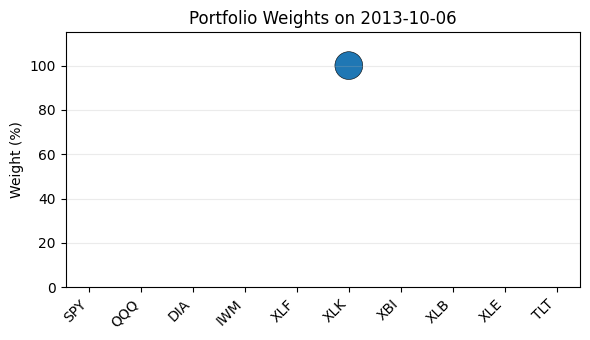


=== Rebalance on 2013-11-03 ===
Optimal portfolio
----------------------
 Investment in SPY : 0.0%
 Investment in QQQ : 0.0%
 Investment in DIA : 100.0%
 Investment in IWM : 0.0%
 Investment in XLF : 0.0%
 Investment in XLK : 0.0%
 Investment in XBI : 0.0%
 Investment in XLB : 0.0%
 Investment in XLE : 0.0%
 Investment in TLT : 0.0%
Cash: 2.787832182196386e-08
----------------------
Exp ret = 3.5780451374108297%
Expected risk = 0.0007783253185537274%


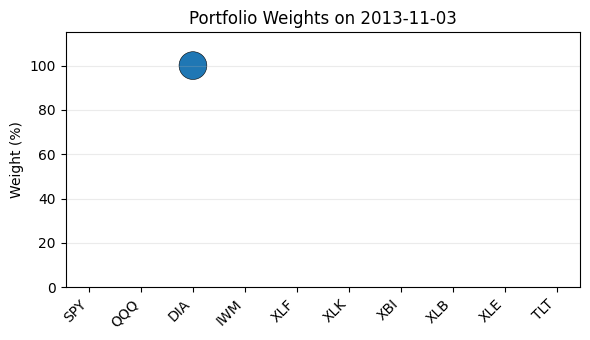


=== Rebalance on 2013-12-01 ===
Optimal portfolio
----------------------
 Investment in SPY : 0.0%
 Investment in QQQ : 0.0%
 Investment in DIA : 100.0%
 Investment in IWM : 0.0%
 Investment in XLF : 0.0%
 Investment in XLK : 0.0%
 Investment in XBI : 0.0%
 Investment in XLB : 0.0%
 Investment in XLE : 0.0%
 Investment in TLT : 0.0%
Cash: 1.8536339423996424e-09
----------------------
Exp ret = 3.6097245698616325%
Expected risk = 0.0006200814071696024%


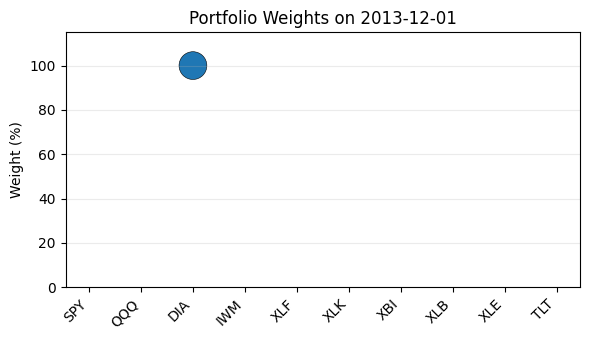


=== Rebalance on 2013-12-29 ===
Optimal portfolio
----------------------
 Investment in SPY : 0.0%
 Investment in QQQ : 0.0%
 Investment in DIA : 100.0%
 Investment in IWM : 0.0%
 Investment in XLF : 0.0%
 Investment in XLK : 0.0%
 Investment in XBI : 0.0%
 Investment in XLB : 0.0%
 Investment in XLE : 0.0%
 Investment in TLT : 0.0%
Cash: 3.382435849263667e-09
----------------------
Exp ret = 3.8448432598321958%
Expected risk = 0.0008376699224795414%


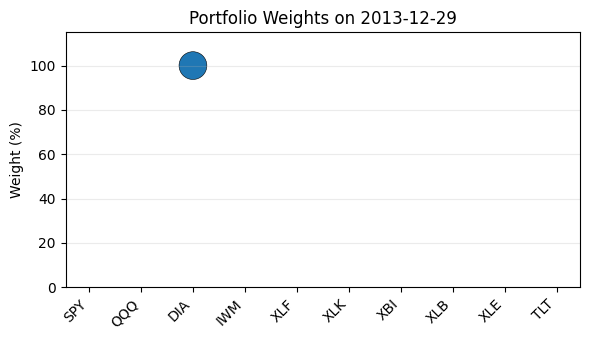


=== Rebalance on 2014-01-26 ===
Optimal portfolio
----------------------
 Investment in SPY : 0.0%
 Investment in QQQ : 0.0%
 Investment in DIA : 0.0%
 Investment in IWM : 0.0%
 Investment in XLF : 0.0%
 Investment in XLK : 100.0%
 Investment in XBI : 0.0%
 Investment in XLB : 0.0%
 Investment in XLE : 0.0%
 Investment in TLT : 0.0%
Cash: 1.111799491819185e-08
----------------------
Exp ret = 10.504230448594864%
Expected risk = 0.013654070911959663%


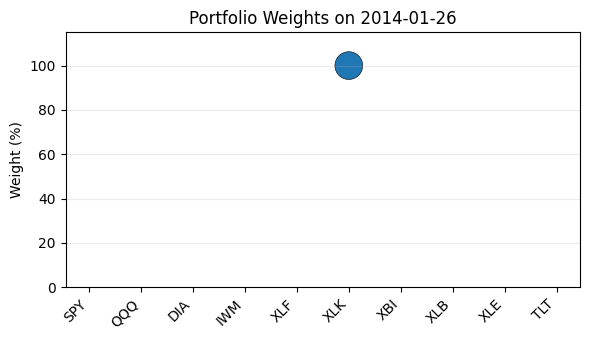


=== Rebalance on 2014-02-23 ===
Optimal portfolio
----------------------
 Investment in SPY : 0.0%
 Investment in QQQ : 0.0%
 Investment in DIA : 0.0%
 Investment in IWM : 0.0%
 Investment in XLF : 0.0%
 Investment in XLK : 100.0%
 Investment in XBI : 0.0%
 Investment in XLB : 0.0%
 Investment in XLE : 0.0%
 Investment in TLT : 0.0%
Cash: 3.794507325252135e-09
----------------------
Exp ret = 10.14684956092263%
Expected risk = 0.014790400312816983%


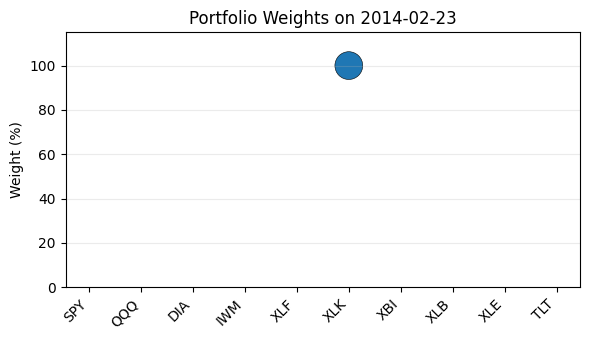


=== Rebalance on 2014-03-23 ===
Optimal portfolio
----------------------
 Investment in SPY : 0.0%
 Investment in QQQ : 0.0%
 Investment in DIA : 0.0%
 Investment in IWM : 0.0%
 Investment in XLF : 0.0%
 Investment in XLK : 100.0%
 Investment in XBI : 0.0%
 Investment in XLB : 0.0%
 Investment in XLE : 0.0%
 Investment in TLT : 0.0%
Cash: 7.136718280222101e-10
----------------------
Exp ret = 6.697460046620643%
Expected risk = 0.014679633738059491%


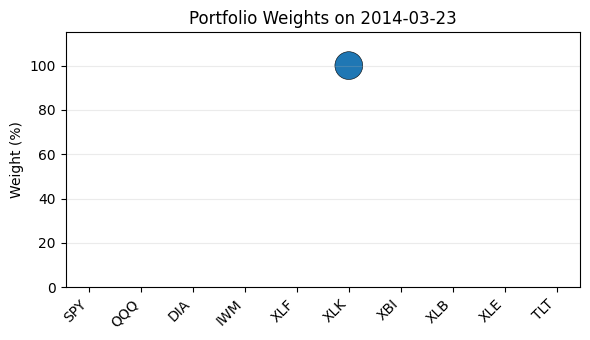


=== Rebalance on 2014-04-20 ===
Optimal portfolio
----------------------
 Investment in SPY : 0.0%
 Investment in QQQ : 0.0%
 Investment in DIA : 0.0%
 Investment in IWM : 0.0%
 Investment in XLF : 0.0%
 Investment in XLK : 0.0%
 Investment in XBI : 0.0%
 Investment in XLB : 100.0%
 Investment in XLE : 0.0%
 Investment in TLT : 0.0%
Cash: 2.855282779306229e-08
----------------------
Exp ret = 4.227775449717834%
Expected risk = 0.0016102420810350376%


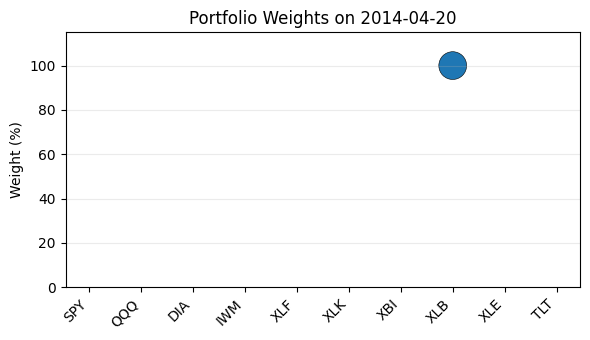


=== Rebalance on 2014-05-18 ===
Optimal portfolio
----------------------
 Investment in SPY : 0.0%
 Investment in QQQ : 0.0%
 Investment in DIA : 0.0%
 Investment in IWM : 0.0%
 Investment in XLF : 0.0%
 Investment in XLK : 0.0%
 Investment in XBI : 0.0%
 Investment in XLB : 100.0%
 Investment in XLE : 0.0%
 Investment in TLT : 0.0%
Cash: 2.594982631453168e-09
----------------------
Exp ret = 2.59484270969061%
Expected risk = 0.0015337508614084107%


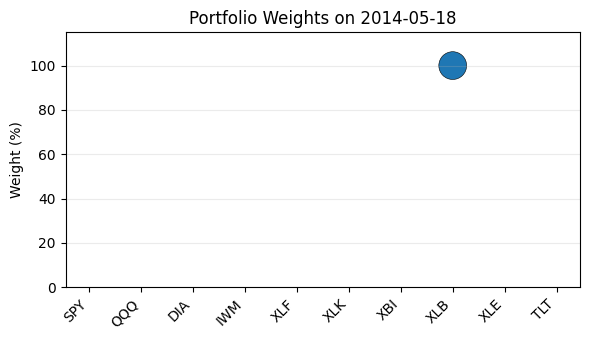


=== Rebalance on 2014-06-15 ===
Optimal portfolio
----------------------
 Investment in SPY : 0.0%
 Investment in QQQ : 0.0%
 Investment in DIA : 0.0%
 Investment in IWM : 0.0%
 Investment in XLF : 0.0%
 Investment in XLK : 0.0%
 Investment in XBI : 0.0%
 Investment in XLB : 100.0%
 Investment in XLE : 0.0%
 Investment in TLT : 0.0%
Cash: 3.833518812625105e-09
----------------------
Exp ret = 3.7566478830608707%
Expected risk = 0.0011599717340546045%


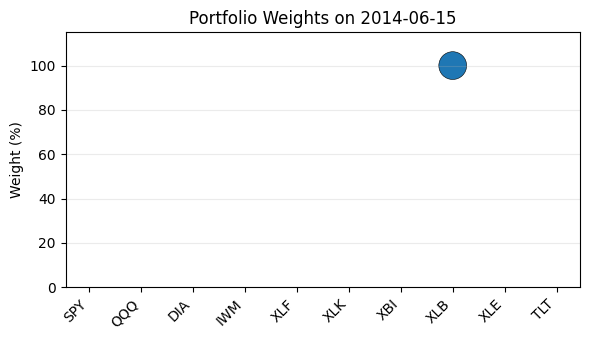


=== Rebalance on 2014-07-13 ===
Optimal portfolio
----------------------
 Investment in SPY : 0.0%
 Investment in QQQ : 0.0%
 Investment in DIA : 0.0%
 Investment in IWM : 0.0%
 Investment in XLF : 0.0%
 Investment in XLK : 100.0%
 Investment in XBI : 0.0%
 Investment in XLB : 0.0%
 Investment in XLE : 0.0%
 Investment in TLT : 0.0%
Cash: 9.686721717294371e-09
----------------------
Exp ret = 6.734946890400035%
Expected risk = 0.006230322523834437%


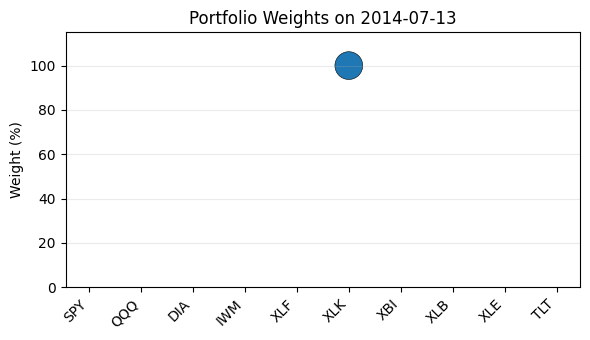


=== Rebalance on 2014-08-10 ===
Optimal portfolio
----------------------
 Investment in SPY : 0.0%
 Investment in QQQ : 0.0%
 Investment in DIA : 0.0%
 Investment in IWM : 0.0%
 Investment in XLF : 0.0%
 Investment in XLK : 100.0%
 Investment in XBI : 0.0%
 Investment in XLB : 0.0%
 Investment in XLE : 0.0%
 Investment in TLT : 0.0%
Cash: 8.418242474901092e-10
----------------------
Exp ret = 6.059649134301076%
Expected risk = 0.00823676570987011%


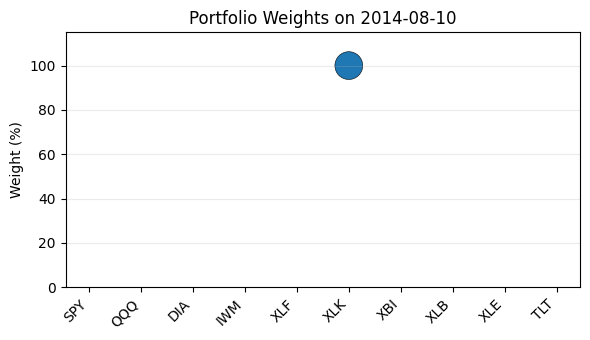


=== Rebalance on 2014-09-07 ===
Optimal portfolio
----------------------
 Investment in SPY : 0.0%
 Investment in QQQ : 0.0%
 Investment in DIA : 100.0%
 Investment in IWM : 0.0%
 Investment in XLF : 0.0%
 Investment in XLK : 0.0%
 Investment in XBI : 0.0%
 Investment in XLB : 0.0%
 Investment in XLE : 0.0%
 Investment in TLT : 0.0%
Cash: 1.0879280361004942e-08
----------------------
Exp ret = 2.860524781981249%
Expected risk = 0.0007161919129097879%


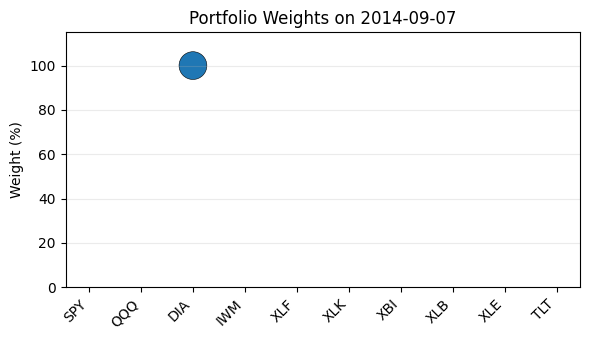


=== Rebalance on 2014-10-05 ===
Optimal portfolio
----------------------
 Investment in SPY : 0.0%
 Investment in QQQ : 0.0%
 Investment in DIA : 0.0%
 Investment in IWM : 0.0%
 Investment in XLF : 0.0%
 Investment in XLK : 100.0%
 Investment in XBI : 0.0%
 Investment in XLB : 0.0%
 Investment in XLE : 0.0%
 Investment in TLT : 0.0%
Cash: 2.8673668957848374e-08
----------------------
Exp ret = 5.120681203850974%
Expected risk = 0.0034169122857997435%


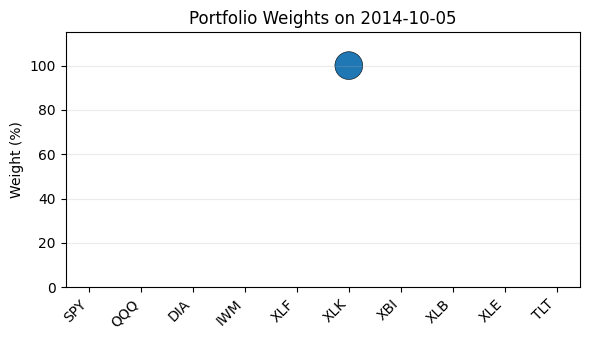


=== Rebalance on 2014-11-02 ===
Optimal portfolio
----------------------
 Investment in SPY : 0.0%
 Investment in QQQ : 0.0%
 Investment in DIA : 0.0%
 Investment in IWM : 0.0%
 Investment in XLF : 0.0%
 Investment in XLK : 100.0%
 Investment in XBI : 0.0%
 Investment in XLB : 0.0%
 Investment in XLE : 0.0%
 Investment in TLT : 0.0%
Cash: 1.4525629791677867e-09
----------------------
Exp ret = 4.161233119115761%
Expected risk = 0.00818139993548552%


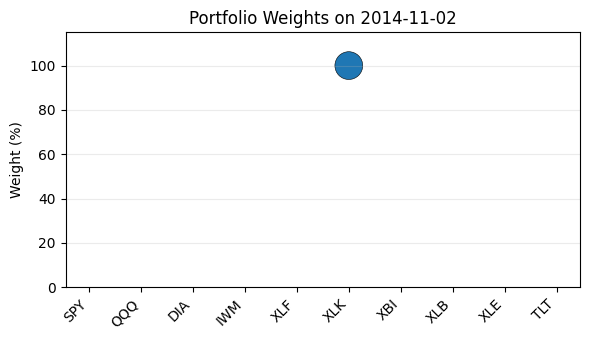


=== Rebalance on 2014-11-30 ===
Optimal portfolio
----------------------
 Investment in SPY : 0.0%
 Investment in QQQ : 0.0%
 Investment in DIA : 0.0%
 Investment in IWM : 0.0%
 Investment in XLF : 0.0%
 Investment in XLK : 100.0%
 Investment in XBI : 0.0%
 Investment in XLB : 0.0%
 Investment in XLE : 0.0%
 Investment in TLT : 0.0%
Cash: 2.8941102724377226e-09
----------------------
Exp ret = 4.706463933235016%
Expected risk = 0.007673466044792067%


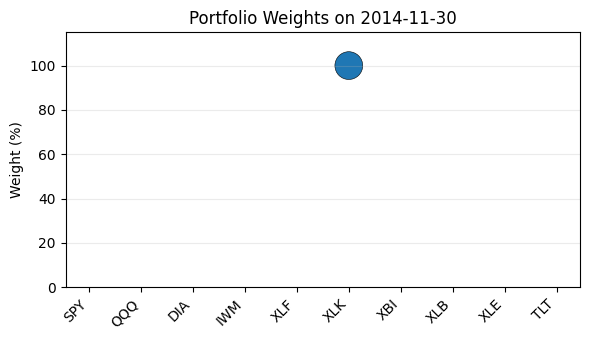


=== Rebalance on 2014-12-28 ===
Optimal portfolio
----------------------
 Investment in SPY : 0.0%
 Investment in QQQ : 0.0%
 Investment in DIA : 0.0%
 Investment in IWM : 0.0%
 Investment in XLF : 0.0%
 Investment in XLK : 100.0%
 Investment in XBI : 0.0%
 Investment in XLB : 0.0%
 Investment in XLE : 0.0%
 Investment in TLT : 0.0%
Cash: 8.35072411336411e-10
----------------------
Exp ret = 9.565075212888615%
Expected risk = 0.004095907630762182%


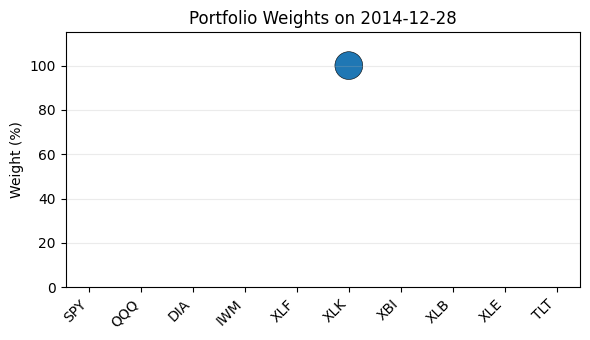


=== Rebalance on 2015-01-25 ===
Optimal portfolio
----------------------
 Investment in SPY : 0.0%
 Investment in QQQ : 0.0%
 Investment in DIA : 0.0%
 Investment in IWM : 0.0%
 Investment in XLF : 0.0%
 Investment in XLK : 100.0%
 Investment in XBI : 0.0%
 Investment in XLB : 0.0%
 Investment in XLE : 0.0%
 Investment in TLT : 0.0%
Cash: 5.02434423081923e-10
----------------------
Exp ret = 6.5045267868212076%
Expected risk = 0.0014456139152923414%


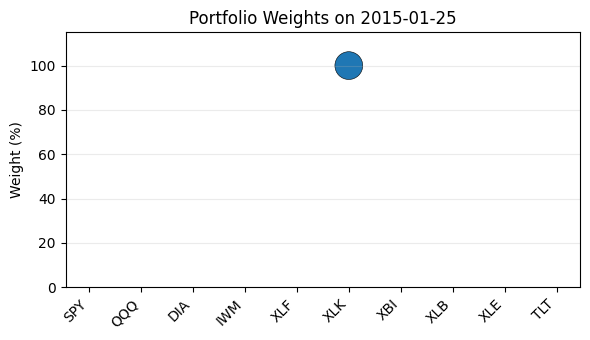


=== Rebalance on 2015-02-22 ===
Optimal portfolio
----------------------
 Investment in SPY : 0.0%
 Investment in QQQ : 0.0%
 Investment in DIA : 0.0%
 Investment in IWM : 0.0%
 Investment in XLF : 0.0%
 Investment in XLK : 100.0%
 Investment in XBI : 0.0%
 Investment in XLB : 0.0%
 Investment in XLE : 0.0%
 Investment in TLT : 0.0%
Cash: 9.930711411971678e-10
----------------------
Exp ret = 6.3236641710309875%
Expected risk = 0.002539576022202055%


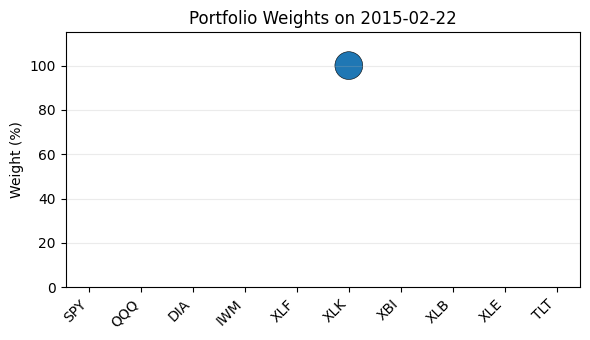


=== Rebalance on 2015-03-22 ===
Optimal portfolio
----------------------
 Investment in SPY : 0.0%
 Investment in QQQ : 0.0%
 Investment in DIA : 0.0%
 Investment in IWM : 0.0%
 Investment in XLF : 0.0%
 Investment in XLK : 100.0%
 Investment in XBI : 0.0%
 Investment in XLB : 0.0%
 Investment in XLE : 0.0%
 Investment in TLT : 0.0%
Cash: 3.828059229968427e-09
----------------------
Exp ret = 8.284891006132693%
Expected risk = 0.0023777861934723647%


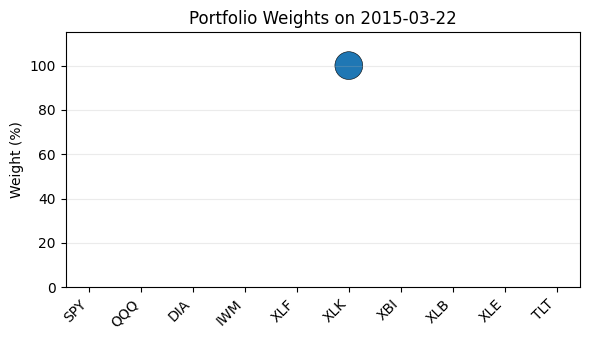


=== Rebalance on 2015-04-19 ===
Optimal portfolio
----------------------
 Investment in SPY : 0.0%
 Investment in QQQ : 0.0%
 Investment in DIA : 0.0%
 Investment in IWM : 0.0%
 Investment in XLF : 0.0%
 Investment in XLK : 100.0%
 Investment in XBI : 0.0%
 Investment in XLB : 0.0%
 Investment in XLE : 0.0%
 Investment in TLT : 0.0%
Cash: 1.477353800245411e-09
----------------------
Exp ret = 5.6885823727309734%
Expected risk = 0.00506410258662715%


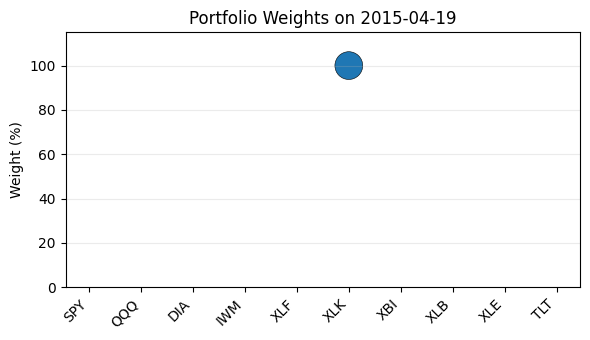


=== Rebalance on 2015-05-17 ===
Optimal portfolio
----------------------
 Investment in SPY : 0.0%
 Investment in QQQ : 0.0%
 Investment in DIA : 0.0%
 Investment in IWM : 0.0%
 Investment in XLF : 0.0%
 Investment in XLK : 100.0%
 Investment in XBI : 0.0%
 Investment in XLB : 0.0%
 Investment in XLE : 0.0%
 Investment in TLT : 0.0%
Cash: 8.314126947516188e-09
----------------------
Exp ret = 2.382298589755833%
Expected risk = 0.008241682744107257%


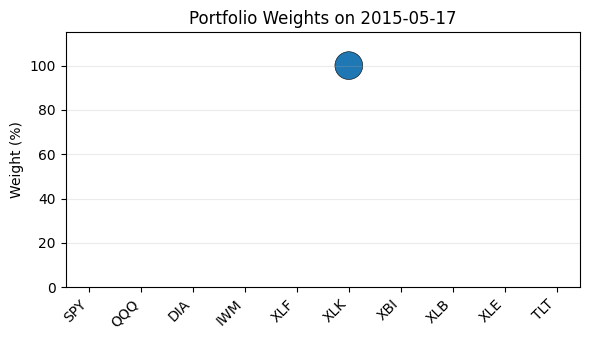


=== Rebalance on 2015-06-14 ===
Optimal portfolio
----------------------
 Investment in SPY : 0.0%
 Investment in QQQ : 0.0%
 Investment in DIA : 0.0%
 Investment in IWM : 0.0%
 Investment in XLF : 0.0%
 Investment in XLK : 100.0%
 Investment in XBI : 0.0%
 Investment in XLB : 0.0%
 Investment in XLE : 0.0%
 Investment in TLT : 0.0%
Cash: 2.512450220493527e-09
----------------------
Exp ret = 3.6164377015399034%
Expected risk = 0.006231493171662089%


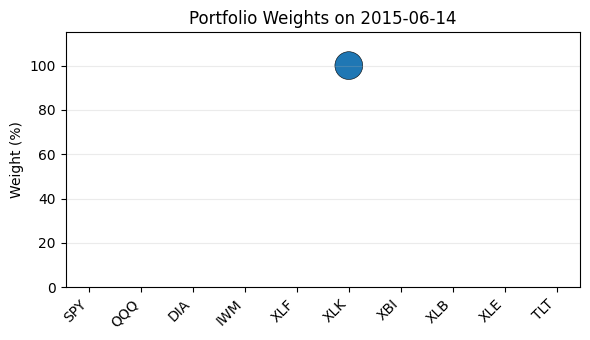


=== Rebalance on 2015-07-12 ===
Optimal portfolio
----------------------
 Investment in SPY : 0.0%
 Investment in QQQ : 0.0%
 Investment in DIA : 0.0%
 Investment in IWM : 0.0%
 Investment in XLF : 0.0%
 Investment in XLK : 100.0%
 Investment in XBI : 0.0%
 Investment in XLB : 0.0%
 Investment in XLE : 0.0%
 Investment in TLT : 0.0%
Cash: 6.930312258866317e-09
----------------------
Exp ret = 3.2340434712069794%
Expected risk = 0.006856594993439761%


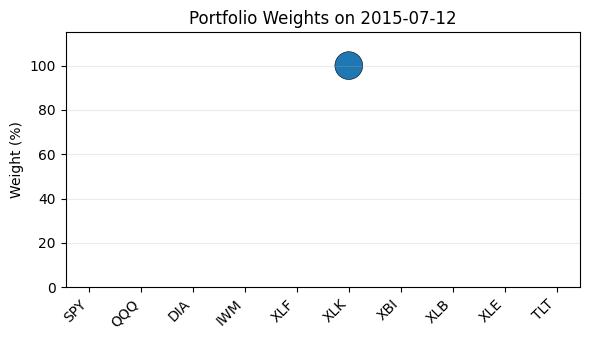


=== Rebalance on 2015-08-09 ===
Optimal portfolio
----------------------
 Investment in SPY : 0.0%
 Investment in QQQ : 0.0%
 Investment in DIA : 0.0%
 Investment in IWM : 0.0%
 Investment in XLF : 100.0%
 Investment in XLK : 0.0%
 Investment in XBI : 0.0%
 Investment in XLB : 0.0%
 Investment in XLE : 0.0%
 Investment in TLT : 0.0%
Cash: 6.438838657169265e-09
----------------------
Exp ret = 1.4315873784906255%
Expected risk = 0.0018997506813428937%


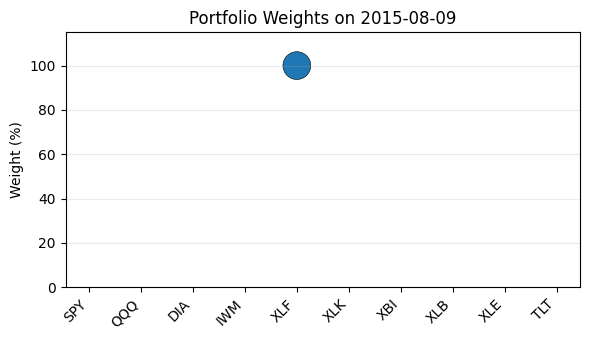


=== Rebalance on 2015-09-06 ===
Optimal portfolio
----------------------
 Investment in SPY : 0.0%
 Investment in QQQ : 0.0%
 Investment in DIA : 0.0%
 Investment in IWM : 0.0%
 Investment in XLF : 100.0%
 Investment in XLK : 0.0%
 Investment in XBI : 0.0%
 Investment in XLB : 0.0%
 Investment in XLE : 0.0%
 Investment in TLT : 0.0%
Cash: 1.4485450570021834e-09
----------------------
Exp ret = 1.3267022003765587%
Expected risk = 0.0015546064758937311%


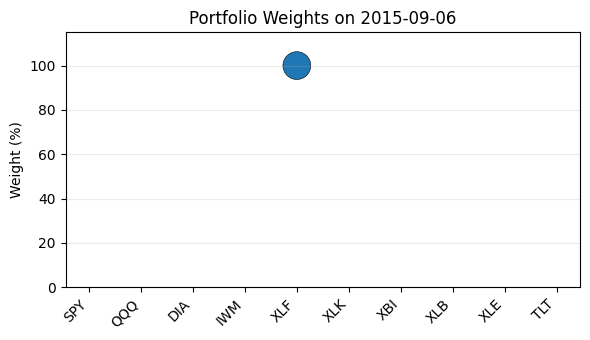


=== Rebalance on 2015-10-04 ===
Optimal portfolio
----------------------
 Investment in SPY : 0.0%
 Investment in QQQ : 0.0%
 Investment in DIA : 0.0%
 Investment in IWM : 0.0%
 Investment in XLF : 100.0%
 Investment in XLK : 0.0%
 Investment in XBI : 0.0%
 Investment in XLB : 0.0%
 Investment in XLE : 0.0%
 Investment in TLT : 0.0%
Cash: 3.421726009495518e-08
----------------------
Exp ret = 1.9780200715614749%
Expected risk = 0.0011314978251050025%


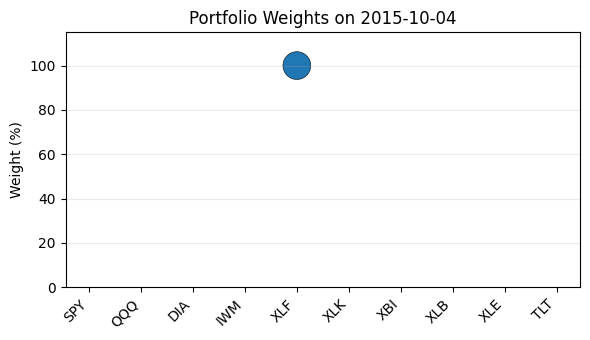


=== Rebalance on 2015-11-01 ===
Optimal portfolio
----------------------
 Investment in SPY : 0.0%
 Investment in QQQ : 0.0%
 Investment in DIA : 0.0%
 Investment in IWM : 0.0%
 Investment in XLF : 0.0%
 Investment in XLK : 0.0%
 Investment in XBI : 0.0%
 Investment in XLB : 0.0%
 Investment in XLE : 0.0%
 Investment in TLT : 100.0%
Cash: 2.7440904568550798e-08
----------------------
Exp ret = 1.427338877272366%
Expected risk = 0.004417850194935703%


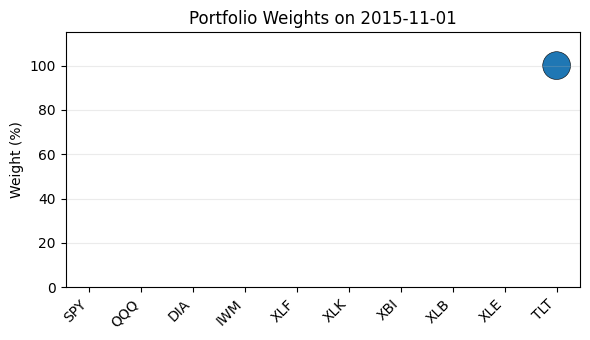


=== Rebalance on 2015-11-29 ===
Optimal portfolio
----------------------
 Investment in SPY : 0.0%
 Investment in QQQ : 0.0%
 Investment in DIA : 0.0%
 Investment in IWM : 0.0%
 Investment in XLF : 0.0%
 Investment in XLK : 0.0%
 Investment in XBI : 0.0%
 Investment in XLB : 0.0%
 Investment in XLE : 0.0%
 Investment in TLT : 100.0%
Cash: 2.761422094325465e-08
----------------------
Exp ret = 3.3299383131358384%
Expected risk = 0.002919615684298022%


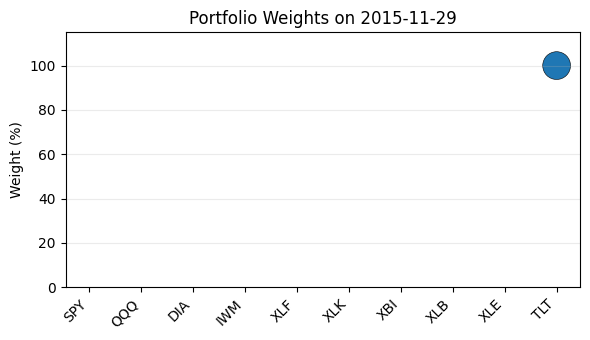


=== Rebalance on 2015-12-27 ===
Optimal portfolio
----------------------
 Investment in SPY : 0.0%
 Investment in QQQ : 0.0%
 Investment in DIA : 0.0%
 Investment in IWM : 0.0%
 Investment in XLF : 0.0%
 Investment in XLK : 100.0%
 Investment in XBI : 0.0%
 Investment in XLB : 0.0%
 Investment in XLE : 0.0%
 Investment in TLT : 0.0%
Cash: 4.999479128993787e-08
----------------------
Exp ret = 3.7442288722300168%
Expected risk = 0.006770497022535127%


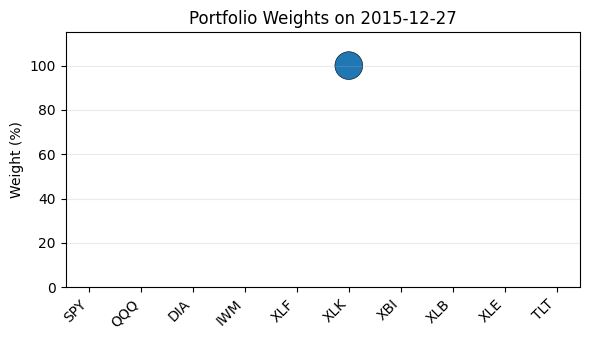


=== Rebalance on 2016-01-24 ===
Optimal portfolio
----------------------
 Investment in SPY : 0.0%
 Investment in QQQ : 0.0%
 Investment in DIA : 0.0%
 Investment in IWM : 0.0%
 Investment in XLF : 100.0%
 Investment in XLK : 0.0%
 Investment in XBI : 0.0%
 Investment in XLB : 0.0%
 Investment in XLE : 0.0%
 Investment in TLT : 0.0%
Cash: 2.4038520269654e-08
----------------------
Exp ret = 2.1778631011923824%
Expected risk = 0.0007229191150784184%


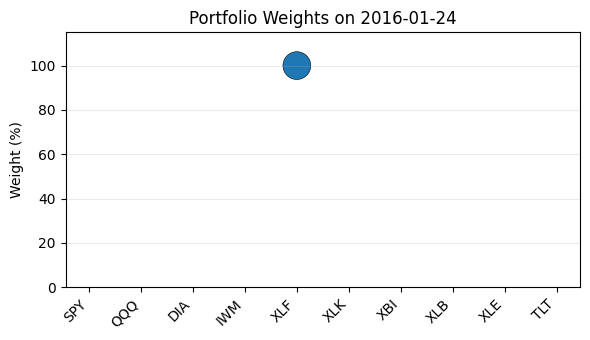


=== Rebalance on 2016-02-21 ===
Optimal portfolio
----------------------
 Investment in SPY : 0.0%
 Investment in QQQ : 0.0%
 Investment in DIA : 0.0%
 Investment in IWM : 0.0%
 Investment in XLF : 100.0%
 Investment in XLK : 0.0%
 Investment in XBI : 0.0%
 Investment in XLB : 0.0%
 Investment in XLE : 0.0%
 Investment in TLT : 0.0%
Cash: 8.422467975282235e-09
----------------------
Exp ret = 3.335348946692999%
Expected risk = 0.0008994837381636484%


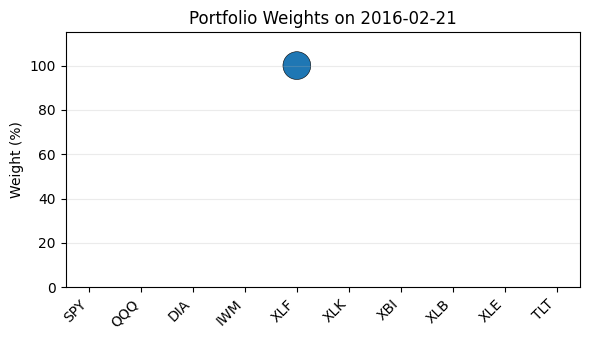


=== Rebalance on 2016-03-20 ===
Optimal portfolio
----------------------
 Investment in SPY : 0.0%
 Investment in QQQ : 0.0%
 Investment in DIA : 0.0%
 Investment in IWM : 0.0%
 Investment in XLF : 100.0%
 Investment in XLK : 0.0%
 Investment in XBI : 0.0%
 Investment in XLB : 0.0%
 Investment in XLE : 0.0%
 Investment in TLT : 0.0%
Cash: 9.291572750171673e-10
----------------------
Exp ret = 2.680585721410109%
Expected risk = 0.0007603325010900036%


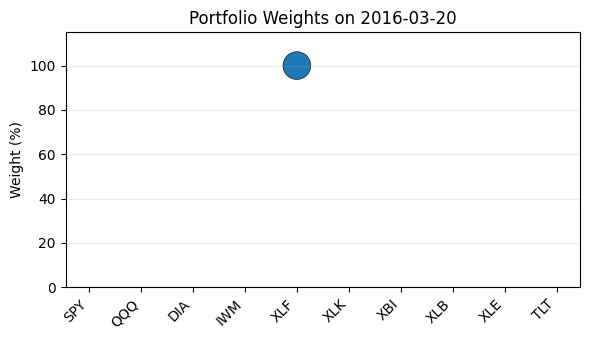


=== Rebalance on 2016-04-17 ===
Optimal portfolio
----------------------
 Investment in SPY : 0.0%
 Investment in QQQ : 0.0%
 Investment in DIA : 0.0%
 Investment in IWM : 0.0%
 Investment in XLF : 0.0%
 Investment in XLK : 0.0%
 Investment in XBI : 100.0%
 Investment in XLB : 0.0%
 Investment in XLE : 0.0%
 Investment in TLT : 0.0%
Cash: 3.385644490478528e-09
----------------------
Exp ret = 6.680318155638979%
Expected risk = 0.0022544601781235673%


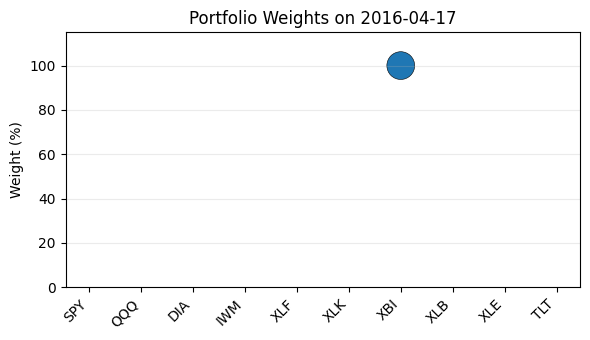


=== Rebalance on 2016-05-15 ===
Optimal portfolio
----------------------
 Investment in SPY : 0.0%
 Investment in QQQ : 0.0%
 Investment in DIA : 0.0%
 Investment in IWM : 0.0%
 Investment in XLF : 0.0%
 Investment in XLK : 0.0%
 Investment in XBI : 0.0%
 Investment in XLB : 100.0%
 Investment in XLE : 0.0%
 Investment in TLT : 0.0%
Cash: 5.215345774503766e-09
----------------------
Exp ret = 5.184048312565028%
Expected risk = 0.0038040840771143155%


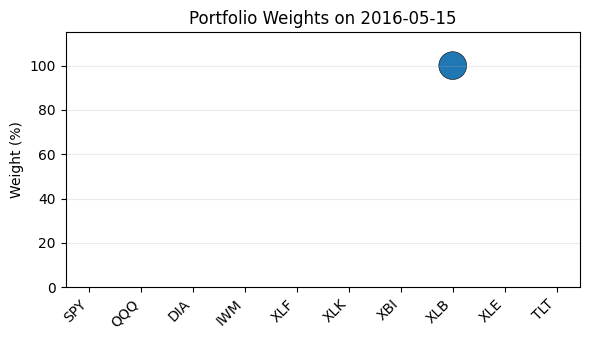


=== Rebalance on 2016-06-12 ===
Optimal portfolio
----------------------
 Investment in SPY : 0.0%
 Investment in QQQ : 0.0%
 Investment in DIA : 0.0%
 Investment in IWM : 0.0%
 Investment in XLF : 0.0%
 Investment in XLK : 100.0%
 Investment in XBI : 0.0%
 Investment in XLB : 0.0%
 Investment in XLE : 0.0%
 Investment in TLT : 0.0%
Cash: 1.0518990335281331e-08
----------------------
Exp ret = 4.466188409547843%
Expected risk = 0.010957964250068354%


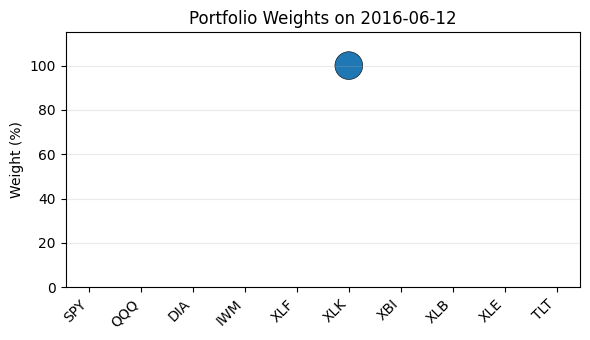


=== Rebalance on 2016-07-10 ===
Optimal portfolio
----------------------
 Investment in SPY : 0.0%
 Investment in QQQ : 0.0%
 Investment in DIA : 0.0%
 Investment in IWM : 0.0%
 Investment in XLF : 100.0%
 Investment in XLK : 0.0%
 Investment in XBI : 0.0%
 Investment in XLB : 0.0%
 Investment in XLE : 0.0%
 Investment in TLT : 0.0%
Cash: 1.1792750791648318e-08
----------------------
Exp ret = 4.429881808134793%
Expected risk = 0.0008768400351177875%


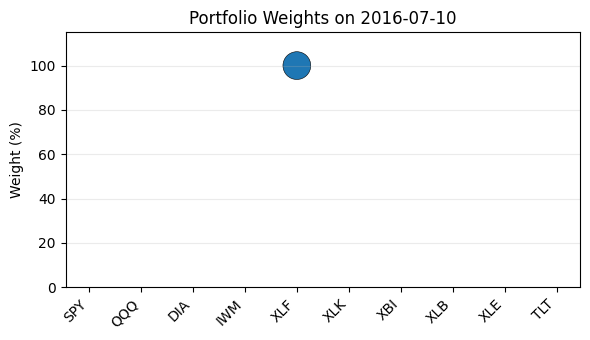


=== Rebalance on 2016-08-07 ===
Optimal portfolio
----------------------
 Investment in SPY : 0.0%
 Investment in QQQ : 0.0%
 Investment in DIA : 0.0%
 Investment in IWM : 0.0%
 Investment in XLF : 0.0%
 Investment in XLK : 100.0%
 Investment in XBI : 0.0%
 Investment in XLB : 0.0%
 Investment in XLE : 0.0%
 Investment in TLT : 0.0%
Cash: 2.3798733564997993e-08
----------------------
Exp ret = 6.7956992550106285%
Expected risk = 0.007142092187858095%


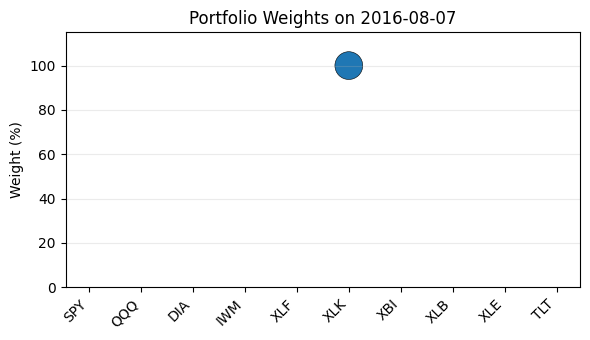


=== Rebalance on 2016-09-04 ===
Optimal portfolio
----------------------
 Investment in SPY : 0.0%
 Investment in QQQ : 0.0%
 Investment in DIA : 0.0%
 Investment in IWM : 0.0%
 Investment in XLF : 0.0%
 Investment in XLK : 100.0%
 Investment in XBI : 0.0%
 Investment in XLB : 0.0%
 Investment in XLE : 0.0%
 Investment in TLT : 0.0%
Cash: 6.8304289603389115e-09
----------------------
Exp ret = 4.719846758777399%
Expected risk = 0.005111497061490022%


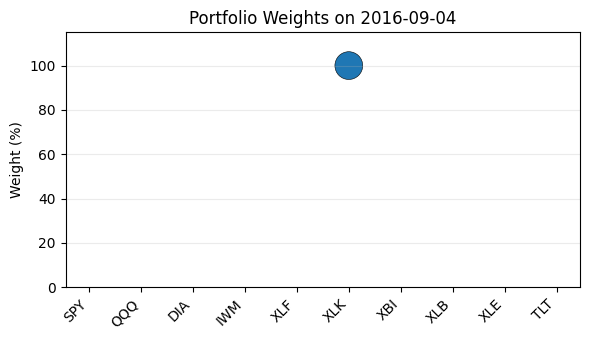


=== Rebalance on 2016-10-02 ===
Optimal portfolio
----------------------
 Investment in SPY : 0.0%
 Investment in QQQ : 0.0%
 Investment in DIA : 0.0%
 Investment in IWM : 0.0%
 Investment in XLF : 0.0%
 Investment in XLK : 100.0%
 Investment in XBI : 0.0%
 Investment in XLB : 0.0%
 Investment in XLE : 0.0%
 Investment in TLT : 0.0%
Cash: 9.474936862114698e-09
----------------------
Exp ret = 5.799044745212285%
Expected risk = 0.004759228099544357%


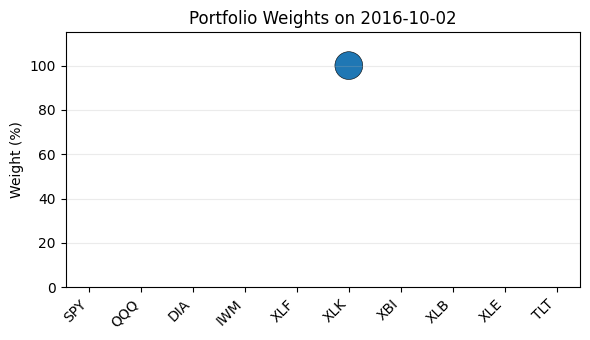


=== Rebalance on 2016-10-30 ===
Optimal portfolio
----------------------
 Investment in SPY : 0.0%
 Investment in QQQ : 0.0%
 Investment in DIA : 0.0%
 Investment in IWM : 0.0%
 Investment in XLF : 0.0%
 Investment in XLK : 0.0%
 Investment in XBI : 0.0%
 Investment in XLB : 0.0%
 Investment in XLE : 100.0%
 Investment in TLT : 0.0%
Cash: 4.418658321378168e-08
----------------------
Exp ret = 0.9359831133275607%
Expected risk = 0.0007870893666906616%


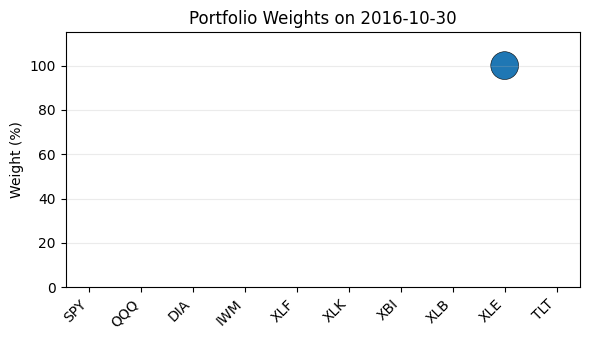


=== Rebalance on 2016-11-27 ===
Optimal portfolio
----------------------
 Investment in SPY : 0.0%
 Investment in QQQ : 0.0%
 Investment in DIA : 0.0%
 Investment in IWM : 0.0%
 Investment in XLF : 0.0%
 Investment in XLK : 0.0%
 Investment in XBI : 0.0%
 Investment in XLB : 0.0%
 Investment in XLE : 100.0%
 Investment in TLT : 0.0%
Cash: 4.881645809744765e-09
----------------------
Exp ret = 5.552791650390921%
Expected risk = 0.0050582107724219455%


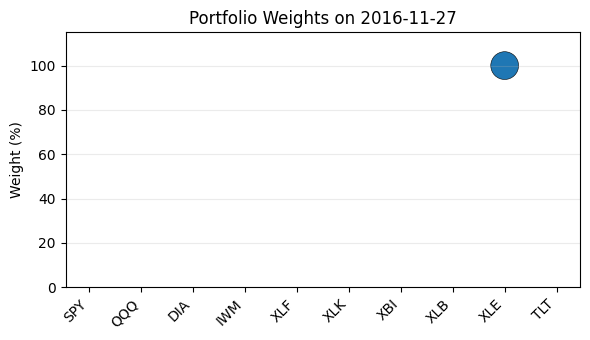


=== Performance 2012 ===
Average Monthly Return   : -0.69%
Monthly Sharpe Ratio     : -0.154
Annualized Sharpe Ratio  : -0.534
Maximum Drawdown         : 11.28%

=== Performance 2013 ===
Average Monthly Return   : 3.17%
Monthly Sharpe Ratio     : 0.533
Annualized Sharpe Ratio  : 1.847
Maximum Drawdown         : 3.79%

=== Performance 2014 ===
Average Monthly Return   : 1.01%
Monthly Sharpe Ratio     : 0.199
Annualized Sharpe Ratio  : 0.688
Maximum Drawdown         : 14.82%

=== Performance 2015 ===
Average Monthly Return   : 0.02%
Monthly Sharpe Ratio     : 0.004
Annualized Sharpe Ratio  : 0.014
Maximum Drawdown         : 19.75%

=== Performance 2016 ===
Average Monthly Return   : 3.54%
Monthly Sharpe Ratio     : 0.445
Annualized Sharpe Ratio  : 1.542
Maximum Drawdown         : 11.40%


In [20]:
if __name__ == "__main__":
    # --- choose a date range and parameters ---
    start_date     = "2012-01-01"
    end_date       = "2016-12-31"
    rebalance_wks  = 4     # hold for one month
    lookback_wks   = 12    # use trailing 3 months to estimate μ, Σ

    # --- pull weekly close prices ---
    test_px = yf.download(etfs, start=start_date, end=end_date, interval="1wk")["Close"].dropna()

    # --- initialise equal-weight portfolio ---
    w_prev = np.ones(len(etfs)) / len(etfs)
    c_prev = 0.0
    dates  = test_px.index

    monthly_returns  = []
    rebalance_dates  = []

    for i in range(lookback_wks, len(dates) - rebalance_wks, rebalance_wks):
        # Build estimation window
        win_prices = test_px.iloc[i-lookback_wks : i]
        mu_hat, cov_hat = project_returns(win_prices, horizon_wks=rebalance_wks)

        # Optimize via Markowitz
        data_i = Data(
            w_prev      = w_prev,
            mean        = mu_hat,
            risk_free   = 0.0,
            cov         = cov_hat,
            kappa_short = np.zeros(len(etfs)),
            kappa_borrow= 0.0,
            kappa_spread= np.zeros(len(etfs)),
            kappa_impact= np.zeros(len(etfs))
        )
        w_opt, c_opt, exp_ret, exp_risk = markowitz(data_i, params)

        print(f"\n=== Rebalance on {dates[i].date()} ===")
        print_results(etfs, w_opt, c_opt, exp_ret, exp_risk)

        plot_weight_scatter(dates[i].date(), etfs, w_opt)

        # Realised performance while holding the *previous* weights
        hold_slice    = test_px.iloc[i : i+rebalance_wks]
        realised_hold = calc_portfolio_returns(hold_slice, w_prev, c_prev)
        realised_ret  = (1 + realised_hold).prod() - 1

        # record
        monthly_returns.append(realised_ret)
        rebalance_dates.append(dates[i])

        # roll portfolio forward
        w_prev, c_prev = w_opt, c_opt

    # --- now print per-year performance ---
    df = pd.DataFrame({
        "date": rebalance_dates,
        "return": monthly_returns
    })
    df["year"] = df["date"].dt.year

    for year, grp in df.groupby("year"):
        m         = grp["return"].mean()
        s         = grp["return"].std()
        sr_month  = m / s if s > 1e-8 else 0
        sr_annual = sr_month * np.sqrt(12)
        mdd_year  = max_drawdown(grp["return"].values)

        print(f"\n=== Performance {year} ===")
        print(f"Average Monthly Return   : {m:.2%}")
        print(f"Monthly Sharpe Ratio     : {sr_month:.3f}")
        print(f"Annualized Sharpe Ratio  : {sr_annual:.3f}")
        print(f"Maximum Drawdown         : {mdd_year:.2%}")

[*********************100%***********************]  10 of 10 completed



=== Rebalance on 2007-03-26 ===
Optimal portfolio
----------------------
 Investment in SPY : 0.0%
 Investment in QQQ : 0.0%
 Investment in DIA : 0.0%
 Investment in IWM : 0.0%
 Investment in XLF : 0.0%
 Investment in XLK : 0.0%
 Investment in XBI : 100.0%
 Investment in XLB : 0.0%
 Investment in XLE : 0.0%
 Investment in TLT : 0.0%
Cash: 2.1311345523873643e-10
----------------------
Exp ret = 4.269627831611484%
Expected risk = 0.0024905245489322265%


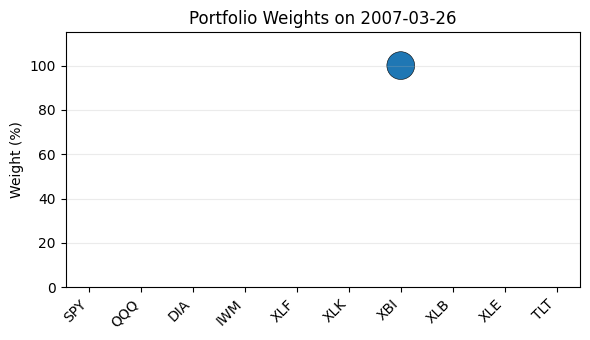


=== Rebalance on 2007-04-23 ===
Optimal portfolio
----------------------
 Investment in SPY : 0.0%
 Investment in QQQ : 0.0%
 Investment in DIA : 0.0%
 Investment in IWM : 0.0%
 Investment in XLF : 0.0%
 Investment in XLK : 100.0%
 Investment in XBI : 0.0%
 Investment in XLB : 0.0%
 Investment in XLE : 0.0%
 Investment in TLT : 0.0%
Cash: 6.799609375613118e-10
----------------------
Exp ret = 3.2466910023348694%
Expected risk = 0.005030945869479328%


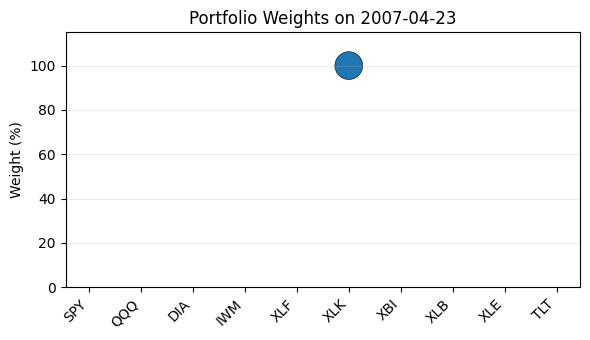


=== Rebalance on 2007-05-21 ===
Optimal portfolio
----------------------
 Investment in SPY : 0.0%
 Investment in QQQ : 0.0%
 Investment in DIA : 0.0%
 Investment in IWM : 0.0%
 Investment in XLF : 0.0%
 Investment in XLK : 0.0%
 Investment in XBI : 0.0%
 Investment in XLB : 100.0%
 Investment in XLE : 0.0%
 Investment in TLT : 0.0%
Cash: 1.6052774444514542e-08
----------------------
Exp ret = 7.422136281448043%
Expected risk = 0.002397105855025272%


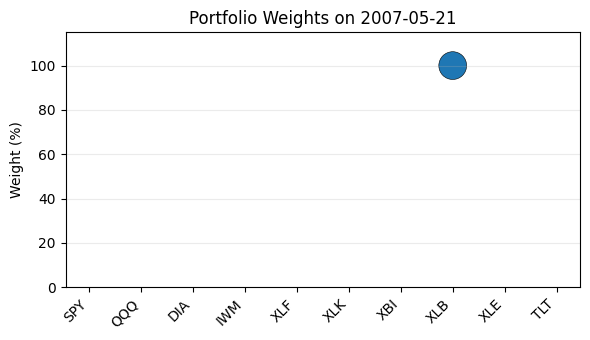


=== Rebalance on 2007-06-18 ===
Optimal portfolio
----------------------
 Investment in SPY : 0.0%
 Investment in QQQ : 0.0%
 Investment in DIA : 0.0%
 Investment in IWM : 0.0%
 Investment in XLF : 0.0%
 Investment in XLK : 0.0%
 Investment in XBI : 0.0%
 Investment in XLB : 100.0%
 Investment in XLE : 0.0%
 Investment in TLT : 0.0%
Cash: 3.133057738891358e-10
----------------------
Exp ret = 6.185930638381128%
Expected risk = 0.0013628130830732274%


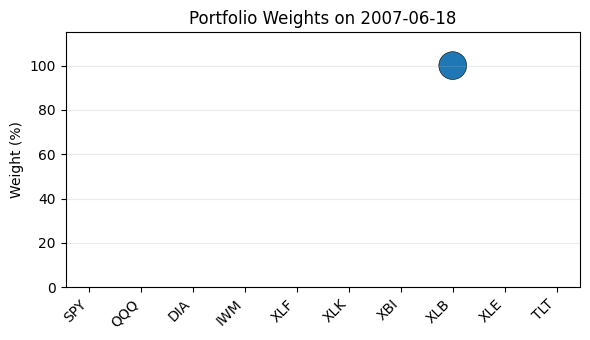


=== Rebalance on 2007-07-16 ===
Optimal portfolio
----------------------
 Investment in SPY : 0.0%
 Investment in QQQ : 0.0%
 Investment in DIA : 0.0%
 Investment in IWM : 0.0%
 Investment in XLF : 0.0%
 Investment in XLK : 0.0%
 Investment in XBI : 0.0%
 Investment in XLB : 100.0%
 Investment in XLE : 0.0%
 Investment in TLT : 0.0%
Cash: 3.5542567993772733e-10
----------------------
Exp ret = 5.534056078094213%
Expected risk = 0.0022279539885862944%


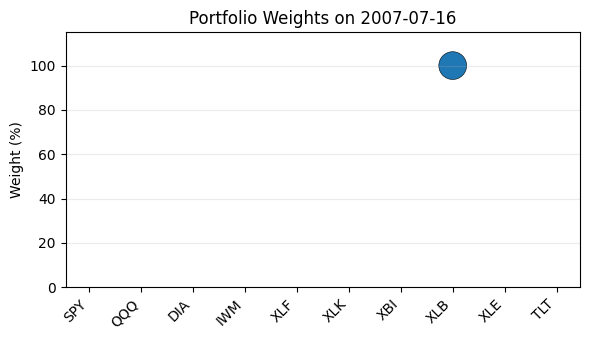


=== Rebalance on 2007-08-13 ===
Optimal portfolio
----------------------
 Investment in SPY : 0.0%
 Investment in QQQ : 0.0%
 Investment in DIA : 100.0%
 Investment in IWM : 0.0%
 Investment in XLF : 0.0%
 Investment in XLK : 0.0%
 Investment in XBI : 0.0%
 Investment in XLB : 0.0%
 Investment in XLE : 0.0%
 Investment in TLT : 0.0%
Cash: 1.140119766562563e-07
----------------------
Exp ret = 0.7561159358763268%
Expected risk = 0.001642345575524472%


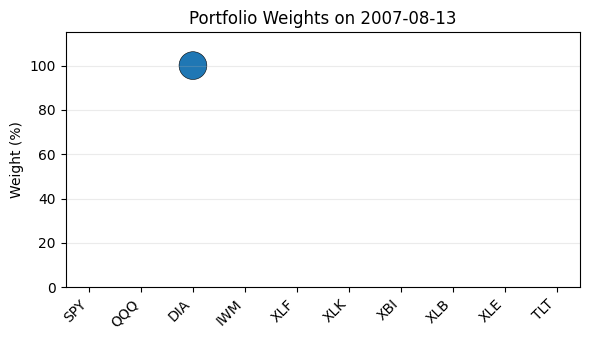


=== Rebalance on 2007-09-10 ===
Optimal portfolio
----------------------
 Investment in SPY : 0.0%
 Investment in QQQ : 0.0%
 Investment in DIA : 0.0%
 Investment in IWM : 0.0%
 Investment in XLF : 0.0%
 Investment in XLK : 100.0%
 Investment in XBI : 0.0%
 Investment in XLB : 0.0%
 Investment in XLE : 0.0%
 Investment in TLT : 0.0%
Cash: 1.2244380990567513e-08
----------------------
Exp ret = 4.293536179903758%
Expected risk = 0.0015527549401777665%


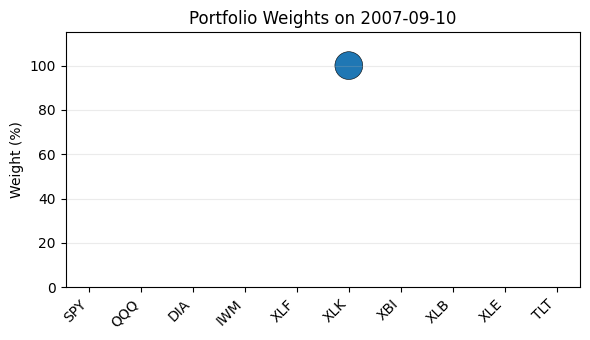


=== Rebalance on 2007-10-08 ===
Optimal portfolio
----------------------
 Investment in SPY : 0.0%
 Investment in QQQ : 0.0%
 Investment in DIA : 0.0%
 Investment in IWM : 0.0%
 Investment in XLF : 0.0%
 Investment in XLK : 100.0%
 Investment in XBI : 0.0%
 Investment in XLB : 0.0%
 Investment in XLE : 0.0%
 Investment in TLT : 0.0%
Cash: 6.908826126937283e-09
----------------------
Exp ret = 5.54115832810943%
Expected risk = 0.0012981837082550588%


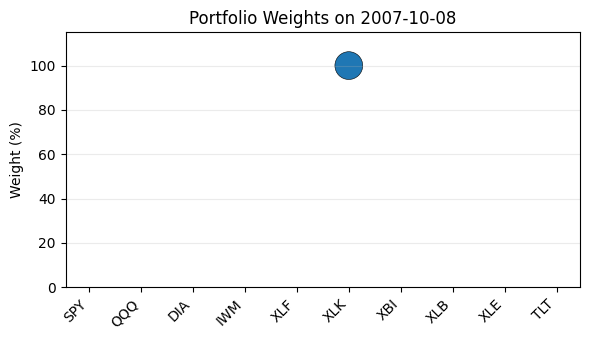


=== Rebalance on 2007-11-05 ===
Optimal portfolio
----------------------
 Investment in SPY : 0.0%
 Investment in QQQ : 0.0%
 Investment in DIA : 100.0%
 Investment in IWM : 0.0%
 Investment in XLF : 0.0%
 Investment in XLK : 0.0%
 Investment in XBI : 0.0%
 Investment in XLB : 0.0%
 Investment in XLE : 0.0%
 Investment in TLT : 0.0%
Cash: 3.6312416078569197e-09
----------------------
Exp ret = 6.130963191960272%
Expected risk = 0.0014277060873870804%


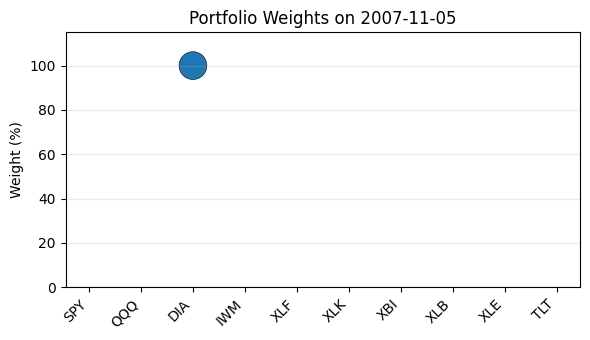


=== Rebalance on 2007-12-03 ===
Optimal portfolio
----------------------
 Investment in SPY : 0.0%
 Investment in QQQ : 0.0%
 Investment in DIA : 0.0%
 Investment in IWM : 0.0%
 Investment in XLF : 0.0%
 Investment in XLK : 100.0%
 Investment in XBI : 0.0%
 Investment in XLB : 0.0%
 Investment in XLE : 0.0%
 Investment in TLT : 0.0%
Cash: 6.30541813861879e-08
----------------------
Exp ret = 2.7861822482039003%
Expected risk = 0.002450664240573286%


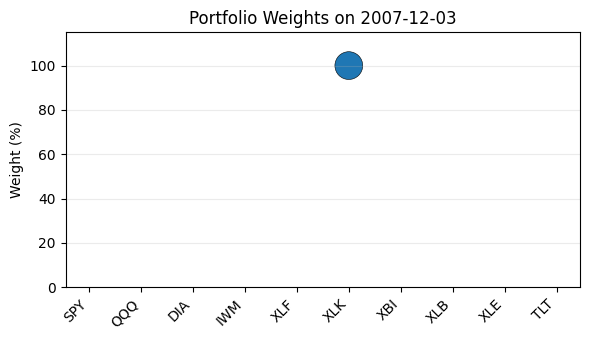


=== Rebalance on 2007-12-31 ===
Optimal portfolio
----------------------
 Investment in SPY : 0.0%
 Investment in QQQ : 0.0%
 Investment in DIA : 0.0%
 Investment in IWM : 0.0%
 Investment in XLF : 100.0%
 Investment in XLK : 0.0%
 Investment in XBI : 0.0%
 Investment in XLB : 0.0%
 Investment in XLE : 0.0%
 Investment in TLT : 0.0%
Cash: 2.162463988113043e-08
----------------------
Exp ret = 2.3348442626063894%
Expected risk = 0.0009311148374945275%


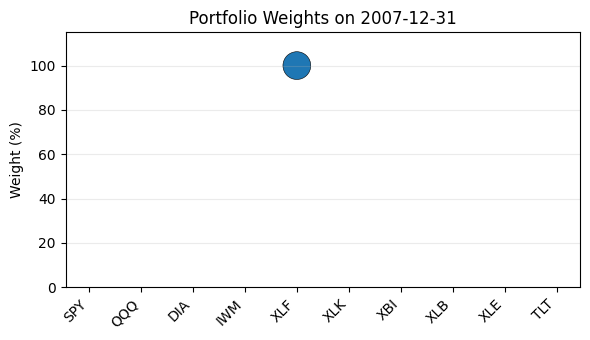


=== Rebalance on 2008-01-28 ===
Optimal portfolio
----------------------
 Investment in SPY : 0.0%
 Investment in QQQ : 0.0%
 Investment in DIA : 0.0%
 Investment in IWM : 0.0%
 Investment in XLF : 100.0%
 Investment in XLK : 0.0%
 Investment in XBI : 0.0%
 Investment in XLB : 0.0%
 Investment in XLE : 0.0%
 Investment in TLT : 0.0%
Cash: 1.0643356966368076e-08
----------------------
Exp ret = 2.1465486015716855%
Expected risk = 0.0008008012874350579%


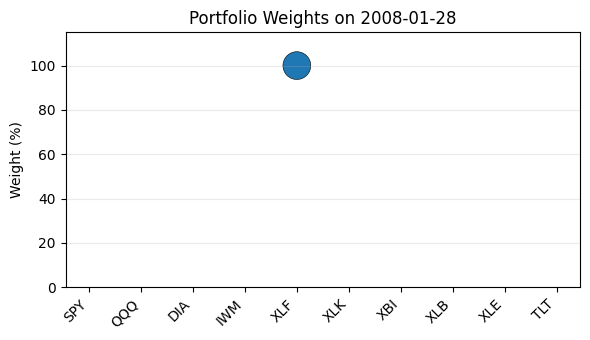


=== Rebalance on 2008-02-25 ===
Optimal portfolio
----------------------
 Investment in SPY : 0.0%
 Investment in QQQ : 0.0%
 Investment in DIA : 0.0%
 Investment in IWM : 0.0%
 Investment in XLF : 100.0%
 Investment in XLK : 0.0%
 Investment in XBI : 0.0%
 Investment in XLB : 0.0%
 Investment in XLE : 0.0%
 Investment in TLT : 0.0%
Cash: 9.091049707345564e-08
----------------------
Exp ret = 0.5579301467429812%
Expected risk = 0.0006546633923296363%


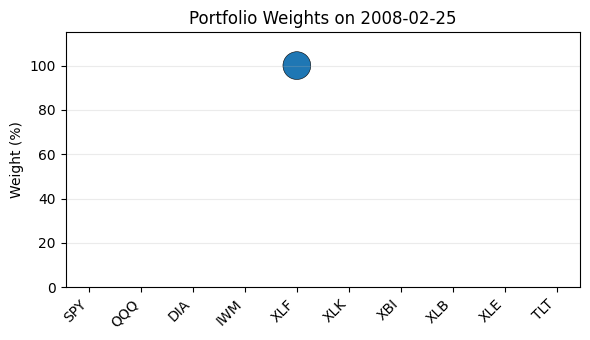


=== Rebalance on 2008-03-24 ===
Optimal portfolio
----------------------
 Investment in SPY : 0.0%
 Investment in QQQ : 0.0%
 Investment in DIA : 0.0%
 Investment in IWM : 0.0%
 Investment in XLF : 100.0%
 Investment in XLK : 0.0%
 Investment in XBI : 0.0%
 Investment in XLB : 0.0%
 Investment in XLE : 0.0%
 Investment in TLT : 0.0%
Cash: 2.2285780346167474e-08
----------------------
Exp ret = 1.4431937838614046%
Expected risk = 0.001372756523905915%


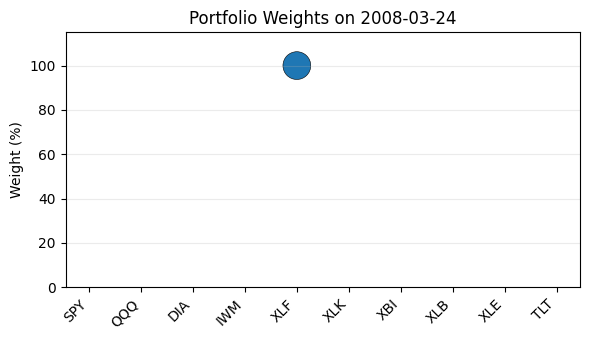


=== Rebalance on 2008-04-21 ===
Optimal portfolio
----------------------
 Investment in SPY : 0.0%
 Investment in QQQ : 0.0%
 Investment in DIA : 0.0%
 Investment in IWM : 0.0%
 Investment in XLF : 0.0%
 Investment in XLK : 0.0%
 Investment in XBI : 0.0%
 Investment in XLB : 100.0%
 Investment in XLE : 0.0%
 Investment in TLT : 0.0%
Cash: 3.693091412762716e-09
----------------------
Exp ret = 6.352499388544679%
Expected risk = 0.006738535321950209%


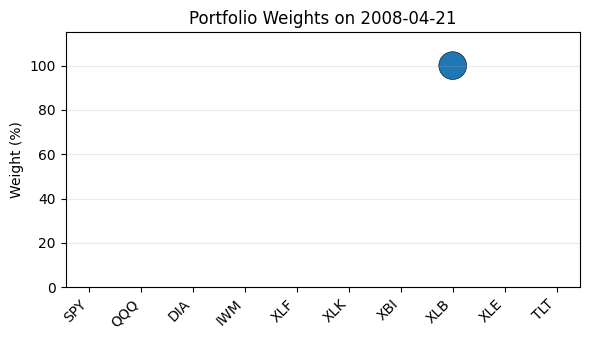


=== Rebalance on 2008-05-19 ===
Optimal portfolio
----------------------
 Investment in SPY : 0.0%
 Investment in QQQ : 0.0%
 Investment in DIA : 0.0%
 Investment in IWM : 0.0%
 Investment in XLF : 0.0%
 Investment in XLK : 0.0%
 Investment in XBI : 0.0%
 Investment in XLB : 100.0%
 Investment in XLE : 0.0%
 Investment in TLT : 0.0%
Cash: 5.00433533851068e-10
----------------------
Exp ret = 6.312076200466123%
Expected risk = 0.007227594749595201%


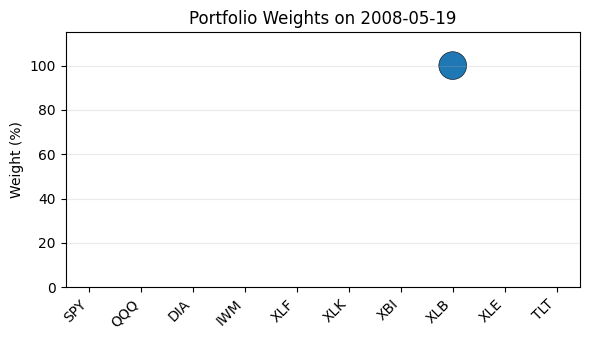


=== Rebalance on 2008-06-16 ===
Optimal portfolio
----------------------
 Investment in SPY : 0.0%
 Investment in QQQ : 0.0%
 Investment in DIA : 0.0%
 Investment in IWM : 0.0%
 Investment in XLF : 0.0%
 Investment in XLK : 0.0%
 Investment in XBI : 0.0%
 Investment in XLB : 100.0%
 Investment in XLE : 0.0%
 Investment in TLT : 0.0%
Cash: 2.8765307432715204e-10
----------------------
Exp ret = 6.436179056353557%
Expected risk = 0.0050836814099321555%


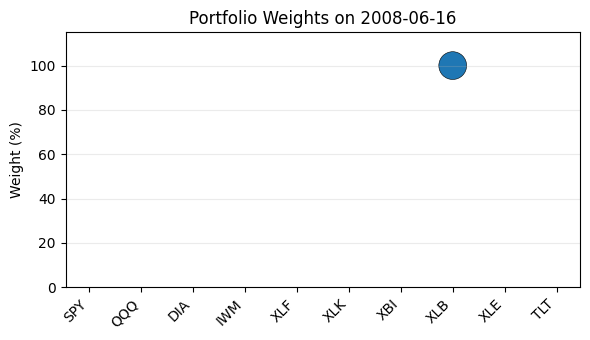


=== Rebalance on 2008-07-14 ===
Optimal portfolio
----------------------
 Investment in SPY : 0.0%
 Investment in QQQ : 0.0%
 Investment in DIA : 0.0%
 Investment in IWM : 0.0%
 Investment in XLF : 0.0%
 Investment in XLK : 100.0%
 Investment in XBI : 0.0%
 Investment in XLB : 0.0%
 Investment in XLE : 0.0%
 Investment in TLT : 0.0%
Cash: 8.989451291730611e-08
----------------------
Exp ret = 3.3213600132979235%
Expected risk = 0.002069297788629949%


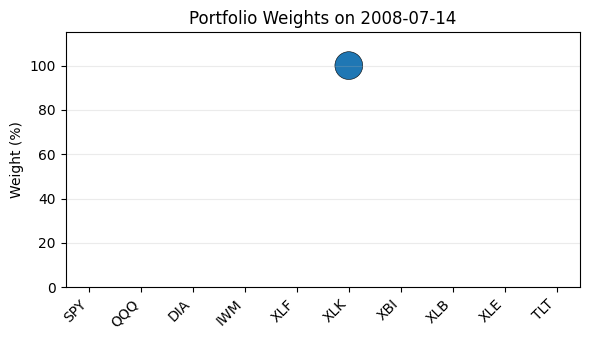


=== Rebalance on 2008-08-11 ===
Optimal portfolio
----------------------
 Investment in SPY : 0.0%
 Investment in QQQ : 0.0%
 Investment in DIA : 0.0%
 Investment in IWM : 0.0%
 Investment in XLF : 0.0%
 Investment in XLK : 100.0%
 Investment in XBI : 0.0%
 Investment in XLB : 0.0%
 Investment in XLE : 0.0%
 Investment in TLT : 0.0%
Cash: 4.136914436517672e-09
----------------------
Exp ret = 6.477639062031572%
Expected risk = 0.0026039477254742108%


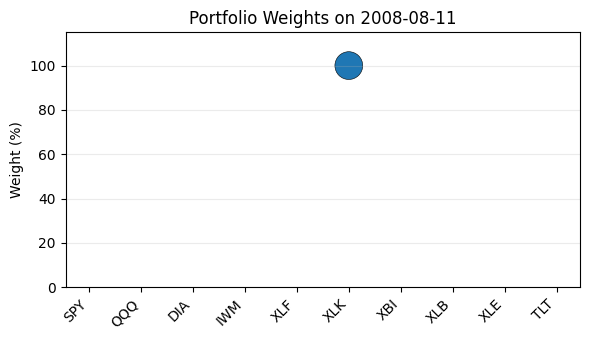


=== Rebalance on 2008-09-08 ===
Optimal portfolio
----------------------
 Investment in SPY : 0.0%
 Investment in QQQ : 0.0%
 Investment in DIA : 0.0%
 Investment in IWM : 0.0%
 Investment in XLF : 0.0%
 Investment in XLK : 100.0%
 Investment in XBI : 0.0%
 Investment in XLB : 0.0%
 Investment in XLE : 0.0%
 Investment in TLT : 0.0%
Cash: 3.3632264222182504e-08
----------------------
Exp ret = 3.141478204047991%
Expected risk = 0.004181405431055881%


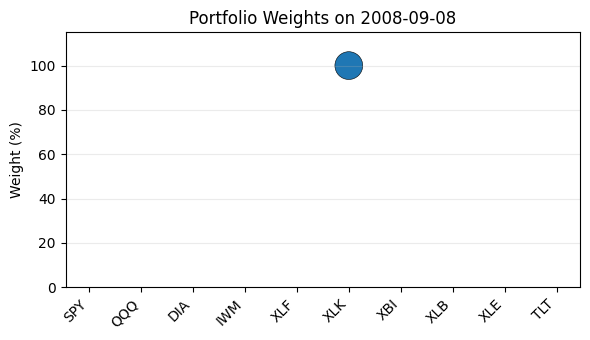


=== Rebalance on 2008-10-06 ===
Optimal portfolio
----------------------
 Investment in SPY : 0.0%
 Investment in QQQ : 0.0%
 Investment in DIA : 0.0%
 Investment in IWM : 0.0%
 Investment in XLF : 100.0%
 Investment in XLK : 0.0%
 Investment in XBI : 0.0%
 Investment in XLB : 0.0%
 Investment in XLE : 0.0%
 Investment in TLT : 0.0%
Cash: 3.663446791711462e-09
----------------------
Exp ret = 3.026217881728982%
Expected risk = 0.000539819569370236%


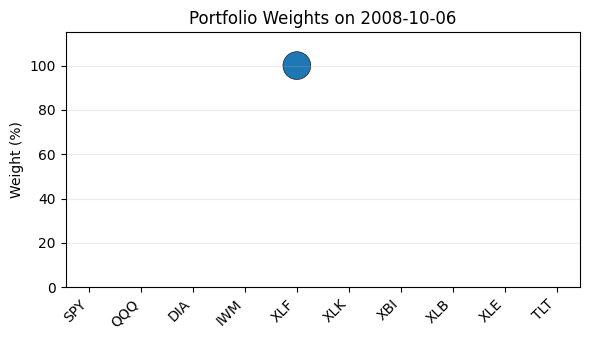


=== Rebalance on 2008-11-03 ===
Optimal portfolio
----------------------
 Investment in SPY : 0.0%
 Investment in QQQ : 0.0%
 Investment in DIA : 0.0%
 Investment in IWM : 0.0%
 Investment in XLF : 100.0%
 Investment in XLK : 0.0%
 Investment in XBI : 0.0%
 Investment in XLB : 0.0%
 Investment in XLE : 0.0%
 Investment in TLT : 0.0%
Cash: 2.084366188478318e-07
----------------------
Exp ret = 0.2541696709875248%
Expected risk = 0.0018659093963931412%


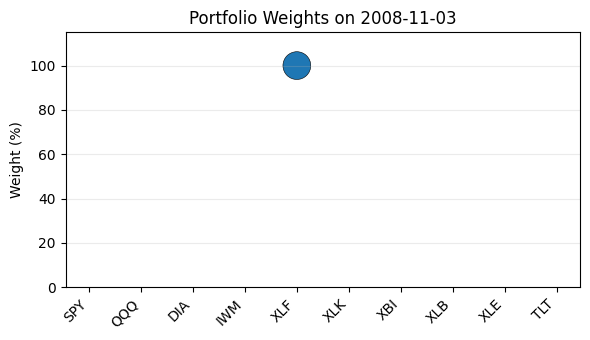


=== Rebalance on 2008-12-01 ===
Optimal portfolio
----------------------
 Investment in SPY : 0.0%
 Investment in QQQ : 0.0%
 Investment in DIA : 0.0%
 Investment in IWM : 0.0%
 Investment in XLF : 100.0%
 Investment in XLK : 0.0%
 Investment in XBI : 0.0%
 Investment in XLB : 0.0%
 Investment in XLE : 0.0%
 Investment in TLT : 0.0%
Cash: 1.345912494016766e-08
----------------------
Exp ret = 4.471313242886274%
Expected risk = 0.004524380530992282%


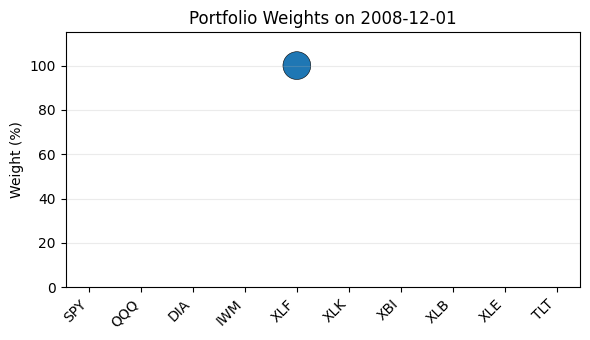


=== Performance 2007 ===
Average Monthly Return   : 1.17%
Monthly Sharpe Ratio     : 0.238
Annualized Sharpe Ratio  : 0.826
Maximum Drawdown         : 8.49%

=== Performance 2008 ===
Average Monthly Return   : 0.22%
Monthly Sharpe Ratio     : 0.028
Annualized Sharpe Ratio  : 0.097
Maximum Drawdown         : 28.23%


In [21]:
if __name__ == "__main__":
    # --- choose a date range and parameters ---
    start_date     = "2007-01-01"
    end_date       = "2008-12-31"
    rebalance_wks  = 4     # hold for one month
    lookback_wks   = 12    # use trailing 3 months to estimate μ, Σ

    # --- pull weekly close prices ---
    test_px = yf.download(etfs, start=start_date, end=end_date, interval="1wk")["Close"].dropna()

    # --- initialise equal-weight portfolio ---
    w_prev = np.ones(len(etfs)) / len(etfs)
    c_prev = 0.0
    dates  = test_px.index

    monthly_returns  = []
    rebalance_dates  = []

    for i in range(lookback_wks, len(dates) - rebalance_wks, rebalance_wks):
        # Build estimation window
        win_prices = test_px.iloc[i-lookback_wks : i]
        mu_hat, cov_hat = project_returns(win_prices, horizon_wks=rebalance_wks)

        # Optimize via Markowitz
        data_i = Data(
            w_prev      = w_prev,
            mean        = mu_hat,
            risk_free   = 0.0,
            cov         = cov_hat,
            kappa_short = np.zeros(len(etfs)),
            kappa_borrow= 0.0,
            kappa_spread= np.zeros(len(etfs)),
            kappa_impact= np.zeros(len(etfs))
        )
        w_opt, c_opt, exp_ret, exp_risk = markowitz(data_i, params)

        print(f"\n=== Rebalance on {dates[i].date()} ===")
        print_results(etfs, w_opt, c_opt, exp_ret, exp_risk)

        plot_weight_scatter(dates[i].date(), etfs, w_opt)

        # Realised performance while holding the *previous* weights
        hold_slice    = test_px.iloc[i : i+rebalance_wks]
        realised_hold = calc_portfolio_returns(hold_slice, w_prev, c_prev)
        realised_ret  = (1 + realised_hold).prod() - 1

        # record
        monthly_returns.append(realised_ret)
        rebalance_dates.append(dates[i])

        # roll portfolio forward
        w_prev, c_prev = w_opt, c_opt

    # --- now print per-year performance ---
    df = pd.DataFrame({
        "date": rebalance_dates,
        "return": monthly_returns
    })
    df["year"] = df["date"].dt.year

    for year, grp in df.groupby("year"):
        m         = grp["return"].mean()
        s         = grp["return"].std()
        sr_month  = m / s if s > 1e-8 else 0
        sr_annual = sr_month * np.sqrt(12)
        mdd_year  = max_drawdown(grp["return"].values)

        print(f"\n=== Performance {year} ===")
        print(f"Average Monthly Return   : {m:.2%}")
        print(f"Monthly Sharpe Ratio     : {sr_month:.3f}")
        print(f"Annualized Sharpe Ratio  : {sr_annual:.3f}")
        print(f"Maximum Drawdown         : {mdd_year:.2%}")

[*********************100%***********************]  10 of 10 completed



=== Rebalance on 2019-03-26 ===
Optimal portfolio
----------------------
 Investment in SPY : 0.0%
 Investment in QQQ : 0.0%
 Investment in DIA : 0.0%
 Investment in IWM : 0.0%
 Investment in XLF : 0.0%
 Investment in XLK : 0.0%
 Investment in XBI : 0.0%
 Investment in XLB : 0.0%
 Investment in XLE : 0.0%
 Investment in TLT : 100.0%
Cash: 9.555096801191431e-09
----------------------
Exp ret = 6.265778423550551%
Expected risk = 0.0011350487622947202%


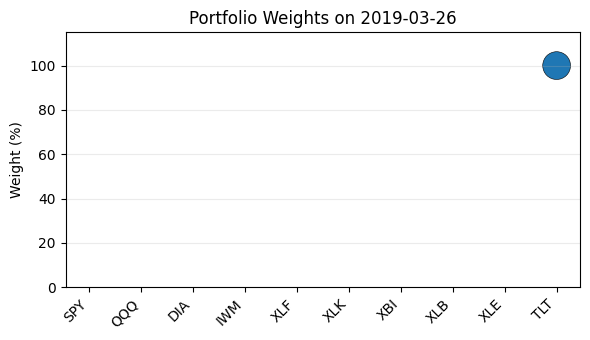


=== Rebalance on 2019-04-23 ===
Optimal portfolio
----------------------
 Investment in SPY : 0.0%
 Investment in QQQ : 0.0%
 Investment in DIA : 0.0%
 Investment in IWM : 0.0%
 Investment in XLF : 0.0%
 Investment in XLK : 0.0%
 Investment in XBI : 0.0%
 Investment in XLB : 0.0%
 Investment in XLE : 0.0%
 Investment in TLT : 100.0%
Cash: 6.454515557800198e-09
----------------------
Exp ret = 5.409786513714376%
Expected risk = 0.0005069537782322888%


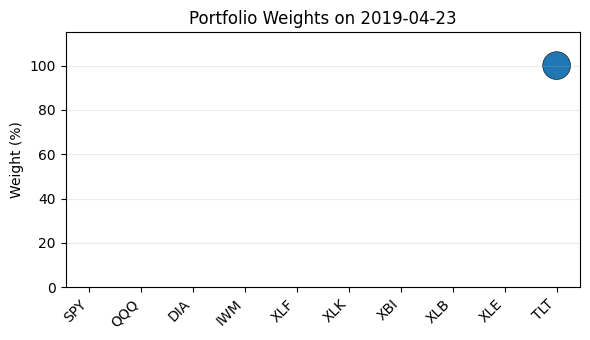


=== Rebalance on 2019-05-21 ===
Optimal portfolio
----------------------
 Investment in SPY : 0.0%
 Investment in QQQ : 0.0%
 Investment in DIA : 0.0%
 Investment in IWM : 0.0%
 Investment in XLF : 100.0%
 Investment in XLK : 0.0%
 Investment in XBI : 0.0%
 Investment in XLB : 0.0%
 Investment in XLE : 0.0%
 Investment in TLT : 0.0%
Cash: 7.655138573428617e-08
----------------------
Exp ret = 2.0988131216137464%
Expected risk = 0.00048821651993884656%


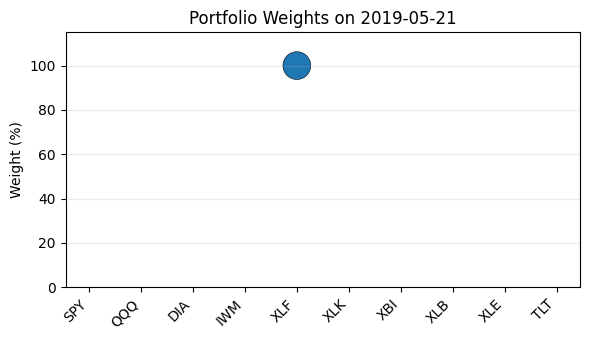


=== Rebalance on 2019-06-18 ===
Optimal portfolio
----------------------
 Investment in SPY : 0.0%
 Investment in QQQ : 0.0%
 Investment in DIA : 0.0%
 Investment in IWM : 0.0%
 Investment in XLF : 100.0%
 Investment in XLK : 0.0%
 Investment in XBI : 0.0%
 Investment in XLB : 0.0%
 Investment in XLE : 0.0%
 Investment in TLT : 0.0%
Cash: 7.422285552706119e-10
----------------------
Exp ret = 2.375096801826066%
Expected risk = 0.000773102822078246%


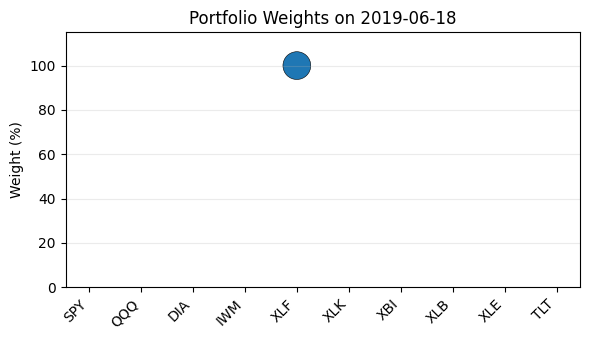


=== Rebalance on 2019-07-16 ===
Optimal portfolio
----------------------
 Investment in SPY : 0.0%
 Investment in QQQ : 0.0%
 Investment in DIA : 0.0%
 Investment in IWM : 0.0%
 Investment in XLF : 100.0%
 Investment in XLK : 0.0%
 Investment in XBI : 0.0%
 Investment in XLB : 0.0%
 Investment in XLE : 0.0%
 Investment in TLT : 0.0%
Cash: 5.417284283480333e-10
----------------------
Exp ret = 2.5693461087202962%
Expected risk = 0.0007936621838860855%


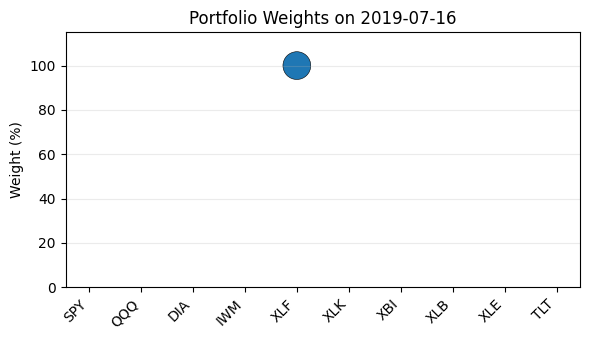


=== Rebalance on 2019-08-13 ===
Optimal portfolio
----------------------
 Investment in SPY : 0.0%
 Investment in QQQ : 0.0%
 Investment in DIA : 0.0%
 Investment in IWM : 0.0%
 Investment in XLF : 100.0%
 Investment in XLK : 0.0%
 Investment in XBI : 0.0%
 Investment in XLB : 0.0%
 Investment in XLE : 0.0%
 Investment in TLT : 0.0%
Cash: 7.898750849262706e-10
----------------------
Exp ret = 4.48973408052744%
Expected risk = 0.0019494056365829788%


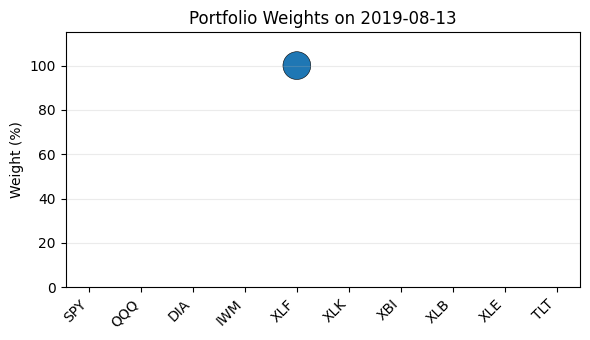


=== Rebalance on 2019-09-10 ===
Optimal portfolio
----------------------
 Investment in SPY : 0.0%
 Investment in QQQ : 0.0%
 Investment in DIA : 0.0%
 Investment in IWM : 0.0%
 Investment in XLF : 100.0%
 Investment in XLK : 0.0%
 Investment in XBI : 0.0%
 Investment in XLB : 0.0%
 Investment in XLE : 0.0%
 Investment in TLT : 0.0%
Cash: 1.1643931306384592e-09
----------------------
Exp ret = 3.133565499291049%
Expected risk = 0.0019844840136834774%


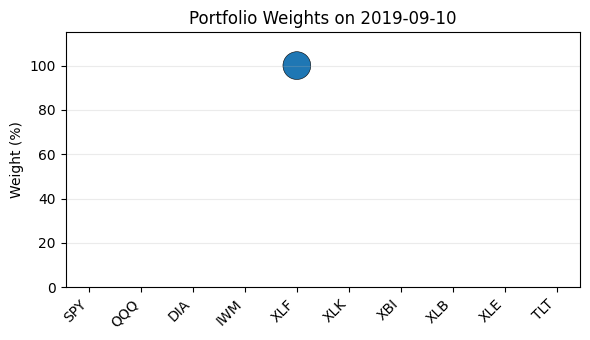


=== Rebalance on 2019-10-08 ===
Optimal portfolio
----------------------
 Investment in SPY : 0.0%
 Investment in QQQ : 0.0%
 Investment in DIA : 0.0%
 Investment in IWM : 0.0%
 Investment in XLF : 100.0%
 Investment in XLK : 0.0%
 Investment in XBI : 0.0%
 Investment in XLB : 0.0%
 Investment in XLE : 0.0%
 Investment in TLT : 0.0%
Cash: 6.333048285851955e-10
----------------------
Exp ret = 3.703757282572834%
Expected risk = 0.002653738008453983%


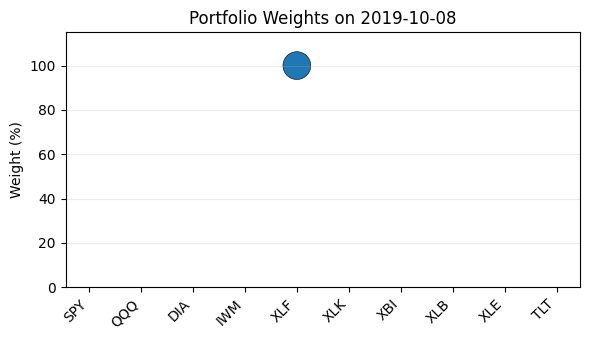


=== Rebalance on 2019-11-05 ===
Optimal portfolio
----------------------
 Investment in SPY : 0.0%
 Investment in QQQ : 0.0%
 Investment in DIA : 0.0%
 Investment in IWM : 0.0%
 Investment in XLF : 0.0%
 Investment in XLK : 0.0%
 Investment in XBI : 0.0%
 Investment in XLB : 0.0%
 Investment in XLE : 100.0%
 Investment in TLT : 0.0%
Cash: 1.0315850708941429e-08
----------------------
Exp ret = 3.5979578633209837%
Expected risk = 0.0015935655343085077%


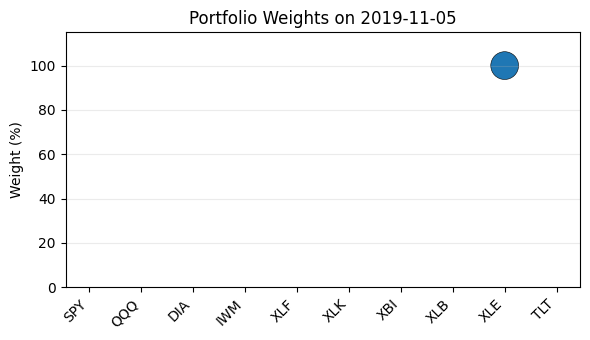


=== Rebalance on 2019-12-03 ===
Optimal portfolio
----------------------
 Investment in SPY : 0.0%
 Investment in QQQ : 0.0%
 Investment in DIA : 0.0%
 Investment in IWM : 0.0%
 Investment in XLF : 0.0%
 Investment in XLK : 100.0%
 Investment in XBI : 0.0%
 Investment in XLB : 0.0%
 Investment in XLE : 0.0%
 Investment in TLT : 0.0%
Cash: 2.3602617773695558e-08
----------------------
Exp ret = 3.838720602878018%
Expected risk = 0.005850781777623458%


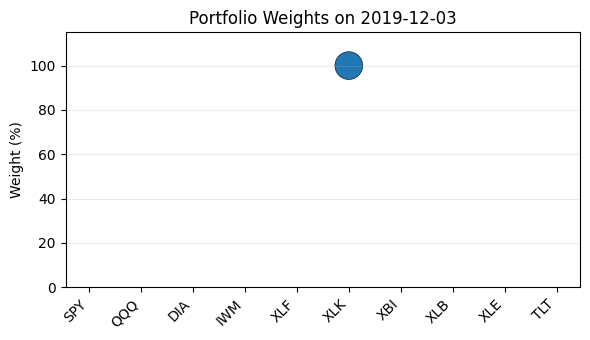


=== Rebalance on 2019-12-31 ===
Optimal portfolio
----------------------
 Investment in SPY : 0.0%
 Investment in QQQ : 0.0%
 Investment in DIA : 0.0%
 Investment in IWM : 0.0%
 Investment in XLF : 0.0%
 Investment in XLK : 100.0%
 Investment in XBI : 0.0%
 Investment in XLB : 0.0%
 Investment in XLE : 0.0%
 Investment in TLT : 0.0%
Cash: 7.66263246537046e-09
----------------------
Exp ret = 8.021187682700926%
Expected risk = 0.003280940364016974%


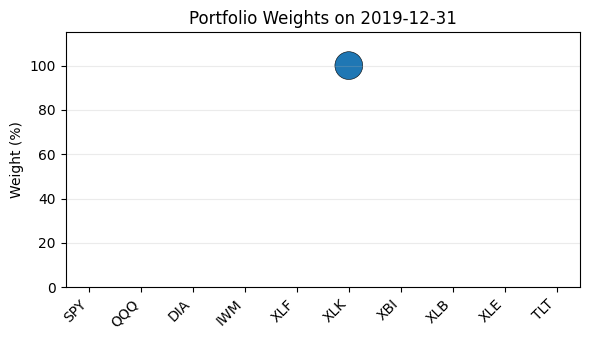


=== Rebalance on 2020-01-28 ===
Optimal portfolio
----------------------
 Investment in SPY : 0.0%
 Investment in QQQ : 0.0%
 Investment in DIA : 0.0%
 Investment in IWM : 0.0%
 Investment in XLF : 0.0%
 Investment in XLK : 0.0%
 Investment in XBI : 0.0%
 Investment in XLB : 0.0%
 Investment in XLE : 0.0%
 Investment in TLT : 100.0%
Cash: 1.2079507532450707e-08
----------------------
Exp ret = 3.8355390602271964%
Expected risk = 0.0011137003842086027%


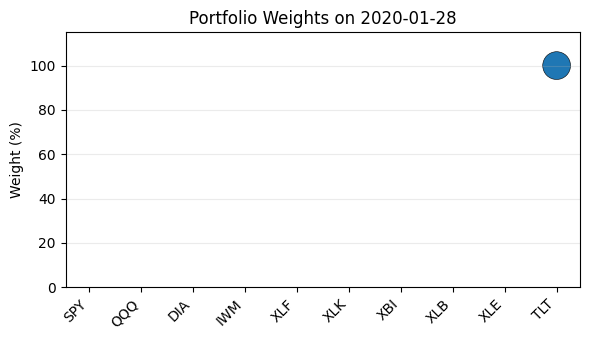


=== Rebalance on 2020-02-25 ===
Optimal portfolio
----------------------
 Investment in SPY : 0.0%
 Investment in QQQ : 0.0%
 Investment in DIA : 0.0%
 Investment in IWM : 0.0%
 Investment in XLF : 0.0%
 Investment in XLK : 0.0%
 Investment in XBI : 0.0%
 Investment in XLB : 0.0%
 Investment in XLE : 0.0%
 Investment in TLT : 100.0%
Cash: 4.4392775383810986e-09
----------------------
Exp ret = 3.5652603463935164%
Expected risk = 0.003975029617965451%


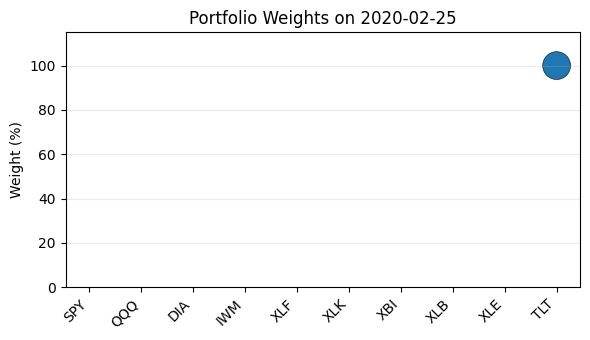


=== Rebalance on 2020-03-24 ===
Optimal portfolio
----------------------
 Investment in SPY : 0.0%
 Investment in QQQ : 0.0%
 Investment in DIA : -0.0%
 Investment in IWM : 0.0%
 Investment in XLF : 100.0%
 Investment in XLK : 0.0%
 Investment in XBI : 0.0%
 Investment in XLB : 0.0%
 Investment in XLE : 0.0%
 Investment in TLT : 0.0%
Cash: 3.036190795335532e-10
----------------------
Exp ret = 7.2955601896375954%
Expected risk = 0.006857232966582432%


/usr/local/lib/python3.11/dist-packages/matplotlib/collections.py:1008: RuntimeWarning: invalid value encountered in sqrt
  scale = np.sqrt(self._sizes) * dpi / 72.0 * self._factor
/usr/local/lib/python3.11/dist-packages/matplotlib/collections.py:1008: RuntimeWarning: invalid value encountered in sqrt
  scale = np.sqrt(self._sizes) * dpi / 72.0 * self._factor


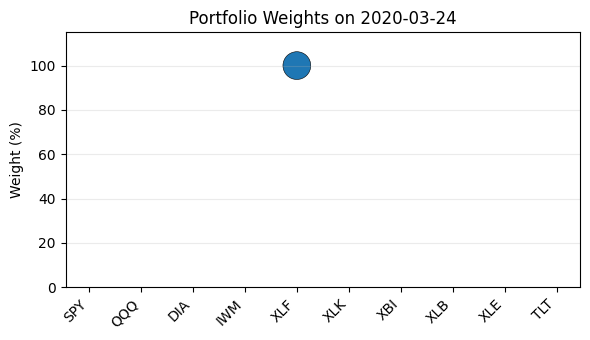


=== Rebalance on 2020-04-21 ===
Optimal portfolio
----------------------
 Investment in SPY : 0.0%
 Investment in QQQ : 0.0%
 Investment in DIA : 0.0%
 Investment in IWM : 0.0%
 Investment in XLF : 100.0%
 Investment in XLK : 0.0%
 Investment in XBI : 0.0%
 Investment in XLB : 0.0%
 Investment in XLE : 0.0%
 Investment in TLT : 0.0%
Cash: 1.0825512301180211e-09
----------------------
Exp ret = 6.123975405501502%
Expected risk = 0.006967734843237305%


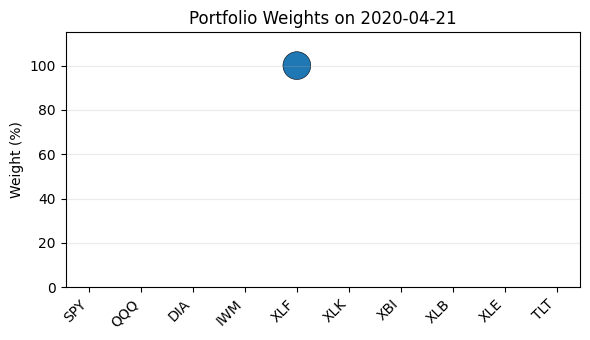


=== Rebalance on 2020-05-19 ===
Optimal portfolio
----------------------
 Investment in SPY : 0.0%
 Investment in QQQ : 0.0%
 Investment in DIA : 0.0%
 Investment in IWM : 0.0%
 Investment in XLF : 24.42%
 Investment in XLK : 75.58%
 Investment in XBI : 0.0%
 Investment in XLB : 0.0%
 Investment in XLE : 0.0%
 Investment in TLT : 0.0%
Cash: 8.514441553839087e-10
----------------------
Exp ret = 6.093154350164452%
Expected risk = 0.02999999999897394%


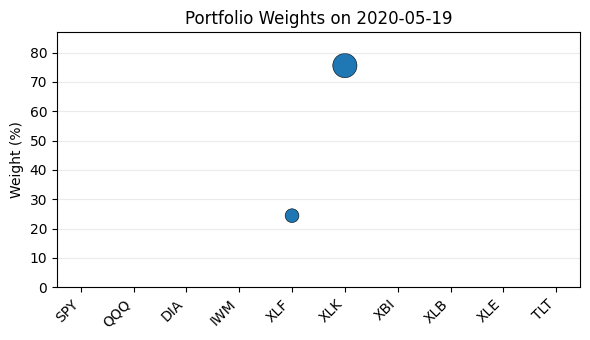


=== Rebalance on 2020-06-16 ===
Optimal portfolio
----------------------
 Investment in SPY : 0.0%
 Investment in QQQ : 0.0%
 Investment in DIA : 0.0%
 Investment in IWM : 0.0%
 Investment in XLF : 0.0%
 Investment in XLK : 10.05%
 Investment in XBI : 0.0%
 Investment in XLB : 89.95%
 Investment in XLE : 0.0%
 Investment in TLT : 0.0%
Cash: 8.76437436667507e-10
----------------------
Exp ret = 14.12980444679302%
Expected risk = 0.029999999977455106%


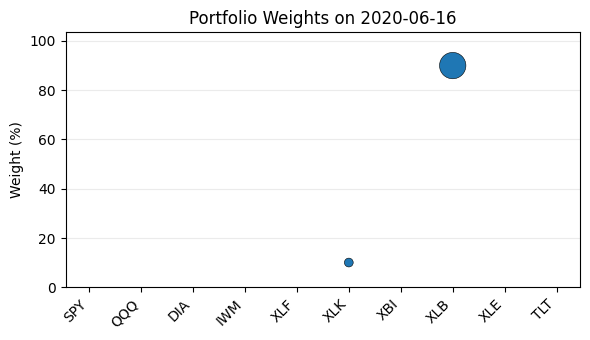


=== Rebalance on 2020-07-14 ===
Optimal portfolio
----------------------
 Investment in SPY : 0.0%
 Investment in QQQ : 0.0%
 Investment in DIA : 100.0%
 Investment in IWM : 0.0%
 Investment in XLF : 0.0%
 Investment in XLK : 0.0%
 Investment in XBI : 0.0%
 Investment in XLB : 0.0%
 Investment in XLE : 0.0%
 Investment in TLT : 0.0%
Cash: 2.2431652779239405e-08
----------------------
Exp ret = 7.040193673664483%
Expected risk = 0.0029581031993606874%


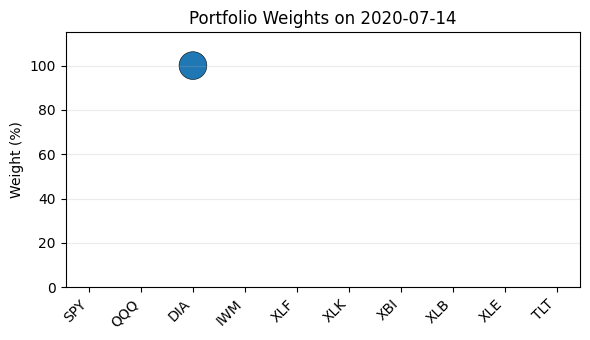


=== Rebalance on 2020-08-11 ===
Optimal portfolio
----------------------
 Investment in SPY : 0.0%
 Investment in QQQ : 0.0%
 Investment in DIA : 0.0%
 Investment in IWM : 0.0%
 Investment in XLF : 0.0%
 Investment in XLK : 0.0%
 Investment in XBI : 100.0%
 Investment in XLB : 0.0%
 Investment in XLE : 0.0%
 Investment in TLT : 0.0%
Cash: 5.0189402611512335e-09
----------------------
Exp ret = 6.727366637417212%
Expected risk = 0.008659817724513514%


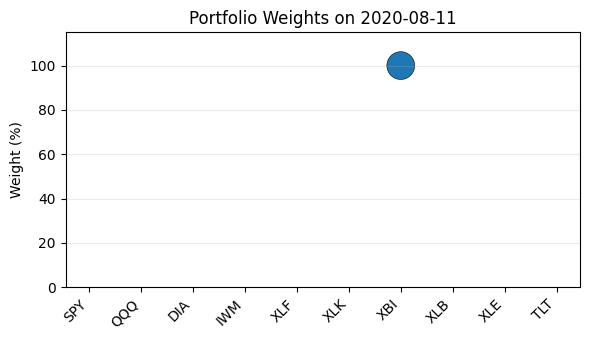


=== Rebalance on 2020-09-08 ===
Optimal portfolio
----------------------
 Investment in SPY : 0.0%
 Investment in QQQ : 0.0%
 Investment in DIA : 0.0%
 Investment in IWM : 0.0%
 Investment in XLF : 0.0%
 Investment in XLK : 0.0%
 Investment in XBI : 100.0%
 Investment in XLB : 0.0%
 Investment in XLE : 0.0%
 Investment in TLT : 0.0%
Cash: 2.989076218943922e-10
----------------------
Exp ret = 5.536520027556895%
Expected risk = 0.003045091667057245%


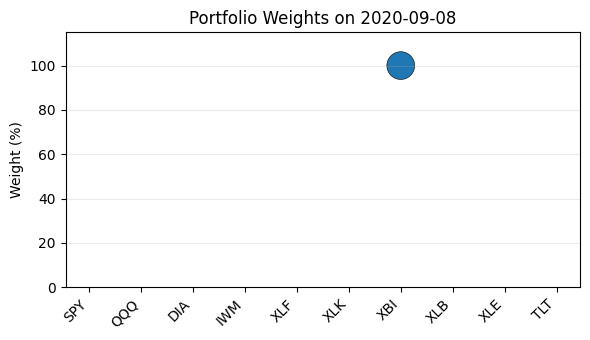


=== Rebalance on 2020-10-06 ===
Optimal portfolio
----------------------
 Investment in SPY : 0.0%
 Investment in QQQ : 100.0%
 Investment in DIA : 0.0%
 Investment in IWM : 0.0%
 Investment in XLF : 0.0%
 Investment in XLK : 0.0%
 Investment in XBI : 0.0%
 Investment in XLB : 0.0%
 Investment in XLE : 0.0%
 Investment in TLT : 0.0%
Cash: 1.7148297398820098e-09
----------------------
Exp ret = 2.9857302981118097%
Expected risk = 0.002890677457917383%


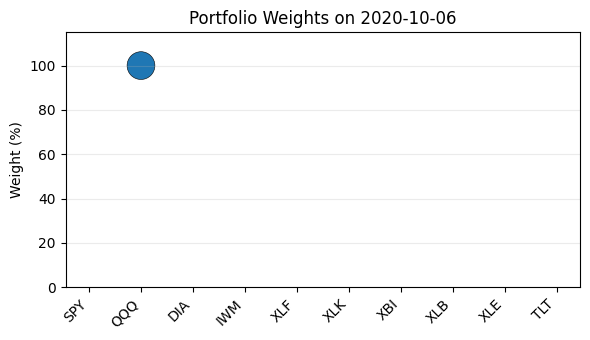


=== Rebalance on 2020-11-03 ===
Optimal portfolio
----------------------
 Investment in SPY : 0.0%
 Investment in QQQ : 0.0%
 Investment in DIA : 0.0%
 Investment in IWM : 0.0%
 Investment in XLF : 0.0%
 Investment in XLK : 0.0%
 Investment in XBI : 100.0%
 Investment in XLB : 0.0%
 Investment in XLE : 0.0%
 Investment in TLT : 0.0%
Cash: 4.157791999557815e-08
----------------------
Exp ret = 1.622611776953679%
Expected risk = 0.0019436815661549422%


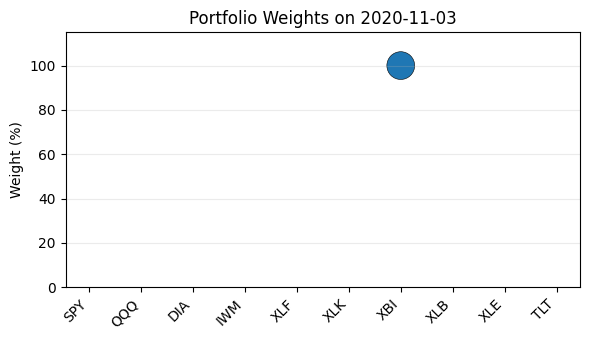


=== Rebalance on 2020-12-01 ===
Optimal portfolio
----------------------
 Investment in SPY : 0.0%
 Investment in QQQ : 0.0%
 Investment in DIA : 0.0%
 Investment in IWM : 0.0%
 Investment in XLF : 0.0%
 Investment in XLK : 100.0%
 Investment in XBI : 0.0%
 Investment in XLB : 0.0%
 Investment in XLE : 0.0%
 Investment in TLT : 0.0%
Cash: 1.3092495525045462e-08
----------------------
Exp ret = 6.897286594915221%
Expected risk = 0.005065799657859067%


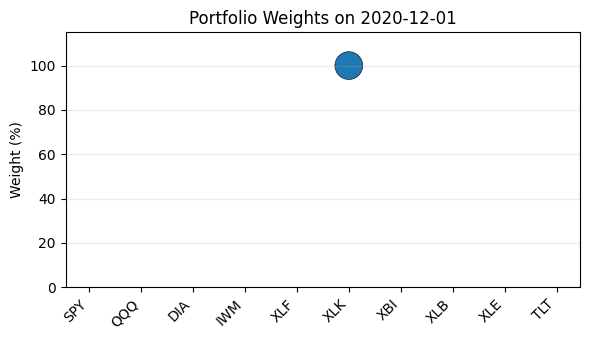


=== Performance 2019 ===
Average Monthly Return   : 0.81%
Monthly Sharpe Ratio     : 0.195
Annualized Sharpe Ratio  : 0.677
Maximum Drawdown         : 5.74%

=== Performance 2020 ===
Average Monthly Return   : -0.72%
Monthly Sharpe Ratio     : -0.087
Annualized Sharpe Ratio  : -0.302
Maximum Drawdown         : 24.69%


In [22]:
if __name__ == "__main__":
    # --- choose a date range and parameters ---
    start_date     = "2019-01-01"
    end_date       = "2020-12-31"
    rebalance_wks  = 4     # hold for one month
    lookback_wks   = 12    # use trailing 3 months to estimate μ, Σ

    # --- pull weekly close prices ---
    test_px = yf.download(etfs, start=start_date, end=end_date, interval="1wk")["Close"].dropna()

    # --- initialise equal-weight portfolio ---
    w_prev = np.ones(len(etfs)) / len(etfs)
    c_prev = 0.0
    dates  = test_px.index

    monthly_returns  = []
    rebalance_dates  = []

    for i in range(lookback_wks, len(dates) - rebalance_wks, rebalance_wks):
        # Build estimation window
        win_prices = test_px.iloc[i-lookback_wks : i]
        mu_hat, cov_hat = project_returns(win_prices, horizon_wks=rebalance_wks)

        # Optimize via Markowitz
        data_i = Data(
            w_prev      = w_prev,
            mean        = mu_hat,
            risk_free   = 0.0,
            cov         = cov_hat,
            kappa_short = np.zeros(len(etfs)),
            kappa_borrow= 0.0,
            kappa_spread= np.zeros(len(etfs)),
            kappa_impact= np.zeros(len(etfs))
        )
        w_opt, c_opt, exp_ret, exp_risk = markowitz(data_i, params)

        print(f"\n=== Rebalance on {dates[i].date()} ===")
        print_results(etfs, w_opt, c_opt, exp_ret, exp_risk)

        plot_weight_scatter(dates[i].date(), etfs, w_opt)

        # Realised performance while holding the *previous* weights
        hold_slice    = test_px.iloc[i : i+rebalance_wks]
        realised_hold = calc_portfolio_returns(hold_slice, w_prev, c_prev)
        realised_ret  = (1 + realised_hold).prod() - 1

        # record
        monthly_returns.append(realised_ret)
        rebalance_dates.append(dates[i])

        # roll portfolio forward
        w_prev, c_prev = w_opt, c_opt

    # --- now print per-year performance ---
    df = pd.DataFrame({
        "date": rebalance_dates,
        "return": monthly_returns
    })
    df["year"] = df["date"].dt.year

    for year, grp in df.groupby("year"):
        m         = grp["return"].mean()
        s         = grp["return"].std()
        sr_month  = m / s if s > 1e-8 else 0
        sr_annual = sr_month * np.sqrt(12)
        mdd_year  = max_drawdown(grp["return"].values)

        print(f"\n=== Performance {year} ===")
        print(f"Average Monthly Return   : {m:.2%}")
        print(f"Monthly Sharpe Ratio     : {sr_month:.3f}")
        print(f"Annualized Sharpe Ratio  : {sr_annual:.3f}")
        print(f"Maximum Drawdown         : {mdd_year:.2%}")

## Testing Different Regularizations on Rebalanced Portfolio

In [23]:
def rebalance_with_regularization(reg_type, gamma=0.05, epsilon=0.1, verbose=False, start_date="2012-01-01", end_date="2016-12-31"):
    # Configuration
    rebalance_wks  = 4
    lookback_wks   = 12

    test_px = yf.download(etfs, start=start_date, end=end_date, interval="1wk")["Close"].dropna()
    w_prev = np.ones(len(etfs)) / len(etfs)
    c_prev = 0.0
    dates  = test_px.index

    monthly_returns = []
    rebalance_dates = []

    for i in range(lookback_wks, len(dates) - rebalance_wks, rebalance_wks):
        # estimation window
        win_prices   = test_px.iloc[i-lookback_wks : i]
        mu_hat, cov_hat = project_returns(win_prices, horizon_wks=rebalance_wks)

        # choose regularization
        if   reg_type == "L1":
            w_opt = l1_regularized_portfolio(mu_hat, cov_hat, gamma)
        elif reg_type == "L2":
            w_opt = l2_regularized_portfolio(mu_hat, cov_hat, gamma)
        elif reg_type == "PBR":
            returns = win_prices.pct_change().dropna().to_numpy()
            w_opt = mean_variance_pbr_rank1(returns, gamma, epsilon)
        elif reg_type == "CVAR_PBR":
            returns = win_prices.pct_change().dropna().to_numpy()
            w_opt = mean_cvar_pbr(returns, alpha=0.95, gamma=gamma, epsilon=epsilon)
        else:
            raise ValueError("Invalid regularization type.")
        c_opt = 0.0

        if verbose:
            exp_ret  = mu_hat @ w_opt
            exp_risk = w_opt @ cov_hat @ w_opt
            print(f"\n=== Rebalance on {dates[i].date()} ===")
            print_results(etfs, w_opt, c_opt, exp_ret, exp_risk)
            plot_weight_scatter(dates[i].date(), etfs, w_opt)

        # always compute realized return
        hold_slice    = test_px.iloc[i : i+rebalance_wks]
        realised_hold = calc_portfolio_returns(hold_slice, w_prev, c_prev)
        realised_ret  = (1 + realised_hold).prod() - 1

        monthly_returns.append(realised_ret)
        rebalance_dates.append(dates[i])
        mdd_running = max_drawdown(monthly_returns)
        w_prev, c_prev = w_opt, c_opt

    # --- yearly summary ---
    df = pd.DataFrame({
        "date": rebalance_dates,
        "return": monthly_returns
    })
    df["year"] = df["date"].dt.year

    if verbose:
        for year, grp in df.groupby("year"):
            m = grp["return"].mean()
            s = grp["return"].std()
            sr_month = m / s if s > 1e-8 else 0
            sr_annual = sr_month * np.sqrt(12)
            mdd_year  = max_drawdown(grp["return"].values)

            print(f"\n=== Performance {year} ===")
            print(f"Average Monthly Return   : {m:.2%}")
            print(f"Monthly Sharpe Ratio     : {sr_month:.3f}")
            print(f"Annualized Sharpe Ratio  : {sr_annual:.3f}")
            print(f"Maximum Drawdown         : {mdd_year:.2%}")

    return monthly_returns, rebalance_dates

## Grid Search to Find the Best Hyperparameters for Markowitz with Regularizations



In [24]:
def grid_search_regularization(reg_type,
                               gamma_vals=np.linspace(0.005, 0.05, 10),
                               epsilon_vals=np.linspace(0.1, 0.5, 9)):
    """
    Find the (gamma, epsilon) that maximizes annualized Sharpe.
    For L1/L2 only gamma is varied; epsilon is ignored.
    """
    records = []

    for gamma in gamma_vals:
        if reg_type in ("PBR", "CVAR_PBR"):
            for eps in epsilon_vals:
                rets, _ = rebalance_with_regularization(reg_type, gamma=gamma, epsilon=eps)
                if len(rets) < 2:
                    continue
                sr_m = np.mean(rets) / np.std(rets)
                sr_a = sr_m * np.sqrt(12)
                records.append({
                    "gamma": gamma,
                    "epsilon": eps,
                    "annual_sharpe": sr_a
                })
        else:
            rets, _ = rebalance_with_regularization(reg_type, gamma=gamma, epsilon=0.1)
            if len(rets) < 2:
                continue
            sr_m = np.mean(rets) / np.std(rets)
            sr_a = sr_m * np.sqrt(12)
            records.append({
                "gamma": gamma,
                "epsilon": np.nan,
                "annual_sharpe": sr_a
            })

    results_df = pd.DataFrame(records)
    best_idx   = results_df["annual_sharpe"].idxmax()
    best_params = results_df.loc[best_idx]

    print("\n=== Grid Search Results ===")
    print(results_df.sort_values("annual_sharpe", ascending=False).head(5))
    print("\n>>> Best params:")
    print(best_params)

    return results_df, best_params

In [25]:
# For L1:
gamma_range   = np.linspace(0.005, 0.05, 10)
epsilon_range = np.linspace(0.1, 0.5, 9)
df_l1, best_l1 = grid_search_regularization("L1", gamma_range)

[*********************100%***********************]  10 of 10 completed
[*********************100%***********************]  10 of 10 completed
[*********************100%***********************]  10 of 10 completed
[*********************100%***********************]  10 of 10 completed
[*********************100%***********************]  10 of 10 completed
[*********************100%***********************]  10 of 10 completed
[*********************100%***********************]  10 of 10 completed
[*********************100%***********************]  10 of 10 completed
[*********************100%***********************]  10 of 10 completed
[*********************100%***********************]  10 of 10 completed



=== Grid Search Results ===
   gamma  epsilon  annual_sharpe
3  0.020      NaN       0.816871
4  0.025      NaN       0.816871
5  0.030      NaN       0.816871
6  0.035      NaN       0.816870
7  0.040      NaN       0.816870

>>> Best params:
gamma            0.020000
epsilon               NaN
annual_sharpe    0.816871
Name: 3, dtype: float64


In [26]:
df_l2, best_l2 = grid_search_regularization("L2", gamma_range)

[*********************100%***********************]  10 of 10 completed
[*********************100%***********************]  10 of 10 completed
[*********************100%***********************]  10 of 10 completed
[*********************100%***********************]  10 of 10 completed
[*********************100%***********************]  10 of 10 completed
[*********************100%***********************]  10 of 10 completed
[*********************100%***********************]  10 of 10 completed
[*********************100%***********************]  10 of 10 completed
[*********************100%***********************]  10 of 10 completed
[*********************100%***********************]  10 of 10 completed



=== Grid Search Results ===
   gamma  epsilon  annual_sharpe
9  0.050      NaN       0.841444
8  0.045      NaN       0.839766
7  0.040      NaN       0.837945
6  0.035      NaN       0.835949
5  0.030      NaN       0.834862

>>> Best params:
gamma            0.050000
epsilon               NaN
annual_sharpe    0.841444
Name: 9, dtype: float64


In [27]:
df_pbr, best_pbr = grid_search_regularization("PBR", gamma_range)

[*********************100%***********************]  10 of 10 completed
[*********************100%***********************]  10 of 10 completed
[*********************100%***********************]  10 of 10 completed
[*********************100%***********************]  10 of 10 completed
[*********************100%***********************]  10 of 10 completed
[*********************100%***********************]  10 of 10 completed
[*********************100%***********************]  10 of 10 completed
[*********************100%***********************]  10 of 10 completed
[*********************100%***********************]  10 of 10 completed
[*********************100%***********************]  10 of 10 completed
[*********************100%***********************]  10 of 10 completed
[*********************100%***********************]  10 of 10 completed
/usr/local/lib/python3.11/dist-packages/cvxpy/problems/problem.py:1504: UserWarning: Solution may be inaccurate. Try another solver, adjusting the s


=== Grid Search Results ===
    gamma  epsilon  annual_sharpe
24  0.015     0.40       0.873416
46  0.030     0.15       0.873414
58  0.035     0.30       0.873413
30  0.020     0.25       0.873413
36  0.025     0.10       0.873413

>>> Best params:
gamma            0.015000
epsilon          0.400000
annual_sharpe    0.873416
Name: 24, dtype: float64


In [28]:
df_cvar, best_cvar = grid_search_regularization("CVAR_PBR", gamma_range)

[*********************100%***********************]  10 of 10 completed
[*********************100%***********************]  10 of 10 completed
[*********************100%***********************]  10 of 10 completed
[*********************100%***********************]  10 of 10 completed
[*********************100%***********************]  10 of 10 completed
[*********************100%***********************]  10 of 10 completed
[*********************100%***********************]  10 of 10 completed
[*********************100%***********************]  10 of 10 completed
[*********************100%***********************]  10 of 10 completed
[*********************100%***********************]  10 of 10 completed
[*********************100%***********************]  10 of 10 completed
[*********************100%***********************]  10 of 10 completed
[*********************100%***********************]  10 of 10 completed
[*********************100%***********************]  10 of 10 completed
[*****


=== Grid Search Results ===
    gamma  epsilon  annual_sharpe
78  0.045     0.40       0.868257
69  0.040     0.40       0.868257
87  0.050     0.40       0.868257
43  0.025     0.45       0.868257
60  0.035     0.40       0.868257

>>> Best params:
gamma            0.045000
epsilon          0.400000
annual_sharpe    0.868257
Name: 78, dtype: float64


## Testing Rebalance with Different Regularization

*   We first test portfolio on stable period (2012-2016), this period is characterized by low volatility, accommodative Fed policy, and steady economic growth.

[**********************50%                       ]  5 of 10 completed

Testing L1 Regularization:


[*********************100%***********************]  10 of 10 completed



=== Rebalance on 2012-03-25 ===
Optimal portfolio
----------------------
 Investment in SPY : 2.69%
 Investment in QQQ : 9.82%
 Investment in DIA : 19.15%
 Investment in IWM : 8.73%
 Investment in XLF : 1.0%
 Investment in XLK : 13.9%
 Investment in XBI : 2.99%
 Investment in XLB : 1.0%
 Investment in XLE : 21.78%
 Investment in TLT : 18.94%
Cash: 0.0
----------------------
Exp ret = 4.916318925805279%
Expected risk = 0.0006543809910554587%


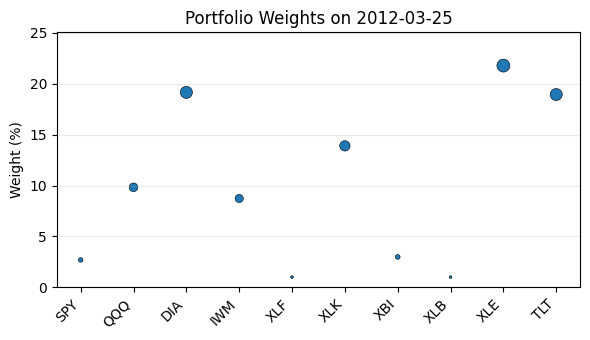


=== Rebalance on 2012-04-22 ===
Optimal portfolio
----------------------
 Investment in SPY : 11.43%
 Investment in QQQ : 2.94%
 Investment in DIA : 19.07%
 Investment in IWM : 13.68%
 Investment in XLF : 11.61%
 Investment in XLK : 4.58%
 Investment in XBI : 2.31%
 Investment in XLB : 1.0%
 Investment in XLE : 14.4%
 Investment in TLT : 18.98%
Cash: 0.0
----------------------
Exp ret = 1.1900535501488885%
Expected risk = 0.0003338385760287745%


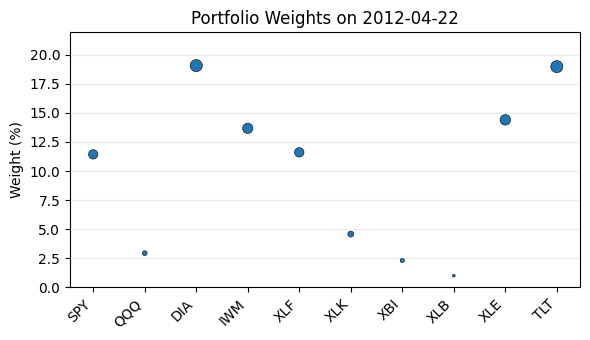


=== Rebalance on 2012-05-20 ===
Optimal portfolio
----------------------
 Investment in SPY : 9.77%
 Investment in QQQ : 5.62%
 Investment in DIA : 6.72%
 Investment in IWM : 8.59%
 Investment in XLF : 31.61%
 Investment in XLK : 22.12%
 Investment in XBI : 1.0%
 Investment in XLB : 1.0%
 Investment in XLE : 5.15%
 Investment in TLT : 8.42%
Cash: 0.0
----------------------
Exp ret = 0.08241063545744651%
Expected risk = 0.0007108425570914661%


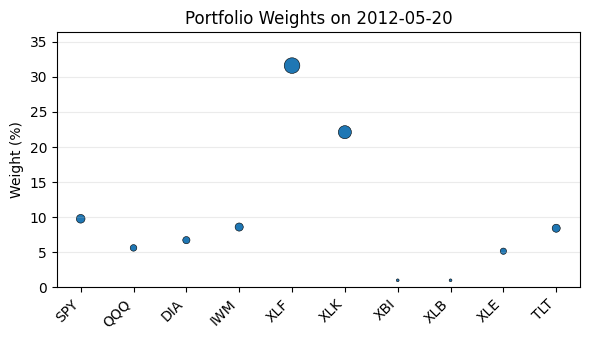


=== Rebalance on 2012-06-17 ===
Optimal portfolio
----------------------
 Investment in SPY : 10.58%
 Investment in QQQ : 3.4%
 Investment in DIA : 3.44%
 Investment in IWM : 7.19%
 Investment in XLF : 40.91%
 Investment in XLK : 23.57%
 Investment in XBI : 3.89%
 Investment in XLB : 1.0%
 Investment in XLE : 1.0%
 Investment in TLT : 5.02%
Cash: 0.0
----------------------
Exp ret = 1.7863324512047103%
Expected risk = 0.0005802519461537538%


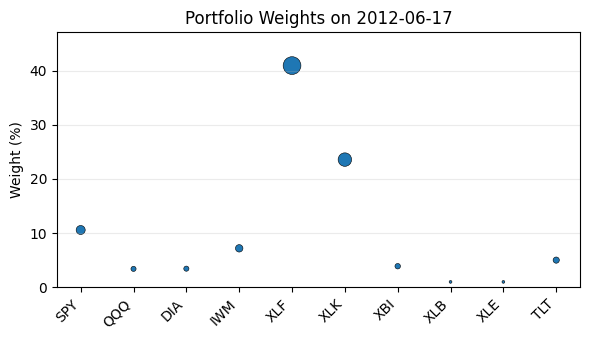


=== Rebalance on 2012-07-15 ===
Optimal portfolio
----------------------
 Investment in SPY : 7.3%
 Investment in QQQ : 7.23%
 Investment in DIA : 1.99%
 Investment in IWM : 7.19%
 Investment in XLF : 33.44%
 Investment in XLK : 31.67%
 Investment in XBI : 2.41%
 Investment in XLB : 2.87%
 Investment in XLE : 3.75%
 Investment in TLT : 2.14%
Cash: 0.0
----------------------
Exp ret = 2.237015550148686%
Expected risk = 0.000907240212793101%


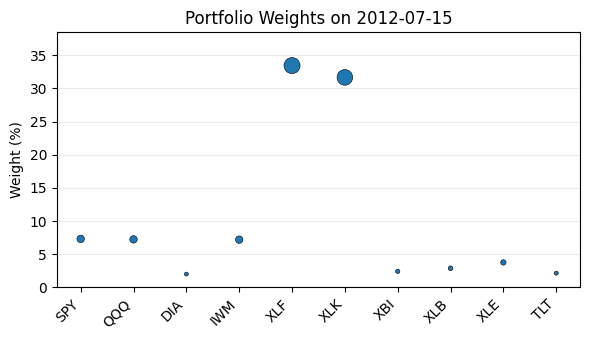


=== Rebalance on 2012-08-12 ===
Optimal portfolio
----------------------
 Investment in SPY : 9.42%
 Investment in QQQ : 6.46%
 Investment in DIA : 11.95%
 Investment in IWM : 10.49%
 Investment in XLF : 5.1%
 Investment in XLK : 5.5%
 Investment in XBI : 9.63%
 Investment in XLB : 18.06%
 Investment in XLE : 10.42%
 Investment in TLT : 12.97%
Cash: 0.0
----------------------
Exp ret = 2.7856278868452717%
Expected risk = 0.001192996312980225%


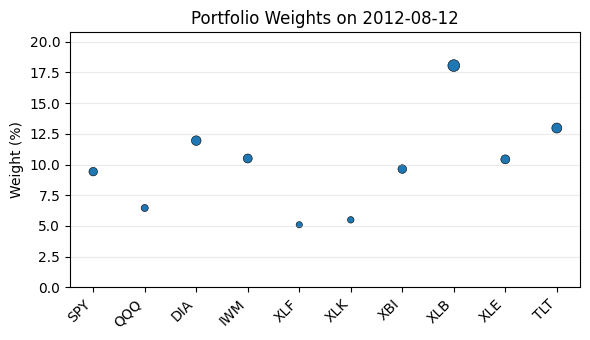


=== Rebalance on 2012-09-09 ===
Optimal portfolio
----------------------
 Investment in SPY : 5.56%
 Investment in QQQ : 11.62%
 Investment in DIA : 12.24%
 Investment in IWM : 9.67%
 Investment in XLF : 1.0%
 Investment in XLK : 4.56%
 Investment in XBI : 9.42%
 Investment in XLB : 22.52%
 Investment in XLE : 11.9%
 Investment in TLT : 11.5%
Cash: 0.0
----------------------
Exp ret = 3.5854136479921612%
Expected risk = 0.0005229769427288764%


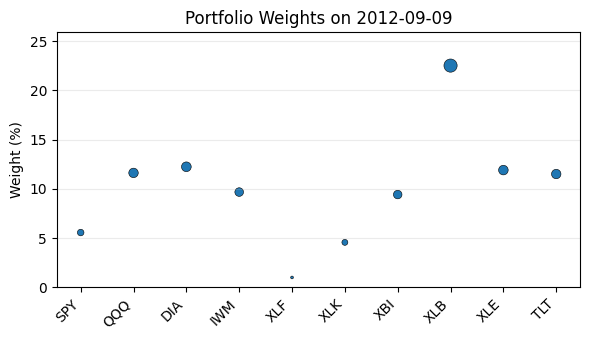


=== Rebalance on 2012-10-07 ===
Optimal portfolio
----------------------
 Investment in SPY : 10.08%
 Investment in QQQ : 10.08%
 Investment in DIA : 11.57%
 Investment in IWM : 11.41%
 Investment in XLF : 1.0%
 Investment in XLK : 6.49%
 Investment in XBI : 7.7%
 Investment in XLB : 10.91%
 Investment in XLE : 18.94%
 Investment in TLT : 11.82%
Cash: 0.0
----------------------
Exp ret = 2.845058462935566%
Expected risk = 0.0008021402801014695%


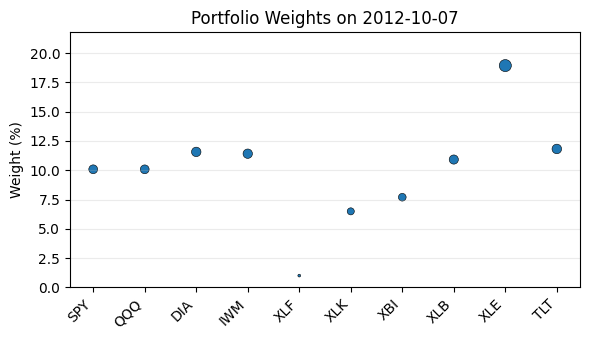


=== Rebalance on 2012-11-04 ===
Optimal portfolio
----------------------
 Investment in SPY : 10.08%
 Investment in QQQ : 10.89%
 Investment in DIA : 3.49%
 Investment in IWM : 11.53%
 Investment in XLF : 15.28%
 Investment in XLK : 5.21%
 Investment in XBI : 11.4%
 Investment in XLB : 8.37%
 Investment in XLE : 22.34%
 Investment in TLT : 1.41%
Cash: 0.0
----------------------
Exp ret = 0.40645289773102555%
Expected risk = 0.0005739097154656359%


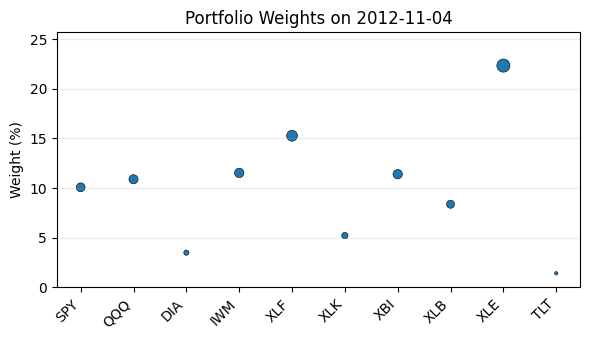


=== Rebalance on 2012-12-02 ===
Optimal portfolio
----------------------
 Investment in SPY : 9.86%
 Investment in QQQ : 8.11%
 Investment in DIA : 5.57%
 Investment in IWM : 11.23%
 Investment in XLF : 27.88%
 Investment in XLK : 8.88%
 Investment in XBI : 9.7%
 Investment in XLB : 4.14%
 Investment in XLE : 11.75%
 Investment in TLT : 2.88%
Cash: 0.0
----------------------
Exp ret = -0.43980415385319394%
Expected risk = 0.00039460950550036317%


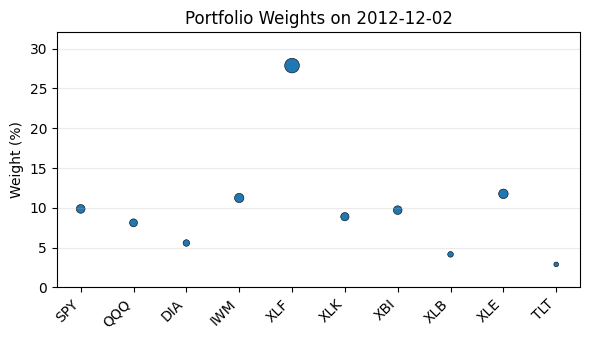


=== Rebalance on 2012-12-30 ===
Optimal portfolio
----------------------
 Investment in SPY : 8.38%
 Investment in QQQ : 15.19%
 Investment in DIA : 5.71%
 Investment in IWM : 10.31%
 Investment in XLF : 13.4%
 Investment in XLK : 1.5%
 Investment in XBI : 16.58%
 Investment in XLB : 6.73%
 Investment in XLE : 18.09%
 Investment in TLT : 4.11%
Cash: 0.0
----------------------
Exp ret = 0.06385121259310275%
Expected risk = 0.0007400223442367433%


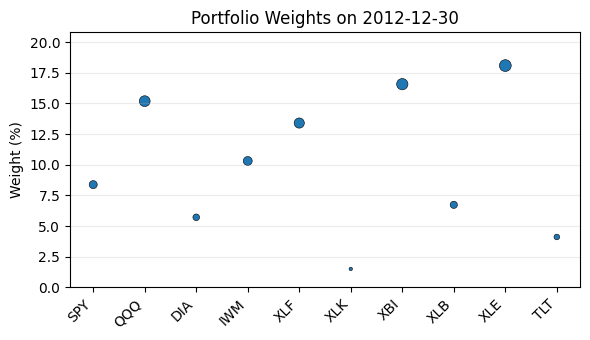


=== Rebalance on 2013-01-27 ===
Optimal portfolio
----------------------
 Investment in SPY : 8.55%
 Investment in QQQ : 17.14%
 Investment in DIA : 3.43%
 Investment in IWM : 9.22%
 Investment in XLF : 1.0%
 Investment in XLK : 17.21%
 Investment in XBI : 14.77%
 Investment in XLB : 11.84%
 Investment in XLE : 15.84%
 Investment in TLT : 1.0%
Cash: 0.0
----------------------
Exp ret = 4.336262843512432%
Expected risk = 0.001741502376915645%


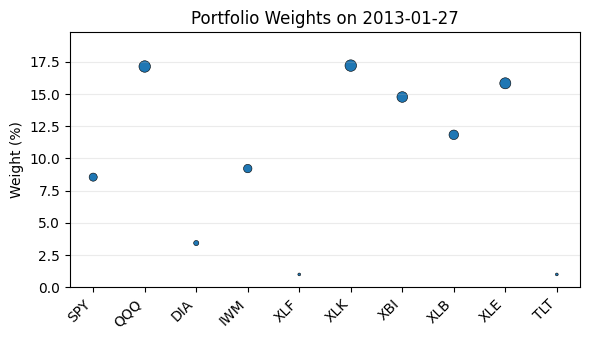


=== Rebalance on 2013-02-24 ===
Optimal portfolio
----------------------
 Investment in SPY : 9.47%
 Investment in QQQ : 17.42%
 Investment in DIA : 4.12%
 Investment in IWM : 10.14%
 Investment in XLF : 1.0%
 Investment in XLK : 14.02%
 Investment in XBI : 9.46%
 Investment in XLB : 13.62%
 Investment in XLE : 16.86%
 Investment in TLT : 3.89%
Cash: 0.0
----------------------
Exp ret = 3.228402573198314%
Expected risk = 0.0011389625341377716%


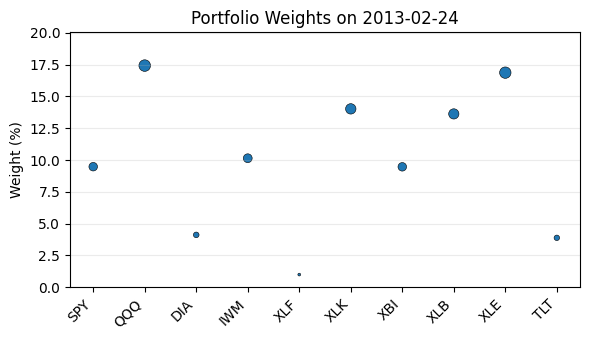


=== Rebalance on 2013-03-24 ===
Optimal portfolio
----------------------
 Investment in SPY : 16.21%
 Investment in QQQ : 14.8%
 Investment in DIA : 6.57%
 Investment in IWM : 12.86%
 Investment in XLF : 1.0%
 Investment in XLK : 12.66%
 Investment in XBI : 3.38%
 Investment in XLB : 13.63%
 Investment in XLE : 13.15%
 Investment in TLT : 5.73%
Cash: 0.0
----------------------
Exp ret = 2.3776293692391723%
Expected risk = 0.00031534008482618915%


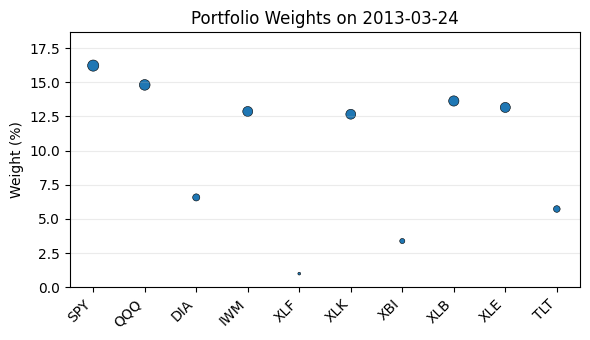


=== Rebalance on 2013-04-21 ===
Optimal portfolio
----------------------
 Investment in SPY : 13.59%
 Investment in QQQ : 6.79%
 Investment in DIA : 7.31%
 Investment in IWM : 11.62%
 Investment in XLF : 19.32%
 Investment in XLK : 24.01%
 Investment in XBI : 1.0%
 Investment in XLB : 1.0%
 Investment in XLE : 11.18%
 Investment in TLT : 4.18%
Cash: 0.0
----------------------
Exp ret = 1.8825567507022194%
Expected risk = 0.0003661429568350682%


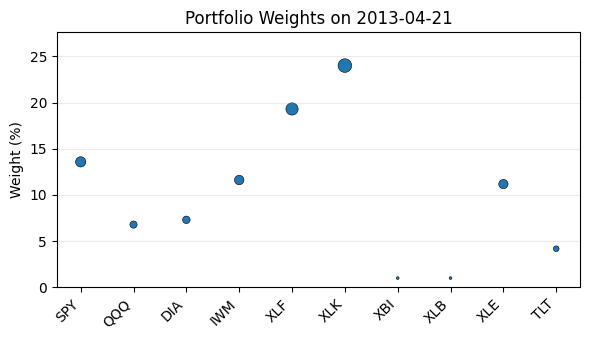


=== Rebalance on 2013-05-19 ===
Optimal portfolio
----------------------
 Investment in SPY : 9.52%
 Investment in QQQ : 9.42%
 Investment in DIA : 11.69%
 Investment in IWM : 11.26%
 Investment in XLF : 1.0%
 Investment in XLK : 20.99%
 Investment in XBI : 6.58%
 Investment in XLB : 3.97%
 Investment in XLE : 16.58%
 Investment in TLT : 8.98%
Cash: 0.0
----------------------
Exp ret = 4.016390574033463%
Expected risk = 0.0011071726843387966%


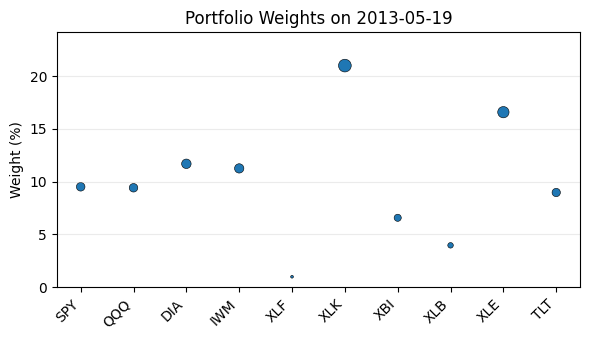


=== Rebalance on 2013-06-16 ===
Optimal portfolio
----------------------
 Investment in SPY : 11.09%
 Investment in QQQ : 10.3%
 Investment in DIA : 12.1%
 Investment in IWM : 11.08%
 Investment in XLF : 1.0%
 Investment in XLK : 15.16%
 Investment in XBI : 7.64%
 Investment in XLB : 4.93%
 Investment in XLE : 16.58%
 Investment in TLT : 10.12%
Cash: 0.0
----------------------
Exp ret = 1.7243850834142098%
Expected risk = 0.0011869850217946336%


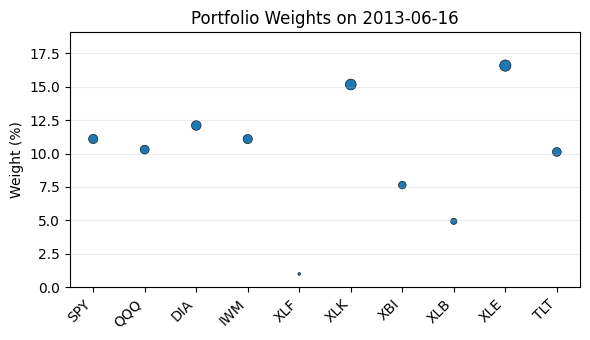


=== Rebalance on 2013-07-14 ===
Optimal portfolio
----------------------
 Investment in SPY : 6.99%
 Investment in QQQ : 16.32%
 Investment in DIA : 12.08%
 Investment in IWM : 8.45%
 Investment in XLF : 1.0%
 Investment in XLK : 18.88%
 Investment in XBI : 3.68%
 Investment in XLB : 8.84%
 Investment in XLE : 14.6%
 Investment in TLT : 9.16%
Cash: 0.0
----------------------
Exp ret = 3.2234341478968345%
Expected risk = 0.001637568786072959%


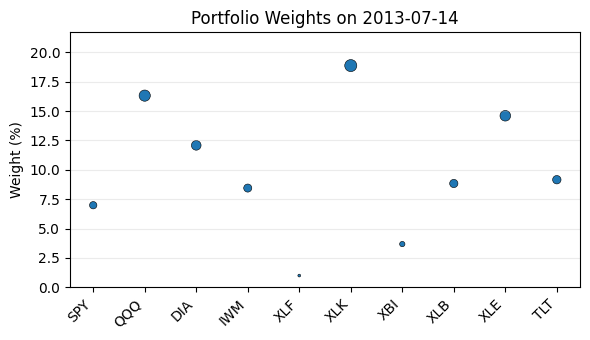


=== Rebalance on 2013-08-11 ===
Optimal portfolio
----------------------
 Investment in SPY : 6.62%
 Investment in QQQ : 16.28%
 Investment in DIA : 12.34%
 Investment in IWM : 9.64%
 Investment in XLF : 1.0%
 Investment in XLK : 19.29%
 Investment in XBI : 9.49%
 Investment in XLB : 7.16%
 Investment in XLE : 11.27%
 Investment in TLT : 6.91%
Cash: 0.0
----------------------
Exp ret = 1.729305259027708%
Expected risk = 0.0015234575860456653%


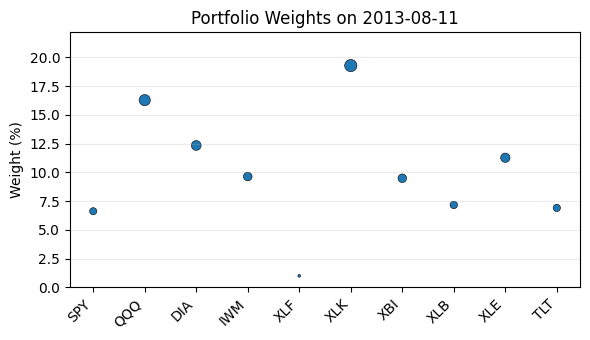


=== Rebalance on 2013-09-08 ===
Optimal portfolio
----------------------
 Investment in SPY : 1.0%
 Investment in QQQ : 10.11%
 Investment in DIA : 14.51%
 Investment in IWM : 6.5%
 Investment in XLF : 1.0%
 Investment in XLK : 36.64%
 Investment in XBI : 9.85%
 Investment in XLB : 9.47%
 Investment in XLE : 4.68%
 Investment in TLT : 6.25%
Cash: 0.0
----------------------
Exp ret = 4.57450331032776%
Expected risk = 0.002325505403385097%


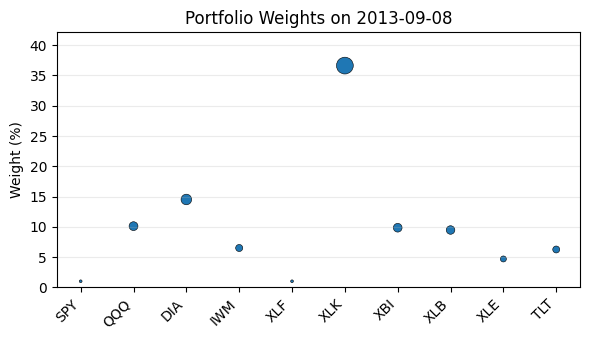


=== Rebalance on 2013-10-06 ===
Optimal portfolio
----------------------
 Investment in SPY : 2.0%
 Investment in QQQ : 11.5%
 Investment in DIA : 18.48%
 Investment in IWM : 7.02%
 Investment in XLF : 2.41%
 Investment in XLK : 21.81%
 Investment in XBI : 16.61%
 Investment in XLB : 7.47%
 Investment in XLE : 1.06%
 Investment in TLT : 11.65%
Cash: 0.0
----------------------
Exp ret = 1.7348029118934905%
Expected risk = 0.0009275594690576709%


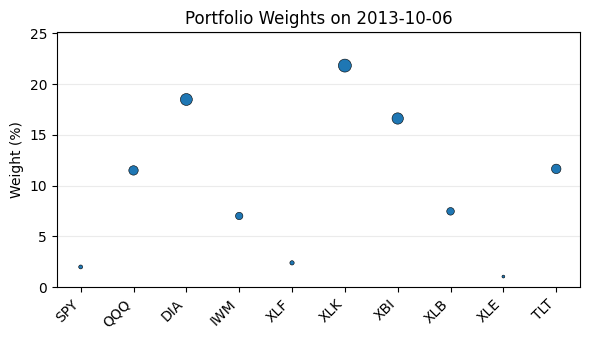


=== Rebalance on 2013-11-03 ===
Optimal portfolio
----------------------
 Investment in SPY : 6.92%
 Investment in QQQ : 12.0%
 Investment in DIA : 16.93%
 Investment in IWM : 11.38%
 Investment in XLF : 5.79%
 Investment in XLK : 7.27%
 Investment in XBI : 12.86%
 Investment in XLB : 10.9%
 Investment in XLE : 5.36%
 Investment in TLT : 10.57%
Cash: 0.0
----------------------
Exp ret = 2.4233558350869333%
Expected risk = 0.0006445780082481518%


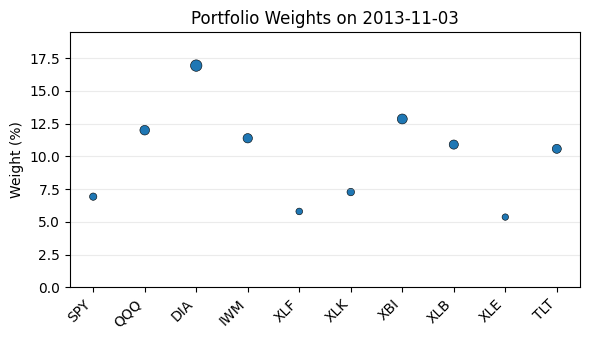


=== Rebalance on 2013-12-01 ===
Optimal portfolio
----------------------
 Investment in SPY : 8.75%
 Investment in QQQ : 14.67%
 Investment in DIA : 17.37%
 Investment in IWM : 12.68%
 Investment in XLF : 2.18%
 Investment in XLK : 3.54%
 Investment in XBI : 9.69%
 Investment in XLB : 5.76%
 Investment in XLE : 11.52%
 Investment in TLT : 13.84%
Cash: 0.0
----------------------
Exp ret = 2.570498363319636%
Expected risk = 0.0003365396345087581%


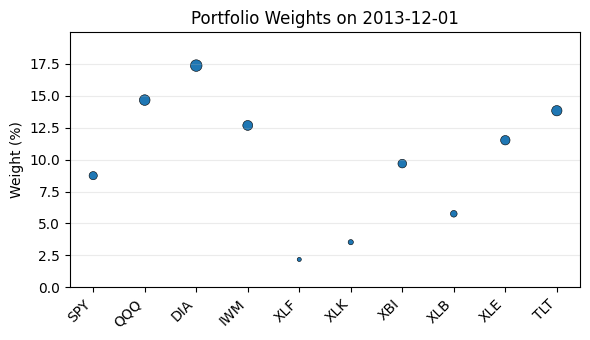


=== Rebalance on 2013-12-29 ===
Optimal portfolio
----------------------
 Investment in SPY : 11.46%
 Investment in QQQ : 8.24%
 Investment in DIA : 15.03%
 Investment in IWM : 11.21%
 Investment in XLF : 1.0%
 Investment in XLK : 12.07%
 Investment in XBI : 11.74%
 Investment in XLB : 5.44%
 Investment in XLE : 9.84%
 Investment in TLT : 13.99%
Cash: 0.0
----------------------
Exp ret = 3.1466733441410946%
Expected risk = 0.0007755547429914156%


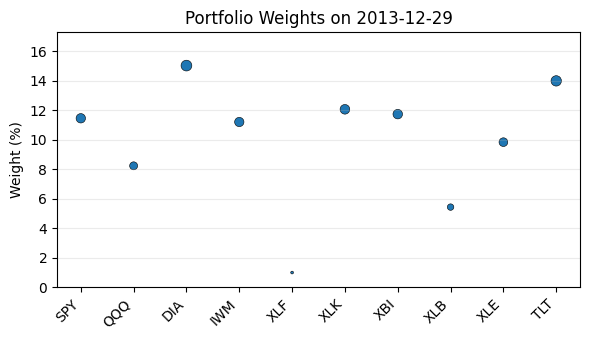


=== Rebalance on 2014-01-26 ===
Optimal portfolio
----------------------
 Investment in SPY : 3.5%
 Investment in QQQ : 8.71%
 Investment in DIA : 11.01%
 Investment in IWM : 3.87%
 Investment in XLF : 9.91%
 Investment in XLK : 47.39%
 Investment in XBI : 1.48%
 Investment in XLB : 1.0%
 Investment in XLE : 4.28%
 Investment in TLT : 8.85%
Cash: 0.0
----------------------
Exp ret = 5.694660963848107%
Expected risk = 0.0038817744278821305%


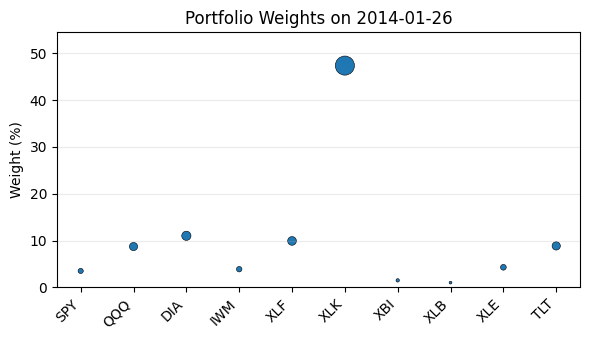


=== Rebalance on 2014-02-23 ===
Optimal portfolio
----------------------
 Investment in SPY : 2.28%
 Investment in QQQ : 6.31%
 Investment in DIA : 9.66%
 Investment in IWM : 4.75%
 Investment in XLF : 9.75%
 Investment in XLK : 45.03%
 Investment in XBI : 10.16%
 Investment in XLB : 1.83%
 Investment in XLE : 2.56%
 Investment in TLT : 7.67%
Cash: 0.0
----------------------
Exp ret = 5.342470317197687%
Expected risk = 0.003859385744839583%


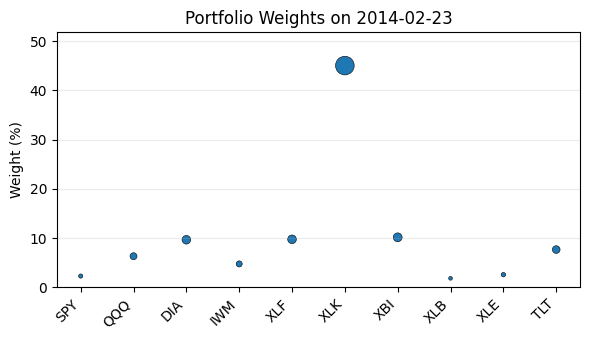


=== Rebalance on 2014-03-23 ===
Optimal portfolio
----------------------
 Investment in SPY : 1.63%
 Investment in QQQ : 8.87%
 Investment in DIA : 8.45%
 Investment in IWM : 6.09%
 Investment in XLF : 14.84%
 Investment in XLK : 31.59%
 Investment in XBI : 9.46%
 Investment in XLB : 3.2%
 Investment in XLE : 7.37%
 Investment in TLT : 8.5%
Cash: 0.0
----------------------
Exp ret = 3.0164988391421104%
Expected risk = 0.002014695588717785%


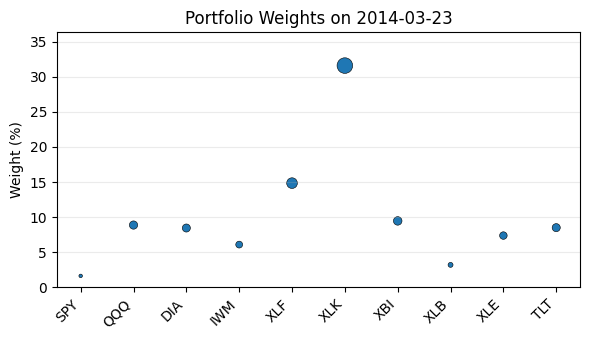


=== Rebalance on 2014-04-20 ===
Optimal portfolio
----------------------
 Investment in SPY : 11.3%
 Investment in QQQ : 4.32%
 Investment in DIA : 3.55%
 Investment in IWM : 11.53%
 Investment in XLF : 8.35%
 Investment in XLK : 1.0%
 Investment in XBI : 17.17%
 Investment in XLB : 23.25%
 Investment in XLE : 9.99%
 Investment in TLT : 9.55%
Cash: 0.0
----------------------
Exp ret = 2.2704603595545514%
Expected risk = 0.0009436601168205036%


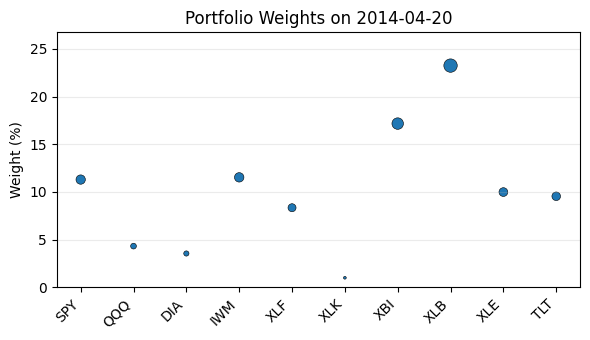


=== Rebalance on 2014-05-18 ===
Optimal portfolio
----------------------
 Investment in SPY : 10.59%
 Investment in QQQ : 1.0%
 Investment in DIA : 4.2%
 Investment in IWM : 10.84%
 Investment in XLF : 18.92%
 Investment in XLK : 1.0%
 Investment in XBI : 12.22%
 Investment in XLB : 20.95%
 Investment in XLE : 9.51%
 Investment in TLT : 10.78%
Cash: 0.0
----------------------
Exp ret = 1.068703066677028%
Expected risk = 0.0004787246669071464%


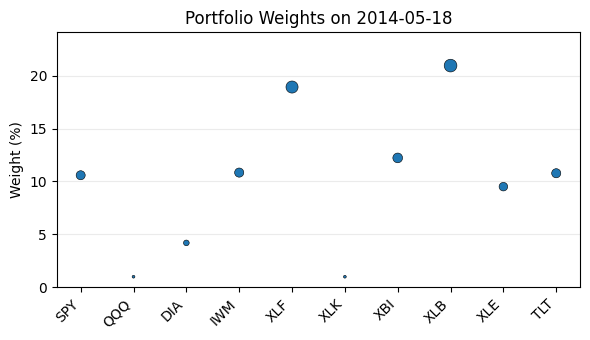


=== Rebalance on 2014-06-15 ===
Optimal portfolio
----------------------
 Investment in SPY : 6.98%
 Investment in QQQ : 3.39%
 Investment in DIA : 11.71%
 Investment in IWM : 9.32%
 Investment in XLF : 8.08%
 Investment in XLK : 14.75%
 Investment in XBI : 10.13%
 Investment in XLB : 19.49%
 Investment in XLE : 4.97%
 Investment in TLT : 11.19%
Cash: 0.0
----------------------
Exp ret = 2.2678813590206417%
Expected risk = 0.000870532282013685%


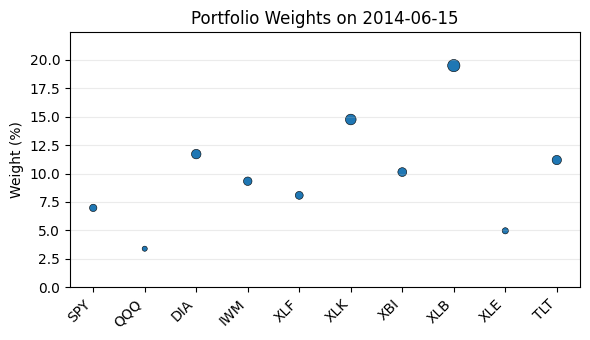


=== Rebalance on 2014-07-13 ===
Optimal portfolio
----------------------
 Investment in SPY : 4.77%
 Investment in QQQ : 3.34%
 Investment in DIA : 16.43%
 Investment in IWM : 8.2%
 Investment in XLF : 3.5%
 Investment in XLK : 29.07%
 Investment in XBI : 7.7%
 Investment in XLB : 7.98%
 Investment in XLE : 4.95%
 Investment in TLT : 14.05%
Cash: 0.0
----------------------
Exp ret = 3.7954021680551344%
Expected risk = 0.0009322309703555401%


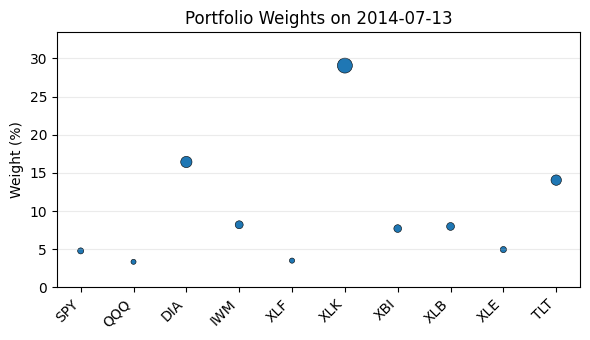


=== Rebalance on 2014-08-10 ===
Optimal portfolio
----------------------
 Investment in SPY : 3.22%
 Investment in QQQ : 3.94%
 Investment in DIA : 13.64%
 Investment in IWM : 6.72%
 Investment in XLF : 10.0%
 Investment in XLK : 30.87%
 Investment in XBI : 6.26%
 Investment in XLB : 8.28%
 Investment in XLE : 6.56%
 Investment in TLT : 10.53%
Cash: 0.0
----------------------
Exp ret = 2.692098404681051%
Expected risk = 0.0012218001331858336%


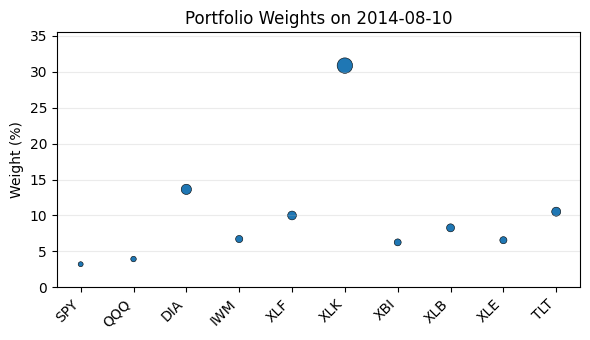


=== Rebalance on 2014-09-07 ===
Optimal portfolio
----------------------
 Investment in SPY : 7.96%
 Investment in QQQ : 2.48%
 Investment in DIA : 18.79%
 Investment in IWM : 10.33%
 Investment in XLF : 12.49%
 Investment in XLK : 11.4%
 Investment in XBI : 9.26%
 Investment in XLB : 1.0%
 Investment in XLE : 10.39%
 Investment in TLT : 15.9%
Cash: 0.0
----------------------
Exp ret = 1.622545800273887%
Expected risk = 0.0005843558456360475%


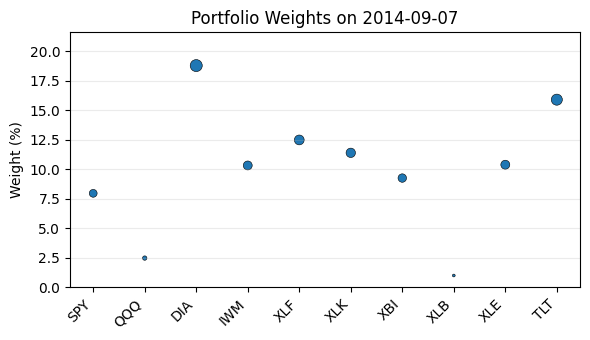


=== Rebalance on 2014-10-05 ===
Optimal portfolio
----------------------
 Investment in SPY : 8.05%
 Investment in QQQ : 1.0%
 Investment in DIA : 12.09%
 Investment in IWM : 7.63%
 Investment in XLF : 13.76%
 Investment in XLK : 32.36%
 Investment in XBI : 3.25%
 Investment in XLB : 1.0%
 Investment in XLE : 11.61%
 Investment in TLT : 9.26%
Cash: 0.0
----------------------
Exp ret = 1.9737982575476474%
Expected risk = 0.0008040539538570729%


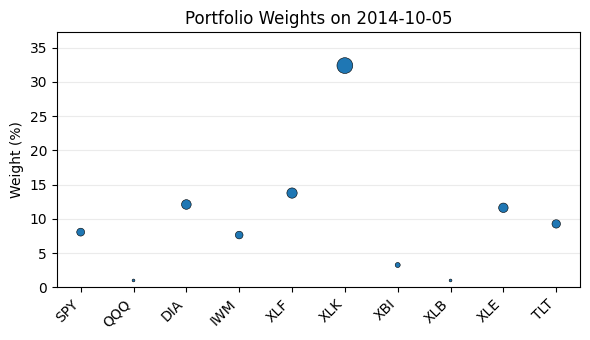


=== Rebalance on 2014-11-02 ===
Optimal portfolio
----------------------
 Investment in SPY : 12.27%
 Investment in QQQ : 8.95%
 Investment in DIA : 11.28%
 Investment in IWM : 9.97%
 Investment in XLF : 8.75%
 Investment in XLK : 22.28%
 Investment in XBI : 1.0%
 Investment in XLB : 1.0%
 Investment in XLE : 14.44%
 Investment in TLT : 10.06%
Cash: 0.0
----------------------
Exp ret = 2.0651679546256596%
Expected risk = 0.0018743657927726043%


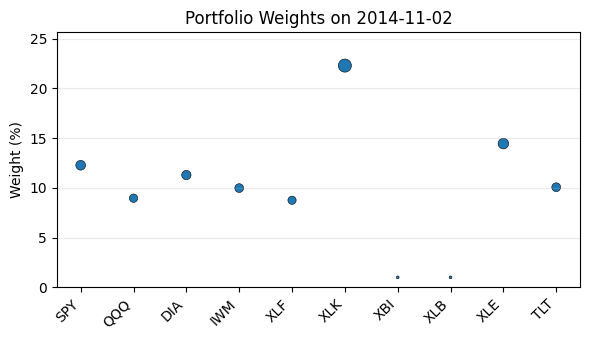


=== Rebalance on 2014-11-30 ===
Optimal portfolio
----------------------
 Investment in SPY : 10.73%
 Investment in QQQ : 3.48%
 Investment in DIA : 12.97%
 Investment in IWM : 9.14%
 Investment in XLF : 17.78%
 Investment in XLK : 22.54%
 Investment in XBI : 1.0%
 Investment in XLB : 1.0%
 Investment in XLE : 9.58%
 Investment in TLT : 11.78%
Cash: 0.0
----------------------
Exp ret = 2.711764915747077%
Expected risk = 0.0014039092086087306%


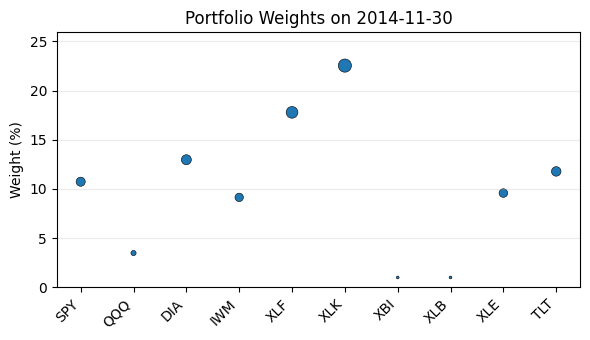


=== Rebalance on 2014-12-28 ===
Optimal portfolio
----------------------
 Investment in SPY : 6.72%
 Investment in QQQ : 15.7%
 Investment in DIA : 10.0%
 Investment in IWM : 7.25%
 Investment in XLF : 1.0%
 Investment in XLK : 36.33%
 Investment in XBI : 2.35%
 Investment in XLB : 1.0%
 Investment in XLE : 9.24%
 Investment in TLT : 10.41%
Cash: 0.0
----------------------
Exp ret = 6.104434805915835%
Expected risk = 0.001489564546936207%


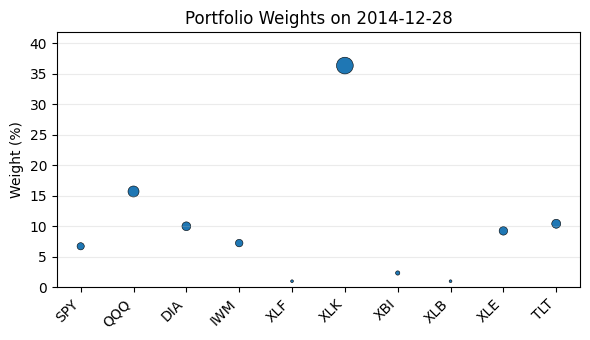


=== Rebalance on 2015-01-25 ===
Optimal portfolio
----------------------
 Investment in SPY : 5.11%
 Investment in QQQ : 6.12%
 Investment in DIA : 8.61%
 Investment in IWM : 5.67%
 Investment in XLF : 26.6%
 Investment in XLK : 35.04%
 Investment in XBI : 3.41%
 Investment in XLB : 1.0%
 Investment in XLE : 1.44%
 Investment in TLT : 6.99%
Cash: 0.0
----------------------
Exp ret = 3.7403709380584003%
Expected risk = 0.0003479734073651751%


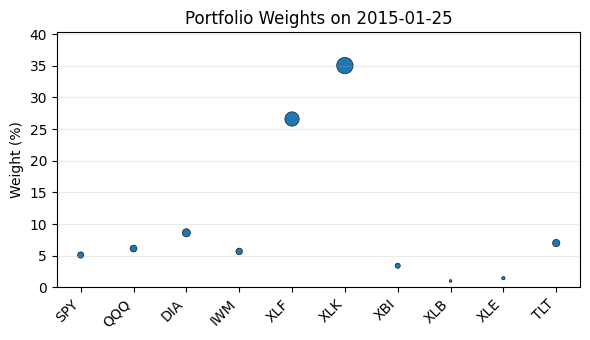


=== Rebalance on 2015-02-22 ===
Optimal portfolio
----------------------
 Investment in SPY : 4.54%
 Investment in QQQ : 10.14%
 Investment in DIA : 8.06%
 Investment in IWM : 6.05%
 Investment in XLF : 13.38%
 Investment in XLK : 33.36%
 Investment in XBI : 11.31%
 Investment in XLB : 4.82%
 Investment in XLE : 1.0%
 Investment in TLT : 7.34%
Cash: 0.0
----------------------
Exp ret = 3.0710079454616377%
Expected risk = 0.000764492572525068%


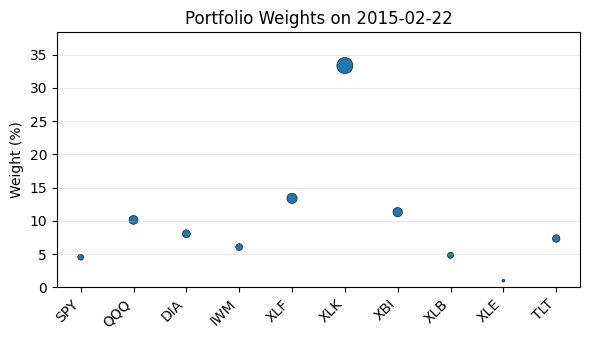


=== Rebalance on 2015-03-22 ===
Optimal portfolio
----------------------
 Investment in SPY : 5.36%
 Investment in QQQ : 12.25%
 Investment in DIA : 11.09%
 Investment in IWM : 5.88%
 Investment in XLF : 9.38%
 Investment in XLK : 42.24%
 Investment in XBI : 4.04%
 Investment in XLB : 1.0%
 Investment in XLE : 1.74%
 Investment in TLT : 7.02%
Cash: 0.0
----------------------
Exp ret = 4.3355833934796255%
Expected risk = 0.0005946753480028309%


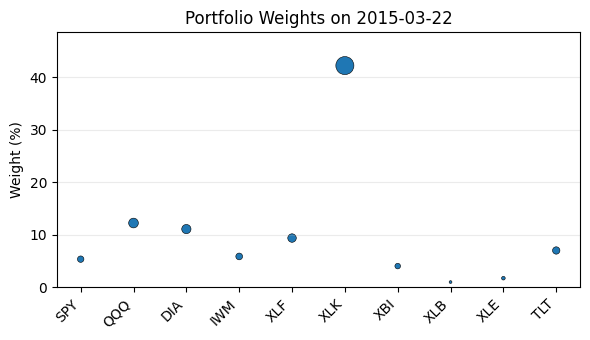


=== Rebalance on 2015-04-19 ===
Optimal portfolio
----------------------
 Investment in SPY : 6.57%
 Investment in QQQ : 12.97%
 Investment in DIA : 7.85%
 Investment in IWM : 7.36%
 Investment in XLF : 1.0%
 Investment in XLK : 26.53%
 Investment in XBI : 7.15%
 Investment in XLB : 15.53%
 Investment in XLE : 8.44%
 Investment in TLT : 6.59%
Cash: 0.0
----------------------
Exp ret = 3.1708238463640313%
Expected risk = 0.0011849876463820256%


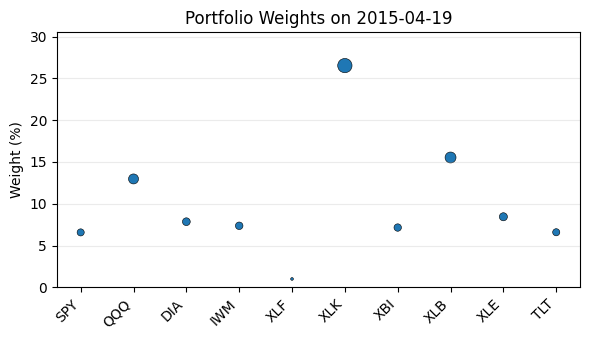


=== Rebalance on 2015-05-17 ===
Optimal portfolio
----------------------
 Investment in SPY : 9.3%
 Investment in QQQ : 9.66%
 Investment in DIA : 9.86%
 Investment in IWM : 9.92%
 Investment in XLF : 1.0%
 Investment in XLK : 17.93%
 Investment in XBI : 8.91%
 Investment in XLB : 13.14%
 Investment in XLE : 11.02%
 Investment in TLT : 9.26%
Cash: 0.0
----------------------
Exp ret = 0.8729318819491371%
Expected risk = 0.0009646308392616987%


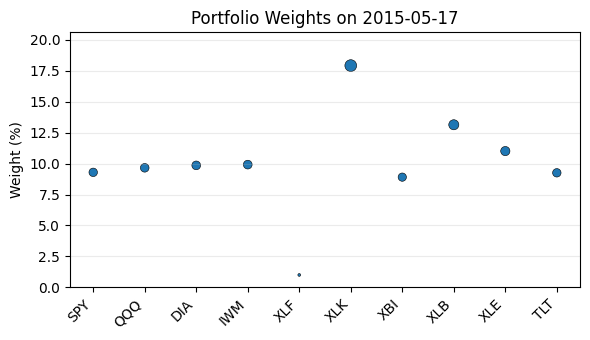


=== Rebalance on 2015-06-14 ===
Optimal portfolio
----------------------
 Investment in SPY : 7.72%
 Investment in QQQ : 9.43%
 Investment in DIA : 10.26%
 Investment in IWM : 8.56%
 Investment in XLF : 1.0%
 Investment in XLK : 21.51%
 Investment in XBI : 11.06%
 Investment in XLB : 6.6%
 Investment in XLE : 13.33%
 Investment in TLT : 10.52%
Cash: 0.0
----------------------
Exp ret = 1.567623167701412%
Expected risk = 0.0005953173617537556%


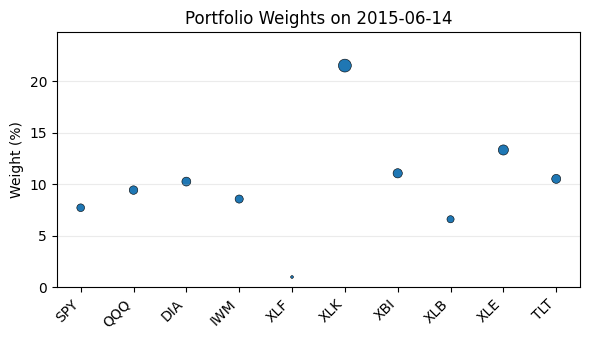


=== Rebalance on 2015-07-12 ===
Optimal portfolio
----------------------
 Investment in SPY : 11.0%
 Investment in QQQ : 11.18%
 Investment in DIA : 8.81%
 Investment in IWM : 10.56%
 Investment in XLF : 1.0%
 Investment in XLK : 27.39%
 Investment in XBI : 5.14%
 Investment in XLB : 1.0%
 Investment in XLE : 16.93%
 Investment in TLT : 7.0%
Cash: 0.0
----------------------
Exp ret = 0.5437131770839834%
Expected risk = 0.0007856883973111001%


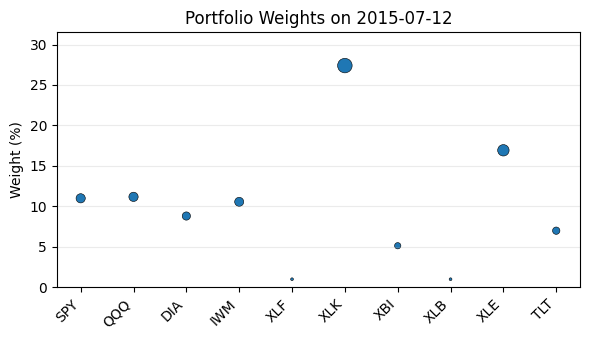


=== Rebalance on 2015-08-09 ===
Optimal portfolio
----------------------
 Investment in SPY : 5.55%
 Investment in QQQ : 7.5%
 Investment in DIA : 13.31%
 Investment in IWM : 9.94%
 Investment in XLF : 20.76%
 Investment in XLK : 16.22%
 Investment in XBI : 1.0%
 Investment in XLB : 1.0%
 Investment in XLE : 16.91%
 Investment in TLT : 7.82%
Cash: 0.0
----------------------
Exp ret = 0.15834975983323912%
Expected risk = 0.0009227580820738424%


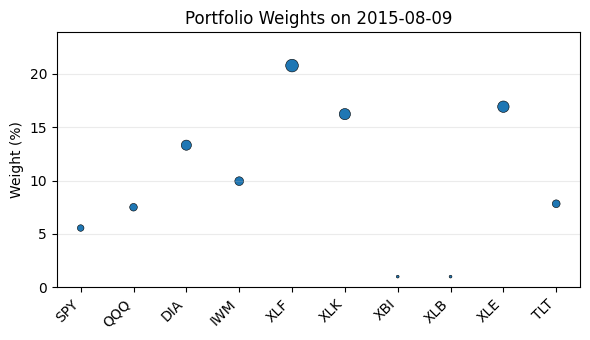


=== Rebalance on 2015-09-06 ===
Optimal portfolio
----------------------
 Investment in SPY : 7.97%
 Investment in QQQ : 5.18%
 Investment in DIA : 13.63%
 Investment in IWM : 11.06%
 Investment in XLF : 33.75%
 Investment in XLK : 2.14%
 Investment in XBI : 1.0%
 Investment in XLB : 1.0%
 Investment in XLE : 11.36%
 Investment in TLT : 12.91%
Cash: 0.0
----------------------
Exp ret = -1.5632557826813196%
Expected risk = 0.0010835682153015498%


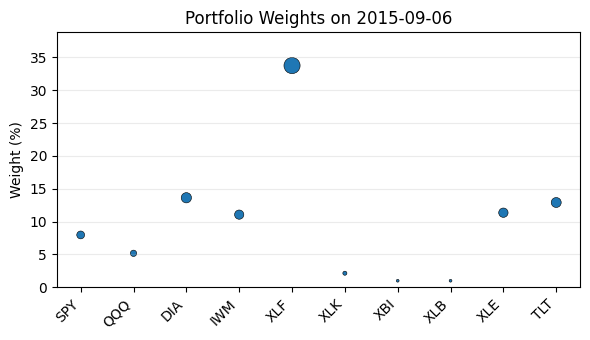


=== Rebalance on 2015-10-04 ===
Optimal portfolio
----------------------
 Investment in SPY : 10.43%
 Investment in QQQ : 3.79%
 Investment in DIA : 10.62%
 Investment in IWM : 11.39%
 Investment in XLF : 36.56%
 Investment in XLK : 1.0%
 Investment in XBI : 1.85%
 Investment in XLB : 5.12%
 Investment in XLE : 6.91%
 Investment in TLT : 12.32%
Cash: 0.0
----------------------
Exp ret = -1.3412983303295725%
Expected risk = 0.0007635732580950025%


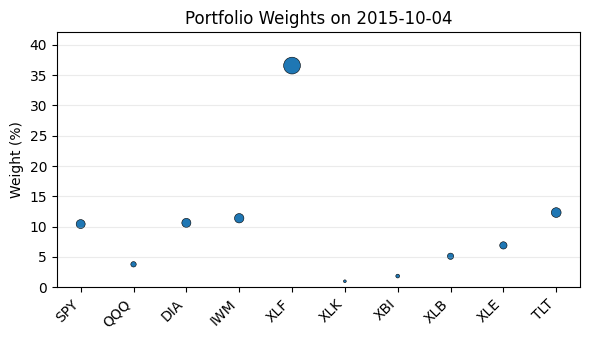


=== Rebalance on 2015-11-01 ===
Optimal portfolio
----------------------
 Investment in SPY : 13.86%
 Investment in QQQ : 4.46%
 Investment in DIA : 16.05%
 Investment in IWM : 10.91%
 Investment in XLF : 13.27%
 Investment in XLK : 1.0%
 Investment in XBI : 10.4%
 Investment in XLB : 9.23%
 Investment in XLE : 3.73%
 Investment in TLT : 17.09%
Cash: 0.0
----------------------
Exp ret = 0.38065703607843%
Expected risk = 0.0025641581567300235%


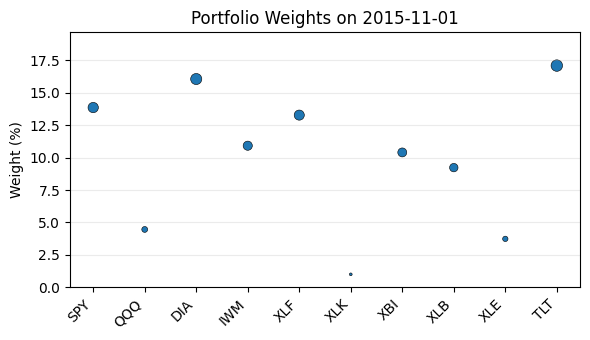


=== Rebalance on 2015-11-29 ===
Optimal portfolio
----------------------
 Investment in SPY : 14.63%
 Investment in QQQ : 6.56%
 Investment in DIA : 14.08%
 Investment in IWM : 11.62%
 Investment in XLF : 1.24%
 Investment in XLK : 1.0%
 Investment in XBI : 11.81%
 Investment in XLB : 12.8%
 Investment in XLE : 11.44%
 Investment in TLT : 14.81%
Cash: 0.0
----------------------
Exp ret = 2.7887162258679496%
Expected risk = 0.0020304540894516606%


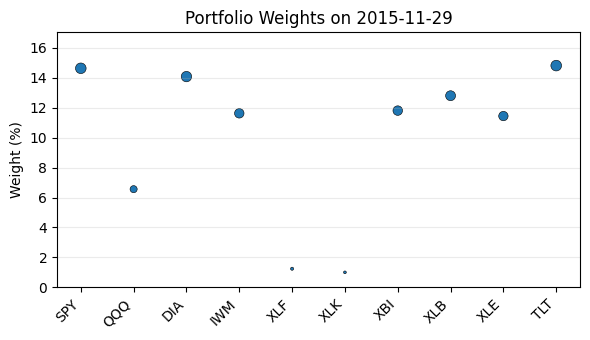


=== Rebalance on 2015-12-27 ===
Optimal portfolio
----------------------
 Investment in SPY : 10.58%
 Investment in QQQ : 2.65%
 Investment in DIA : 15.33%
 Investment in IWM : 9.69%
 Investment in XLF : 7.58%
 Investment in XLK : 22.07%
 Investment in XBI : 6.26%
 Investment in XLB : 1.0%
 Investment in XLE : 11.62%
 Investment in TLT : 13.22%
Cash: 0.0
----------------------
Exp ret = 1.8454234206642546%
Expected risk = 0.0022949826512597906%


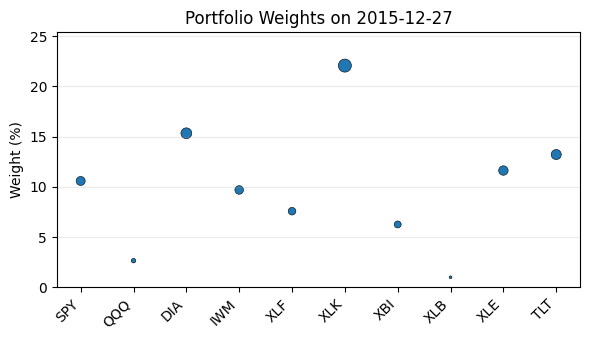


=== Rebalance on 2016-01-24 ===
Optimal portfolio
----------------------
 Investment in SPY : 11.05%
 Investment in QQQ : 1.56%
 Investment in DIA : 11.82%
 Investment in IWM : 12.87%
 Investment in XLF : 41.32%
 Investment in XLK : 1.0%
 Investment in XBI : 2.02%
 Investment in XLB : 1.0%
 Investment in XLE : 3.92%
 Investment in TLT : 13.43%
Cash: 0.0
----------------------
Exp ret = -1.1966309423074313%
Expected risk = 0.0008659122603348289%


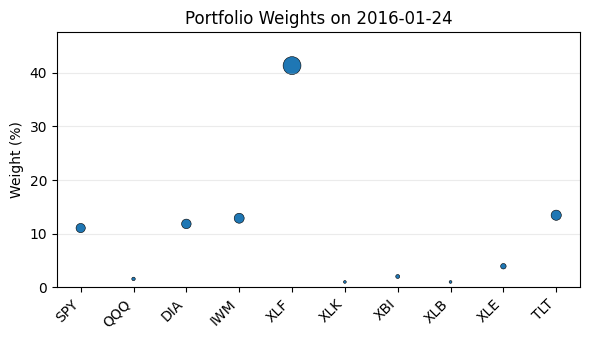


=== Rebalance on 2016-02-21 ===
Optimal portfolio
----------------------
 Investment in SPY : 11.65%
 Investment in QQQ : 1.0%
 Investment in DIA : 5.17%
 Investment in IWM : 11.92%
 Investment in XLF : 44.14%
 Investment in XLK : 1.0%
 Investment in XBI : 7.65%
 Investment in XLB : 5.36%
 Investment in XLE : 1.0%
 Investment in TLT : 11.1%
Cash: 0.0
----------------------
Exp ret = -0.42123247193534935%
Expected risk = 0.0007300582106440836%


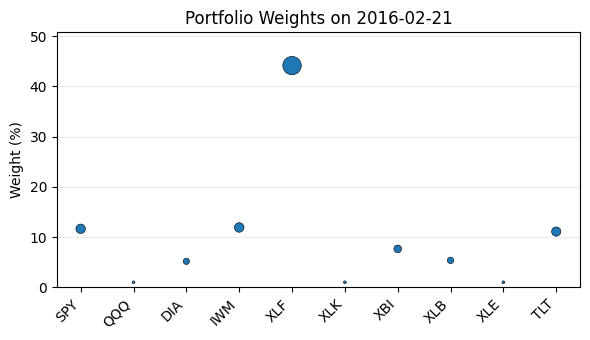


=== Rebalance on 2016-03-20 ===
Optimal portfolio
----------------------
 Investment in SPY : 11.33%
 Investment in QQQ : 3.77%
 Investment in DIA : 1.54%
 Investment in IWM : 9.28%
 Investment in XLF : 24.63%
 Investment in XLK : 1.0%
 Investment in XBI : 17.4%
 Investment in XLB : 18.04%
 Investment in XLE : 1.0%
 Investment in TLT : 11.99%
Cash: 0.0
----------------------
Exp ret = 1.4249252905876857%
Expected risk = 0.001937674138342996%


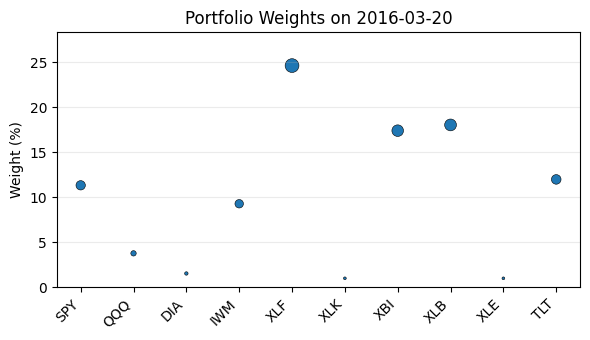


=== Rebalance on 2016-04-17 ===
Optimal portfolio
----------------------
 Investment in SPY : 10.08%
 Investment in QQQ : 9.98%
 Investment in DIA : 5.23%
 Investment in IWM : 7.32%
 Investment in XLF : 2.64%
 Investment in XLK : 15.16%
 Investment in XBI : 26.96%
 Investment in XLB : 11.11%
 Investment in XLE : 3.75%
 Investment in TLT : 7.77%
Cash: 0.0
----------------------
Exp ret = 4.28507242077192%
Expected risk = 0.0013565771806093399%


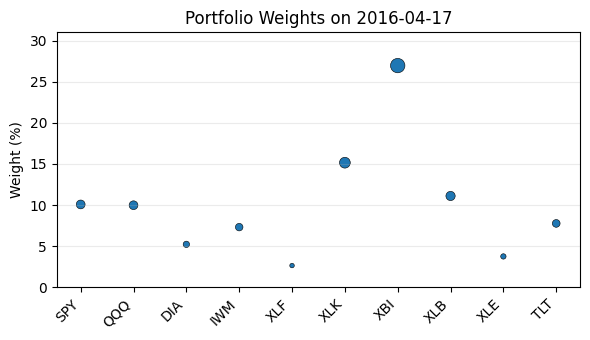


=== Rebalance on 2016-05-15 ===
Optimal portfolio
----------------------
 Investment in SPY : 9.8%
 Investment in QQQ : 10.71%
 Investment in DIA : 3.79%
 Investment in IWM : 9.19%
 Investment in XLF : 4.5%
 Investment in XLK : 4.26%
 Investment in XBI : 16.01%
 Investment in XLB : 24.14%
 Investment in XLE : 12.83%
 Investment in TLT : 4.77%
Cash: 0.0
----------------------
Exp ret = 3.005625676154669%
Expected risk = 0.0012973540945128755%


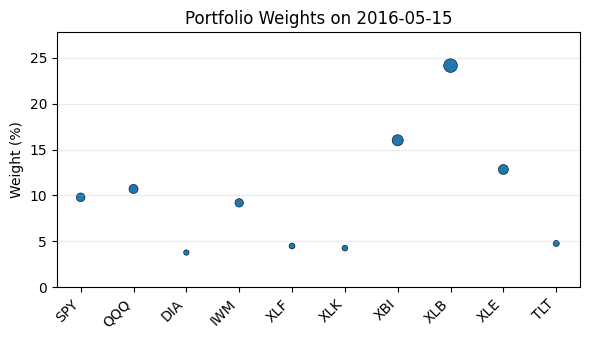


=== Rebalance on 2016-06-12 ===
Optimal portfolio
----------------------
 Investment in SPY : 5.28%
 Investment in QQQ : 15.45%
 Investment in DIA : 3.32%
 Investment in IWM : 6.69%
 Investment in XLF : 10.18%
 Investment in XLK : 20.02%
 Investment in XBI : 13.13%
 Investment in XLB : 16.59%
 Investment in XLE : 7.28%
 Investment in TLT : 2.08%
Cash: 0.0
----------------------
Exp ret = 2.70833577664669%
Expected risk = 0.0012834868296626761%


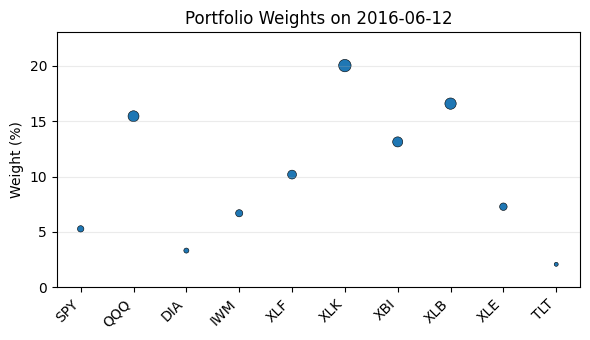


=== Rebalance on 2016-07-10 ===
Optimal portfolio
----------------------
 Investment in SPY : 8.51%
 Investment in QQQ : 10.28%
 Investment in DIA : 8.67%
 Investment in IWM : 10.19%
 Investment in XLF : 28.44%
 Investment in XLK : 6.19%
 Investment in XBI : 6.21%
 Investment in XLB : 9.51%
 Investment in XLE : 2.17%
 Investment in TLT : 9.84%
Cash: 0.0
----------------------
Exp ret = 1.6986479633635043%
Expected risk = 0.0008253202639170412%


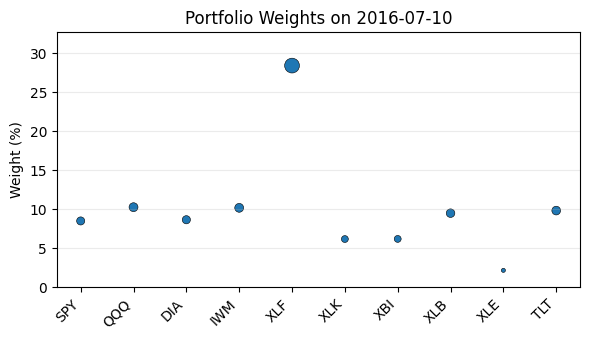


=== Rebalance on 2016-08-07 ===
Optimal portfolio
----------------------
 Investment in SPY : 7.29%
 Investment in QQQ : 14.6%
 Investment in DIA : 12.53%
 Investment in IWM : 7.27%
 Investment in XLF : 7.8%
 Investment in XLK : 26.83%
 Investment in XBI : 6.27%
 Investment in XLB : 1.07%
 Investment in XLE : 2.44%
 Investment in TLT : 13.9%
Cash: 0.0
----------------------
Exp ret = 4.099738449036844%
Expected risk = 0.001717097489408897%


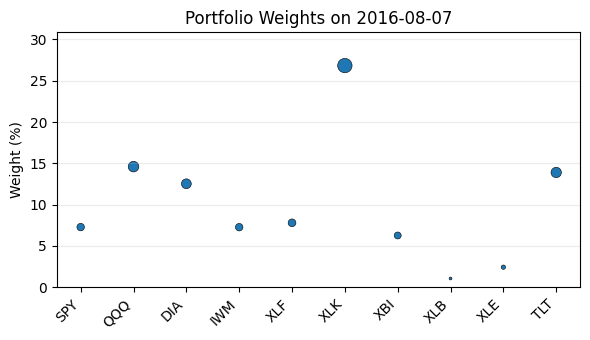


=== Rebalance on 2016-09-04 ===
Optimal portfolio
----------------------
 Investment in SPY : 6.12%
 Investment in QQQ : 13.73%
 Investment in DIA : 14.44%
 Investment in IWM : 7.69%
 Investment in XLF : 1.82%
 Investment in XLK : 18.74%
 Investment in XBI : 5.45%
 Investment in XLB : 4.2%
 Investment in XLE : 12.85%
 Investment in TLT : 14.96%
Cash: 0.0
----------------------
Exp ret = 3.347211144616946%
Expected risk = 0.0008739998203008902%


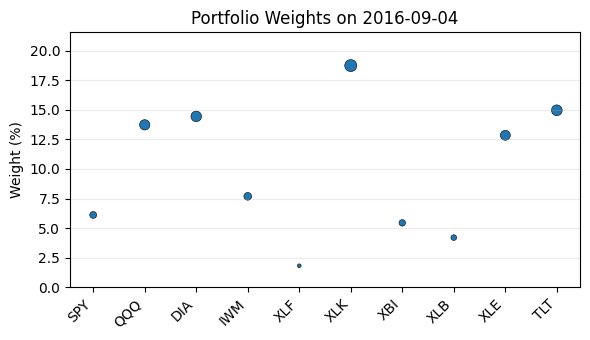


=== Rebalance on 2016-10-02 ===
Optimal portfolio
----------------------
 Investment in SPY : 2.77%
 Investment in QQQ : 10.34%
 Investment in DIA : 14.96%
 Investment in IWM : 4.94%
 Investment in XLF : 3.43%
 Investment in XLK : 31.21%
 Investment in XBI : 1.0%
 Investment in XLB : 9.57%
 Investment in XLE : 6.55%
 Investment in TLT : 15.24%
Cash: 0.0
----------------------
Exp ret = 2.8039186425343923%
Expected risk = 0.000709247452123246%


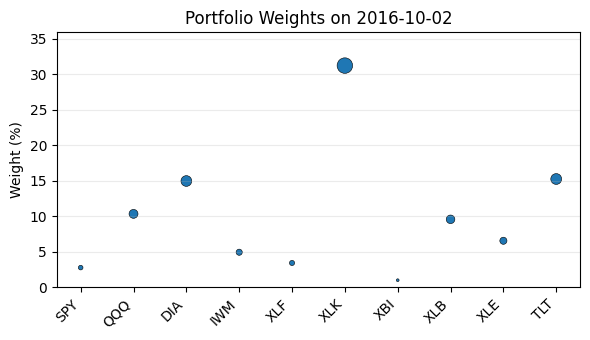


=== Rebalance on 2016-10-30 ===
Optimal portfolio
----------------------
 Investment in SPY : 10.02%
 Investment in QQQ : 7.5%
 Investment in DIA : 13.65%
 Investment in IWM : 9.2%
 Investment in XLF : 1.17%
 Investment in XLK : 1.0%
 Investment in XBI : 7.73%
 Investment in XLB : 16.5%
 Investment in XLE : 17.84%
 Investment in TLT : 15.38%
Cash: 0.0
----------------------
Exp ret = -0.004768479505927307%
Expected risk = 0.00036104778556422833%


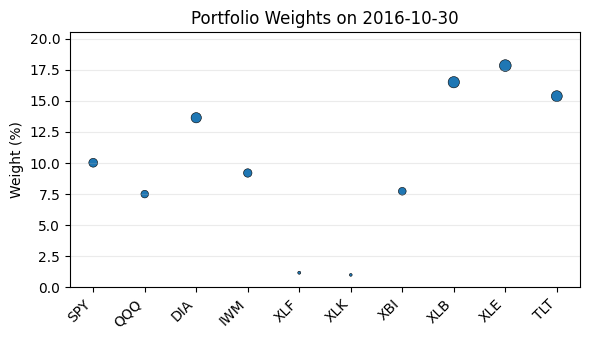


=== Rebalance on 2016-11-27 ===
Optimal portfolio
----------------------
 Investment in SPY : 9.75%
 Investment in QQQ : 16.44%
 Investment in DIA : 6.67%
 Investment in IWM : 6.48%
 Investment in XLF : 1.0%
 Investment in XLK : 12.43%
 Investment in XBI : 7.68%
 Investment in XLB : 8.12%
 Investment in XLE : 24.11%
 Investment in TLT : 7.32%
Cash: 0.0
----------------------
Exp ret = 3.3251474915724173%
Expected risk = 0.00318701355532133%


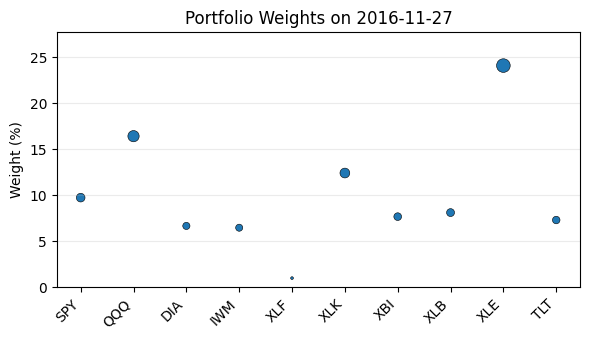


=== Performance 2012 ===
Average Monthly Return   : -0.22%
Monthly Sharpe Ratio     : -0.070
Annualized Sharpe Ratio  : -0.243
Maximum Drawdown         : 8.15%

=== Performance 2013 ===
Average Monthly Return   : 1.69%
Monthly Sharpe Ratio     : 0.634
Annualized Sharpe Ratio  : 2.195
Maximum Drawdown         : 1.77%

=== Performance 2014 ===
Average Monthly Return   : 1.17%
Monthly Sharpe Ratio     : 0.460
Annualized Sharpe Ratio  : 1.594
Maximum Drawdown         : 5.27%

=== Performance 2015 ===
Average Monthly Return   : -0.97%
Monthly Sharpe Ratio     : -0.240
Annualized Sharpe Ratio  : -0.830
Maximum Drawdown         : 22.12%

=== Performance 2016 ===
Average Monthly Return   : 2.13%
Monthly Sharpe Ratio     : 0.650
Annualized Sharpe Ratio  : 2.253
Maximum Drawdown         : 2.98%


In [29]:
# Run for L1, L2, or PBR
print("Testing L1 Regularization:")
rebalance_with_regularization(reg_type="L1", gamma=0.02, verbose=True);


Testing L2 Regularization:


[*********************100%***********************]  10 of 10 completed



=== Rebalance on 2012-03-25 ===
Optimal portfolio
----------------------
 Investment in SPY : 6.36%
 Investment in QQQ : 10.56%
 Investment in DIA : 16.07%
 Investment in IWM : 9.92%
 Investment in XLF : 1.0%
 Investment in XLK : 12.97%
 Investment in XBI : 6.53%
 Investment in XLB : 3.0%
 Investment in XLE : 17.65%
 Investment in TLT : 15.95%
Cash: 0.0
----------------------
Exp ret = 4.540877597196332%
Expected risk = 0.0006332302080838808%


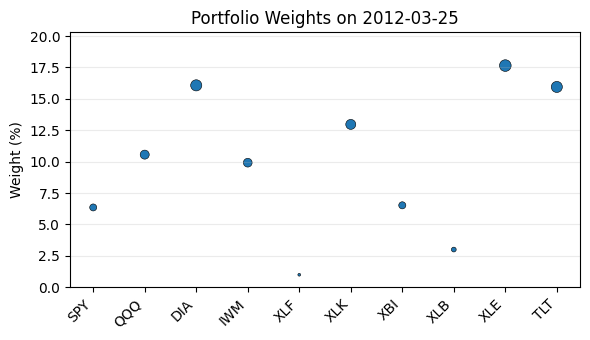


=== Rebalance on 2012-04-22 ===
Optimal portfolio
----------------------
 Investment in SPY : 10.91%
 Investment in QQQ : 6.0%
 Investment in DIA : 15.34%
 Investment in IWM : 12.21%
 Investment in XLF : 11.03%
 Investment in XLK : 6.9%
 Investment in XBI : 5.65%
 Investment in XLB : 4.03%
 Investment in XLE : 12.64%
 Investment in TLT : 15.28%
Cash: 0.0
----------------------
Exp ret = 0.8437580056552157%
Expected risk = 0.00035357686911078787%


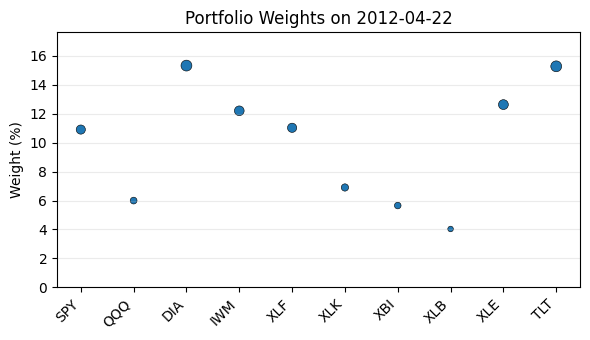


=== Rebalance on 2012-05-20 ===
Optimal portfolio
----------------------
 Investment in SPY : 10.6%
 Investment in QQQ : 8.08%
 Investment in DIA : 8.74%
 Investment in IWM : 9.89%
 Investment in XLF : 23.99%
 Investment in XLK : 18.02%
 Investment in XBI : 2.19%
 Investment in XLB : 1.0%
 Investment in XLE : 7.71%
 Investment in TLT : 9.77%
Cash: 0.0
----------------------
Exp ret = -0.43328493791620026%
Expected risk = 0.0008992482054990461%


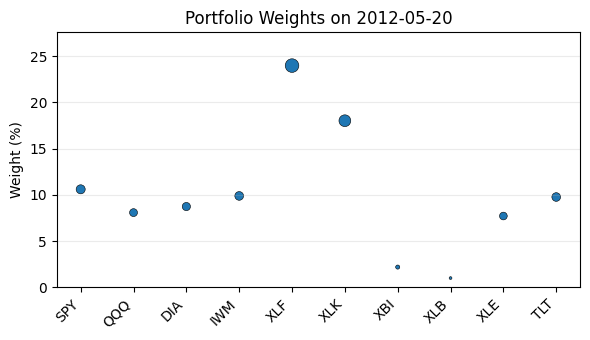


=== Rebalance on 2012-06-17 ===
Optimal portfolio
----------------------
 Investment in SPY : 10.55%
 Investment in QQQ : 6.05%
 Investment in DIA : 6.1%
 Investment in IWM : 8.44%
 Investment in XLF : 29.81%
 Investment in XLK : 18.43%
 Investment in XBI : 6.33%
 Investment in XLB : 3.99%
 Investment in XLE : 3.21%
 Investment in TLT : 7.1%
Cash: 0.0
----------------------
Exp ret = 0.7487509535597738%
Expected risk = 0.0009391510516499197%


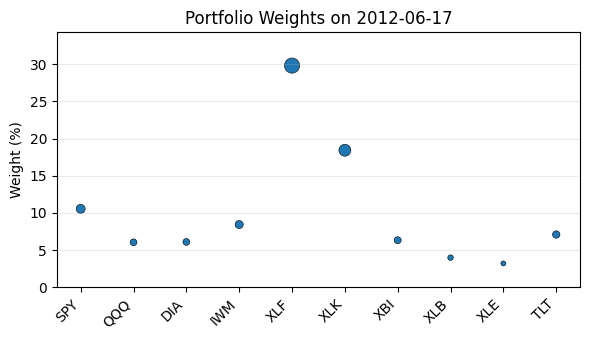


=== Rebalance on 2012-07-15 ===
Optimal portfolio
----------------------
 Investment in SPY : 8.34%
 Investment in QQQ : 8.27%
 Investment in DIA : 5.1%
 Investment in IWM : 8.26%
 Investment in XLF : 24.68%
 Investment in XLK : 23.21%
 Investment in XBI : 5.28%
 Investment in XLB : 5.56%
 Investment in XLE : 6.08%
 Investment in TLT : 5.21%
Cash: 0.0
----------------------
Exp ret = 1.2538621765253766%
Expected risk = 0.0012004661879916035%


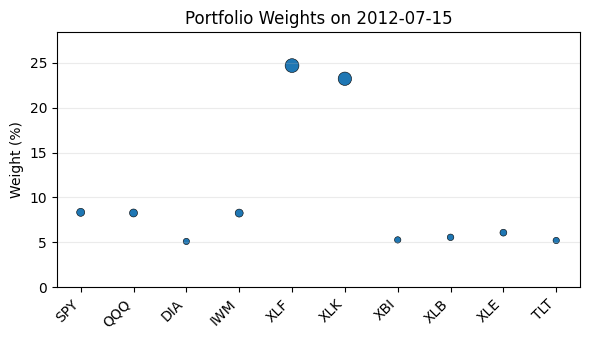


=== Rebalance on 2012-08-12 ===
Optimal portfolio
----------------------
 Investment in SPY : 9.69%
 Investment in QQQ : 8.0%
 Investment in DIA : 11.11%
 Investment in IWM : 10.29%
 Investment in XLF : 7.16%
 Investment in XLK : 7.4%
 Investment in XBI : 9.81%
 Investment in XLB : 14.6%
 Investment in XLE : 10.25%
 Investment in TLT : 11.69%
Cash: 0.0
----------------------
Exp ret = 2.6565598045889356%
Expected risk = 0.0010680550598700705%


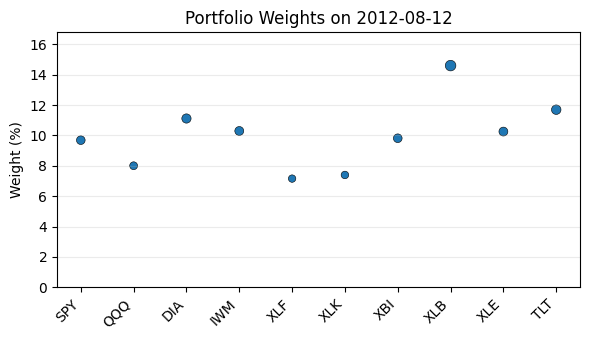


=== Rebalance on 2012-09-09 ===
Optimal portfolio
----------------------
 Investment in SPY : 7.75%
 Investment in QQQ : 11.22%
 Investment in DIA : 11.59%
 Investment in IWM : 10.11%
 Investment in XLF : 2.19%
 Investment in XLK : 7.1%
 Investment in XBI : 9.98%
 Investment in XLB : 17.51%
 Investment in XLE : 11.39%
 Investment in TLT : 11.17%
Cash: 0.0
----------------------
Exp ret = 3.3661979943740588%
Expected risk = 0.000476301991606224%


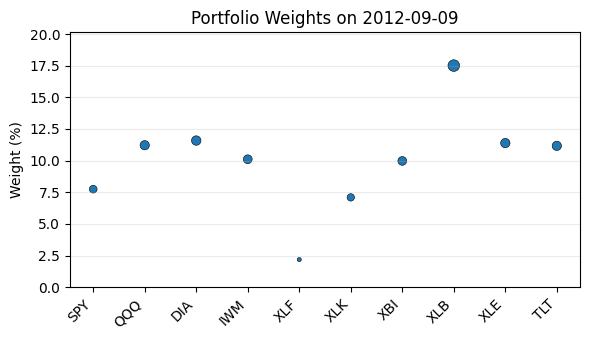


=== Rebalance on 2012-10-07 ===
Optimal portfolio
----------------------
 Investment in SPY : 10.48%
 Investment in QQQ : 10.47%
 Investment in DIA : 11.33%
 Investment in IWM : 11.24%
 Investment in XLF : 1.0%
 Investment in XLK : 8.37%
 Investment in XBI : 9.11%
 Investment in XLB : 10.96%
 Investment in XLE : 15.56%
 Investment in TLT : 11.47%
Cash: 0.0
----------------------
Exp ret = 2.7614922258491252%
Expected risk = 0.0007924775627878147%


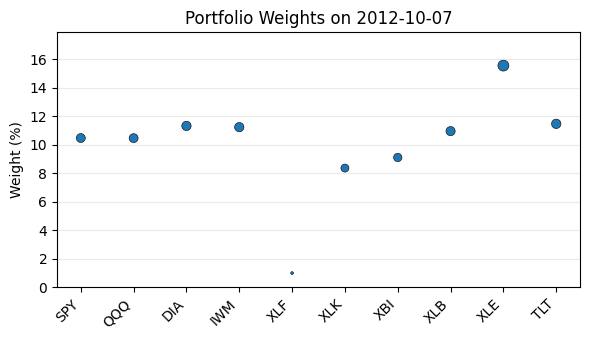


=== Rebalance on 2012-11-04 ===
Optimal portfolio
----------------------
 Investment in SPY : 10.05%
 Investment in QQQ : 10.5%
 Investment in DIA : 6.27%
 Investment in IWM : 10.88%
 Investment in XLF : 13.03%
 Investment in XLK : 7.22%
 Investment in XBI : 10.81%
 Investment in XLB : 9.08%
 Investment in XLE : 17.07%
 Investment in TLT : 5.09%
Cash: 0.0
----------------------
Exp ret = 0.1304866445897827%
Expected risk = 0.0006100853631143954%


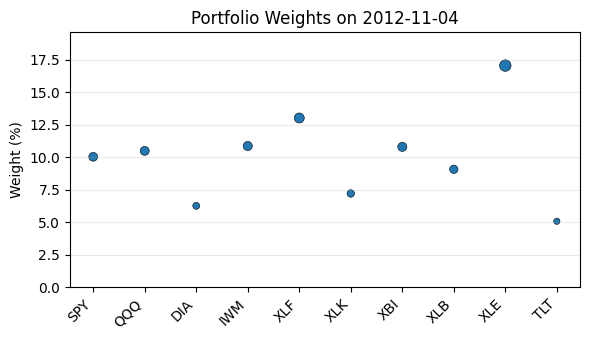


=== Rebalance on 2012-12-02 ===
Optimal portfolio
----------------------
 Investment in SPY : 9.91%
 Investment in QQQ : 8.88%
 Investment in DIA : 7.43%
 Investment in IWM : 10.69%
 Investment in XLF : 20.47%
 Investment in XLK : 9.35%
 Investment in XBI : 9.8%
 Investment in XLB : 6.62%
 Investment in XLE : 10.97%
 Investment in TLT : 5.89%
Cash: 0.0
----------------------
Exp ret = -0.7851678794812512%
Expected risk = 0.0005778696988012077%


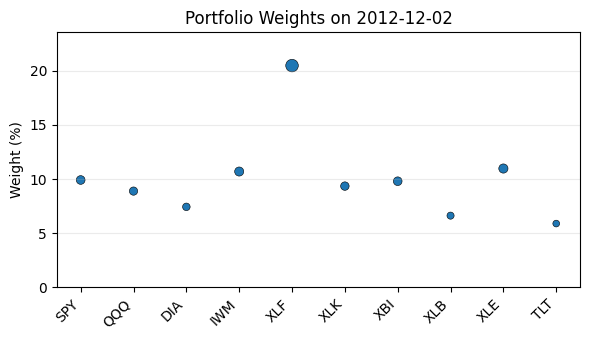


=== Rebalance on 2012-12-30 ===
Optimal portfolio
----------------------
 Investment in SPY : 9.08%
 Investment in QQQ : 12.96%
 Investment in DIA : 7.55%
 Investment in IWM : 10.18%
 Investment in XLF : 11.95%
 Investment in XLK : 5.12%
 Investment in XBI : 13.75%
 Investment in XLB : 8.14%
 Investment in XLE : 14.63%
 Investment in TLT : 6.64%
Cash: 0.0
----------------------
Exp ret = -0.1783960029965444%
Expected risk = 0.0007716250169135971%


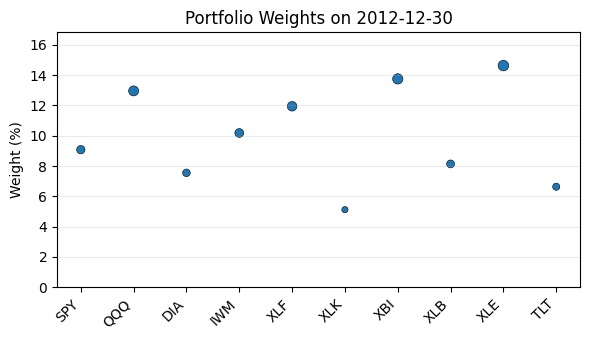


=== Rebalance on 2013-01-27 ===
Optimal portfolio
----------------------
 Investment in SPY : 9.63%
 Investment in QQQ : 14.61%
 Investment in DIA : 6.66%
 Investment in IWM : 10.02%
 Investment in XLF : 1.0%
 Investment in XLK : 14.66%
 Investment in XBI : 13.24%
 Investment in XLB : 11.54%
 Investment in XLE : 13.86%
 Investment in TLT : 4.77%
Cash: 0.0
----------------------
Exp ret = 4.0996177632243045%
Expected risk = 0.0017015583855061697%


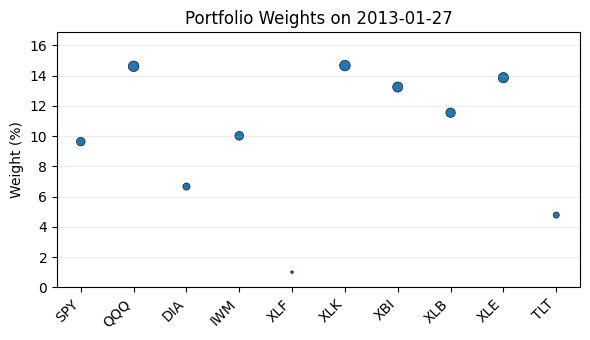


=== Rebalance on 2013-02-24 ===
Optimal portfolio
----------------------
 Investment in SPY : 10.12%
 Investment in QQQ : 14.7%
 Investment in DIA : 7.03%
 Investment in IWM : 10.5%
 Investment in XLF : 1.0%
 Investment in XLK : 12.74%
 Investment in XBI : 10.12%
 Investment in XLB : 12.52%
 Investment in XLE : 14.38%
 Investment in TLT : 6.89%
Cash: 0.0
----------------------
Exp ret = 3.058844742655624%
Expected risk = 0.0010929746100383122%


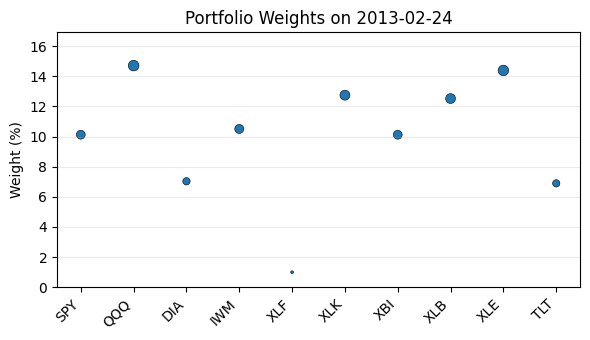


=== Rebalance on 2013-03-24 ===
Optimal portfolio
----------------------
 Investment in SPY : 13.54%
 Investment in QQQ : 12.75%
 Investment in DIA : 8.05%
 Investment in IWM : 11.64%
 Investment in XLF : 4.76%
 Investment in XLK : 11.53%
 Investment in XBI : 6.25%
 Investment in XLB : 12.08%
 Investment in XLE : 11.82%
 Investment in TLT : 7.57%
Cash: 0.0
----------------------
Exp ret = 2.1532553087869855%
Expected risk = 0.00025813634516008184%


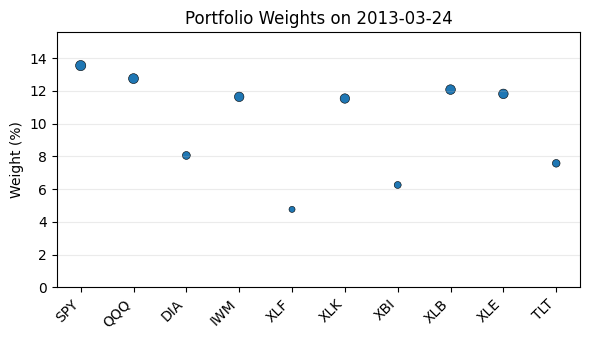


=== Rebalance on 2013-04-21 ===
Optimal portfolio
----------------------
 Investment in SPY : 12.39%
 Investment in QQQ : 8.41%
 Investment in DIA : 8.73%
 Investment in IWM : 11.24%
 Investment in XLF : 15.78%
 Investment in XLK : 18.5%
 Investment in XBI : 3.56%
 Investment in XLB : 3.51%
 Investment in XLE : 10.98%
 Investment in TLT : 6.9%
Cash: 0.0
----------------------
Exp ret = 1.489441770692776%
Expected risk = 0.0004241117197007013%


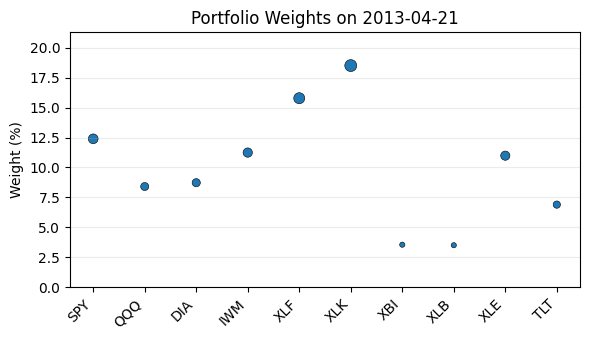


=== Rebalance on 2013-05-19 ===
Optimal portfolio
----------------------
 Investment in SPY : 10.14%
 Investment in QQQ : 10.07%
 Investment in DIA : 11.38%
 Investment in IWM : 11.14%
 Investment in XLF : 1.08%
 Investment in XLK : 16.83%
 Investment in XBI : 8.43%
 Investment in XLB : 6.91%
 Investment in XLE : 14.21%
 Investment in TLT : 9.8%
Cash: 0.0
----------------------
Exp ret = 3.839872739257645%
Expected risk = 0.0011266150516395636%


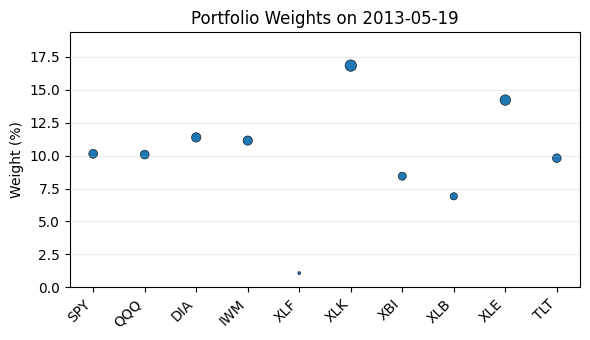


=== Rebalance on 2013-06-16 ===
Optimal portfolio
----------------------
 Investment in SPY : 10.64%
 Investment in QQQ : 10.2%
 Investment in DIA : 11.22%
 Investment in IWM : 10.64%
 Investment in XLF : 4.6%
 Investment in XLK : 12.99%
 Investment in XBI : 8.69%
 Investment in XLB : 7.16%
 Investment in XLE : 13.76%
 Investment in TLT : 10.1%
Cash: 0.0
----------------------
Exp ret = 1.5515688244960975%
Expected risk = 0.0010731362968997144%


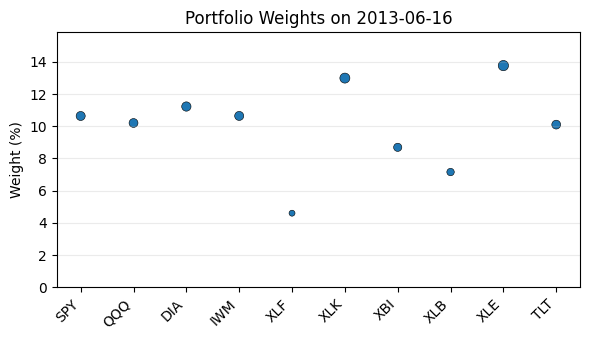


=== Rebalance on 2013-07-14 ===
Optimal portfolio
----------------------
 Investment in SPY : 8.68%
 Investment in QQQ : 14.06%
 Investment in DIA : 11.62%
 Investment in IWM : 9.52%
 Investment in XLF : 1.0%
 Investment in XLK : 15.6%
 Investment in XBI : 6.77%
 Investment in XLB : 9.74%
 Investment in XLE : 13.08%
 Investment in TLT : 9.93%
Cash: 0.0
----------------------
Exp ret = 3.054316545244198%
Expected risk = 0.001537502185044224%


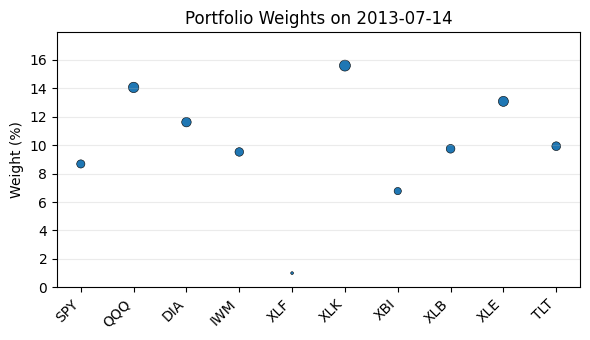


=== Rebalance on 2013-08-11 ===
Optimal portfolio
----------------------
 Investment in SPY : 8.47%
 Investment in QQQ : 14.03%
 Investment in DIA : 11.77%
 Investment in IWM : 10.21%
 Investment in XLF : 1.0%
 Investment in XLK : 15.82%
 Investment in XBI : 10.11%
 Investment in XLB : 8.79%
 Investment in XLE : 11.16%
 Investment in TLT : 8.64%
Cash: 0.0
----------------------
Exp ret = 1.5855000210459207%
Expected risk = 0.00138117601239768%


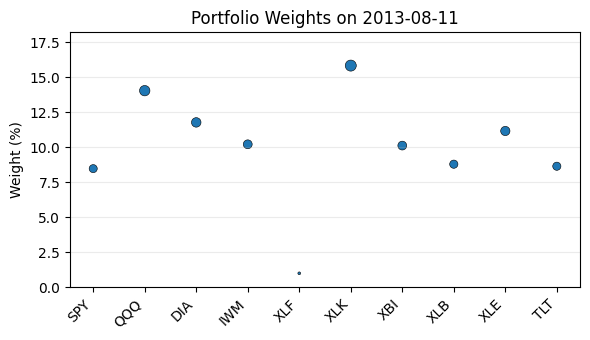


=== Rebalance on 2013-09-08 ===
Optimal portfolio
----------------------
 Investment in SPY : 4.72%
 Investment in QQQ : 10.5%
 Investment in DIA : 13.13%
 Investment in IWM : 8.3%
 Investment in XLF : 1.0%
 Investment in XLK : 26.6%
 Investment in XBI : 10.29%
 Investment in XLB : 10.08%
 Investment in XLE : 7.23%
 Investment in TLT : 8.15%
Cash: 0.0
----------------------
Exp ret = 3.8495685260384644%
Expected risk = 0.001831629467634516%


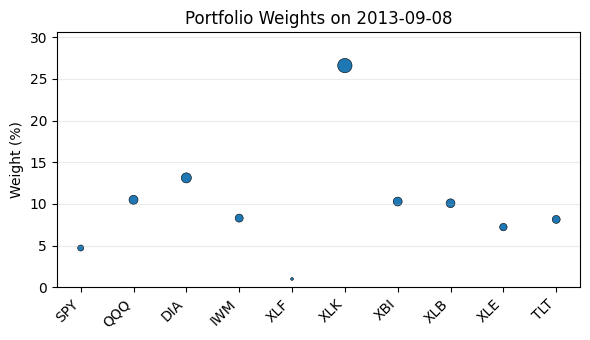


=== Rebalance on 2013-10-06 ===
Optimal portfolio
----------------------
 Investment in SPY : 5.38%
 Investment in QQQ : 10.87%
 Investment in DIA : 14.9%
 Investment in IWM : 8.28%
 Investment in XLF : 5.57%
 Investment in XLK : 16.88%
 Investment in XBI : 13.8%
 Investment in XLB : 8.54%
 Investment in XLE : 4.85%
 Investment in TLT : 10.95%
Cash: 0.0
----------------------
Exp ret = 1.320208193502782%
Expected risk = 0.0008029677397647654%


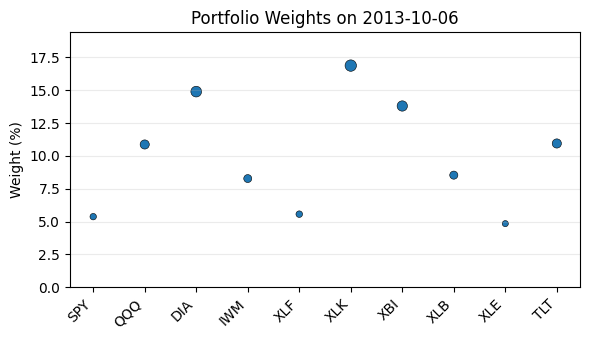


=== Rebalance on 2013-11-03 ===
Optimal portfolio
----------------------
 Investment in SPY : 8.27%
 Investment in QQQ : 11.13%
 Investment in DIA : 13.91%
 Investment in IWM : 10.78%
 Investment in XLF : 7.62%
 Investment in XLK : 8.45%
 Investment in XBI : 11.61%
 Investment in XLB : 10.51%
 Investment in XLE : 7.39%
 Investment in TLT : 10.33%
Cash: 0.0
----------------------
Exp ret = 2.3183907008461078%
Expected risk = 0.0006356992501551344%


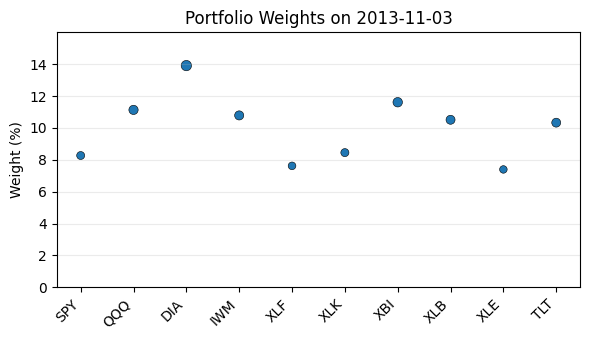


=== Rebalance on 2013-12-01 ===
Optimal portfolio
----------------------
 Investment in SPY : 9.31%
 Investment in QQQ : 12.65%
 Investment in DIA : 14.18%
 Investment in IWM : 11.53%
 Investment in XLF : 5.56%
 Investment in XLK : 6.27%
 Investment in XBI : 9.83%
 Investment in XLB : 7.61%
 Investment in XLE : 10.88%
 Investment in TLT : 12.19%
Cash: 0.0
----------------------
Exp ret = 2.3800487763119795%
Expected risk = 0.00035479426205691167%


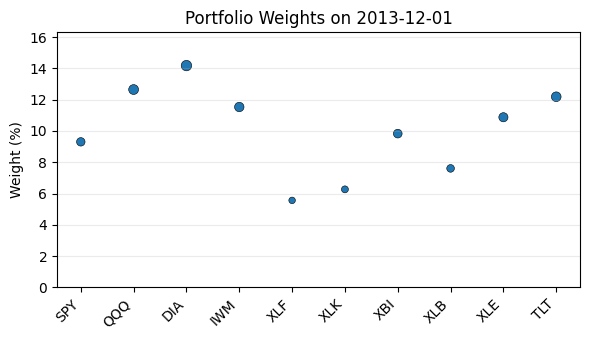


=== Rebalance on 2013-12-29 ===
Optimal portfolio
----------------------
 Investment in SPY : 11.26%
 Investment in QQQ : 9.42%
 Investment in DIA : 13.31%
 Investment in IWM : 11.12%
 Investment in XLF : 1.0%
 Investment in XLK : 11.61%
 Investment in XBI : 11.42%
 Investment in XLB : 7.81%
 Investment in XLE : 10.33%
 Investment in TLT : 12.71%
Cash: 0.0
----------------------
Exp ret = 3.0894187340873436%
Expected risk = 0.0007767759518463254%


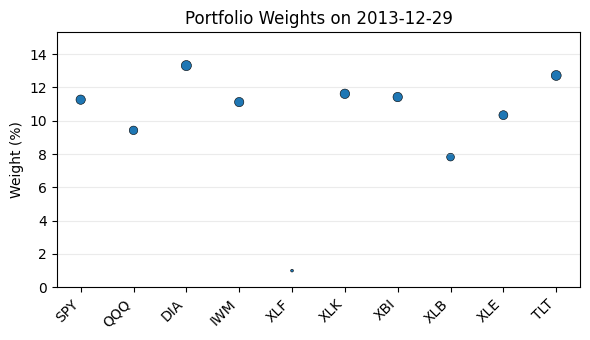


=== Rebalance on 2014-01-26 ===
Optimal portfolio
----------------------
 Investment in SPY : 6.02%
 Investment in QQQ : 9.34%
 Investment in DIA : 10.75%
 Investment in IWM : 6.29%
 Investment in XLF : 10.13%
 Investment in XLK : 34.4%
 Investment in XBI : 4.72%
 Investment in XLB : 2.44%
 Investment in XLE : 6.54%
 Investment in TLT : 9.37%
Cash: 0.0
----------------------
Exp ret = 4.378320955436127%
Expected risk = 0.0024539300091853777%


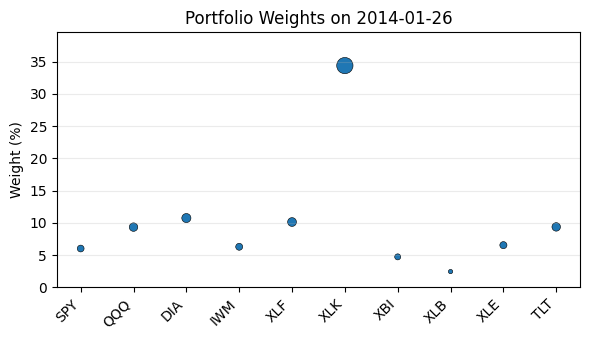


=== Rebalance on 2014-02-23 ===
Optimal portfolio
----------------------
 Investment in SPY : 5.13%
 Investment in QQQ : 7.7%
 Investment in DIA : 9.7%
 Investment in IWM : 6.68%
 Investment in XLF : 9.81%
 Investment in XLK : 32.43%
 Investment in XBI : 9.93%
 Investment in XLB : 4.86%
 Investment in XLE : 5.32%
 Investment in TLT : 8.46%
Cash: 0.0
----------------------
Exp ret = 4.131979544339844%
Expected risk = 0.0024722242599206595%


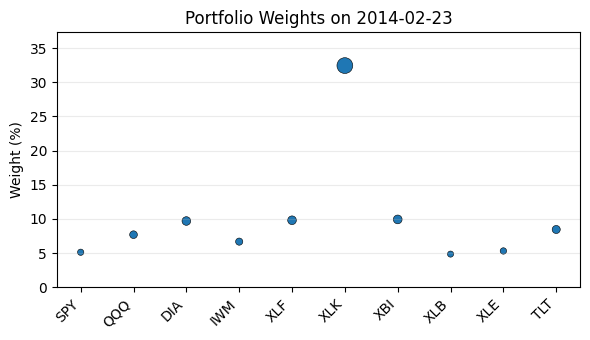


=== Rebalance on 2014-03-23 ===
Optimal portfolio
----------------------
 Investment in SPY : 5.01%
 Investment in QQQ : 9.29%
 Investment in DIA : 9.04%
 Investment in IWM : 7.64%
 Investment in XLF : 12.87%
 Investment in XLK : 23.25%
 Investment in XBI : 9.57%
 Investment in XLB : 5.94%
 Investment in XLE : 8.34%
 Investment in TLT : 9.04%
Cash: 0.0
----------------------
Exp ret = 2.4470619322187948%
Expected risk = 0.0013779060075304389%


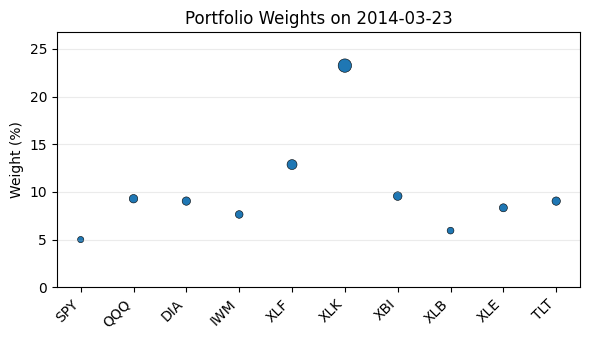


=== Rebalance on 2014-04-20 ===
Optimal portfolio
----------------------
 Investment in SPY : 11.18%
 Investment in QQQ : 7.11%
 Investment in DIA : 6.67%
 Investment in IWM : 11.31%
 Investment in XLF : 9.45%
 Investment in XLK : 1.0%
 Investment in XBI : 14.58%
 Investment in XLB : 18.13%
 Investment in XLE : 10.41%
 Investment in TLT : 10.16%
Cash: 0.0
----------------------
Exp ret = 2.016047020551236%
Expected risk = 0.0009041006065092308%


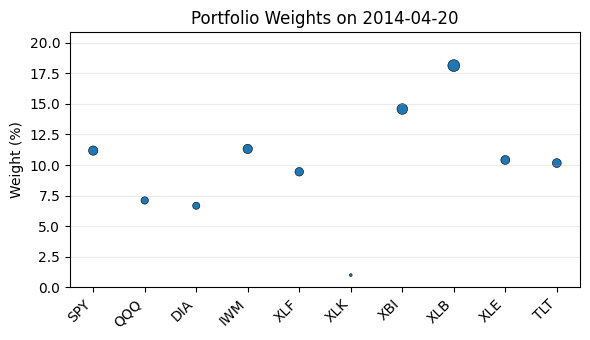


=== Rebalance on 2014-05-18 ===
Optimal portfolio
----------------------
 Investment in SPY : 11.06%
 Investment in QQQ : 2.73%
 Investment in DIA : 7.32%
 Investment in IWM : 11.2%
 Investment in XLF : 15.98%
 Investment in XLK : 1.0%
 Investment in XBI : 12.01%
 Investment in XLB : 17.13%
 Investment in XLE : 10.4%
 Investment in TLT : 11.17%
Cash: 0.0
----------------------
Exp ret = 0.854133844556276%
Expected risk = 0.0005321057251511701%


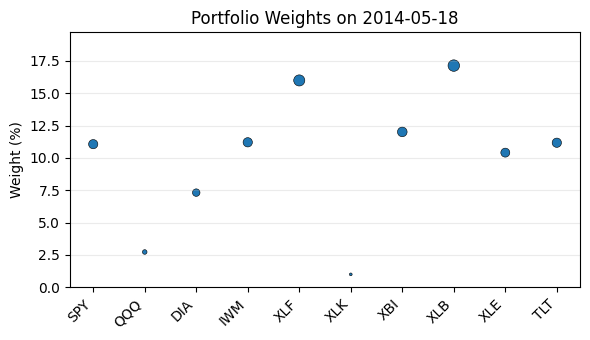


=== Rebalance on 2014-06-15 ===
Optimal portfolio
----------------------
 Investment in SPY : 8.28%
 Investment in QQQ : 6.26%
 Investment in DIA : 10.96%
 Investment in IWM : 9.61%
 Investment in XLF : 8.9%
 Investment in XLK : 12.74%
 Investment in XBI : 10.06%
 Investment in XLB : 15.38%
 Investment in XLE : 7.15%
 Investment in TLT : 10.67%
Cash: 0.0
----------------------
Exp ret = 2.090535750146876%
Expected risk = 0.0008205443809831982%


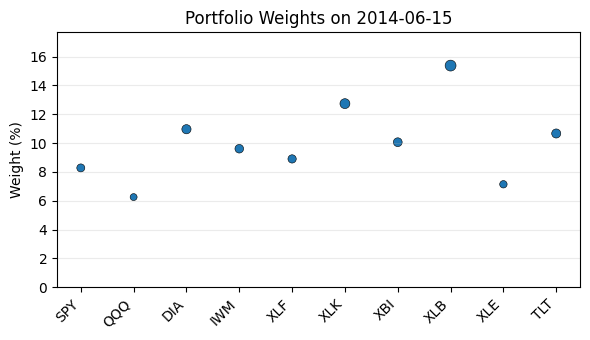


=== Rebalance on 2014-07-13 ===
Optimal portfolio
----------------------
 Investment in SPY : 6.93%
 Investment in QQQ : 6.17%
 Investment in DIA : 13.71%
 Investment in IWM : 8.93%
 Investment in XLF : 6.14%
 Investment in XLK : 21.27%
 Investment in XBI : 8.63%
 Investment in XLB : 8.84%
 Investment in XLE : 7.05%
 Investment in TLT : 12.32%
Cash: 0.0
----------------------
Exp ret = 3.2923281804051423%
Expected risk = 0.0006584292977181572%


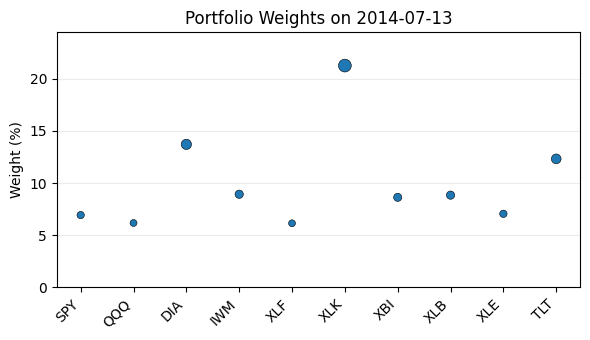


=== Rebalance on 2014-08-10 ===
Optimal portfolio
----------------------
 Investment in SPY : 6.0%
 Investment in QQQ : 6.5%
 Investment in DIA : 12.07%
 Investment in IWM : 8.05%
 Investment in XLF : 9.93%
 Investment in XLK : 22.43%
 Investment in XBI : 7.78%
 Investment in XLB : 9.02%
 Investment in XLE : 7.96%
 Investment in TLT : 10.25%
Cash: 0.0
----------------------
Exp ret = 2.190812215339593%
Expected risk = 0.0009080348995759229%


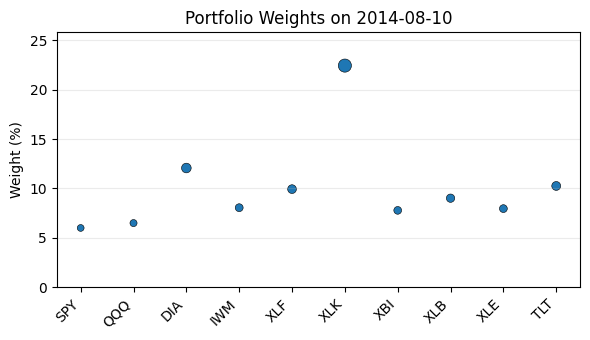


=== Rebalance on 2014-09-07 ===
Optimal portfolio
----------------------
 Investment in SPY : 8.98%
 Investment in QQQ : 5.84%
 Investment in DIA : 15.17%
 Investment in IWM : 10.33%
 Investment in XLF : 11.58%
 Investment in XLK : 10.93%
 Investment in XBI : 9.72%
 Investment in XLB : 3.56%
 Investment in XLE : 10.36%
 Investment in TLT : 13.52%
Cash: 0.0
----------------------
Exp ret = 1.4119602352036444%
Expected risk = 0.0006013641679661222%


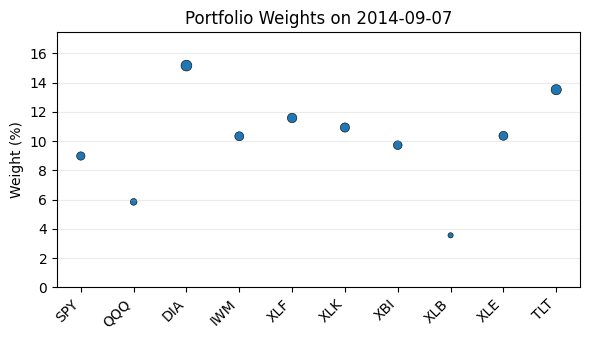


=== Rebalance on 2014-10-05 ===
Optimal portfolio
----------------------
 Investment in SPY : 9.21%
 Investment in QQQ : 5.03%
 Investment in DIA : 11.64%
 Investment in IWM : 8.98%
 Investment in XLF : 12.68%
 Investment in XLK : 23.8%
 Investment in XBI : 6.39%
 Investment in XLB : 1.0%
 Investment in XLE : 11.33%
 Investment in TLT : 9.95%
Cash: 0.0
----------------------
Exp ret = 1.4375146209997665%
Expected risk = 0.0006727321800737624%


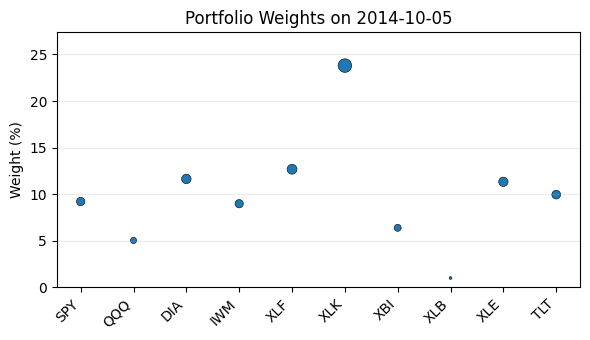


=== Rebalance on 2014-11-02 ===
Optimal portfolio
----------------------
 Investment in SPY : 11.79%
 Investment in QQQ : 9.92%
 Investment in DIA : 11.24%
 Investment in IWM : 10.47%
 Investment in XLF : 9.73%
 Investment in XLK : 17.73%
 Investment in XBI : 4.53%
 Investment in XLB : 1.0%
 Investment in XLE : 13.06%
 Investment in TLT : 10.53%
Cash: 0.0
----------------------
Exp ret = 1.8434856136784725%
Expected risk = 0.0017007902597838088%


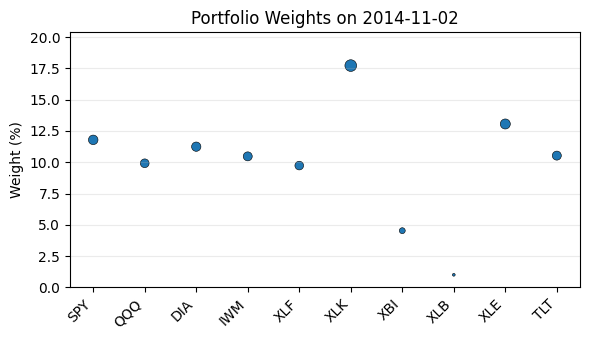


=== Rebalance on 2014-11-30 ===
Optimal portfolio
----------------------
 Investment in SPY : 10.89%
 Investment in QQQ : 6.68%
 Investment in DIA : 12.21%
 Investment in IWM : 9.96%
 Investment in XLF : 15.03%
 Investment in XLK : 17.85%
 Investment in XBI : 4.64%
 Investment in XLB : 1.0%
 Investment in XLE : 10.22%
 Investment in TLT : 11.51%
Cash: 0.0
----------------------
Exp ret = 2.426542732162688%
Expected risk = 0.0013794264169321195%


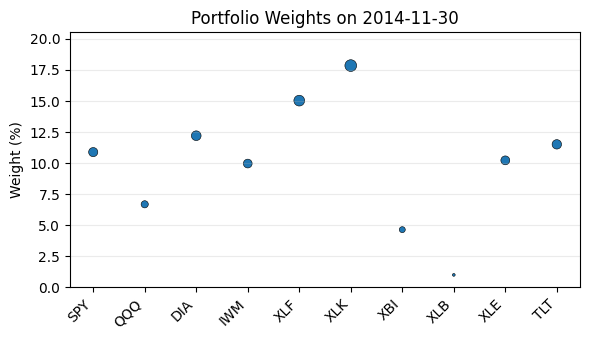


=== Rebalance on 2014-12-28 ===
Optimal portfolio
----------------------
 Investment in SPY : 8.51%
 Investment in QQQ : 14.0%
 Investment in DIA : 10.54%
 Investment in IWM : 8.85%
 Investment in XLF : 3.81%
 Investment in XLK : 26.61%
 Investment in XBI : 5.89%
 Investment in XLB : 1.0%
 Investment in XLE : 10.05%
 Investment in TLT : 10.75%
Cash: 0.0
----------------------
Exp ret = 5.410158359991323%
Expected risk = 0.0012856510658536308%


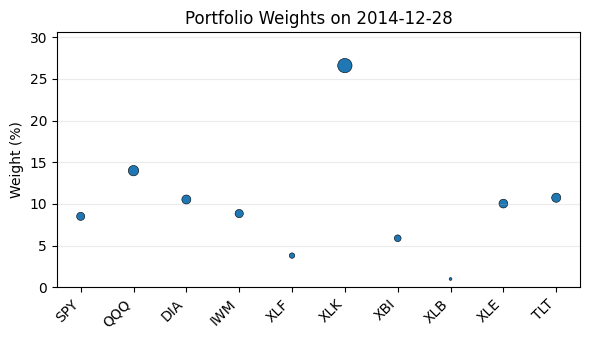


=== Rebalance on 2015-01-25 ===
Optimal portfolio
----------------------
 Investment in SPY : 7.36%
 Investment in QQQ : 7.99%
 Investment in DIA : 9.52%
 Investment in IWM : 7.71%
 Investment in XLF : 20.76%
 Investment in XLK : 25.81%
 Investment in XBI : 6.25%
 Investment in XLB : 1.0%
 Investment in XLE : 5.12%
 Investment in TLT : 8.49%
Cash: 0.0
----------------------
Exp ret = 2.9107664988947985%
Expected risk = 0.0003506741581476416%


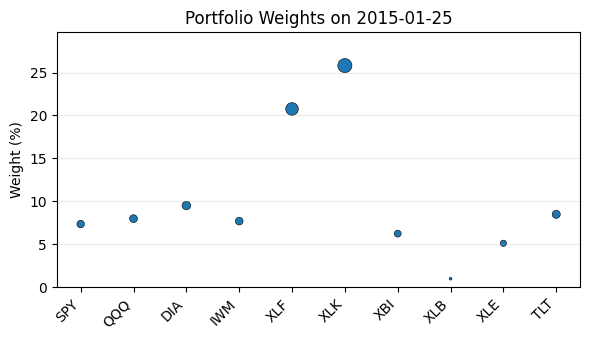


=== Rebalance on 2015-02-22 ===
Optimal portfolio
----------------------
 Investment in SPY : 6.75%
 Investment in QQQ : 10.06%
 Investment in DIA : 8.87%
 Investment in IWM : 7.65%
 Investment in XLF : 12.33%
 Investment in XLK : 24.01%
 Investment in XBI : 10.69%
 Investment in XLB : 6.78%
 Investment in XLE : 4.48%
 Investment in TLT : 8.39%
Cash: 0.0
----------------------
Exp ret = 2.4996730235659883%
Expected risk = 0.0008783988192785163%


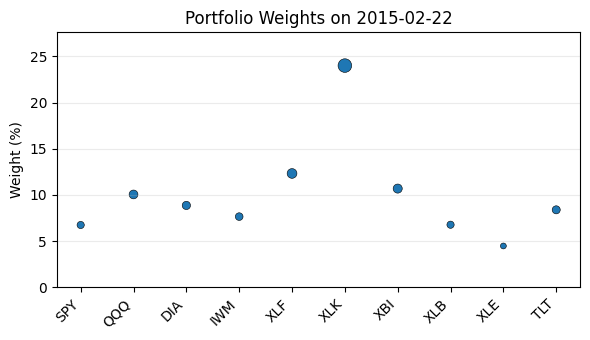


=== Rebalance on 2015-03-22 ===
Optimal portfolio
----------------------
 Investment in SPY : 7.41%
 Investment in QQQ : 11.62%
 Investment in DIA : 10.94%
 Investment in IWM : 7.74%
 Investment in XLF : 10.07%
 Investment in XLK : 30.26%
 Investment in XBI : 6.6%
 Investment in XLB : 1.77%
 Investment in XLE : 5.16%
 Investment in TLT : 8.43%
Cash: 0.0
----------------------
Exp ret = 3.3965048431395957%
Expected risk = 0.0005451393121327819%


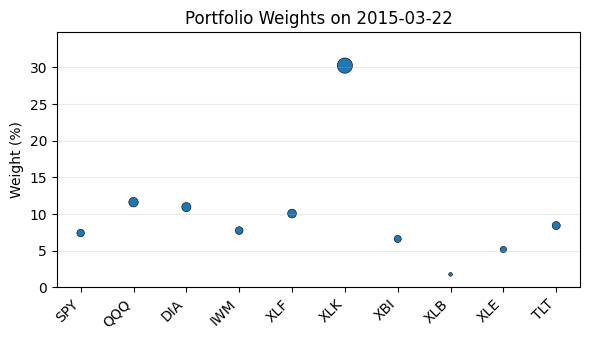


=== Rebalance on 2015-04-19 ===
Optimal portfolio
----------------------
 Investment in SPY : 8.4%
 Investment in QQQ : 12.14%
 Investment in DIA : 9.18%
 Investment in IWM : 8.87%
 Investment in XLF : 1.0%
 Investment in XLK : 20.19%
 Investment in XBI : 8.72%
 Investment in XLB : 13.58%
 Investment in XLE : 9.49%
 Investment in TLT : 8.42%
Cash: 0.0
----------------------
Exp ret = 2.8781343295504445%
Expected risk = 0.0011463889001336752%


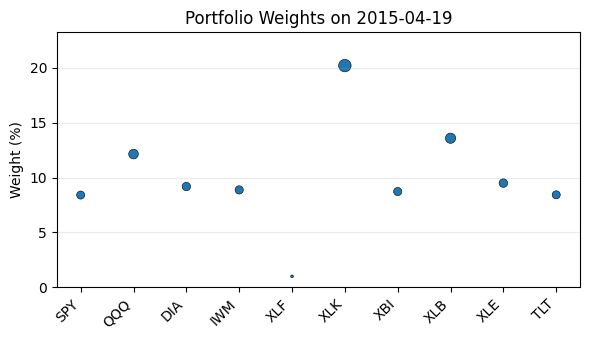


=== Rebalance on 2015-05-17 ===
Optimal portfolio
----------------------
 Investment in SPY : 9.76%
 Investment in QQQ : 9.98%
 Investment in DIA : 10.09%
 Investment in IWM : 10.12%
 Investment in XLF : 3.34%
 Investment in XLK : 14.77%
 Investment in XBI : 9.53%
 Investment in XLB : 11.92%
 Investment in XLE : 10.74%
 Investment in TLT : 9.74%
Cash: 0.0
----------------------
Exp ret = 0.7460664755952846%
Expected risk = 0.0008774022350341136%


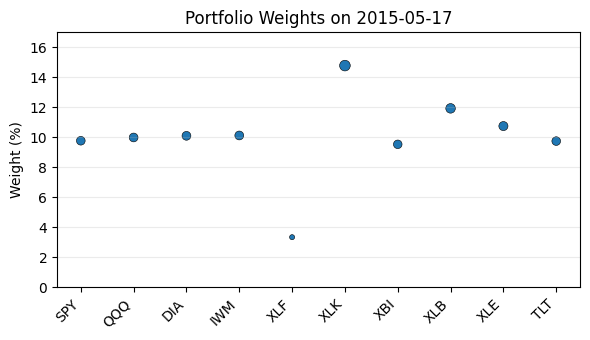


=== Rebalance on 2015-06-14 ===
Optimal portfolio
----------------------
 Investment in SPY : 9.1%
 Investment in QQQ : 10.12%
 Investment in DIA : 10.57%
 Investment in IWM : 9.59%
 Investment in XLF : 1.0%
 Investment in XLK : 17.17%
 Investment in XBI : 10.99%
 Investment in XLB : 8.43%
 Investment in XLE : 12.32%
 Investment in TLT : 10.71%
Cash: 0.0
----------------------
Exp ret = 1.4275481571669624%
Expected risk = 0.000493620363242874%


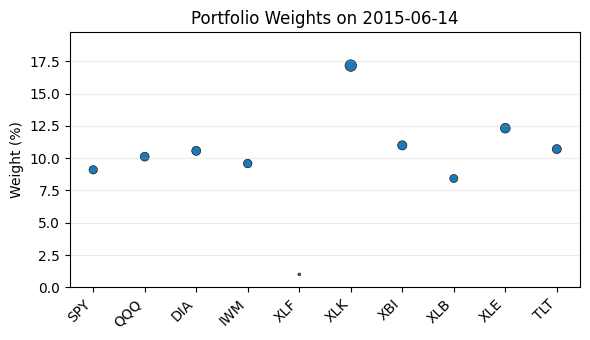


=== Rebalance on 2015-07-12 ===
Optimal portfolio
----------------------
 Investment in SPY : 11.2%
 Investment in QQQ : 11.37%
 Investment in DIA : 9.93%
 Investment in IWM : 10.94%
 Investment in XLF : 2.22%
 Investment in XLK : 21.09%
 Investment in XBI : 7.7%
 Investment in XLB : 2.02%
 Investment in XLE : 14.69%
 Investment in TLT : 8.83%
Cash: 0.0
----------------------
Exp ret = 0.16413307420277853%
Expected risk = 0.0005390168263649512%


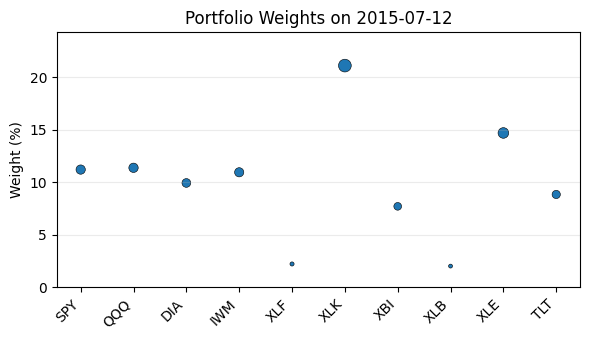


=== Rebalance on 2015-08-09 ===
Optimal portfolio
----------------------
 Investment in SPY : 8.3%
 Investment in QQQ : 9.44%
 Investment in DIA : 12.87%
 Investment in IWM : 10.89%
 Investment in XLF : 17.29%
 Investment in XLK : 14.58%
 Investment in XBI : 1.0%
 Investment in XLB : 1.0%
 Investment in XLE : 14.98%
 Investment in TLT : 9.65%
Cash: 0.0
----------------------
Exp ret = -0.009357640014292914%
Expected risk = 0.0009165415250488372%


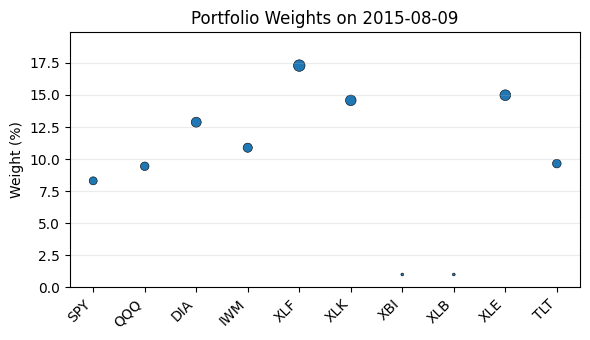


=== Rebalance on 2015-09-06 ===
Optimal portfolio
----------------------
 Investment in SPY : 9.26%
 Investment in QQQ : 7.61%
 Investment in DIA : 12.6%
 Investment in IWM : 11.13%
 Investment in XLF : 24.95%
 Investment in XLK : 5.64%
 Investment in XBI : 2.28%
 Investment in XLB : 3.02%
 Investment in XLE : 11.32%
 Investment in TLT : 12.19%
Cash: 0.0
----------------------
Exp ret = -2.1399453910035984%
Expected risk = 0.001352151224587544%


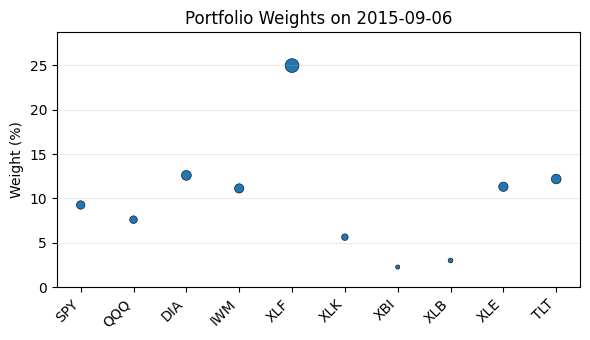


=== Rebalance on 2015-10-04 ===
Optimal portfolio
----------------------
 Investment in SPY : 10.63%
 Investment in QQQ : 6.68%
 Investment in DIA : 10.7%
 Investment in IWM : 11.23%
 Investment in XLF : 26.6%
 Investment in XLK : 1.0%
 Investment in XBI : 5.47%
 Investment in XLB : 7.37%
 Investment in XLE : 8.57%
 Investment in TLT : 11.74%
Cash: 0.0
----------------------
Exp ret = -1.9722556377966445%
Expected risk = 0.0010939964086209464%


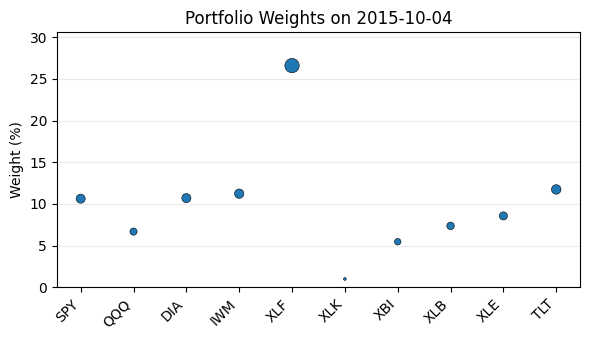


=== Rebalance on 2015-11-01 ===
Optimal portfolio
----------------------
 Investment in SPY : 12.65%
 Investment in QQQ : 7.23%
 Investment in DIA : 13.92%
 Investment in IWM : 10.95%
 Investment in XLF : 12.31%
 Investment in XLK : 1.0%
 Investment in XBI : 10.65%
 Investment in XLB : 9.96%
 Investment in XLE : 6.82%
 Investment in TLT : 14.51%
Cash: 0.0
----------------------
Exp ret = 0.23119843515554908%
Expected risk = 0.0025528108546420147%


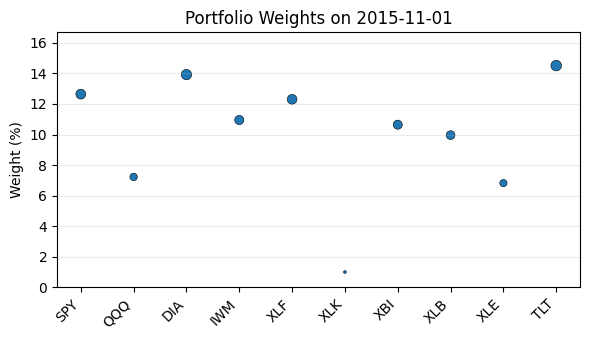


=== Rebalance on 2015-11-29 ===
Optimal portfolio
----------------------
 Investment in SPY : 13.1%
 Investment in QQQ : 8.45%
 Investment in DIA : 12.78%
 Investment in IWM : 11.36%
 Investment in XLF : 5.31%
 Investment in XLK : 1.0%
 Investment in XBI : 11.47%
 Investment in XLB : 12.05%
 Investment in XLE : 11.26%
 Investment in TLT : 13.22%
Cash: 0.0
----------------------
Exp ret = 2.6366502932744282%
Expected risk = 0.0018297124689624104%


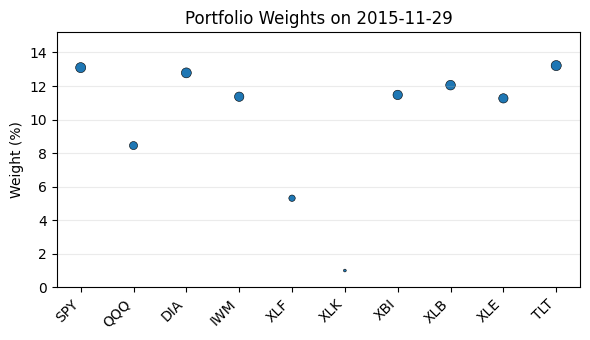


=== Rebalance on 2015-12-27 ===
Optimal portfolio
----------------------
 Investment in SPY : 10.75%
 Investment in QQQ : 6.19%
 Investment in DIA : 13.5%
 Investment in IWM : 10.24%
 Investment in XLF : 8.95%
 Investment in XLK : 17.49%
 Investment in XBI : 8.22%
 Investment in XLB : 1.0%
 Investment in XLE : 11.37%
 Investment in TLT : 12.27%
Cash: 0.0
----------------------
Exp ret = 1.6183686743508334%
Expected risk = 0.002137242840441277%


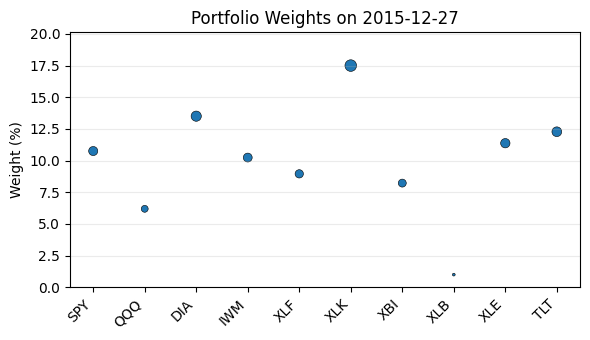


=== Rebalance on 2016-01-24 ===
Optimal portfolio
----------------------
 Investment in SPY : 11.49%
 Investment in QQQ : 5.55%
 Investment in DIA : 11.91%
 Investment in IWM : 12.61%
 Investment in XLF : 30.68%
 Investment in XLK : 1.0%
 Investment in XBI : 5.82%
 Investment in XLB : 1.0%
 Investment in XLE : 7.02%
 Investment in TLT : 12.93%
Cash: 0.0
----------------------
Exp ret = -1.9870760107010763%
Expected risk = 0.0014090589316958614%


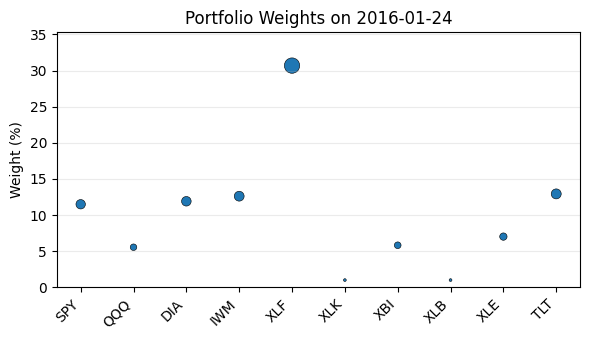


=== Rebalance on 2016-02-21 ===
Optimal portfolio
----------------------
 Investment in SPY : 11.7%
 Investment in QQQ : 3.99%
 Investment in DIA : 7.59%
 Investment in IWM : 11.83%
 Investment in XLF : 32.39%
 Investment in XLK : 1.0%
 Investment in XBI : 9.17%
 Investment in XLB : 7.62%
 Investment in XLE : 3.43%
 Investment in TLT : 11.29%
Cash: 0.0
----------------------
Exp ret = -1.3478409344729652%
Expected risk = 0.001309937571553466%


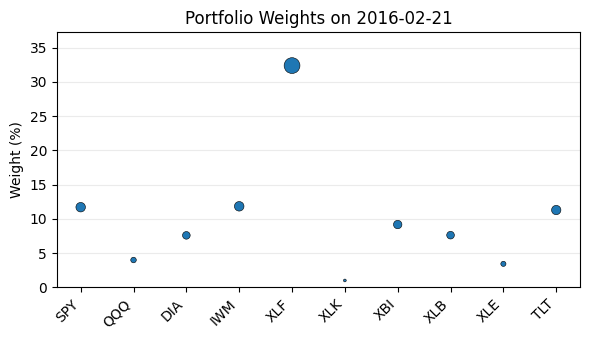


=== Rebalance on 2016-03-20 ===
Optimal portfolio
----------------------
 Investment in SPY : 11.26%
 Investment in QQQ : 6.72%
 Investment in DIA : 5.42%
 Investment in IWM : 10.04%
 Investment in XLF : 19.3%
 Investment in XLK : 1.0%
 Investment in XBI : 14.87%
 Investment in XLB : 15.14%
 Investment in XLE : 4.66%
 Investment in TLT : 11.6%
Cash: 0.0
----------------------
Exp ret = 1.0447375789691051%
Expected risk = 0.002338632611112975%


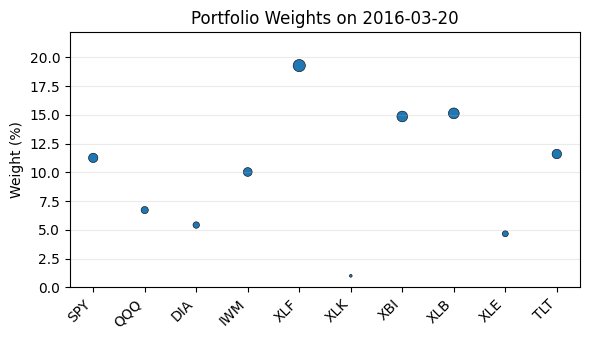


=== Rebalance on 2016-04-17 ===
Optimal portfolio
----------------------
 Investment in SPY : 10.05%
 Investment in QQQ : 9.98%
 Investment in DIA : 7.21%
 Investment in IWM : 8.45%
 Investment in XLF : 5.76%
 Investment in XLK : 12.97%
 Investment in XBI : 19.84%
 Investment in XLB : 10.64%
 Investment in XLE : 6.41%
 Investment in TLT : 8.69%
Cash: 0.0
----------------------
Exp ret = 3.907649414564106%
Expected risk = 0.0013281025633837455%


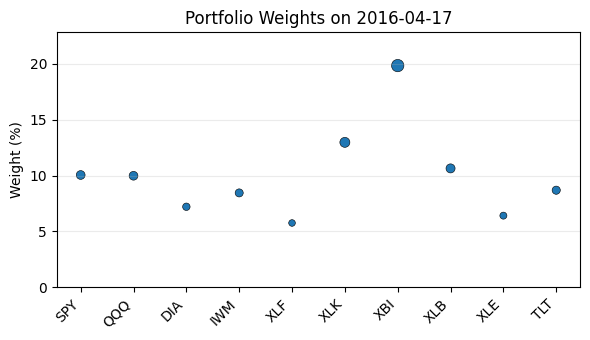


=== Rebalance on 2016-05-15 ===
Optimal portfolio
----------------------
 Investment in SPY : 9.88%
 Investment in QQQ : 10.42%
 Investment in DIA : 6.38%
 Investment in IWM : 9.53%
 Investment in XLF : 6.77%
 Investment in XLK : 6.65%
 Investment in XBI : 13.5%
 Investment in XLB : 18.24%
 Investment in XLE : 11.67%
 Investment in TLT : 6.95%
Cash: 0.0
----------------------
Exp ret = 2.6736287989590237%
Expected risk = 0.0011252135361221002%


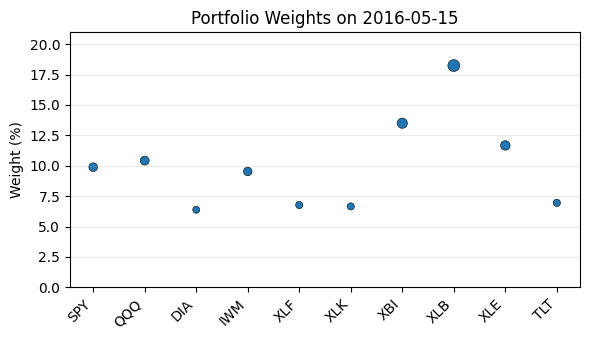


=== Rebalance on 2016-06-12 ===
Optimal portfolio
----------------------
 Investment in SPY : 7.26%
 Investment in QQQ : 13.11%
 Investment in DIA : 6.14%
 Investment in IWM : 8.08%
 Investment in XLF : 10.03%
 Investment in XLK : 15.91%
 Investment in XBI : 11.79%
 Investment in XLB : 13.82%
 Investment in XLE : 8.43%
 Investment in TLT : 5.42%
Cash: 0.0
----------------------
Exp ret = 2.4072401363855476%
Expected risk = 0.001072123353364865%


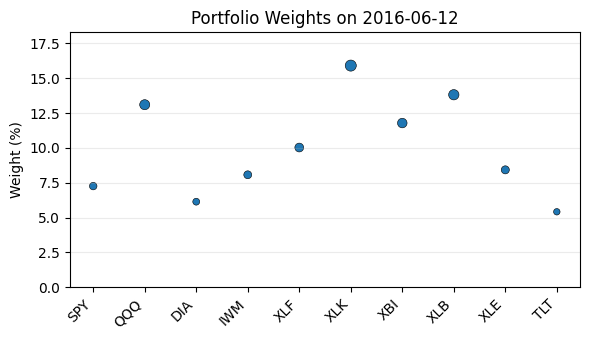


=== Rebalance on 2016-07-10 ===
Optimal portfolio
----------------------
 Investment in SPY : 9.16%
 Investment in QQQ : 10.16%
 Investment in DIA : 9.22%
 Investment in IWM : 10.13%
 Investment in XLF : 20.7%
 Investment in XLK : 7.68%
 Investment in XBI : 7.84%
 Investment in XLB : 9.73%
 Investment in XLE : 5.49%
 Investment in TLT : 9.9%
Cash: 0.0
----------------------
Exp ret = 1.3458489606772324%
Expected risk = 0.0009587014173032204%


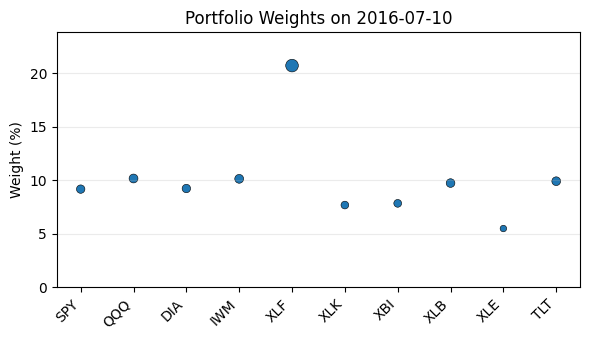


=== Rebalance on 2016-08-07 ===
Optimal portfolio
----------------------
 Investment in SPY : 8.4%
 Investment in QQQ : 12.64%
 Investment in DIA : 11.5%
 Investment in IWM : 8.41%
 Investment in XLF : 8.71%
 Investment in XLK : 19.92%
 Investment in XBI : 7.79%
 Investment in XLB : 4.74%
 Investment in XLE : 5.63%
 Investment in TLT : 12.26%
Cash: 0.0
----------------------
Exp ret = 3.64970855493049%
Expected risk = 0.0013503562485278043%


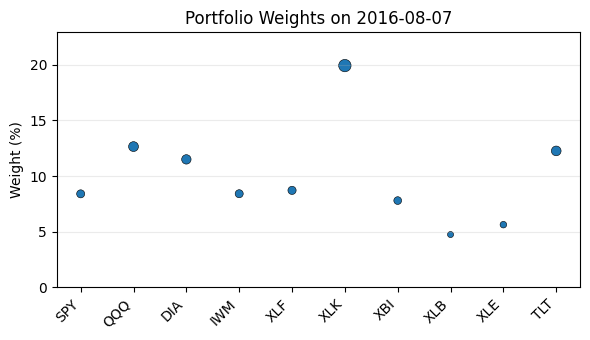


=== Rebalance on 2016-09-04 ===
Optimal portfolio
----------------------
 Investment in SPY : 7.78%
 Investment in QQQ : 12.12%
 Investment in DIA : 12.54%
 Investment in IWM : 8.68%
 Investment in XLF : 5.31%
 Investment in XLK : 15.07%
 Investment in XBI : 7.39%
 Investment in XLB : 6.65%
 Investment in XLE : 11.62%
 Investment in TLT : 12.83%
Cash: 0.0
----------------------
Exp ret = 3.0901827762229566%
Expected risk = 0.0007332188378030809%


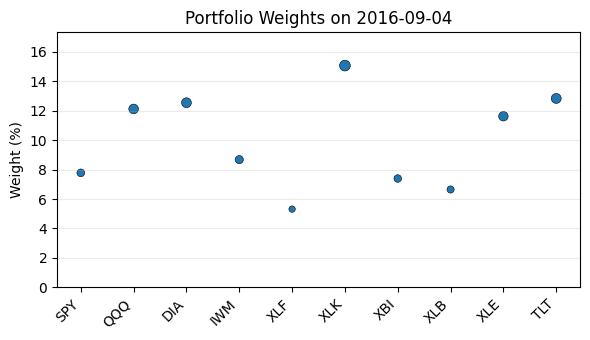


=== Rebalance on 2016-10-02 ===
Optimal portfolio
----------------------
 Investment in SPY : 5.74%
 Investment in QQQ : 10.2%
 Investment in DIA : 12.95%
 Investment in IWM : 7.02%
 Investment in XLF : 6.11%
 Investment in XLK : 22.69%
 Investment in XBI : 4.62%
 Investment in XLB : 9.63%
 Investment in XLE : 7.94%
 Investment in TLT : 13.1%
Cash: 0.0
----------------------
Exp ret = 2.1980949514558916%
Expected risk = 0.0004844157820099893%


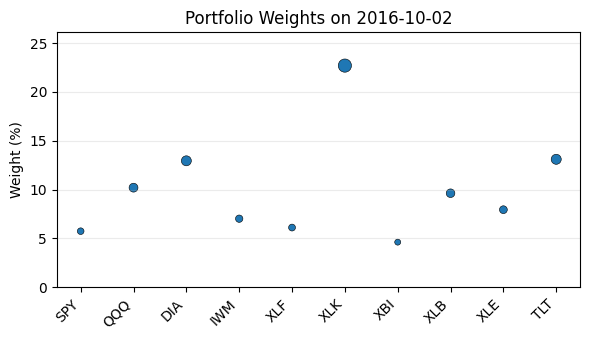


=== Rebalance on 2016-10-30 ===
Optimal portfolio
----------------------
 Investment in SPY : 10.22%
 Investment in QQQ : 8.75%
 Investment in DIA : 12.28%
 Investment in IWM : 9.74%
 Investment in XLF : 5.12%
 Investment in XLK : 3.05%
 Investment in XBI : 8.9%
 Investment in XLB : 13.95%
 Investment in XLE : 14.71%
 Investment in TLT : 13.28%
Cash: 0.0
----------------------
Exp ret = -0.2502159347989549%
Expected risk = 0.00038684878920400333%


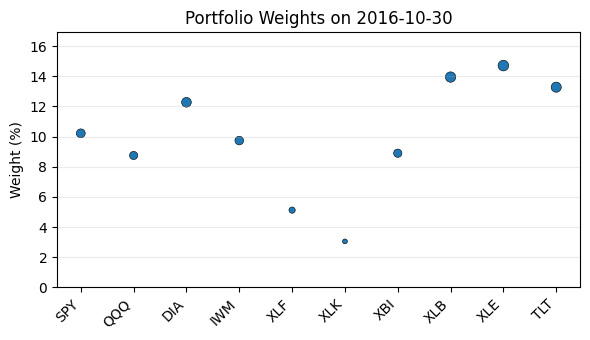


=== Rebalance on 2016-11-27 ===
Optimal portfolio
----------------------
 Investment in SPY : 10.26%
 Investment in QQQ : 14.2%
 Investment in DIA : 8.42%
 Investment in IWM : 8.34%
 Investment in XLF : 1.0%
 Investment in XLK : 12.03%
 Investment in XBI : 9.03%
 Investment in XLB : 9.27%
 Investment in XLE : 18.67%
 Investment in TLT : 8.78%
Cash: 0.0
----------------------
Exp ret = 3.0558424333237406%
Expected risk = 0.002786846305805835%


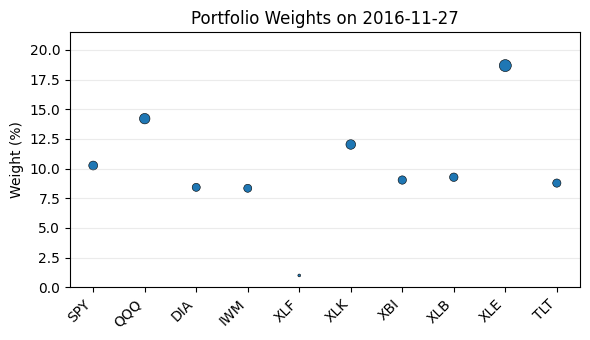


=== Performance 2012 ===
Average Monthly Return   : -0.14%
Monthly Sharpe Ratio     : -0.046
Annualized Sharpe Ratio  : -0.161
Maximum Drawdown         : 8.05%

=== Performance 2013 ===
Average Monthly Return   : 1.60%
Monthly Sharpe Ratio     : 0.645
Annualized Sharpe Ratio  : 2.233
Maximum Drawdown         : 1.66%

=== Performance 2014 ===
Average Monthly Return   : 1.23%
Monthly Sharpe Ratio     : 0.530
Annualized Sharpe Ratio  : 1.838
Maximum Drawdown         : 3.41%

=== Performance 2015 ===
Average Monthly Return   : -1.03%
Monthly Sharpe Ratio     : -0.274
Annualized Sharpe Ratio  : -0.948
Maximum Drawdown         : 21.46%

=== Performance 2016 ===
Average Monthly Return   : 2.02%
Monthly Sharpe Ratio     : 0.691
Annualized Sharpe Ratio  : 2.394
Maximum Drawdown         : 2.63%


In [30]:
print("\nTesting L2 Regularization:")
rebalance_with_regularization(reg_type="L2", gamma=0.05, verbose=True);

[*******************   40%                       ]  4 of 10 completed


Testing PBR Regularization:


[*********************100%***********************]  10 of 10 completed



=== Rebalance on 2012-03-25 ===
Optimal portfolio
----------------------
 Investment in SPY : 8.73%
 Investment in QQQ : 10.47%
 Investment in DIA : 12.73%
 Investment in IWM : 10.21%
 Investment in XLF : 4.23%
 Investment in XLK : 11.45%
 Investment in XBI : 8.8%
 Investment in XLB : 7.31%
 Investment in XLE : 13.39%
 Investment in TLT : 12.68%
Cash: 0.0
----------------------
Exp ret = 3.9569705148199477%
Expected risk = 0.0005438120963235302%


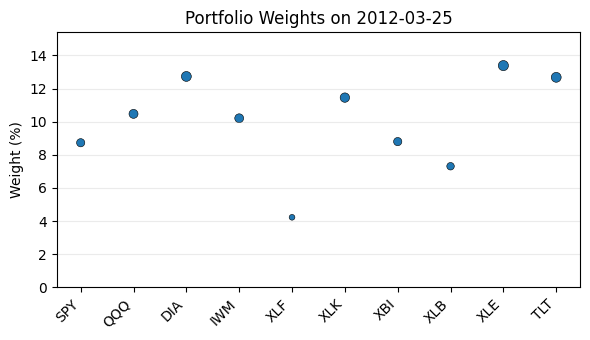


=== Rebalance on 2012-04-22 ===
Optimal portfolio
----------------------
 Investment in SPY : 10.41%
 Investment in QQQ : 8.26%
 Investment in DIA : 12.32%
 Investment in IWM : 10.97%
 Investment in XLF : 10.46%
 Investment in XLK : 8.63%
 Investment in XBI : 8.12%
 Investment in XLB : 7.4%
 Investment in XLE : 11.15%
 Investment in TLT : 12.3%
Cash: 0.0
----------------------
Exp ret = 0.5518675904829833%
Expected risk = 0.0003832795500547381%


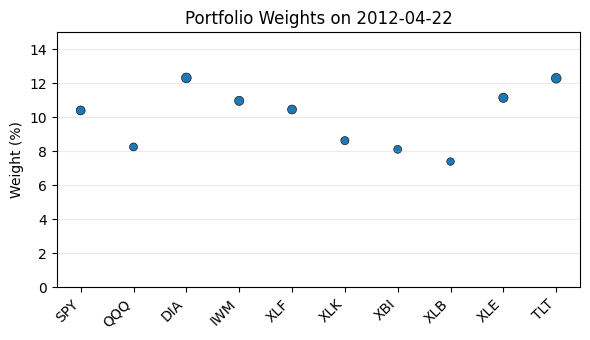


=== Rebalance on 2012-05-20 ===
Optimal portfolio
----------------------
 Investment in SPY : 10.35%
 Investment in QQQ : 9.27%
 Investment in DIA : 9.55%
 Investment in IWM : 10.05%
 Investment in XLF : 16.01%
 Investment in XLK : 13.43%
 Investment in XBI : 6.75%
 Investment in XLB : 5.55%
 Investment in XLE : 9.07%
 Investment in TLT : 9.99%
Cash: 0.0
----------------------
Exp ret = -1.2064497828024217%
Expected risk = 0.0011620811014557884%


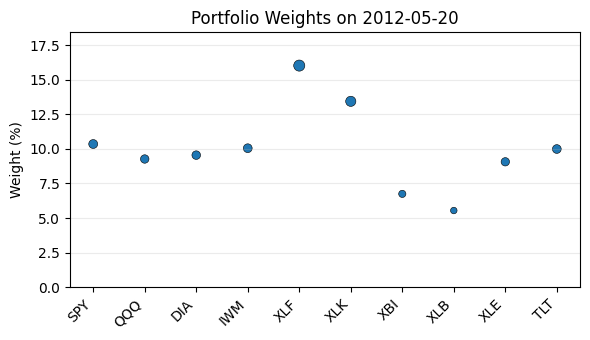


=== Rebalance on 2012-06-17 ===
Optimal portfolio
----------------------
 Investment in SPY : 10.27%
 Investment in QQQ : 8.36%
 Investment in DIA : 8.4%
 Investment in IWM : 9.39%
 Investment in XLF : 18.25%
 Investment in XLK : 13.38%
 Investment in XBI : 8.47%
 Investment in XLB : 7.5%
 Investment in XLE : 7.15%
 Investment in TLT : 8.83%
Cash: 0.0
----------------------
Exp ret = -0.34380478488675037%
Expected risk = 0.001586711754362367%


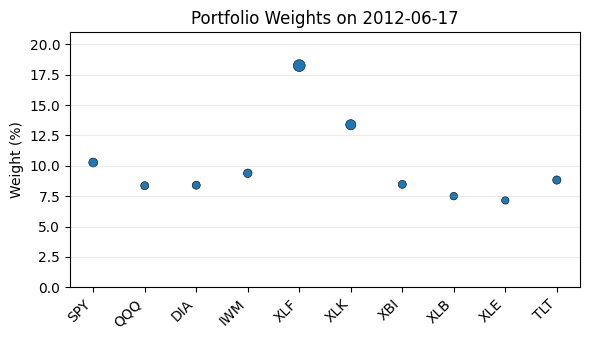


=== Rebalance on 2012-07-15 ===
Optimal portfolio
----------------------
 Investment in SPY : 9.34%
 Investment in QQQ : 9.29%
 Investment in DIA : 7.98%
 Investment in IWM : 9.3%
 Investment in XLF : 16.15%
 Investment in XLK : 15.41%
 Investment in XBI : 8.01%
 Investment in XLB : 8.13%
 Investment in XLE : 8.35%
 Investment in TLT : 8.03%
Cash: 0.0
----------------------
Exp ret = 0.32358607366573083%
Expected risk = 0.0016524782757958176%


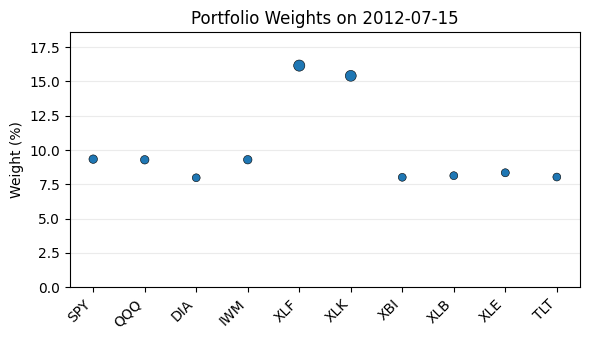


=== Rebalance on 2012-08-12 ===
Optimal portfolio
----------------------
 Investment in SPY : 9.88%
 Investment in QQQ : 9.13%
 Investment in DIA : 10.5%
 Investment in IWM : 10.14%
 Investment in XLF : 8.72%
 Investment in XLK : 8.83%
 Investment in XBI : 9.93%
 Investment in XLB : 12.01%
 Investment in XLE : 10.12%
 Investment in TLT : 10.75%
Cash: 0.0
----------------------
Exp ret = 2.5599663637247323%
Expected risk = 0.000984495058084654%


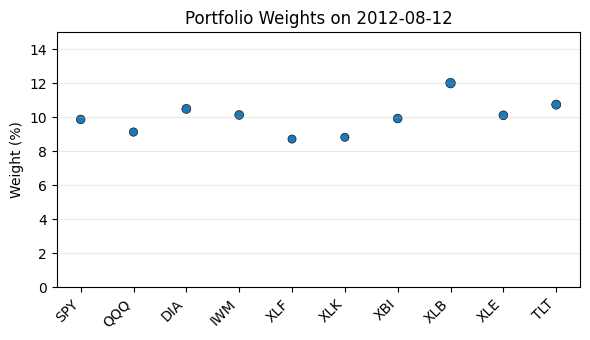


=== Rebalance on 2012-09-09 ===
Optimal portfolio
----------------------
 Investment in SPY : 9.05%
 Investment in QQQ : 10.53%
 Investment in DIA : 10.69%
 Investment in IWM : 10.07%
 Investment in XLF : 6.6%
 Investment in XLK : 8.73%
 Investment in XBI : 10.01%
 Investment in XLB : 13.19%
 Investment in XLE : 10.6%
 Investment in TLT : 10.52%
Cash: 0.0
----------------------
Exp ret = 3.0817130698661854%
Expected risk = 0.000378813343233256%


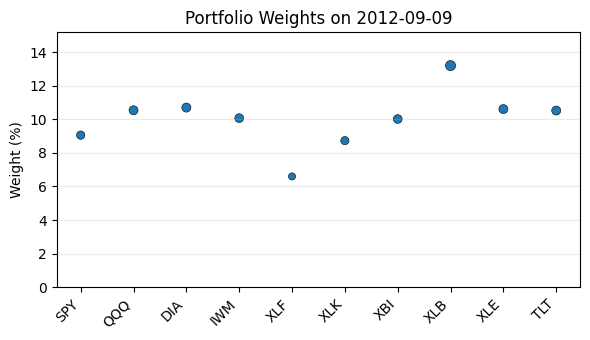


=== Rebalance on 2012-10-07 ===
Optimal portfolio
----------------------
 Investment in SPY : 10.35%
 Investment in QQQ : 10.36%
 Investment in DIA : 10.72%
 Investment in IWM : 10.68%
 Investment in XLF : 4.83%
 Investment in XLK : 9.41%
 Investment in XBI : 9.77%
 Investment in XLB : 10.57%
 Investment in XLE : 12.53%
 Investment in TLT : 10.78%
Cash: 0.0
----------------------
Exp ret = 2.5071968522243018%
Expected risk = 0.0006395332419082258%


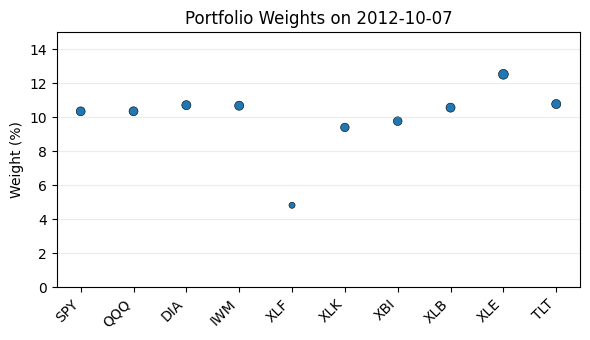


=== Rebalance on 2012-11-04 ===
Optimal portfolio
----------------------
 Investment in SPY : 10.03%
 Investment in QQQ : 10.22%
 Investment in DIA : 8.36%
 Investment in IWM : 10.4%
 Investment in XLF : 11.33%
 Investment in XLK : 8.76%
 Investment in XBI : 10.36%
 Investment in XLB : 9.61%
 Investment in XLE : 13.08%
 Investment in TLT : 7.84%
Cash: 0.0
----------------------
Exp ret = -0.07748299119101497%
Expected risk = 0.0006446203809891613%


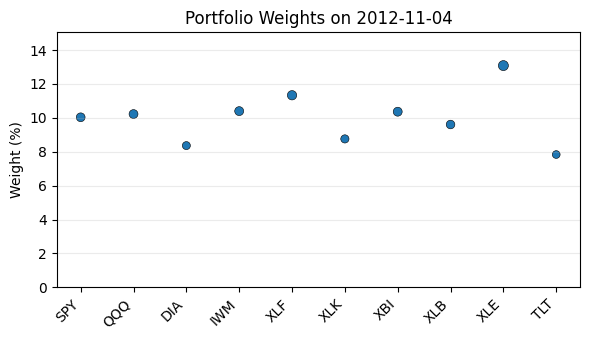


=== Rebalance on 2012-12-02 ===
Optimal portfolio
----------------------
 Investment in SPY : 9.97%
 Investment in QQQ : 9.51%
 Investment in DIA : 8.87%
 Investment in IWM : 10.31%
 Investment in XLF : 14.62%
 Investment in XLK : 9.7%
 Investment in XBI : 9.91%
 Investment in XLB : 8.51%
 Investment in XLE : 10.42%
 Investment in TLT : 8.19%
Cash: 0.0
----------------------
Exp ret = -1.055714719123012%
Expected risk = 0.0007590853214916348%


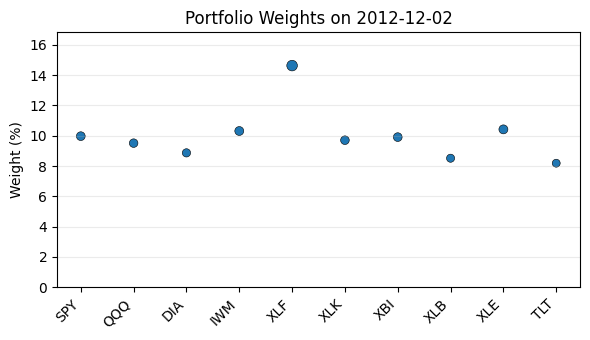


=== Rebalance on 2012-12-30 ===
Optimal portfolio
----------------------
 Investment in SPY : 9.6%
 Investment in QQQ : 11.31%
 Investment in DIA : 8.92%
 Investment in IWM : 10.09%
 Investment in XLF : 10.87%
 Investment in XLK : 7.82%
 Investment in XBI : 11.65%
 Investment in XLB : 9.18%
 Investment in XLE : 12.04%
 Investment in TLT : 8.51%
Cash: 0.0
----------------------
Exp ret = -0.35849331760402925%
Expected risk = 0.0008007490809331283%


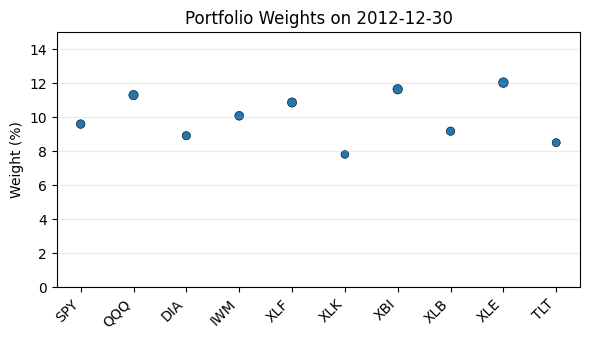


=== Rebalance on 2013-01-27 ===
Optimal portfolio
----------------------
 Investment in SPY : 10.11%
 Investment in QQQ : 12.2%
 Investment in DIA : 8.85%
 Investment in IWM : 10.27%
 Investment in XLF : 3.89%
 Investment in XLK : 12.21%
 Investment in XBI : 11.62%
 Investment in XLB : 10.92%
 Investment in XLE : 11.88%
 Investment in TLT : 8.04%
Cash: 0.0
----------------------
Exp ret = 3.7237556085513823%
Expected risk = 0.0015206656695039974%


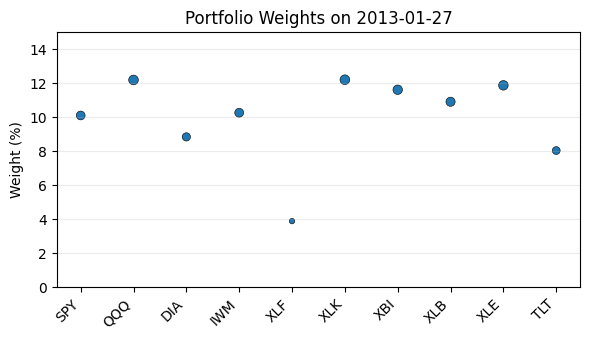


=== Rebalance on 2013-02-24 ===
Optimal portfolio
----------------------
 Investment in SPY : 10.18%
 Investment in QQQ : 12.13%
 Investment in DIA : 8.86%
 Investment in IWM : 10.35%
 Investment in XLF : 5.0%
 Investment in XLK : 11.29%
 Investment in XBI : 10.18%
 Investment in XLB : 11.21%
 Investment in XLE : 11.99%
 Investment in TLT : 8.8%
Cash: 0.0
----------------------
Exp ret = 2.734103205589427%
Expected risk = 0.000916017252296696%


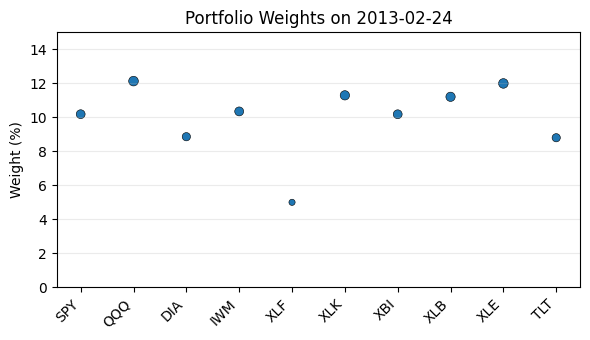


=== Rebalance on 2013-03-24 ===
Optimal portfolio
----------------------
 Investment in SPY : 11.54%
 Investment in QQQ : 11.2%
 Investment in DIA : 9.16%
 Investment in IWM : 10.72%
 Investment in XLF : 7.69%
 Investment in XLK : 10.67%
 Investment in XBI : 8.37%
 Investment in XLB : 10.91%
 Investment in XLE : 10.8%
 Investment in TLT : 8.95%
Cash: 0.0
----------------------
Exp ret = 1.982805293069239%
Expected risk = 0.00022015825897067344%


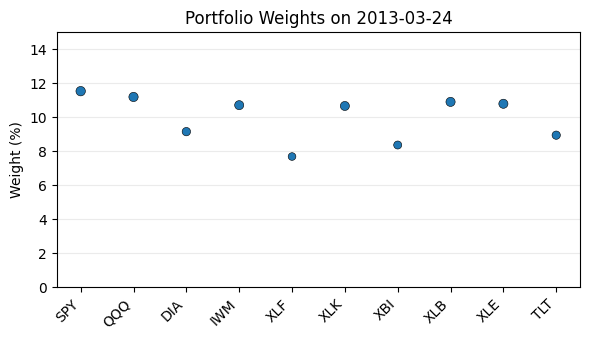


=== Rebalance on 2013-04-21 ===
Optimal portfolio
----------------------
 Investment in SPY : 11.03%
 Investment in QQQ : 9.32%
 Investment in DIA : 9.47%
 Investment in IWM : 10.54%
 Investment in XLF : 12.48%
 Investment in XLK : 13.61%
 Investment in XBI : 7.23%
 Investment in XLB : 7.2%
 Investment in XLE : 10.43%
 Investment in TLT : 8.68%
Cash: 0.0
----------------------
Exp ret = 1.0808968839294368%
Expected risk = 0.0004980487166739025%


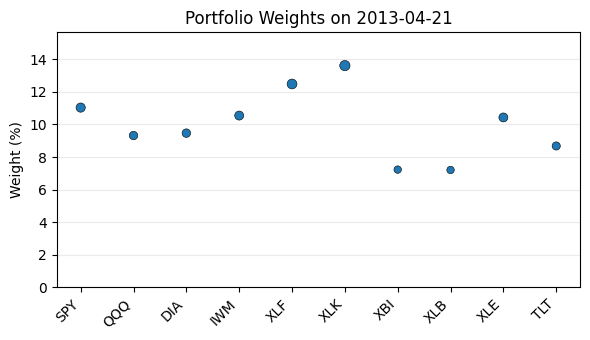


=== Rebalance on 2013-05-19 ===
Optimal portfolio
----------------------
 Investment in SPY : 10.06%
 Investment in QQQ : 10.05%
 Investment in DIA : 10.6%
 Investment in IWM : 10.5%
 Investment in XLF : 6.11%
 Investment in XLK : 12.9%
 Investment in XBI : 9.35%
 Investment in XLB : 8.69%
 Investment in XLE : 11.8%
 Investment in TLT : 9.93%
Cash: 0.0
----------------------
Exp ret = 3.504801481179952%
Expected risk = 0.0009407339924204387%


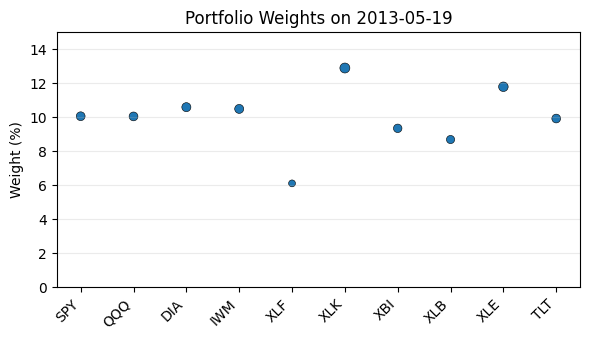


=== Rebalance on 2013-06-16 ===
Optimal portfolio
----------------------
 Investment in SPY : 10.28%
 Investment in QQQ : 10.1%
 Investment in DIA : 10.54%
 Investment in IWM : 10.29%
 Investment in XLF : 7.6%
 Investment in XLK : 11.31%
 Investment in XBI : 9.43%
 Investment in XLB : 8.75%
 Investment in XLE : 11.65%
 Investment in TLT : 10.05%
Cash: 0.0
----------------------
Exp ret = 1.4154371791939986%
Expected risk = 0.0009857850579555205%


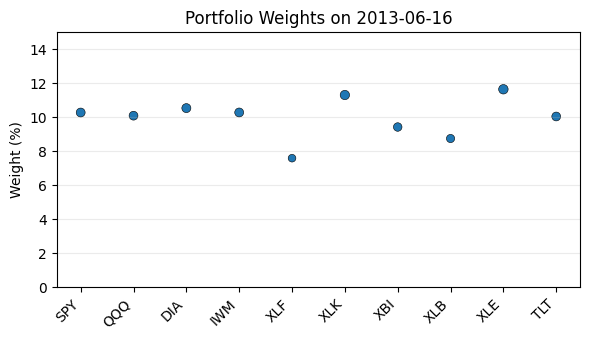


=== Rebalance on 2013-07-14 ===
Optimal portfolio
----------------------
 Investment in SPY : 9.92%
 Investment in QQQ : 12.21%
 Investment in DIA : 11.17%
 Investment in IWM : 10.28%
 Investment in XLF : 1.86%
 Investment in XLK : 12.86%
 Investment in XBI : 9.09%
 Investment in XLB : 10.37%
 Investment in XLE : 11.8%
 Investment in TLT : 10.45%
Cash: 0.0
----------------------
Exp ret = 2.8571328597814043%
Expected risk = 0.0014461073740319377%


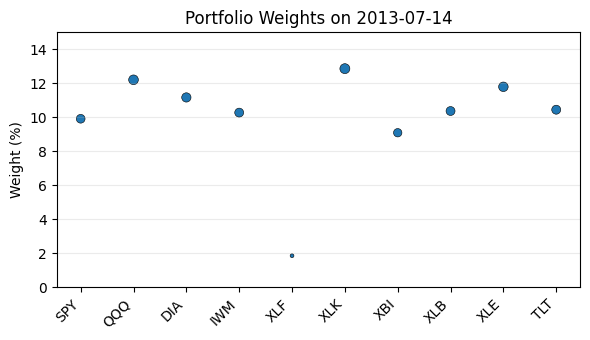


=== Rebalance on 2013-08-11 ===
Optimal portfolio
----------------------
 Investment in SPY : 9.41%
 Investment in QQQ : 11.81%
 Investment in DIA : 10.84%
 Investment in IWM : 10.16%
 Investment in XLF : 5.49%
 Investment in XLK : 12.59%
 Investment in XBI : 10.11%
 Investment in XLB : 9.54%
 Investment in XLE : 10.57%
 Investment in TLT : 9.48%
Cash: 0.0
----------------------
Exp ret = 1.2878044686110797%
Expected risk = 0.0012050976842645745%


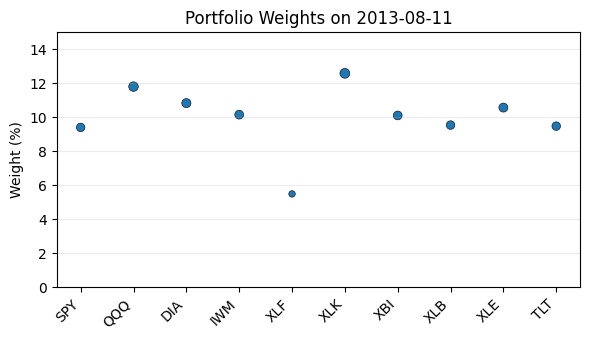


=== Rebalance on 2013-09-08 ===
Optimal portfolio
----------------------
 Investment in SPY : 7.92%
 Investment in QQQ : 10.32%
 Investment in DIA : 11.39%
 Investment in IWM : 9.41%
 Investment in XLF : 5.44%
 Investment in XLK : 16.87%
 Investment in XBI : 10.21%
 Investment in XLB : 10.13%
 Investment in XLE : 8.97%
 Investment in TLT : 9.34%
Cash: 0.0
----------------------
Exp ret = 2.9868535277763306%
Expected risk = 0.001322397087306992%


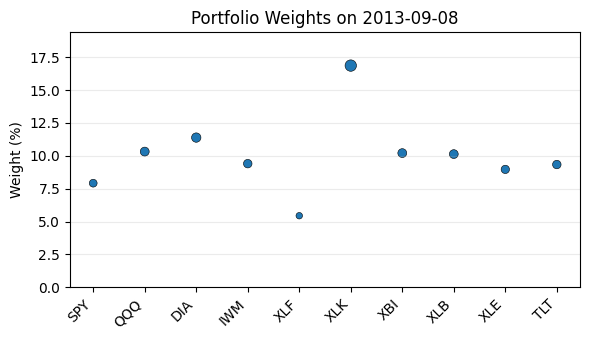


=== Rebalance on 2013-10-06 ===
Optimal portfolio
----------------------
 Investment in SPY : 8.0%
 Investment in QQQ : 10.39%
 Investment in DIA : 12.11%
 Investment in IWM : 9.27%
 Investment in XLF : 8.07%
 Investment in XLK : 12.96%
 Investment in XBI : 11.64%
 Investment in XLB : 9.38%
 Investment in XLE : 7.77%
 Investment in TLT : 10.42%
Cash: 0.0
----------------------
Exp ret = 0.9958458276035862%
Expected risk = 0.0007160682270657573%


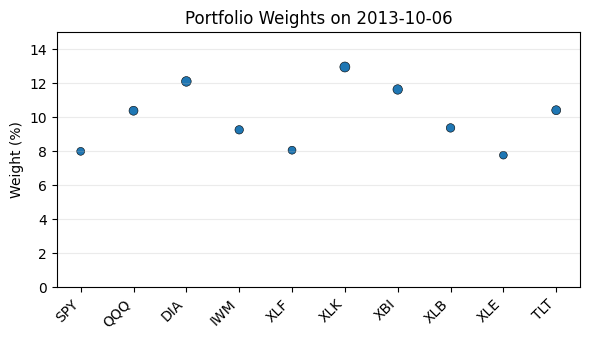


=== Rebalance on 2013-11-03 ===
Optimal portfolio
----------------------
 Investment in SPY : 9.25%
 Investment in QQQ : 10.5%
 Investment in DIA : 11.71%
 Investment in IWM : 10.35%
 Investment in XLF : 8.96%
 Investment in XLK : 9.29%
 Investment in XBI : 10.71%
 Investment in XLB : 10.23%
 Investment in XLE : 8.86%
 Investment in TLT : 10.15%
Cash: 0.0
----------------------
Exp ret = 2.242078037690832%
Expected risk = 0.0006297346810630602%


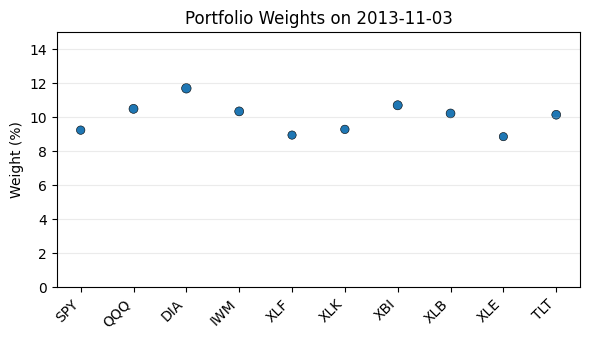


=== Rebalance on 2013-12-01 ===
Optimal portfolio
----------------------
 Investment in SPY : 9.71%
 Investment in QQQ : 11.15%
 Investment in DIA : 11.81%
 Investment in IWM : 10.68%
 Investment in XLF : 8.07%
 Investment in XLK : 8.33%
 Investment in XBI : 9.94%
 Investment in XLB : 8.97%
 Investment in XLE : 10.39%
 Investment in TLT : 10.96%
Cash: 0.0
----------------------
Exp ret = 2.238313931881962%
Expected risk = 0.0003740432610645199%


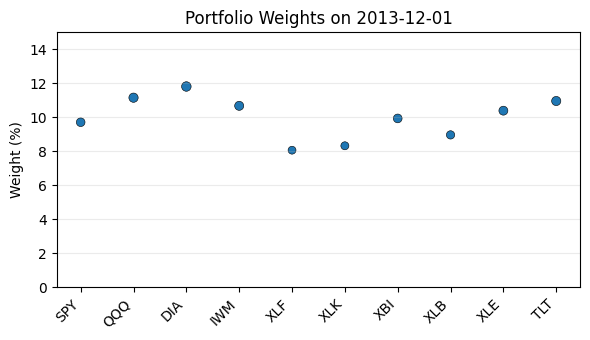


=== Rebalance on 2013-12-29 ===
Optimal portfolio
----------------------
 Investment in SPY : 10.61%
 Investment in QQQ : 9.82%
 Investment in DIA : 11.48%
 Investment in IWM : 10.55%
 Investment in XLF : 5.54%
 Investment in XLK : 10.76%
 Investment in XBI : 10.68%
 Investment in XLB : 9.13%
 Investment in XLE : 10.21%
 Investment in TLT : 11.23%
Cash: 0.0
----------------------
Exp ret = 2.8604159741978186%
Expected risk = 0.0007350719728760702%


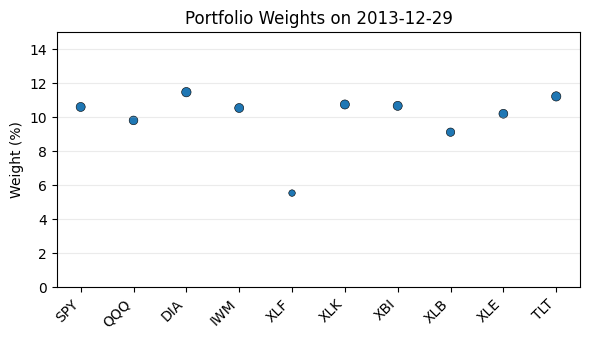


=== Rebalance on 2014-01-26 ===
Optimal portfolio
----------------------
 Investment in SPY : 8.4%
 Investment in QQQ : 9.75%
 Investment in DIA : 10.3%
 Investment in IWM : 8.53%
 Investment in XLF : 10.08%
 Investment in XLK : 19.75%
 Investment in XBI : 7.86%
 Investment in XLB : 6.95%
 Investment in XLE : 8.63%
 Investment in TLT : 9.74%
Cash: 0.0
----------------------
Exp ret = 2.848657096729413%
Expected risk = 0.0013255399115782434%


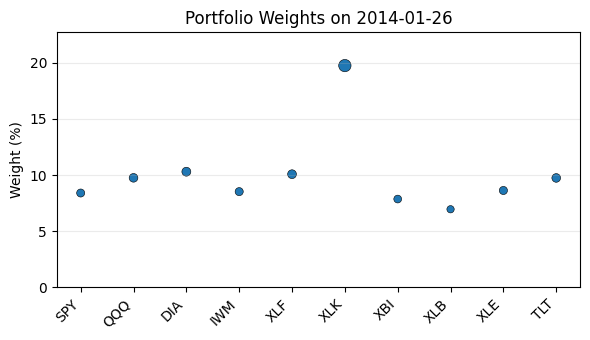


=== Rebalance on 2014-02-23 ===
Optimal portfolio
----------------------
 Investment in SPY : 8.02%
 Investment in QQQ : 9.09%
 Investment in DIA : 9.87%
 Investment in IWM : 8.66%
 Investment in XLF : 9.93%
 Investment in XLK : 19.11%
 Investment in XBI : 9.93%
 Investment in XLB : 7.91%
 Investment in XLE : 8.1%
 Investment in TLT : 9.37%
Cash: 0.0
----------------------
Exp ret = 2.8597035242147895%
Expected risk = 0.0014463407831983863%


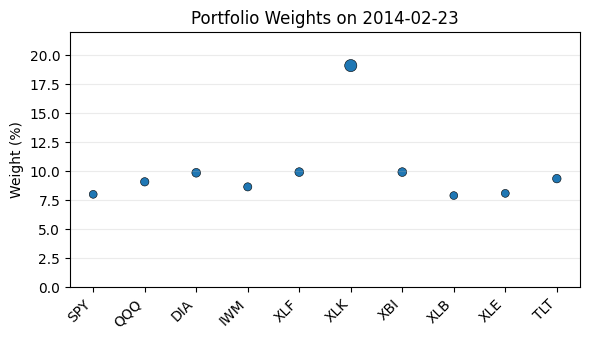


=== Rebalance on 2014-03-23 ===
Optimal portfolio
----------------------
 Investment in SPY : 7.85%
 Investment in QQQ : 9.7%
 Investment in DIA : 9.6%
 Investment in IWM : 8.99%
 Investment in XLF : 11.24%
 Investment in XLK : 15.71%
 Investment in XBI : 9.79%
 Investment in XLB : 8.26%
 Investment in XLE : 9.26%
 Investment in TLT : 9.58%
Cash: 0.0
----------------------
Exp ret = 1.938746449729906%
Expected risk = 0.0009850852644752283%


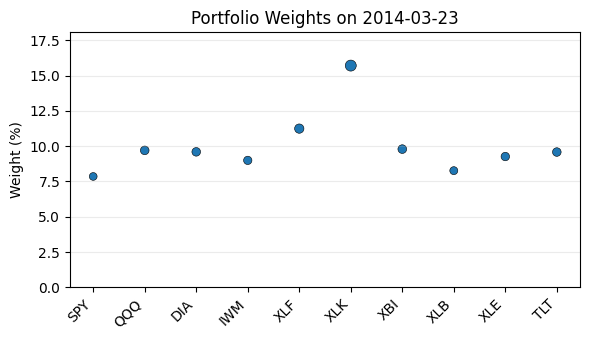


=== Rebalance on 2014-04-20 ===
Optimal portfolio
----------------------
 Investment in SPY : 11.07%
 Investment in QQQ : 9.31%
 Investment in DIA : 9.14%
 Investment in IWM : 11.13%
 Investment in XLF : 10.32%
 Investment in XLK : 1.12%
 Investment in XBI : 12.51%
 Investment in XLB : 14.01%
 Investment in XLE : 10.74%
 Investment in TLT : 10.64%
Cash: 0.0
----------------------
Exp ret = 1.8039664597070757%
Expected risk = 0.0008790012774680297%


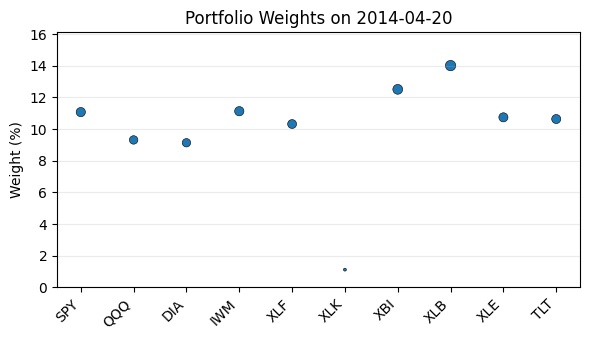


=== Rebalance on 2014-05-18 ===
Optimal portfolio
----------------------
 Investment in SPY : 11.04%
 Investment in QQQ : 7.43%
 Investment in DIA : 9.43%
 Investment in IWM : 11.1%
 Investment in XLF : 13.15%
 Investment in XLK : 1.0%
 Investment in XBI : 11.43%
 Investment in XLB : 13.61%
 Investment in XLE : 10.74%
 Investment in TLT : 11.08%
Cash: 0.0
----------------------
Exp ret = 0.5753701959712323%
Expected risk = 0.0005967681114161635%


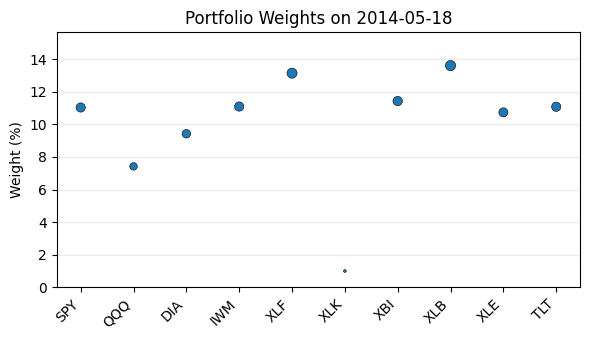


=== Rebalance on 2014-06-15 ===
Optimal portfolio
----------------------
 Investment in SPY : 9.25%
 Investment in QQQ : 8.36%
 Investment in DIA : 10.42%
 Investment in IWM : 9.83%
 Investment in XLF : 9.52%
 Investment in XLK : 11.19%
 Investment in XBI : 10.03%
 Investment in XLB : 12.33%
 Investment in XLE : 8.76%
 Investment in TLT : 10.3%
Cash: 0.0
----------------------
Exp ret = 1.9587809707410906%
Expected risk = 0.0007855181768452932%


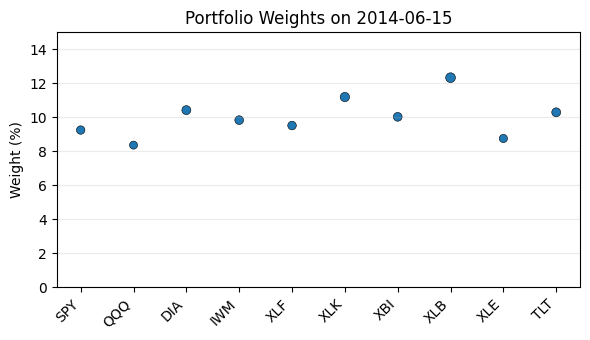


=== Rebalance on 2014-07-13 ===
Optimal portfolio
----------------------
 Investment in SPY : 8.7%
 Investment in QQQ : 8.4%
 Investment in DIA : 11.57%
 Investment in IWM : 9.55%
 Investment in XLF : 8.33%
 Investment in XLK : 14.77%
 Investment in XBI : 9.42%
 Investment in XLB : 9.53%
 Investment in XLE : 8.76%
 Investment in TLT : 10.98%
Cash: 0.0
----------------------
Exp ret = 2.878029067215886%
Expected risk = 0.00047388214608136853%


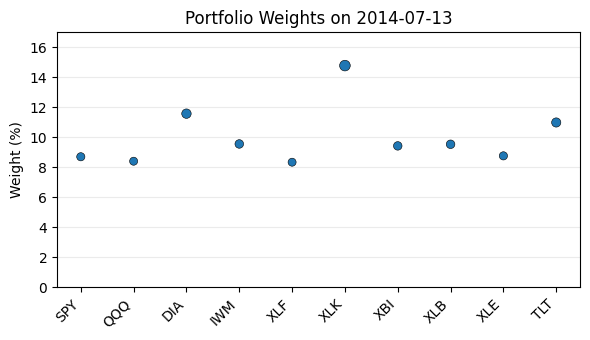


=== Rebalance on 2014-08-10 ===
Optimal portfolio
----------------------
 Investment in SPY : 8.28%
 Investment in QQQ : 8.52%
 Investment in DIA : 10.88%
 Investment in IWM : 9.17%
 Investment in XLF : 9.95%
 Investment in XLK : 15.32%
 Investment in XBI : 9.05%
 Investment in XLB : 9.6%
 Investment in XLE : 9.13%
 Investment in TLT : 10.1%
Cash: 0.0
----------------------
Exp ret = 1.7720579454691305%
Expected risk = 0.0007151797936157851%


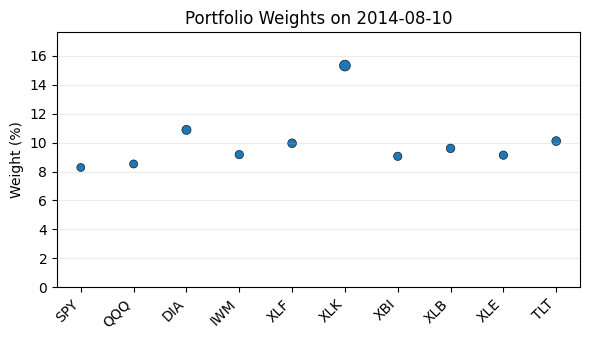


=== Rebalance on 2014-09-07 ===
Optimal portfolio
----------------------
 Investment in SPY : 9.57%
 Investment in QQQ : 8.19%
 Investment in DIA : 12.25%
 Investment in IWM : 10.16%
 Investment in XLF : 10.7%
 Investment in XLK : 10.38%
 Investment in XBI : 9.89%
 Investment in XLB : 7.18%
 Investment in XLE : 10.17%
 Investment in TLT : 11.54%
Cash: 0.0
----------------------
Exp ret = 1.2110058627061466%
Expected risk = 0.0006205261922126504%


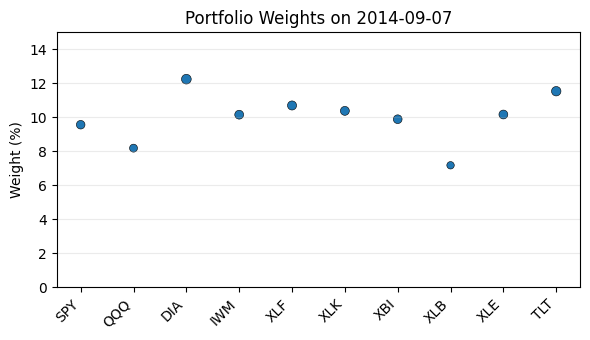


=== Rebalance on 2014-10-05 ===
Optimal portfolio
----------------------
 Investment in SPY : 9.83%
 Investment in QQQ : 8.07%
 Investment in DIA : 10.86%
 Investment in IWM : 9.73%
 Investment in XLF : 11.31%
 Investment in XLK : 15.93%
 Investment in XBI : 8.63%
 Investment in XLB : 4.77%
 Investment in XLE : 10.72%
 Investment in TLT : 10.15%
Cash: 0.0
----------------------
Exp ret = 0.8014222165964002%
Expected risk = 0.000621950001242474%


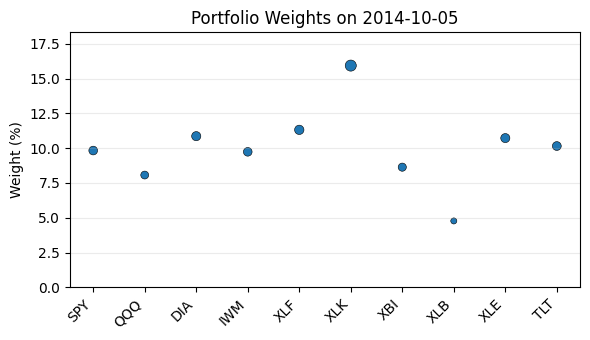


=== Rebalance on 2014-11-02 ===
Optimal portfolio
----------------------
 Investment in SPY : 10.94%
 Investment in QQQ : 10.15%
 Investment in DIA : 10.71%
 Investment in IWM : 10.38%
 Investment in XLF : 10.05%
 Investment in XLK : 13.49%
 Investment in XBI : 7.81%
 Investment in XLB : 4.57%
 Investment in XLE : 11.49%
 Investment in TLT : 10.41%
Cash: 0.0
----------------------
Exp ret = 1.4746584303217718%
Expected risk = 0.0016052148985818168%


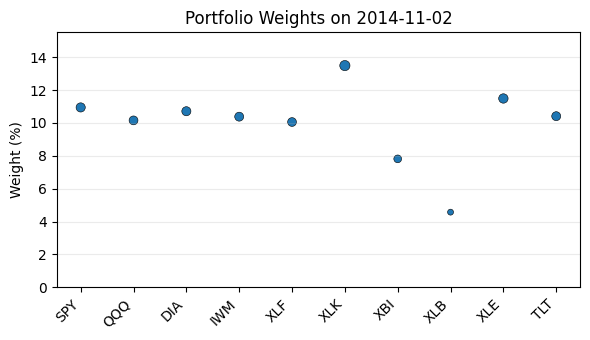


=== Rebalance on 2014-11-30 ===
Optimal portfolio
----------------------
 Investment in SPY : 10.88%
 Investment in QQQ : 9.09%
 Investment in DIA : 11.43%
 Investment in IWM : 10.48%
 Investment in XLF : 12.63%
 Investment in XLK : 13.82%
 Investment in XBI : 8.19%
 Investment in XLB : 1.73%
 Investment in XLE : 10.6%
 Investment in TLT : 11.15%
Cash: 0.0
----------------------
Exp ret = 2.1245141926702216%
Expected risk = 0.001372591831699428%


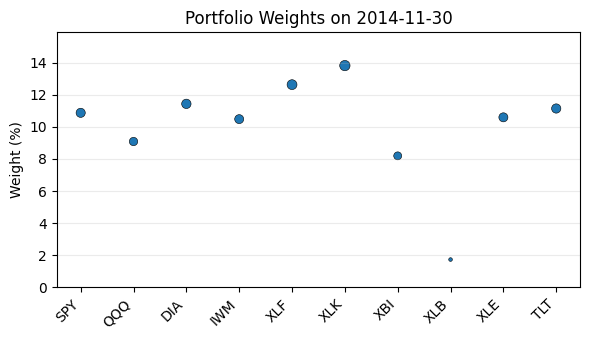


=== Rebalance on 2014-12-28 ===
Optimal portfolio
----------------------
 Investment in SPY : 9.66%
 Investment in QQQ : 11.89%
 Investment in DIA : 10.5%
 Investment in IWM : 9.8%
 Investment in XLF : 7.76%
 Investment in XLK : 16.93%
 Investment in XBI : 8.57%
 Investment in XLB : 4.04%
 Investment in XLE : 10.28%
 Investment in TLT : 10.57%
Cash: 0.0
----------------------
Exp ret = 4.554645293767158%
Expected risk = 0.001179010571550909%


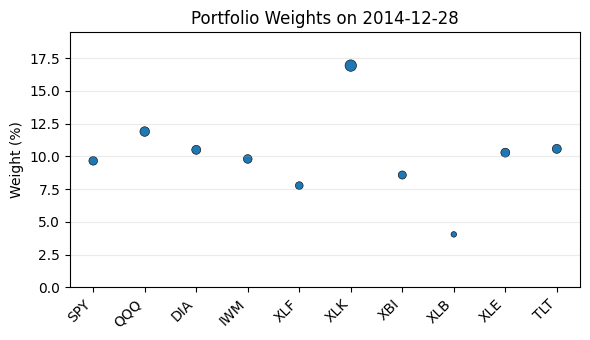


=== Rebalance on 2015-01-25 ===
Optimal portfolio
----------------------
 Investment in SPY : 9.26%
 Investment in QQQ : 9.52%
 Investment in DIA : 10.16%
 Investment in IWM : 9.4%
 Investment in XLF : 14.82%
 Investment in XLK : 16.77%
 Investment in XBI : 8.75%
 Investment in XLB : 3.26%
 Investment in XLE : 8.34%
 Investment in TLT : 9.72%
Cash: 0.0
----------------------
Exp ret = 1.9869358647430284%
Expected risk = 0.0005288844481445801%


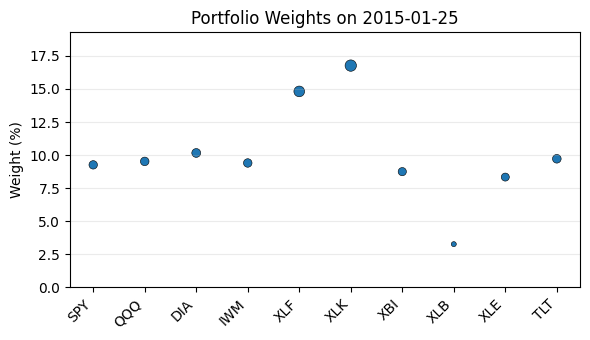


=== Rebalance on 2015-02-22 ===
Optimal portfolio
----------------------
 Investment in SPY : 8.62%
 Investment in QQQ : 10.03%
 Investment in DIA : 9.54%
 Investment in IWM : 9.01%
 Investment in XLF : 11.12%
 Investment in XLK : 15.93%
 Investment in XBI : 10.27%
 Investment in XLB : 8.55%
 Investment in XLE : 7.63%
 Investment in TLT : 9.31%
Cash: 0.0
----------------------
Exp ret = 2.002247345548697%
Expected risk = 0.0011042504266025458%


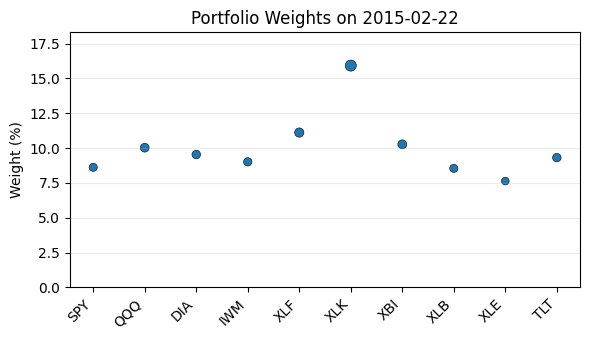


=== Rebalance on 2015-03-22 ===
Optimal portfolio
----------------------
 Investment in SPY : 8.96%
 Investment in QQQ : 10.67%
 Investment in DIA : 10.41%
 Investment in IWM : 9.1%
 Investment in XLF : 10.13%
 Investment in XLK : 18.18%
 Investment in XBI : 8.62%
 Investment in XLB : 6.56%
 Investment in XLE : 8.01%
 Investment in TLT : 9.37%
Cash: 0.0
----------------------
Exp ret = 2.3655579225938554%
Expected risk = 0.0006655786446824746%


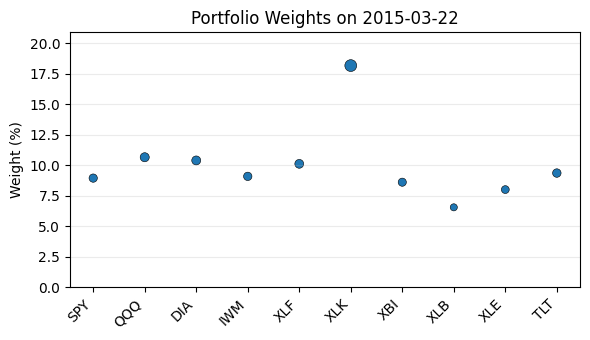


=== Rebalance on 2015-04-19 ===
Optimal portfolio
----------------------
 Investment in SPY : 9.36%
 Investment in QQQ : 10.94%
 Investment in DIA : 9.7%
 Investment in IWM : 9.56%
 Investment in XLF : 5.88%
 Investment in XLK : 14.35%
 Investment in XBI : 9.49%
 Investment in XLB : 11.52%
 Investment in XLE : 9.82%
 Investment in TLT : 9.38%
Cash: 0.0
----------------------
Exp ret = 2.443626356456595%
Expected risk = 0.0009967958438573473%


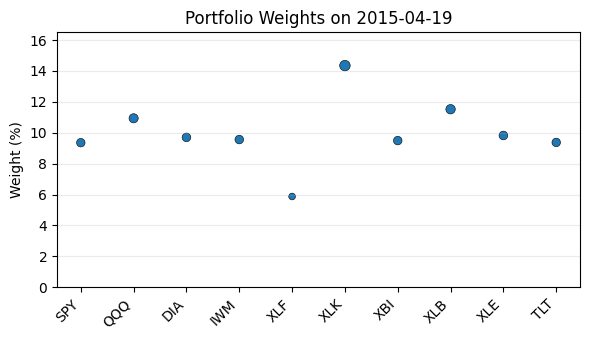


=== Rebalance on 2015-05-17 ===
Optimal portfolio
----------------------
 Investment in SPY : 9.91%
 Investment in QQQ : 10.0%
 Investment in DIA : 10.05%
 Investment in IWM : 10.06%
 Investment in XLF : 7.02%
 Investment in XLK : 12.11%
 Investment in XBI : 9.79%
 Investment in XLB : 10.83%
 Investment in XLE : 10.34%
 Investment in TLT : 9.89%
Cash: 0.0
----------------------
Exp ret = 0.5979515767965307%
Expected risk = 0.0008083152818514201%


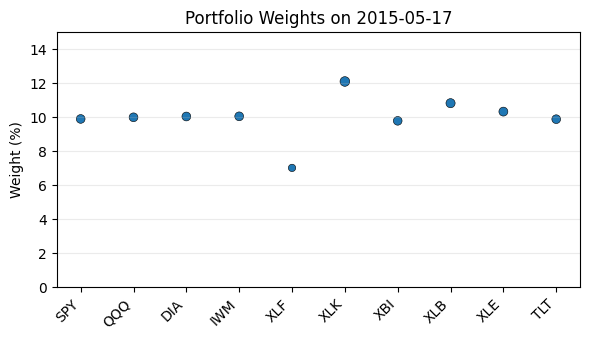


=== Rebalance on 2015-06-14 ===
Optimal portfolio
----------------------
 Investment in SPY : 9.77%
 Investment in QQQ : 10.22%
 Investment in DIA : 10.41%
 Investment in IWM : 9.98%
 Investment in XLF : 4.68%
 Investment in XLK : 13.26%
 Investment in XBI : 10.58%
 Investment in XLB : 9.46%
 Investment in XLE : 11.16%
 Investment in TLT : 10.46%
Cash: 0.0
----------------------
Exp ret = 1.140577148053681%
Expected risk = 0.0004038135539255113%


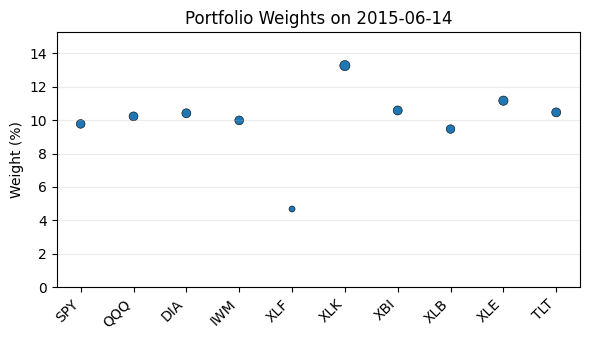


=== Rebalance on 2015-07-12 ===
Optimal portfolio
----------------------
 Investment in SPY : 10.52%
 Investment in QQQ : 10.62%
 Investment in DIA : 9.99%
 Investment in IWM : 10.41%
 Investment in XLF : 6.65%
 Investment in XLK : 14.77%
 Investment in XBI : 9.0%
 Investment in XLB : 6.54%
 Investment in XLE : 12.0%
 Investment in TLT : 9.5%
Cash: 0.0
----------------------
Exp ret = -0.40149920920754995%
Expected risk = 0.00032990430307591273%


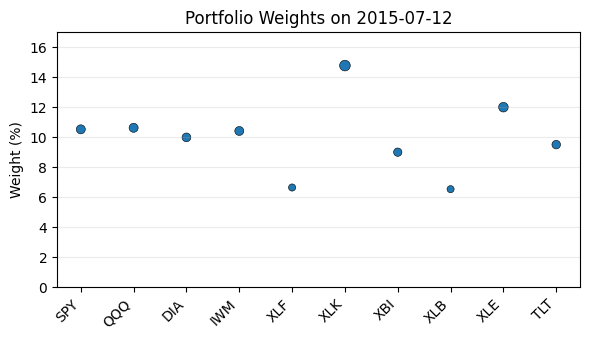


=== Rebalance on 2015-08-09 ===
Optimal portfolio
----------------------
 Investment in SPY : 9.56%
 Investment in QQQ : 10.04%
 Investment in DIA : 11.52%
 Investment in IWM : 10.67%
 Investment in XLF : 13.4%
 Investment in XLK : 12.22%
 Investment in XBI : 6.23%
 Investment in XLB : 3.83%
 Investment in XLE : 12.41%
 Investment in TLT : 10.14%
Cash: 0.0
----------------------
Exp ret = -0.5231654503653191%
Expected risk = 0.0008623338286217724%


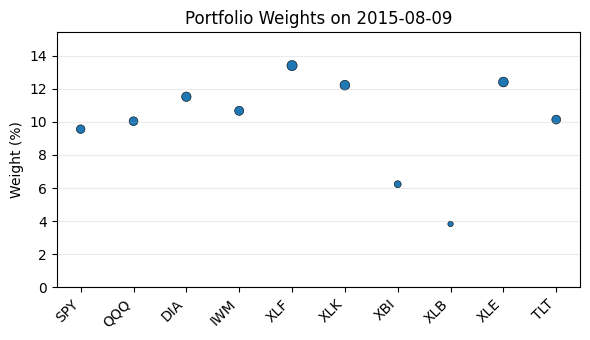


=== Rebalance on 2015-09-06 ===
Optimal portfolio
----------------------
 Investment in SPY : 9.71%
 Investment in QQQ : 9.0%
 Investment in DIA : 11.11%
 Investment in IWM : 10.52%
 Investment in XLF : 16.48%
 Investment in XLK : 8.04%
 Investment in XBI : 6.66%
 Investment in XLB : 6.93%
 Investment in XLE : 10.61%
 Investment in TLT : 10.94%
Cash: 0.0
----------------------
Exp ret = -2.816354475191629%
Expected risk = 0.0016770549306569429%


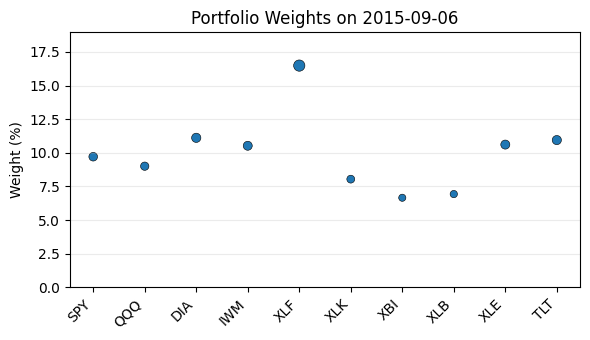


=== Rebalance on 2015-10-04 ===
Optimal portfolio
----------------------
 Investment in SPY : 10.86%
 Investment in QQQ : 9.17%
 Investment in DIA : 10.86%
 Investment in IWM : 11.12%
 Investment in XLF : 17.67%
 Investment in XLK : 1.0%
 Investment in XBI : 8.61%
 Investment in XLB : 9.41%
 Investment in XLE : 9.99%
 Investment in TLT : 11.31%
Cash: 0.0
----------------------
Exp ret = -2.5340371217454214%
Expected risk = 0.0014781128186039944%


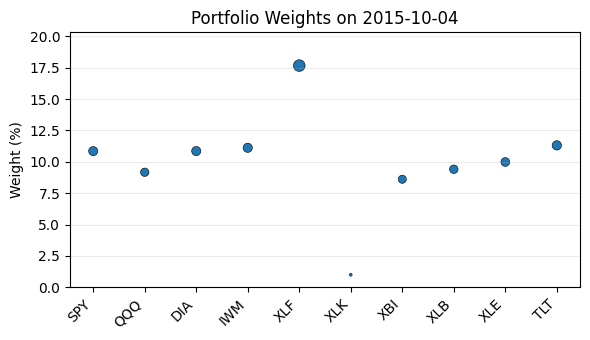


=== Rebalance on 2015-11-01 ===
Optimal portfolio
----------------------
 Investment in SPY : 11.28%
 Investment in QQQ : 8.88%
 Investment in DIA : 11.82%
 Investment in IWM : 10.54%
 Investment in XLF : 11.12%
 Investment in XLK : 5.08%
 Investment in XBI : 10.38%
 Investment in XLB : 10.09%
 Investment in XLE : 8.74%
 Investment in TLT : 12.08%
Cash: 0.0
----------------------
Exp ret = -0.05086032516036271%
Expected risk = 0.0025811037147617957%


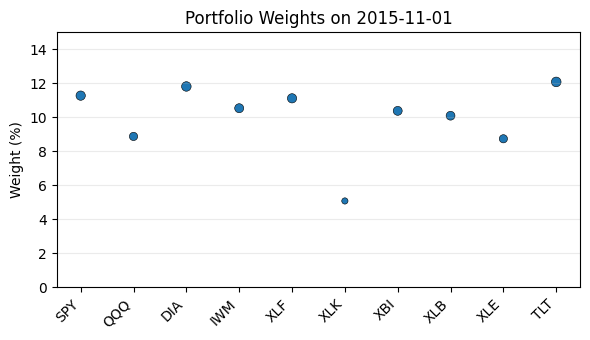


=== Rebalance on 2015-11-29 ===
Optimal portfolio
----------------------
 Investment in SPY : 11.44%
 Investment in QQQ : 9.42%
 Investment in DIA : 11.3%
 Investment in IWM : 10.7%
 Investment in XLF : 8.05%
 Investment in XLK : 5.21%
 Investment in XBI : 10.73%
 Investment in XLB : 10.99%
 Investment in XLE : 10.66%
 Investment in TLT : 11.5%
Cash: 0.0
----------------------
Exp ret = 2.345261487011799%
Expected risk = 0.0017124531734988375%


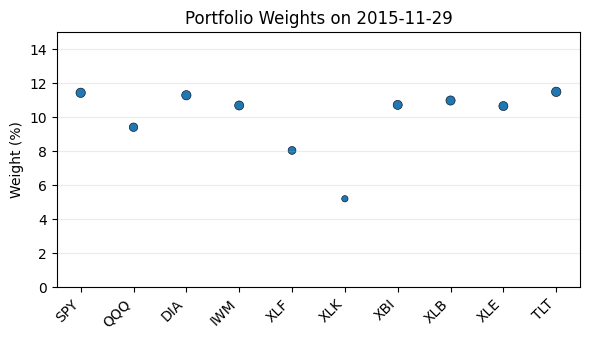


=== Rebalance on 2015-12-27 ===
Optimal portfolio
----------------------
 Investment in SPY : 10.53%
 Investment in QQQ : 8.57%
 Investment in DIA : 11.71%
 Investment in IWM : 10.31%
 Investment in XLF : 9.73%
 Investment in XLK : 13.42%
 Investment in XBI : 9.42%
 Investment in XLB : 4.33%
 Investment in XLE : 10.8%
 Investment in TLT : 11.18%
Cash: 0.0
----------------------
Exp ret = 1.277468201155604%
Expected risk = 0.002080804631690774%


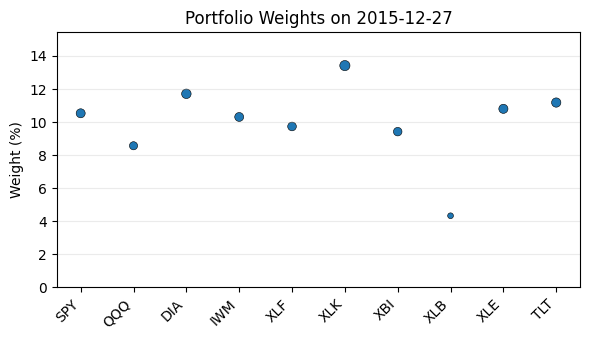


=== Rebalance on 2016-01-24 ===
Optimal portfolio
----------------------
 Investment in SPY : 10.9%
 Investment in QQQ : 8.34%
 Investment in DIA : 11.03%
 Investment in IWM : 11.35%
 Investment in XLF : 18.95%
 Investment in XLK : 4.73%
 Investment in XBI : 8.46%
 Investment in XLB : 5.78%
 Investment in XLE : 8.98%
 Investment in TLT : 11.47%
Cash: 0.0
----------------------
Exp ret = -3.1308654631246893%
Expected risk = 0.0023363453404724698%


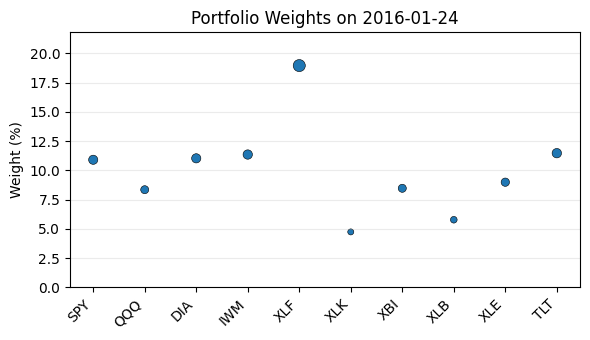


=== Rebalance on 2016-02-21 ===
Optimal portfolio
----------------------
 Investment in SPY : 11.34%
 Investment in QQQ : 8.05%
 Investment in DIA : 9.58%
 Investment in IWM : 11.37%
 Investment in XLF : 19.91%
 Investment in XLK : 1.0%
 Investment in XBI : 10.25%
 Investment in XLB : 9.53%
 Investment in XLE : 7.84%
 Investment in TLT : 11.13%
Cash: 0.0
----------------------
Exp ret = -2.384019152147284%
Expected risk = 0.0021779234954974144%


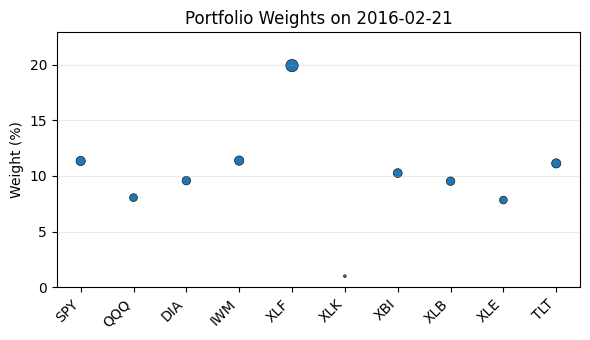


=== Rebalance on 2016-03-20 ===
Optimal portfolio
----------------------
 Investment in SPY : 11.13%
 Investment in QQQ : 9.16%
 Investment in DIA : 8.61%
 Investment in IWM : 10.6%
 Investment in XLF : 14.56%
 Investment in XLK : 1.0%
 Investment in XBI : 12.66%
 Investment in XLB : 12.73%
 Investment in XLE : 8.29%
 Investment in TLT : 11.26%
Cash: 0.0
----------------------
Exp ret = 0.710410973772086%
Expected risk = 0.0027415544455988232%


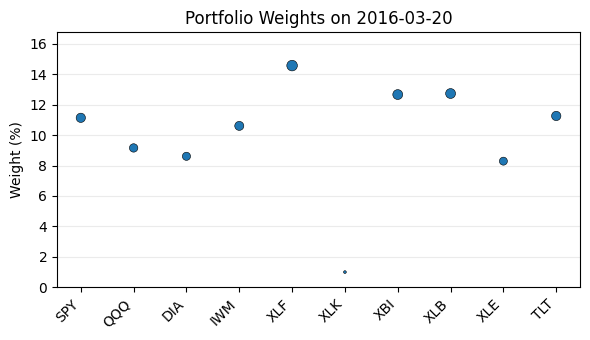


=== Rebalance on 2016-04-17 ===
Optimal portfolio
----------------------
 Investment in SPY : 10.04%
 Investment in QQQ : 10.0%
 Investment in DIA : 8.81%
 Investment in IWM : 9.35%
 Investment in XLF : 8.19%
 Investment in XLK : 11.25%
 Investment in XBI : 14.16%
 Investment in XLB : 10.28%
 Investment in XLE : 8.48%
 Investment in TLT : 9.45%
Cash: 0.0
----------------------
Exp ret = 3.6080815681087524%
Expected risk = 0.0013254276103252347%


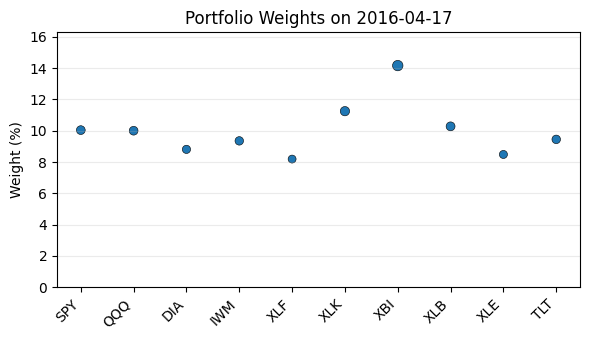


=== Rebalance on 2016-05-15 ===
Optimal portfolio
----------------------
 Investment in SPY : 9.96%
 Investment in QQQ : 10.2%
 Investment in DIA : 8.43%
 Investment in IWM : 9.81%
 Investment in XLF : 8.59%
 Investment in XLK : 8.52%
 Investment in XBI : 11.53%
 Investment in XLB : 13.55%
 Investment in XLE : 10.74%
 Investment in TLT : 8.67%
Cash: 0.0
----------------------
Exp ret = 2.410367801272735%
Expected risk = 0.0010262208380853923%


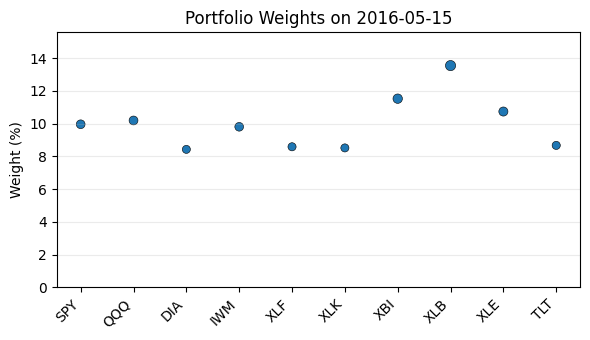


=== Rebalance on 2016-06-12 ===
Optimal portfolio
----------------------
 Investment in SPY : 8.81%
 Investment in QQQ : 11.34%
 Investment in DIA : 8.33%
 Investment in IWM : 9.17%
 Investment in XLF : 9.99%
 Investment in XLK : 12.58%
 Investment in XBI : 10.78%
 Investment in XLB : 11.67%
 Investment in XLE : 9.32%
 Investment in TLT : 8.0%
Cash: 0.0
----------------------
Exp ret = 2.170645370153884%
Expected risk = 0.0009322601698823156%


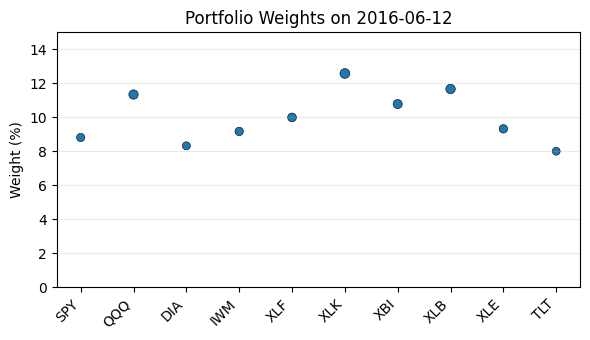


=== Rebalance on 2016-07-10 ===
Optimal portfolio
----------------------
 Investment in SPY : 9.66%
 Investment in QQQ : 10.08%
 Investment in DIA : 9.67%
 Investment in IWM : 10.07%
 Investment in XLF : 14.61%
 Investment in XLK : 8.91%
 Investment in XBI : 9.09%
 Investment in XLB : 9.9%
 Investment in XLE : 8.05%
 Investment in TLT : 9.97%
Cash: 0.0
----------------------
Exp ret = 1.069129772820527%
Expected risk = 0.001087480421920271%


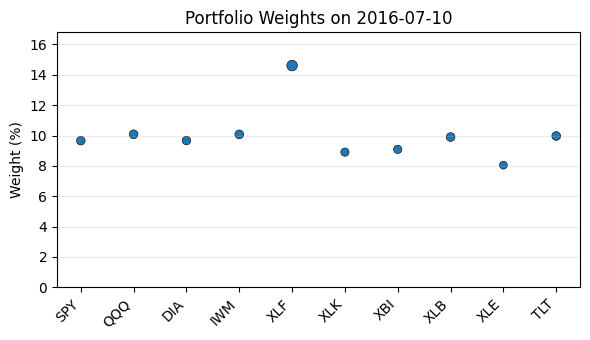


=== Rebalance on 2016-08-07 ===
Optimal portfolio
----------------------
 Investment in SPY : 9.32%
 Investment in QQQ : 11.12%
 Investment in DIA : 10.66%
 Investment in IWM : 9.33%
 Investment in XLF : 9.44%
 Investment in XLK : 14.22%
 Investment in XBI : 9.05%
 Investment in XLB : 7.73%
 Investment in XLE : 8.15%
 Investment in TLT : 10.97%
Cash: 0.0
----------------------
Exp ret = 3.2824854050462577%
Expected risk = 0.0010978450580569734%


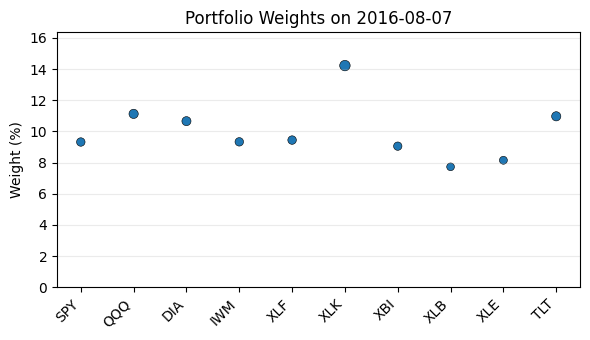


=== Rebalance on 2016-09-04 ===
Optimal portfolio
----------------------
 Investment in SPY : 9.05%
 Investment in QQQ : 10.92%
 Investment in DIA : 11.1%
 Investment in IWM : 9.44%
 Investment in XLF : 7.96%
 Investment in XLK : 12.19%
 Investment in XBI : 8.88%
 Investment in XLB : 8.54%
 Investment in XLE : 10.71%
 Investment in TLT : 11.23%
Cash: 0.0
----------------------
Exp ret = 2.893093618747377%
Expected risk = 0.0006391720069218671%


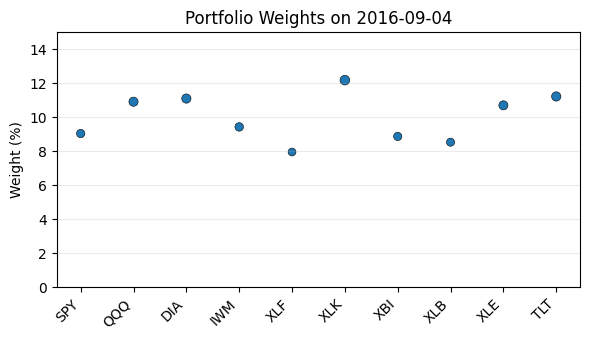


=== Rebalance on 2016-10-02 ===
Optimal portfolio
----------------------
 Investment in SPY : 8.2%
 Investment in QQQ : 10.1%
 Investment in DIA : 11.27%
 Investment in IWM : 8.75%
 Investment in XLF : 8.35%
 Investment in XLK : 15.37%
 Investment in XBI : 7.7%
 Investment in XLB : 9.8%
 Investment in XLE : 9.13%
 Investment in TLT : 11.33%
Cash: 0.0
----------------------
Exp ret = 1.682116272278026%
Expected risk = 0.00036521228763081837%


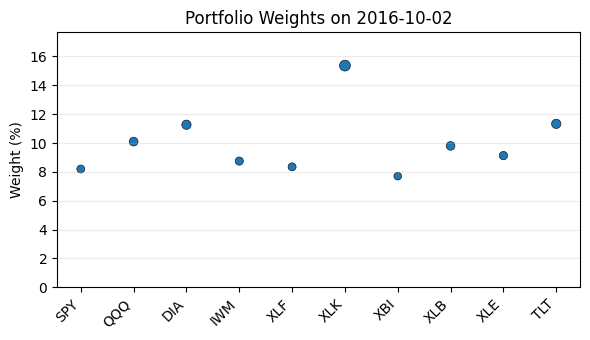


=== Rebalance on 2016-10-30 ===
Optimal portfolio
----------------------
 Investment in SPY : 10.12%
 Investment in QQQ : 9.46%
 Investment in DIA : 11.01%
 Investment in IWM : 9.9%
 Investment in XLF : 7.86%
 Investment in XLK : 6.84%
 Investment in XBI : 9.54%
 Investment in XLB : 11.75%
 Investment in XLE : 12.08%
 Investment in TLT : 11.45%
Cash: 0.0
----------------------
Exp ret = -0.49610295489793765%
Expected risk = 0.00043081105455089995%


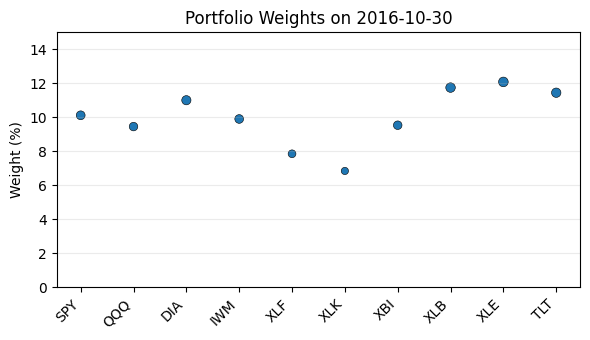


=== Rebalance on 2016-11-27 ===
Optimal portfolio
----------------------
 Investment in SPY : 10.43%
 Investment in QQQ : 12.11%
 Investment in DIA : 9.63%
 Investment in IWM : 9.61%
 Investment in XLF : 3.41%
 Investment in XLK : 11.17%
 Investment in XBI : 9.9%
 Investment in XLB : 9.99%
 Investment in XLE : 13.98%
 Investment in TLT : 9.78%
Cash: 0.0
----------------------
Exp ret = 2.672272850792505%
Expected risk = 0.0022796984997240045%


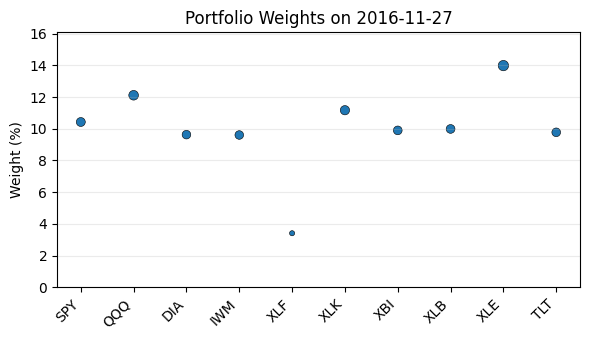


=== Performance 2012 ===
Average Monthly Return   : -0.01%
Monthly Sharpe Ratio     : -0.002
Annualized Sharpe Ratio  : -0.007
Maximum Drawdown         : 7.28%

=== Performance 2013 ===
Average Monthly Return   : 1.51%
Monthly Sharpe Ratio     : 0.679
Annualized Sharpe Ratio  : 2.352
Maximum Drawdown         : 1.58%

=== Performance 2014 ===
Average Monthly Return   : 1.23%
Monthly Sharpe Ratio     : 0.584
Annualized Sharpe Ratio  : 2.024
Maximum Drawdown         : 1.66%

=== Performance 2015 ===
Average Monthly Return   : -1.11%
Monthly Sharpe Ratio     : -0.317
Annualized Sharpe Ratio  : -1.097
Maximum Drawdown         : 20.88%

=== Performance 2016 ===
Average Monthly Return   : 1.96%
Monthly Sharpe Ratio     : 0.717
Annualized Sharpe Ratio  : 2.484
Maximum Drawdown         : 2.36%


In [31]:
print("\nTesting PBR Regularization:")
rebalance_with_regularization(reg_type="PBR", gamma=0.03, epsilon=0.45, verbose=True);

[                       0%                       ]


Testing CVaR PBR Regularization:


[*********************100%***********************]  10 of 10 completed



=== Rebalance on 2012-03-25 ===
Optimal portfolio
----------------------
 Investment in SPY : 8.71%
 Investment in QQQ : 10.56%
 Investment in DIA : 12.69%
 Investment in IWM : 10.19%
 Investment in XLF : 4.02%
 Investment in XLK : 11.57%
 Investment in XBI : 8.85%
 Investment in XLB : 7.3%
 Investment in XLE : 13.47%
 Investment in TLT : 12.64%
Cash: 0.0
----------------------
Exp ret = 3.9695207959431036%
Expected risk = 0.0005505950760523827%


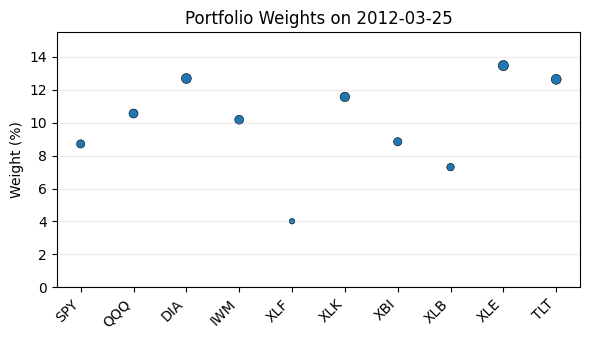


=== Rebalance on 2012-04-22 ===
Optimal portfolio
----------------------
 Investment in SPY : 10.41%
 Investment in QQQ : 8.29%
 Investment in DIA : 12.31%
 Investment in IWM : 10.97%
 Investment in XLF : 10.21%
 Investment in XLK : 8.77%
 Investment in XBI : 8.1%
 Investment in XLB : 7.42%
 Investment in XLE : 11.23%
 Investment in TLT : 12.28%
Cash: 0.0
----------------------
Exp ret = 0.5496711998905097%
Expected risk = 0.00039065072334648865%


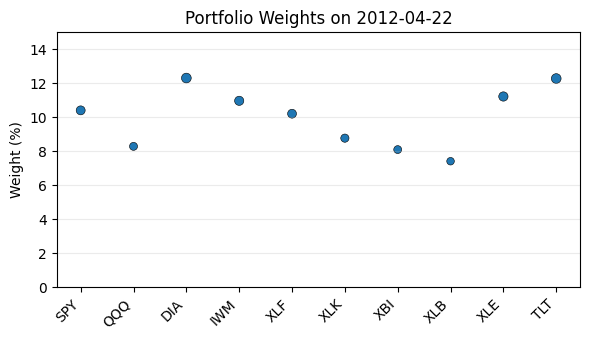


=== Rebalance on 2012-05-20 ===
Optimal portfolio
----------------------
 Investment in SPY : 10.3%
 Investment in QQQ : 9.36%
 Investment in DIA : 9.61%
 Investment in IWM : 10.04%
 Investment in XLF : 15.43%
 Investment in XLK : 13.71%
 Investment in XBI : 6.78%
 Investment in XLB : 5.56%
 Investment in XLE : 9.22%
 Investment in TLT : 9.99%
Cash: 0.0
----------------------
Exp ret = -1.2267456296267707%
Expected risk = 0.001199102234483097%


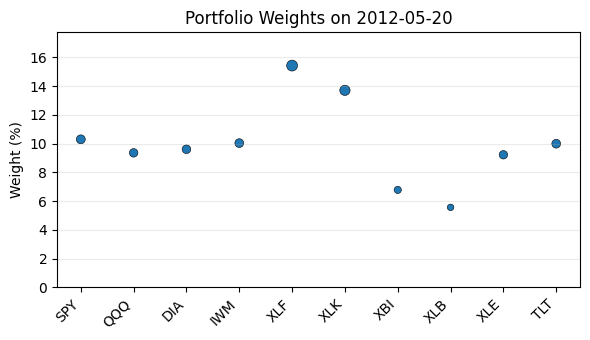


=== Rebalance on 2012-06-17 ===
Optimal portfolio
----------------------
 Investment in SPY : 10.21%
 Investment in QQQ : 8.5%
 Investment in DIA : 8.46%
 Investment in IWM : 9.38%
 Investment in XLF : 17.37%
 Investment in XLK : 13.74%
 Investment in XBI : 8.58%
 Investment in XLB : 7.62%
 Investment in XLE : 7.32%
 Investment in TLT : 8.82%
Cash: 0.0
----------------------
Exp ret = -0.3945899107637662%
Expected risk = 0.0016667293147472157%


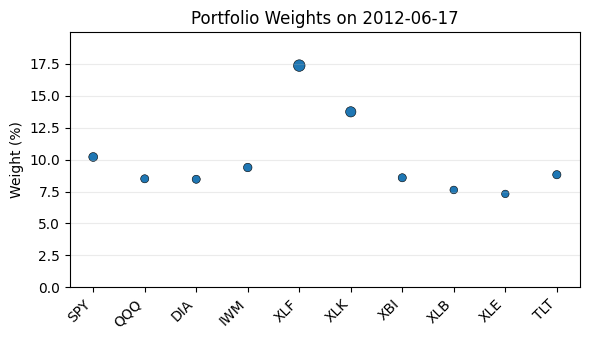


=== Rebalance on 2012-07-15 ===
Optimal portfolio
----------------------
 Investment in SPY : 9.27%
 Investment in QQQ : 9.44%
 Investment in DIA : 8.05%
 Investment in IWM : 9.3%
 Investment in XLF : 15.31%
 Investment in XLK : 15.63%
 Investment in XBI : 8.18%
 Investment in XLB : 8.28%
 Investment in XLE : 8.5%
 Investment in TLT : 8.03%
Cash: 0.0
----------------------
Exp ret = 0.28983273424863404%
Expected risk = 0.0017236624309065703%


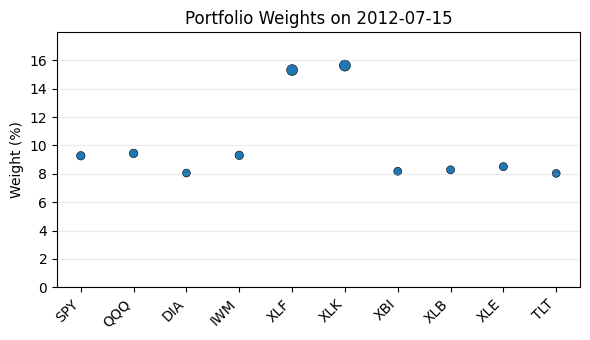


=== Rebalance on 2012-08-12 ===
Optimal portfolio
----------------------
 Investment in SPY : 9.89%
 Investment in QQQ : 9.21%
 Investment in DIA : 10.5%
 Investment in IWM : 10.16%
 Investment in XLF : 8.2%
 Investment in XLK : 8.97%
 Investment in XBI : 9.99%
 Investment in XLB : 12.16%
 Investment in XLE : 10.19%
 Investment in TLT : 10.74%
Cash: 0.0
----------------------
Exp ret = 2.5687768076631516%
Expected risk = 0.0010123679558412771%


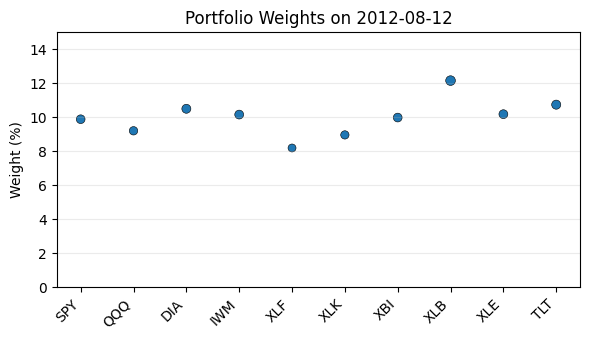


=== Rebalance on 2012-09-09 ===
Optimal portfolio
----------------------
 Investment in SPY : 9.05%
 Investment in QQQ : 10.59%
 Investment in DIA : 10.68%
 Investment in IWM : 10.06%
 Investment in XLF : 6.4%
 Investment in XLK : 8.79%
 Investment in XBI : 10.07%
 Investment in XLB : 13.24%
 Investment in XLE : 10.61%
 Investment in TLT : 10.51%
Cash: 0.0
----------------------
Exp ret = 3.0885881163881757%
Expected risk = 0.0003833728062911368%


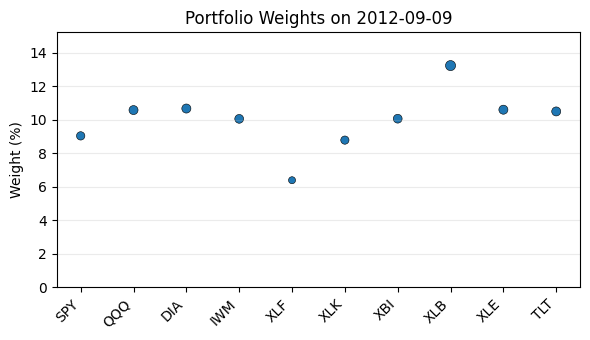


=== Rebalance on 2012-10-07 ===
Optimal portfolio
----------------------
 Investment in SPY : 10.34%
 Investment in QQQ : 10.45%
 Investment in DIA : 10.7%
 Investment in IWM : 10.69%
 Investment in XLF : 4.43%
 Investment in XLK : 9.48%
 Investment in XBI : 9.86%
 Investment in XLB : 10.66%
 Investment in XLE : 12.62%
 Investment in TLT : 10.78%
Cash: 0.0
----------------------
Exp ret = 2.5272983191072402%
Expected risk = 0.0006558862773840892%


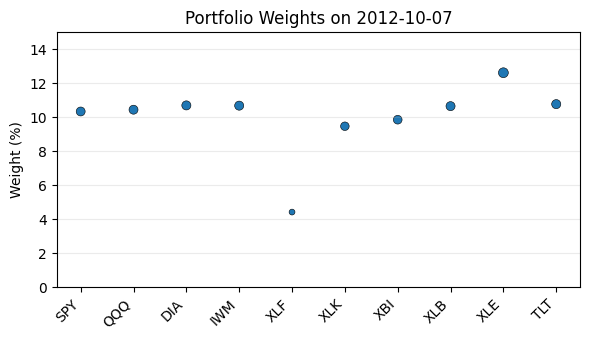


=== Rebalance on 2012-11-04 ===
Optimal portfolio
----------------------
 Investment in SPY : 10.03%
 Investment in QQQ : 10.29%
 Investment in DIA : 8.35%
 Investment in IWM : 10.41%
 Investment in XLF : 10.91%
 Investment in XLK : 8.88%
 Investment in XBI : 10.46%
 Investment in XLB : 9.67%
 Investment in XLE : 13.17%
 Investment in TLT : 7.84%
Cash: 0.0
----------------------
Exp ret = -0.07892047911689423%
Expected risk = 0.0006621509622260213%


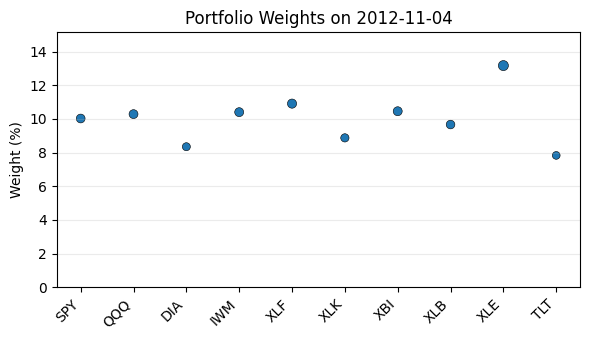


=== Rebalance on 2012-12-02 ===
Optimal portfolio
----------------------
 Investment in SPY : 9.99%
 Investment in QQQ : 9.56%
 Investment in DIA : 8.92%
 Investment in IWM : 10.33%
 Investment in XLF : 14.23%
 Investment in XLK : 9.81%
 Investment in XBI : 9.96%
 Investment in XLB : 8.52%
 Investment in XLE : 10.45%
 Investment in TLT : 8.24%
Cash: 0.0
----------------------
Exp ret = -1.0705144192171074%
Expected risk = 0.000773205099493457%


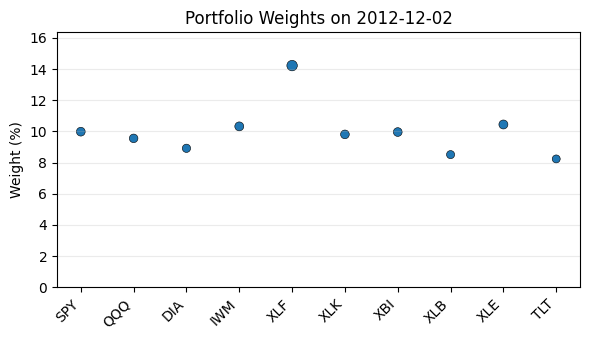


=== Rebalance on 2012-12-30 ===
Optimal portfolio
----------------------
 Investment in SPY : 9.62%
 Investment in QQQ : 11.35%
 Investment in DIA : 8.96%
 Investment in IWM : 10.1%
 Investment in XLF : 10.53%
 Investment in XLK : 7.88%
 Investment in XBI : 11.7%
 Investment in XLB : 9.22%
 Investment in XLE : 12.08%
 Investment in TLT : 8.56%
Cash: 0.0
----------------------
Exp ret = -0.3603991037671352%
Expected risk = 0.0008111609097395889%


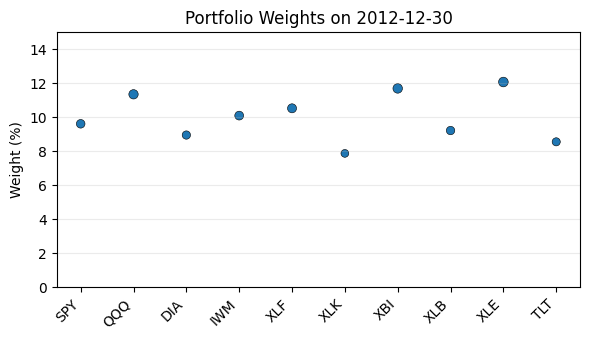


=== Rebalance on 2013-01-27 ===
Optimal portfolio
----------------------
 Investment in SPY : 10.11%
 Investment in QQQ : 12.28%
 Investment in DIA : 8.91%
 Investment in IWM : 10.29%
 Investment in XLF : 3.34%
 Investment in XLK : 12.38%
 Investment in XBI : 11.67%
 Investment in XLB : 11.0%
 Investment in XLE : 11.91%
 Investment in TLT : 8.1%
Cash: 0.0
----------------------
Exp ret = 3.7583503535580736%
Expected risk = 0.0015499598636630975%


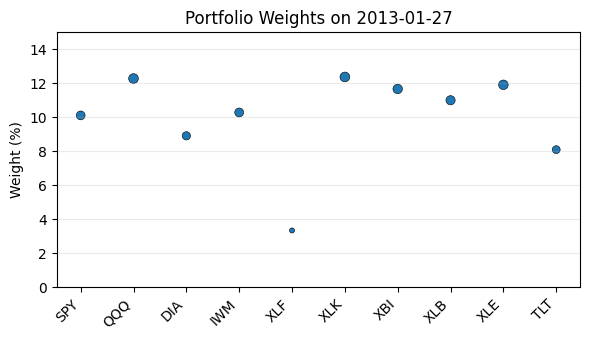


=== Rebalance on 2013-02-24 ===
Optimal portfolio
----------------------
 Investment in SPY : 10.18%
 Investment in QQQ : 12.19%
 Investment in DIA : 8.89%
 Investment in IWM : 10.36%
 Investment in XLF : 4.62%
 Investment in XLK : 11.42%
 Investment in XBI : 10.21%
 Investment in XLB : 11.3%
 Investment in XLE : 12.03%
 Investment in TLT : 8.79%
Cash: 0.0
----------------------
Exp ret = 2.754646337935241%
Expected risk = 0.0009304177789191883%


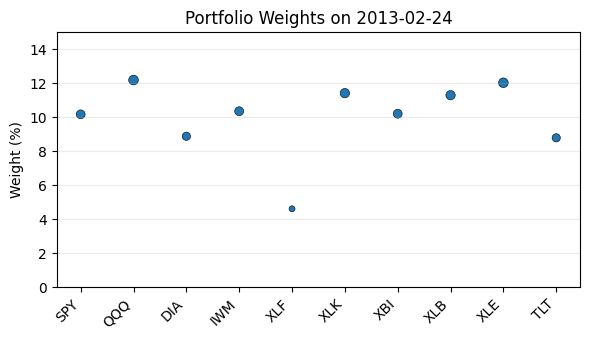


=== Rebalance on 2013-03-24 ===
Optimal portfolio
----------------------
 Investment in SPY : 11.53%
 Investment in QQQ : 11.22%
 Investment in DIA : 9.15%
 Investment in IWM : 10.71%
 Investment in XLF : 7.56%
 Investment in XLK : 10.74%
 Investment in XBI : 8.42%
 Investment in XLB : 10.91%
 Investment in XLE : 10.82%
 Investment in TLT : 8.94%
Cash: 0.0
----------------------
Exp ret = 1.9857153226766202%
Expected risk = 0.00022232934106843316%


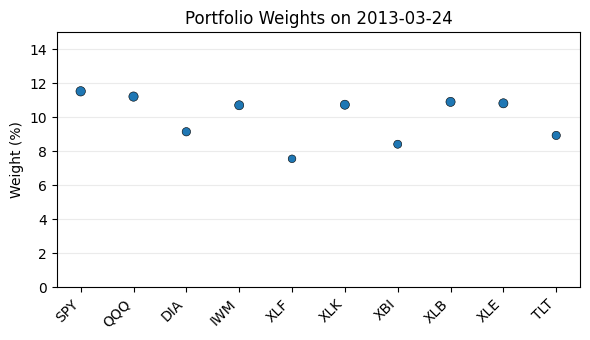


=== Rebalance on 2013-04-21 ===
Optimal portfolio
----------------------
 Investment in SPY : 11.02%
 Investment in QQQ : 9.38%
 Investment in DIA : 9.5%
 Investment in IWM : 10.55%
 Investment in XLF : 12.22%
 Investment in XLK : 13.66%
 Investment in XBI : 7.26%
 Investment in XLB : 7.24%
 Investment in XLE : 10.46%
 Investment in TLT : 8.71%
Cash: 0.0
----------------------
Exp ret = 1.075172207620412%
Expected risk = 0.000504812234551943%


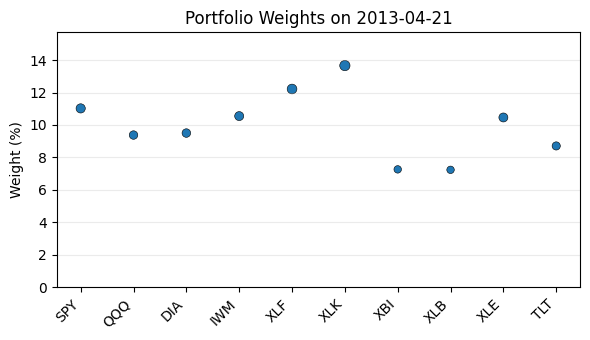


=== Rebalance on 2013-05-19 ===
Optimal portfolio
----------------------
 Investment in SPY : 10.03%
 Investment in QQQ : 10.16%
 Investment in DIA : 10.66%
 Investment in IWM : 10.5%
 Investment in XLF : 5.68%
 Investment in XLK : 12.87%
 Investment in XBI : 9.43%
 Investment in XLB : 8.8%
 Investment in XLE : 11.87%
 Investment in TLT : 10.0%
Cash: 0.0
----------------------
Exp ret = 3.5193701199548837%
Expected risk = 0.0009604002075803359%


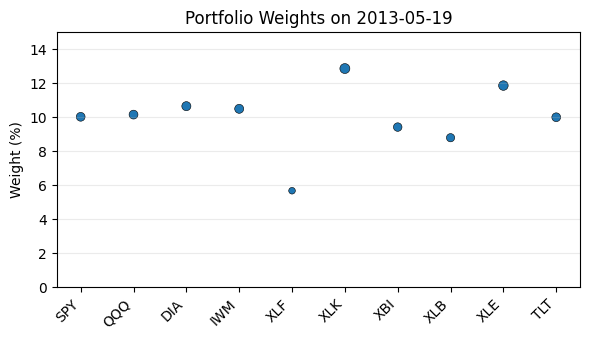


=== Rebalance on 2013-06-16 ===
Optimal portfolio
----------------------
 Investment in SPY : 10.25%
 Investment in QQQ : 10.17%
 Investment in DIA : 10.62%
 Investment in IWM : 10.3%
 Investment in XLF : 7.22%
 Investment in XLK : 11.26%
 Investment in XBI : 9.47%
 Investment in XLB : 8.87%
 Investment in XLE : 11.72%
 Investment in TLT : 10.13%
Cash: 0.0
----------------------
Exp ret = 1.4234386188922261%
Expected risk = 0.0010007496244425658%


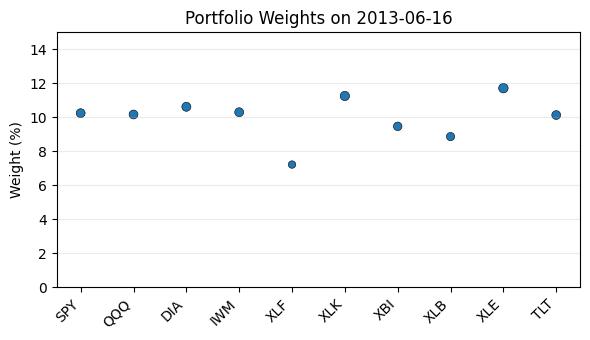


=== Rebalance on 2013-07-14 ===
Optimal portfolio
----------------------
 Investment in SPY : 9.83%
 Investment in QQQ : 12.2%
 Investment in DIA : 11.21%
 Investment in IWM : 10.26%
 Investment in XLF : 1.63%
 Investment in XLK : 13.11%
 Investment in XBI : 9.1%
 Investment in XLB : 10.37%
 Investment in XLE : 11.81%
 Investment in TLT : 10.46%
Cash: 0.0
----------------------
Exp ret = 2.8789691539726774%
Expected risk = 0.0014565715386586102%


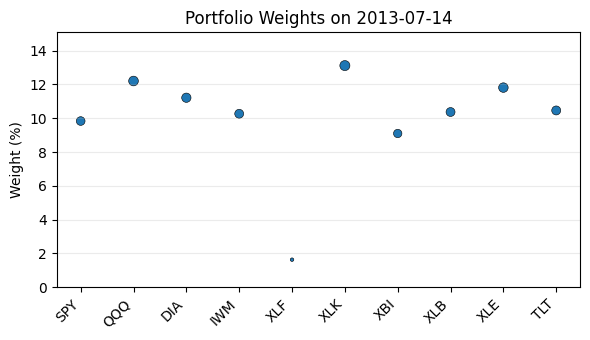


=== Rebalance on 2013-08-11 ===
Optimal portfolio
----------------------
 Investment in SPY : 9.34%
 Investment in QQQ : 11.79%
 Investment in DIA : 10.85%
 Investment in IWM : 10.14%
 Investment in XLF : 5.34%
 Investment in XLK : 12.95%
 Investment in XBI : 10.06%
 Investment in XLB : 9.52%
 Investment in XLE : 10.57%
 Investment in TLT : 9.44%
Cash: 0.0
----------------------
Exp ret = 1.302668753564119%
Expected risk = 0.0012186132996785373%


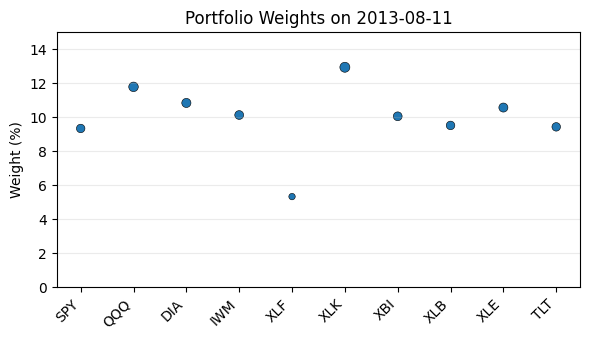


=== Rebalance on 2013-09-08 ===
Optimal portfolio
----------------------
 Investment in SPY : 7.88%
 Investment in QQQ : 10.39%
 Investment in DIA : 11.39%
 Investment in IWM : 9.4%
 Investment in XLF : 5.18%
 Investment in XLK : 17.25%
 Investment in XBI : 10.15%
 Investment in XLB : 10.08%
 Investment in XLE : 9.01%
 Investment in TLT : 9.27%
Cash: 0.0
----------------------
Exp ret = 3.0210110747693775%
Expected risk = 0.0013433602241534684%


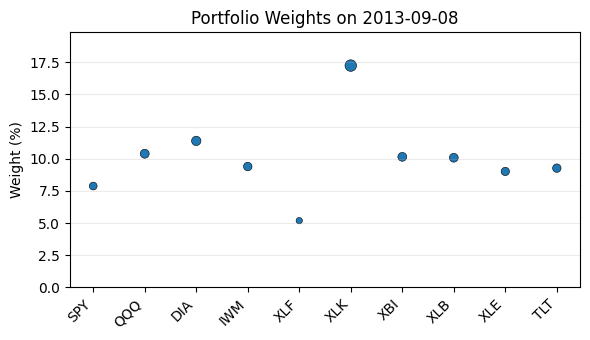


=== Rebalance on 2013-10-06 ===
Optimal portfolio
----------------------
 Investment in SPY : 8.0%
 Investment in QQQ : 10.44%
 Investment in DIA : 12.1%
 Investment in IWM : 9.27%
 Investment in XLF : 7.92%
 Investment in XLK : 13.14%
 Investment in XBI : 11.62%
 Investment in XLB : 9.32%
 Investment in XLE : 7.81%
 Investment in TLT : 10.37%
Cash: 0.0
----------------------
Exp ret = 1.0021722461406066%
Expected risk = 0.0007213272949292602%


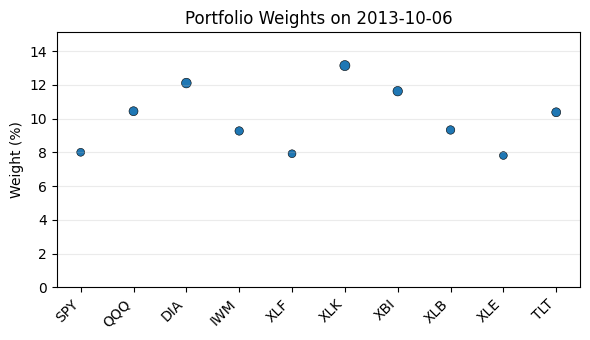


=== Rebalance on 2013-11-03 ===
Optimal portfolio
----------------------
 Investment in SPY : 9.19%
 Investment in QQQ : 10.55%
 Investment in DIA : 11.71%
 Investment in IWM : 10.33%
 Investment in XLF : 8.82%
 Investment in XLK : 9.47%
 Investment in XBI : 10.72%
 Investment in XLB : 10.19%
 Investment in XLE : 8.9%
 Investment in TLT : 10.12%
Cash: 0.0
----------------------
Exp ret = 2.2429532438419204%
Expected risk = 0.0006348526803560962%


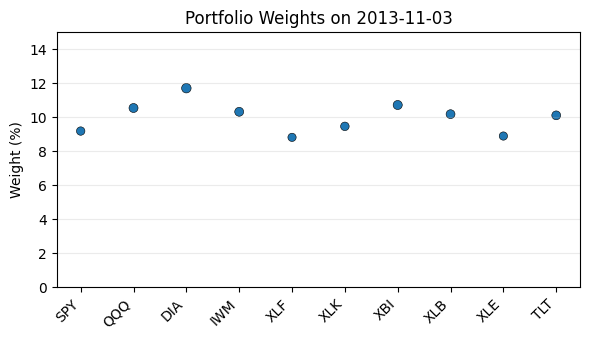


=== Rebalance on 2013-12-01 ===
Optimal portfolio
----------------------
 Investment in SPY : 9.65%
 Investment in QQQ : 11.17%
 Investment in DIA : 11.82%
 Investment in IWM : 10.65%
 Investment in XLF : 8.05%
 Investment in XLK : 8.47%
 Investment in XBI : 9.93%
 Investment in XLB : 8.95%
 Investment in XLE : 10.39%
 Investment in TLT : 10.92%
Cash: 0.0
----------------------
Exp ret = 2.2368588563280345%
Expected risk = 0.0003764127779930975%


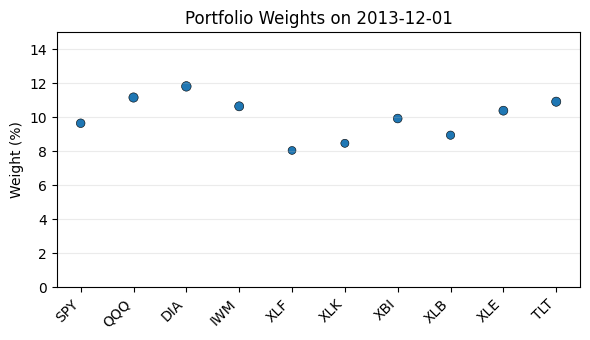


=== Rebalance on 2013-12-29 ===
Optimal portfolio
----------------------
 Investment in SPY : 10.56%
 Investment in QQQ : 9.87%
 Investment in DIA : 11.47%
 Investment in IWM : 10.52%
 Investment in XLF : 5.45%
 Investment in XLK : 10.93%
 Investment in XBI : 10.66%
 Investment in XLB : 9.12%
 Investment in XLE : 10.2%
 Investment in TLT : 11.2%
Cash: 0.0
----------------------
Exp ret = 2.8643562810802403%
Expected risk = 0.0007389860108457503%


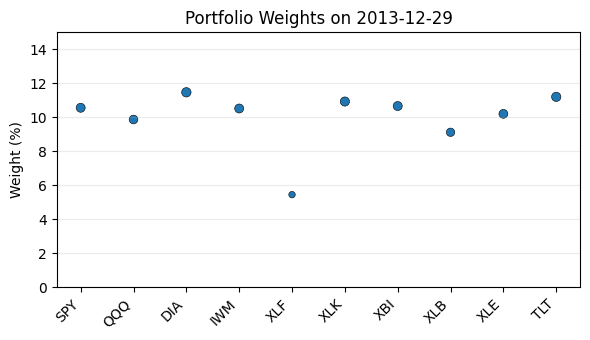


=== Rebalance on 2014-01-26 ===
Optimal portfolio
----------------------
 Investment in SPY : 8.36%
 Investment in QQQ : 9.74%
 Investment in DIA : 10.22%
 Investment in IWM : 8.48%
 Investment in XLF : 9.87%
 Investment in XLK : 20.38%
 Investment in XBI : 7.82%
 Investment in XLB : 6.86%
 Investment in XLE : 8.6%
 Investment in TLT : 9.67%
Cash: 0.0
----------------------
Exp ret = 2.9075743911555567%
Expected risk = 0.0013657836853117728%


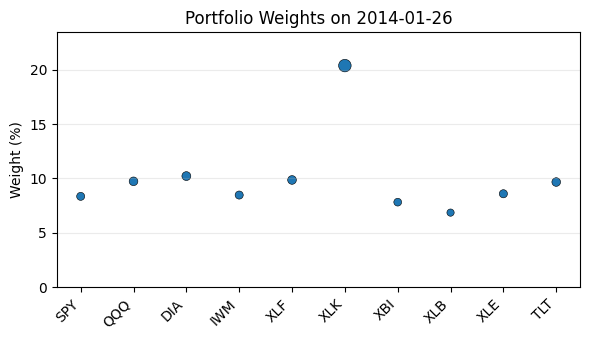


=== Rebalance on 2014-02-23 ===
Optimal portfolio
----------------------
 Investment in SPY : 7.98%
 Investment in QQQ : 9.1%
 Investment in DIA : 9.8%
 Investment in IWM : 8.61%
 Investment in XLF : 9.65%
 Investment in XLK : 19.75%
 Investment in XBI : 9.9%
 Investment in XLB : 7.85%
 Investment in XLE : 8.04%
 Investment in TLT : 9.32%
Cash: 0.0
----------------------
Exp ret = 2.916224281420067%
Expected risk = 0.0014911001602311074%


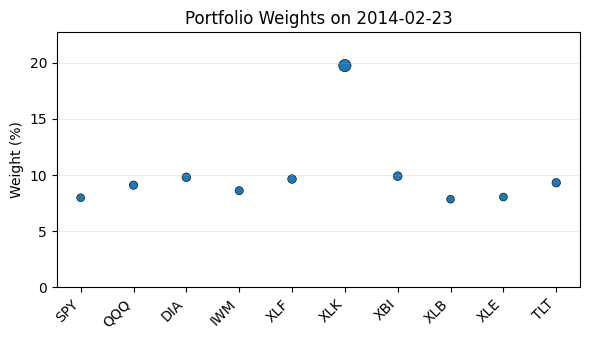


=== Rebalance on 2014-03-23 ===
Optimal portfolio
----------------------
 Investment in SPY : 7.83%
 Investment in QQQ : 9.69%
 Investment in DIA : 9.54%
 Investment in IWM : 8.96%
 Investment in XLF : 11.0%
 Investment in XLK : 16.21%
 Investment in XBI : 9.79%
 Investment in XLB : 8.2%
 Investment in XLE : 9.24%
 Investment in TLT : 9.53%
Cash: 0.0
----------------------
Exp ret = 1.9650623453366427%
Expected risk = 0.001011799815126217%


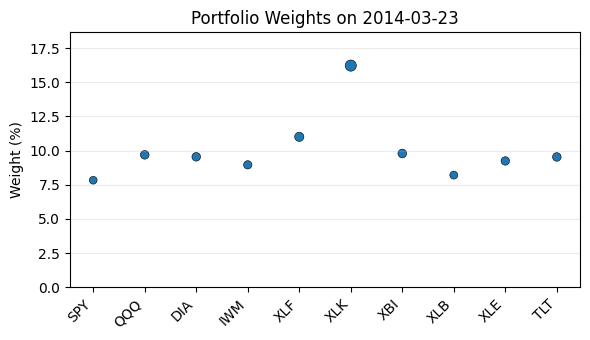


=== Rebalance on 2014-04-20 ===
Optimal portfolio
----------------------
 Investment in SPY : 11.08%
 Investment in QQQ : 9.38%
 Investment in DIA : 9.16%
 Investment in IWM : 11.14%
 Investment in XLF : 9.97%
 Investment in XLK : 1.23%
 Investment in XBI : 12.57%
 Investment in XLB : 14.02%
 Investment in XLE : 10.81%
 Investment in TLT : 10.64%
Cash: 0.0
----------------------
Exp ret = 1.798241985551888%
Expected risk = 0.0008910834493589978%


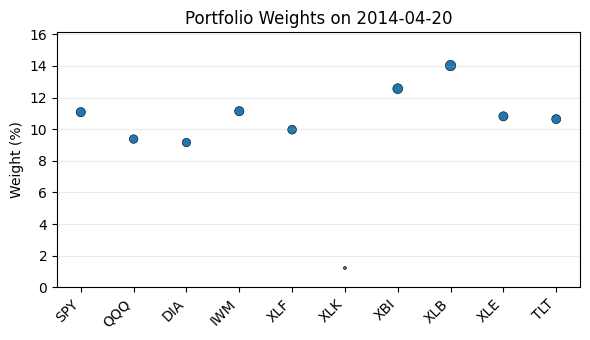


=== Rebalance on 2014-05-18 ===
Optimal portfolio
----------------------
 Investment in SPY : 11.04%
 Investment in QQQ : 7.47%
 Investment in DIA : 9.45%
 Investment in IWM : 11.12%
 Investment in XLF : 12.88%
 Investment in XLK : 1.0%
 Investment in XBI : 11.47%
 Investment in XLB : 13.64%
 Investment in XLE : 10.83%
 Investment in TLT : 11.1%
Cash: 0.0
----------------------
Exp ret = 0.5704568308461%
Expected risk = 0.0006035969864764618%


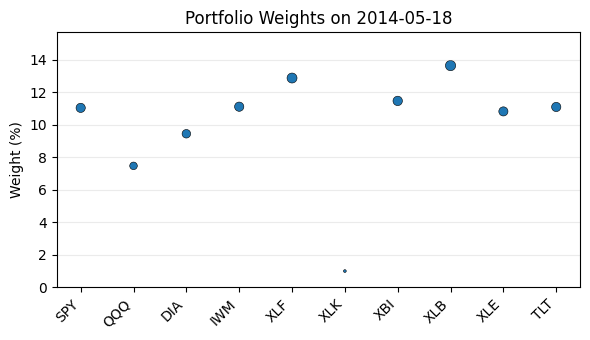


=== Rebalance on 2014-06-15 ===
Optimal portfolio
----------------------
 Investment in SPY : 9.21%
 Investment in QQQ : 8.42%
 Investment in DIA : 10.45%
 Investment in IWM : 9.82%
 Investment in XLF : 9.24%
 Investment in XLK : 11.42%
 Investment in XBI : 10.03%
 Investment in XLB : 12.33%
 Investment in XLE : 8.8%
 Investment in TLT : 10.28%
Cash: 0.0
----------------------
Exp ret = 1.9623198704572231%
Expected risk = 0.0007969423136554595%


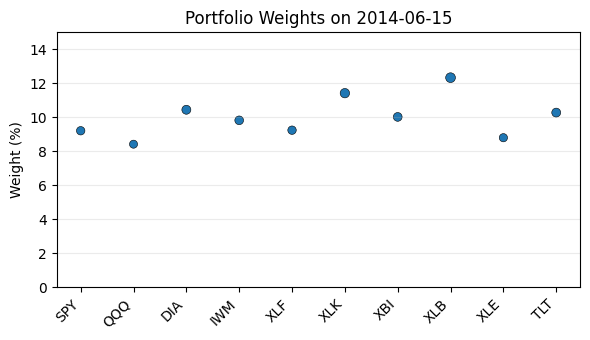


=== Rebalance on 2014-07-13 ===
Optimal portfolio
----------------------
 Investment in SPY : 8.65%
 Investment in QQQ : 8.49%
 Investment in DIA : 11.56%
 Investment in IWM : 9.52%
 Investment in XLF : 8.15%
 Investment in XLK : 15.01%
 Investment in XBI : 9.39%
 Investment in XLB : 9.54%
 Investment in XLE : 8.76%
 Investment in TLT : 10.93%
Cash: 0.0
----------------------
Exp ret = 2.8899076204096836%
Expected risk = 0.00048324682241679694%


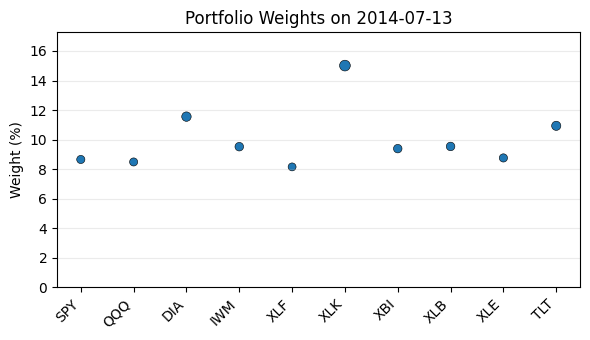


=== Rebalance on 2014-08-10 ===
Optimal portfolio
----------------------
 Investment in SPY : 8.24%
 Investment in QQQ : 8.59%
 Investment in DIA : 10.84%
 Investment in IWM : 9.14%
 Investment in XLF : 9.74%
 Investment in XLK : 15.57%
 Investment in XBI : 9.04%
 Investment in XLB : 9.67%
 Investment in XLE : 9.13%
 Investment in TLT : 10.04%
Cash: 0.0
----------------------
Exp ret = 1.7836897561967517%
Expected risk = 0.0007260912508460245%


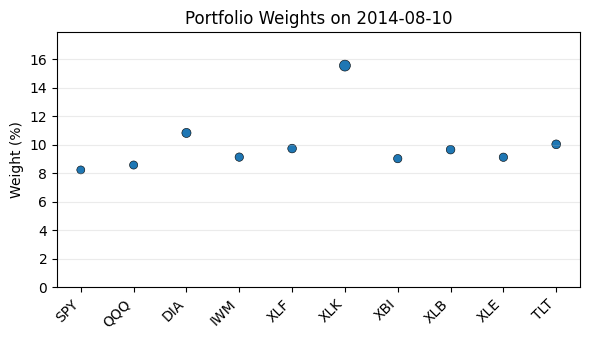


=== Rebalance on 2014-09-07 ===
Optimal portfolio
----------------------
 Investment in SPY : 9.54%
 Investment in QQQ : 8.22%
 Investment in DIA : 12.23%
 Investment in IWM : 10.14%
 Investment in XLF : 10.58%
 Investment in XLK : 10.55%
 Investment in XBI : 9.87%
 Investment in XLB : 7.21%
 Investment in XLE : 10.17%
 Investment in TLT : 11.5%
Cash: 0.0
----------------------
Exp ret = 1.2096585139117906%
Expected risk = 0.0006243360329949283%


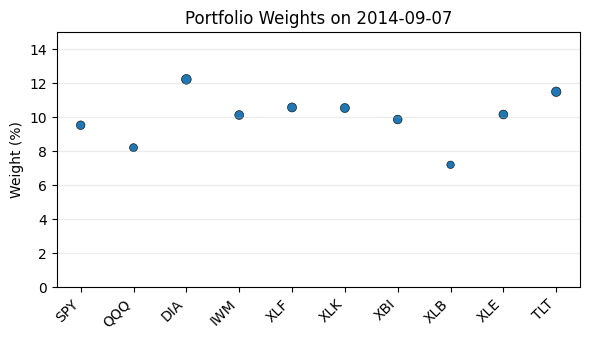


=== Rebalance on 2014-10-05 ===
Optimal portfolio
----------------------
 Investment in SPY : 9.79%
 Investment in QQQ : 8.06%
 Investment in DIA : 10.85%
 Investment in IWM : 9.72%
 Investment in XLF : 11.27%
 Investment in XLK : 16.01%
 Investment in XBI : 8.64%
 Investment in XLB : 4.84%
 Investment in XLE : 10.7%
 Investment in TLT : 10.12%
Cash: 0.0
----------------------
Exp ret = 0.8014484933109699%
Expected risk = 0.0006233398532002003%


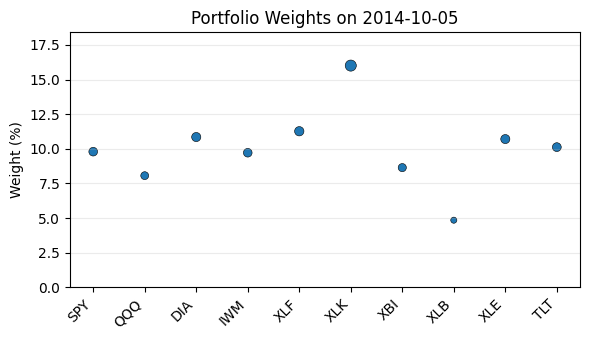


=== Rebalance on 2014-11-02 ===
Optimal portfolio
----------------------
 Investment in SPY : 10.87%
 Investment in QQQ : 10.25%
 Investment in DIA : 10.79%
 Investment in IWM : 10.37%
 Investment in XLF : 9.57%
 Investment in XLK : 13.78%
 Investment in XBI : 7.8%
 Investment in XLB : 4.7%
 Investment in XLE : 11.45%
 Investment in TLT : 10.43%
Cash: 0.0
----------------------
Exp ret = 1.4801233925122865%
Expected risk = 0.0016355049644259496%


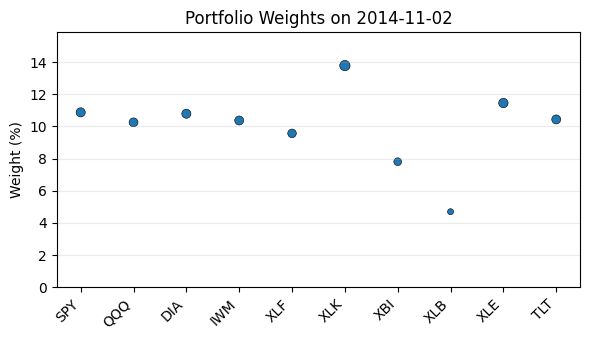


=== Rebalance on 2014-11-30 ===
Optimal portfolio
----------------------
 Investment in SPY : 10.81%
 Investment in QQQ : 9.18%
 Investment in DIA : 11.53%
 Investment in IWM : 10.48%
 Investment in XLF : 12.15%
 Investment in XLK : 14.11%
 Investment in XBI : 8.2%
 Investment in XLB : 1.79%
 Investment in XLE : 10.57%
 Investment in TLT : 11.19%
Cash: 0.0
----------------------
Exp ret = 2.122219908734356%
Expected risk = 0.001402130850172353%


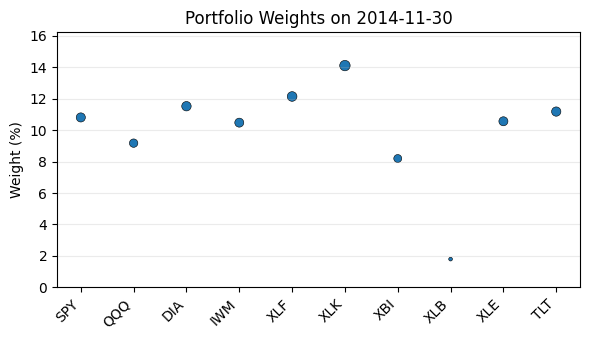


=== Rebalance on 2014-12-28 ===
Optimal portfolio
----------------------
 Investment in SPY : 9.65%
 Investment in QQQ : 11.91%
 Investment in DIA : 10.53%
 Investment in IWM : 9.83%
 Investment in XLF : 7.29%
 Investment in XLK : 16.91%
 Investment in XBI : 8.66%
 Investment in XLB : 4.37%
 Investment in XLE : 10.25%
 Investment in TLT : 10.59%
Cash: 0.0
----------------------
Exp ret = 4.549415016291741%
Expected risk = 0.0012083121577523984%


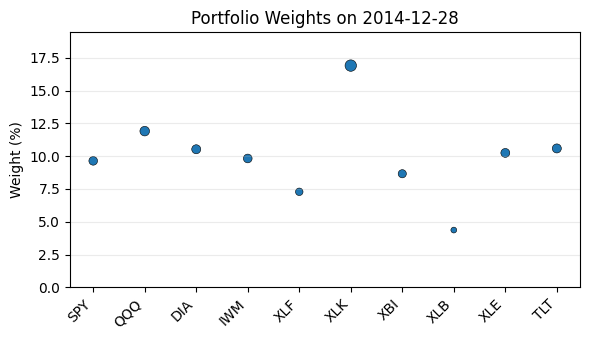


=== Rebalance on 2015-01-25 ===
Optimal portfolio
----------------------
 Investment in SPY : 9.27%
 Investment in QQQ : 9.52%
 Investment in DIA : 10.17%
 Investment in IWM : 9.42%
 Investment in XLF : 14.53%
 Investment in XLK : 16.67%
 Investment in XBI : 8.84%
 Investment in XLB : 3.48%
 Investment in XLE : 8.33%
 Investment in TLT : 9.76%
Cash: 0.0
----------------------
Exp ret = 1.9588194705648831%
Expected risk = 0.0005408804572284303%


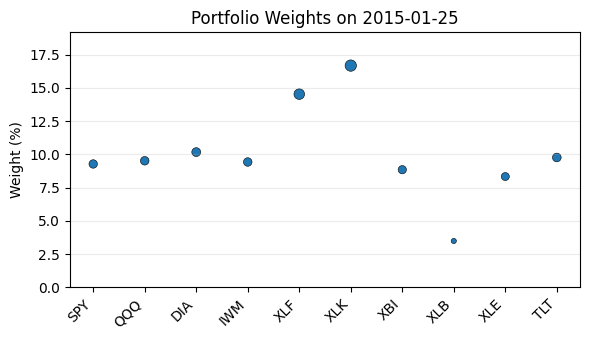


=== Rebalance on 2015-02-22 ===
Optimal portfolio
----------------------
 Investment in SPY : 8.67%
 Investment in QQQ : 10.05%
 Investment in DIA : 9.59%
 Investment in IWM : 9.07%
 Investment in XLF : 10.48%
 Investment in XLK : 15.71%
 Investment in XBI : 10.43%
 Investment in XLB : 8.89%
 Investment in XLE : 7.68%
 Investment in TLT : 9.44%
Cash: 0.0
----------------------
Exp ret = 1.9846567150773653%
Expected risk = 0.0011558638617249544%


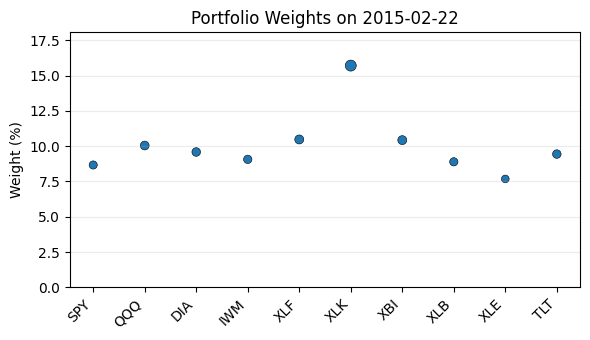


=== Rebalance on 2015-03-22 ===
Optimal portfolio
----------------------
 Investment in SPY : 8.98%
 Investment in QQQ : 10.67%
 Investment in DIA : 10.51%
 Investment in IWM : 9.14%
 Investment in XLF : 9.86%
 Investment in XLK : 18.01%
 Investment in XBI : 8.61%
 Investment in XLB : 6.67%
 Investment in XLE : 8.06%
 Investment in TLT : 9.5%
Cash: 0.0
----------------------
Exp ret = 2.35042872158504%
Expected risk = 0.000676828394855617%


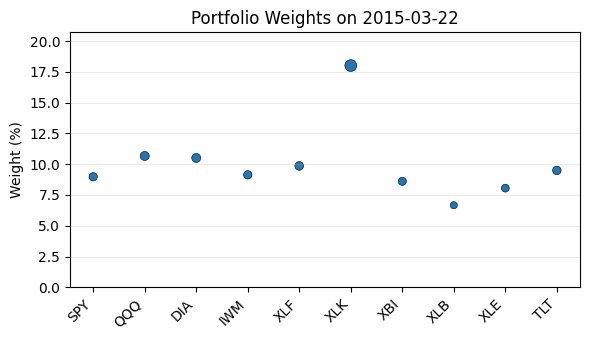


=== Rebalance on 2015-04-19 ===
Optimal portfolio
----------------------
 Investment in SPY : 9.38%
 Investment in QQQ : 10.94%
 Investment in DIA : 9.79%
 Investment in IWM : 9.58%
 Investment in XLF : 5.59%
 Investment in XLK : 14.35%
 Investment in XBI : 9.49%
 Investment in XLB : 11.6%
 Investment in XLE : 9.83%
 Investment in TLT : 9.46%
Cash: 0.0
----------------------
Exp ret = 2.454304910722608%
Expected risk = 0.0010055595496224236%


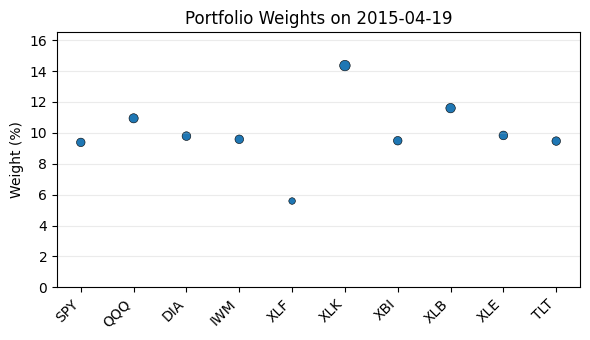


=== Rebalance on 2015-05-17 ===
Optimal portfolio
----------------------
 Investment in SPY : 9.89%
 Investment in QQQ : 10.02%
 Investment in DIA : 10.13%
 Investment in IWM : 10.05%
 Investment in XLF : 6.97%
 Investment in XLK : 12.32%
 Investment in XBI : 9.65%
 Investment in XLB : 10.77%
 Investment in XLE : 10.27%
 Investment in TLT : 9.93%
Cash: 0.0
----------------------
Exp ret = 0.6031730799992976%
Expected risk = 0.0008156242973726309%


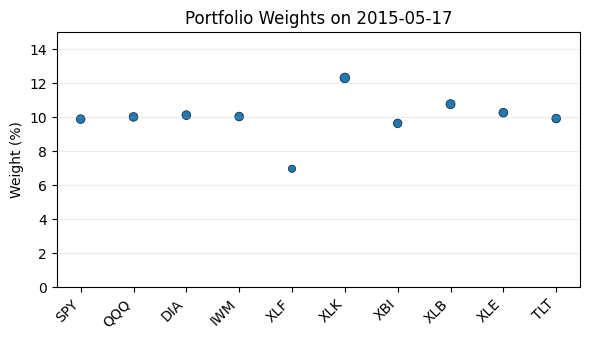


=== Rebalance on 2015-06-14 ===
Optimal portfolio
----------------------
 Investment in SPY : 9.77%
 Investment in QQQ : 10.23%
 Investment in DIA : 10.46%
 Investment in IWM : 9.97%
 Investment in XLF : 4.62%
 Investment in XLK : 13.44%
 Investment in XBI : 10.51%
 Investment in XLB : 9.41%
 Investment in XLE : 11.1%
 Investment in TLT : 10.48%
Cash: 0.0
----------------------
Exp ret = 1.1480941487324527%
Expected risk = 0.00040830293058124887%


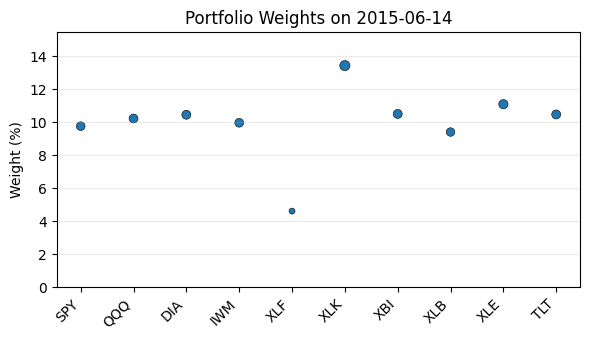


=== Rebalance on 2015-07-12 ===
Optimal portfolio
----------------------
 Investment in SPY : 10.5%
 Investment in QQQ : 10.68%
 Investment in DIA : 9.98%
 Investment in IWM : 10.39%
 Investment in XLF : 6.64%
 Investment in XLK : 15.02%
 Investment in XBI : 8.93%
 Investment in XLB : 6.44%
 Investment in XLE : 11.95%
 Investment in TLT : 9.46%
Cash: 0.0
----------------------
Exp ret = -0.3883180678932356%
Expected risk = 0.000337258010708741%


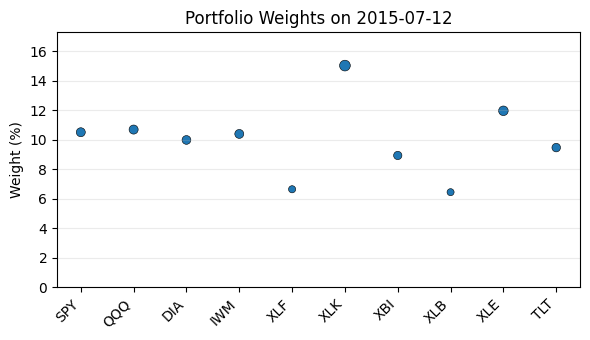


=== Rebalance on 2015-08-09 ===
Optimal portfolio
----------------------
 Investment in SPY : 9.52%
 Investment in QQQ : 10.04%
 Investment in DIA : 11.6%
 Investment in IWM : 10.63%
 Investment in XLF : 13.23%
 Investment in XLK : 12.56%
 Investment in XBI : 6.2%
 Investment in XLB : 3.72%
 Investment in XLE : 12.32%
 Investment in TLT : 10.18%
Cash: 0.0
----------------------
Exp ret = -0.5146359674621741%
Expected risk = 0.0008765990328703424%


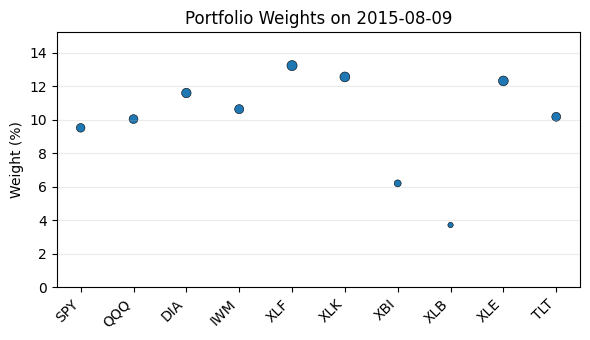


=== Rebalance on 2015-09-06 ===
Optimal portfolio
----------------------
 Investment in SPY : 9.7%
 Investment in QQQ : 8.92%
 Investment in DIA : 11.32%
 Investment in IWM : 10.51%
 Investment in XLF : 15.9%
 Investment in XLK : 8.35%
 Investment in XBI : 6.62%
 Investment in XLB : 6.99%
 Investment in XLE : 10.61%
 Investment in TLT : 11.09%
Cash: 0.0
----------------------
Exp ret = -2.843372774625169%
Expected risk = 0.0017153882593076773%


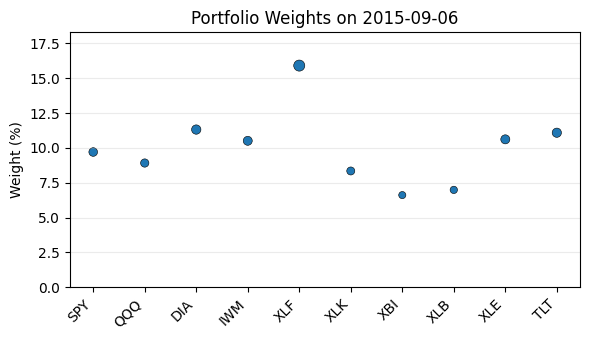


=== Rebalance on 2015-10-04 ===
Optimal portfolio
----------------------
 Investment in SPY : 10.88%
 Investment in QQQ : 9.11%
 Investment in DIA : 10.99%
 Investment in IWM : 11.12%
 Investment in XLF : 17.11%
 Investment in XLK : 1.14%
 Investment in XBI : 8.72%
 Investment in XLB : 9.58%
 Investment in XLE : 9.95%
 Investment in TLT : 11.39%
Cash: 0.0
----------------------
Exp ret = -2.574465814537509%
Expected risk = 0.0015100417119636143%


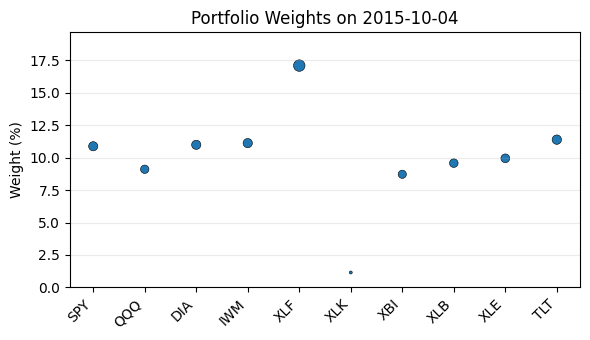


=== Rebalance on 2015-11-01 ===
Optimal portfolio
----------------------
 Investment in SPY : 11.31%
 Investment in QQQ : 8.81%
 Investment in DIA : 12.0%
 Investment in IWM : 10.53%
 Investment in XLF : 10.29%
 Investment in XLK : 5.24%
 Investment in XBI : 10.56%
 Investment in XLB : 10.31%
 Investment in XLE : 8.72%
 Investment in TLT : 12.22%
Cash: 0.0
----------------------
Exp ret = -0.050750475588218%
Expected risk = 0.0026516604212347026%


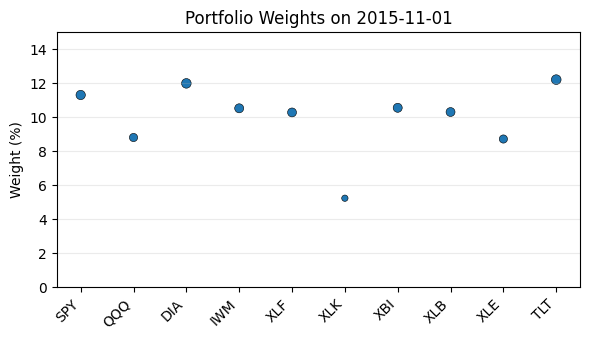


=== Rebalance on 2015-11-29 ===
Optimal portfolio
----------------------
 Investment in SPY : 11.44%
 Investment in QQQ : 9.51%
 Investment in DIA : 11.37%
 Investment in IWM : 10.68%
 Investment in XLF : 7.57%
 Investment in XLK : 5.33%
 Investment in XBI : 10.82%
 Investment in XLB : 11.12%
 Investment in XLE : 10.59%
 Investment in TLT : 11.58%
Cash: 0.0
----------------------
Exp ret = 2.3529581557225447%
Expected risk = 0.0017375718419893646%


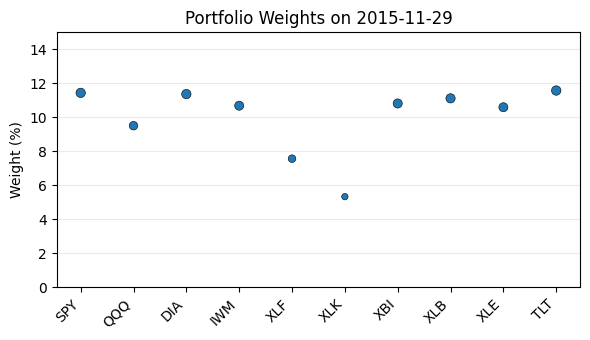


=== Rebalance on 2015-12-27 ===
Optimal portfolio
----------------------
 Investment in SPY : 10.52%
 Investment in QQQ : 8.64%
 Investment in DIA : 11.79%
 Investment in IWM : 10.32%
 Investment in XLF : 9.03%
 Investment in XLK : 13.53%
 Investment in XBI : 9.42%
 Investment in XLB : 4.56%
 Investment in XLE : 10.9%
 Investment in TLT : 11.29%
Cash: 0.0
----------------------
Exp ret = 1.2786092084313083%
Expected risk = 0.0021300178020687522%


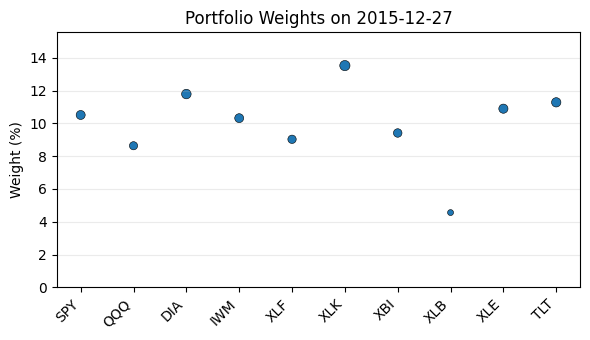


=== Rebalance on 2016-01-24 ===
Optimal portfolio
----------------------
 Investment in SPY : 10.85%
 Investment in QQQ : 8.44%
 Investment in DIA : 11.13%
 Investment in IWM : 11.33%
 Investment in XLF : 17.98%
 Investment in XLK : 5.18%
 Investment in XBI : 8.57%
 Investment in XLB : 5.95%
 Investment in XLE : 9.04%
 Investment in TLT : 11.54%
Cash: 0.0
----------------------
Exp ret = -3.215141378822407%
Expected risk = 0.002429133068495816%


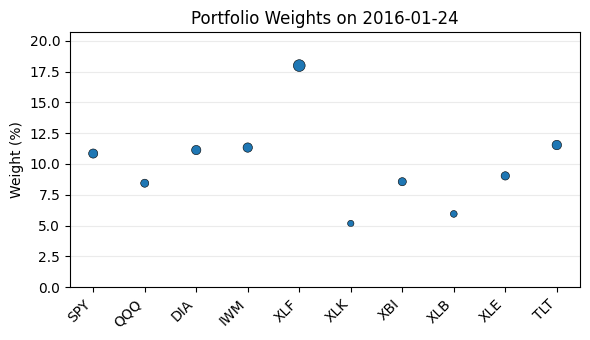


=== Rebalance on 2016-02-21 ===
Optimal portfolio
----------------------
 Investment in SPY : 11.3%
 Investment in QQQ : 8.23%
 Investment in DIA : 9.7%
 Investment in IWM : 11.39%
 Investment in XLF : 19.02%
 Investment in XLK : 1.0%
 Investment in XBI : 10.31%
 Investment in XLB : 9.86%
 Investment in XLE : 7.94%
 Investment in TLT : 11.23%
Cash: 0.0
----------------------
Exp ret = -2.4512276136252074%
Expected risk = 0.002252301318032603%


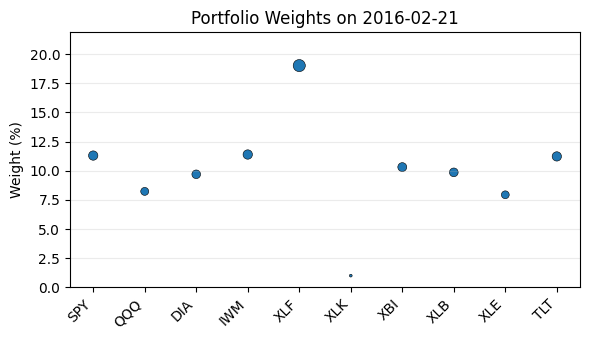


=== Rebalance on 2016-03-20 ===
Optimal portfolio
----------------------
 Investment in SPY : 11.12%
 Investment in QQQ : 9.43%
 Investment in DIA : 8.74%
 Investment in IWM : 10.6%
 Investment in XLF : 13.63%
 Investment in XLK : 1.0%
 Investment in XBI : 12.69%
 Investment in XLB : 13.01%
 Investment in XLE : 8.43%
 Investment in TLT : 11.35%
Cash: 0.0
----------------------
Exp ret = 0.6870673877413372%
Expected risk = 0.0028318098072484636%


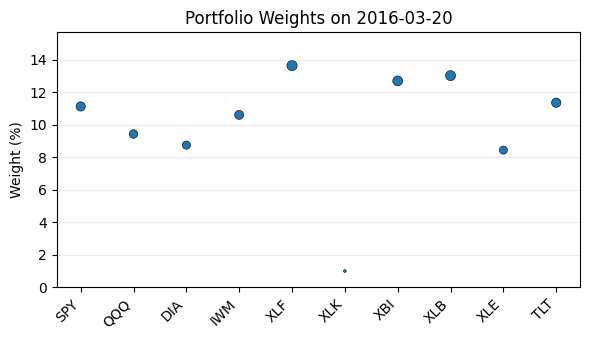


=== Rebalance on 2016-04-17 ===
Optimal portfolio
----------------------
 Investment in SPY : 9.97%
 Investment in QQQ : 10.22%
 Investment in DIA : 8.89%
 Investment in IWM : 9.34%
 Investment in XLF : 7.74%
 Investment in XLK : 11.41%
 Investment in XBI : 13.98%
 Investment in XLB : 10.35%
 Investment in XLE : 8.62%
 Investment in TLT : 9.49%
Cash: 0.0
----------------------
Exp ret = 3.610411273830634%
Expected risk = 0.0013541338363925429%


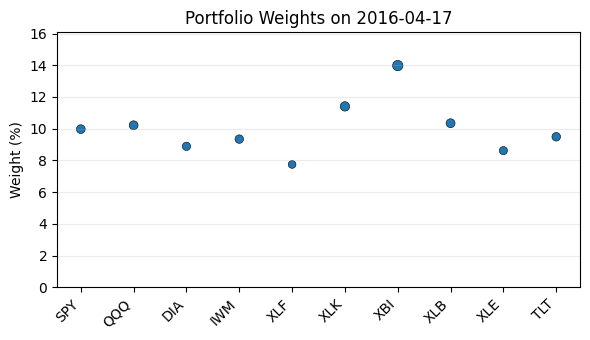


=== Rebalance on 2016-05-15 ===
Optimal portfolio
----------------------
 Investment in SPY : 9.91%
 Investment in QQQ : 10.31%
 Investment in DIA : 8.38%
 Investment in IWM : 9.76%
 Investment in XLF : 8.24%
 Investment in XLK : 8.74%
 Investment in XBI : 11.57%
 Investment in XLB : 13.62%
 Investment in XLE : 10.83%
 Investment in TLT : 8.63%
Cash: 0.0
----------------------
Exp ret = 2.417974385954289%
Expected risk = 0.0010436786824134113%


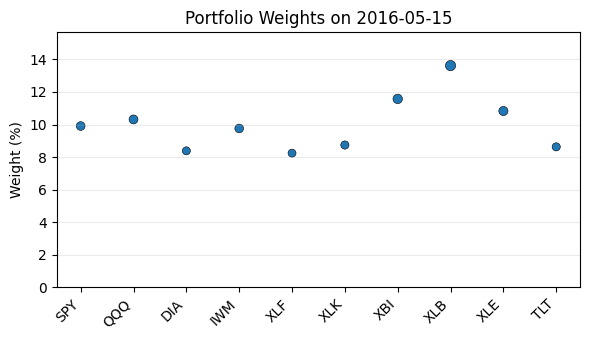


=== Rebalance on 2016-06-12 ===
Optimal portfolio
----------------------
 Investment in SPY : 8.75%
 Investment in QQQ : 11.42%
 Investment in DIA : 8.34%
 Investment in IWM : 9.12%
 Investment in XLF : 9.69%
 Investment in XLK : 12.98%
 Investment in XBI : 10.77%
 Investment in XLB : 11.58%
 Investment in XLE : 9.36%
 Investment in TLT : 7.99%
Cash: 0.0
----------------------
Exp ret = 2.1818882764912972%
Expected risk = 0.000956376808003315%


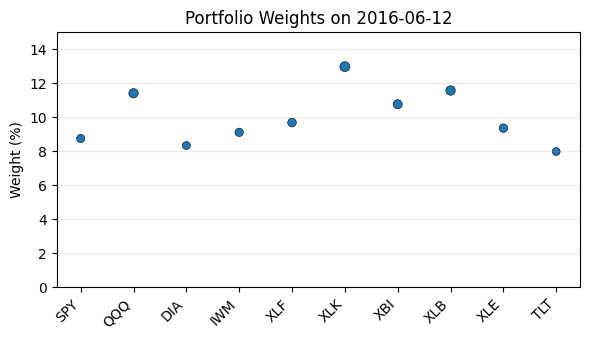


=== Rebalance on 2016-07-10 ===
Optimal portfolio
----------------------
 Investment in SPY : 9.61%
 Investment in QQQ : 10.08%
 Investment in DIA : 9.73%
 Investment in IWM : 10.03%
 Investment in XLF : 14.39%
 Investment in XLK : 9.41%
 Investment in XBI : 8.97%
 Investment in XLB : 9.77%
 Investment in XLE : 8.04%
 Investment in TLT : 9.97%
Cash: 0.0
----------------------
Exp ret = 1.0606374206410005%
Expected risk = 0.0011152677544706956%


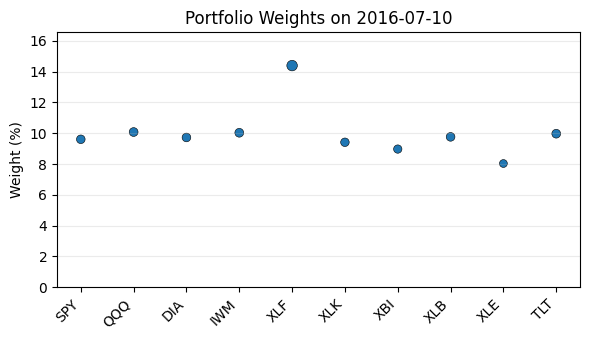


=== Rebalance on 2016-08-07 ===
Optimal portfolio
----------------------
 Investment in SPY : 9.3%
 Investment in QQQ : 11.13%
 Investment in DIA : 10.73%
 Investment in IWM : 9.32%
 Investment in XLF : 9.25%
 Investment in XLK : 14.55%
 Investment in XBI : 8.97%
 Investment in XLB : 7.58%
 Investment in XLE : 8.19%
 Investment in TLT : 10.98%
Cash: 0.0
----------------------
Exp ret = 3.2998044208859754%
Expected risk = 0.0011137894483162591%


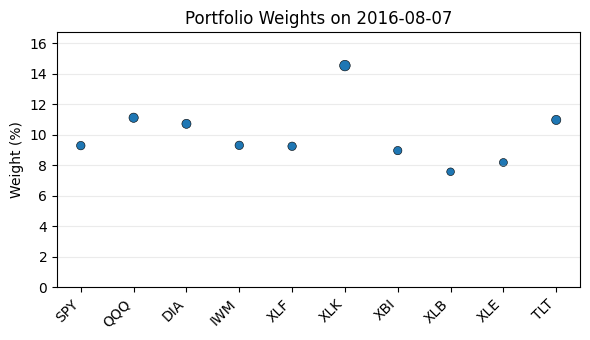


=== Rebalance on 2016-09-04 ===
Optimal portfolio
----------------------
 Investment in SPY : 9.05%
 Investment in QQQ : 10.91%
 Investment in DIA : 11.13%
 Investment in IWM : 9.43%
 Investment in XLF : 7.89%
 Investment in XLK : 12.39%
 Investment in XBI : 8.83%
 Investment in XLB : 8.45%
 Investment in XLE : 10.7%
 Investment in TLT : 11.22%
Cash: 0.0
----------------------
Exp ret = 2.8999391400176813%
Expected risk = 0.0006440778433763329%


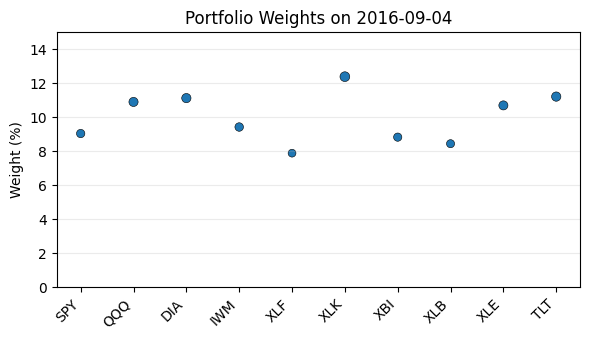


=== Rebalance on 2016-10-02 ===
Optimal portfolio
----------------------
 Investment in SPY : 8.18%
 Investment in QQQ : 10.12%
 Investment in DIA : 11.29%
 Investment in IWM : 8.75%
 Investment in XLF : 8.33%
 Investment in XLK : 15.47%
 Investment in XBI : 7.72%
 Investment in XLB : 9.68%
 Investment in XLE : 9.12%
 Investment in TLT : 11.35%
Cash: 0.0
----------------------
Exp ret = 1.6880934495257571%
Expected risk = 0.0003677607217596447%


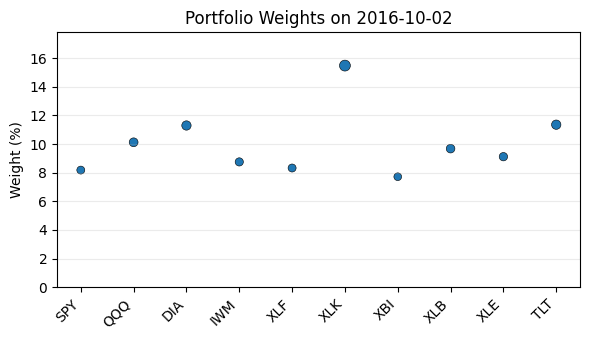


=== Rebalance on 2016-10-30 ===
Optimal portfolio
----------------------
 Investment in SPY : 10.07%
 Investment in QQQ : 9.5%
 Investment in DIA : 11.0%
 Investment in IWM : 9.89%
 Investment in XLF : 7.87%
 Investment in XLK : 6.95%
 Investment in XBI : 9.57%
 Investment in XLB : 11.7%
 Investment in XLE : 12.05%
 Investment in TLT : 11.42%
Cash: 0.0
----------------------
Exp ret = -0.5007110115967621%
Expected risk = 0.00043241569893143287%


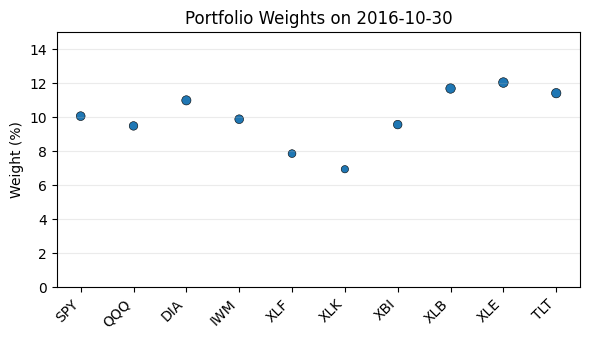


=== Rebalance on 2016-11-27 ===
Optimal portfolio
----------------------
 Investment in SPY : 10.35%
 Investment in QQQ : 12.46%
 Investment in DIA : 9.41%
 Investment in IWM : 9.48%
 Investment in XLF : 2.59%
 Investment in XLK : 12.4%
 Investment in XBI : 9.77%
 Investment in XLB : 9.8%
 Investment in XLE : 14.25%
 Investment in TLT : 9.48%
Cash: 0.0
----------------------
Exp ret = 2.764878633398154%
Expected risk = 0.0024869934639734003%


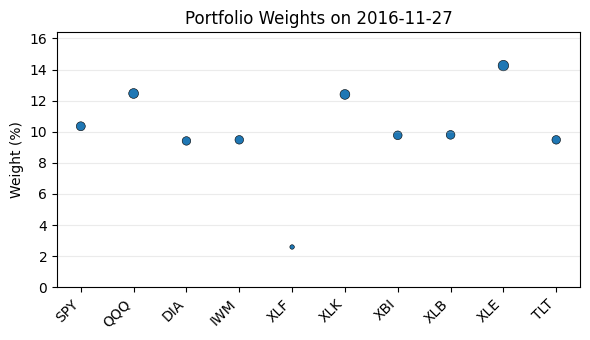


=== Performance 2012 ===
Average Monthly Return   : -0.01%
Monthly Sharpe Ratio     : -0.002
Annualized Sharpe Ratio  : -0.006
Maximum Drawdown         : 7.33%

=== Performance 2013 ===
Average Monthly Return   : 1.52%
Monthly Sharpe Ratio     : 0.680
Annualized Sharpe Ratio  : 2.354
Maximum Drawdown         : 1.58%

=== Performance 2014 ===
Average Monthly Return   : 1.23%
Monthly Sharpe Ratio     : 0.578
Annualized Sharpe Ratio  : 2.003
Maximum Drawdown         : 1.73%

=== Performance 2015 ===
Average Monthly Return   : -1.12%
Monthly Sharpe Ratio     : -0.315
Annualized Sharpe Ratio  : -1.092
Maximum Drawdown         : 21.00%

=== Performance 2016 ===
Average Monthly Return   : 1.96%
Monthly Sharpe Ratio     : 0.712
Annualized Sharpe Ratio  : 2.465
Maximum Drawdown         : 2.38%


In [32]:
print("\nTesting CVaR PBR Regularization:")
rebalance_with_regularization(reg_type="CVAR_PBR", gamma=0.045, epsilon=0.4, verbose=True);

*   Test portfolio on the 2007-2008 subprime housing crisis, where the collapse of the U.S. housing market and major financial institutions happened; there is sharp market decline and systemic stress.


Testing L1 Regularization:

[*******************   40%                       ]  4 of 10 completed

[*********************100%***********************]  10 of 10 completed



=== Rebalance on 2007-03-26 ===
Optimal portfolio
----------------------
 Investment in SPY : 6.54%
 Investment in QQQ : 12.18%
 Investment in DIA : 5.37%
 Investment in IWM : 8.56%
 Investment in XLF : 6.94%
 Investment in XLK : 8.77%
 Investment in XBI : 24.87%
 Investment in XLB : 18.57%
 Investment in XLE : 3.42%
 Investment in TLT : 4.77%
Cash: 0.0
----------------------
Exp ret = 2.11167891900987%
Expected risk = 0.002110668860469807%


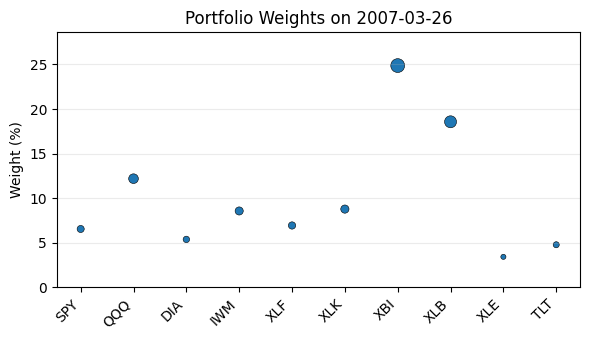


=== Rebalance on 2007-04-23 ===
Optimal portfolio
----------------------
 Investment in SPY : 8.1%
 Investment in QQQ : 7.73%
 Investment in DIA : 7.98%
 Investment in IWM : 8.38%
 Investment in XLF : 9.1%
 Investment in XLK : 17.57%
 Investment in XBI : 15.06%
 Investment in XLB : 17.07%
 Investment in XLE : 2.47%
 Investment in TLT : 6.55%
Cash: 0.0
----------------------
Exp ret = 1.9677041862724114%
Expected risk = 0.002090326131173347%


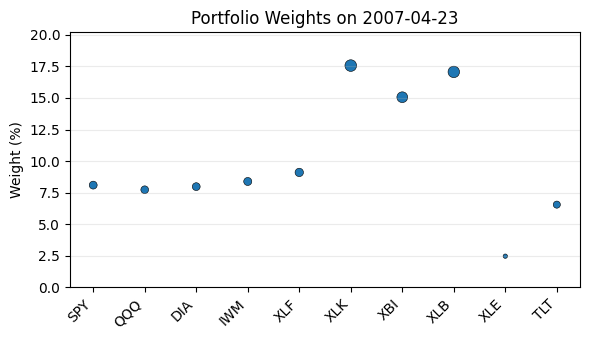


=== Rebalance on 2007-05-21 ===
Optimal portfolio
----------------------
 Investment in SPY : 12.12%
 Investment in QQQ : 2.12%
 Investment in DIA : 8.22%
 Investment in IWM : 8.87%
 Investment in XLF : 1.0%
 Investment in XLK : 17.34%
 Investment in XBI : 9.31%
 Investment in XLB : 26.81%
 Investment in XLE : 2.93%
 Investment in TLT : 11.28%
Cash: 0.0
----------------------
Exp ret = 5.023865118170509%
Expected risk = 0.000880860584351647%


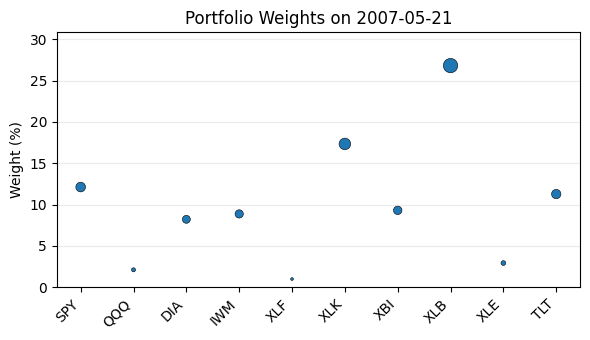


=== Rebalance on 2007-06-18 ===
Optimal portfolio
----------------------
 Investment in SPY : 12.73%
 Investment in QQQ : 5.13%
 Investment in DIA : 11.28%
 Investment in IWM : 7.93%
 Investment in XLF : 1.0%
 Investment in XLK : 12.8%
 Investment in XBI : 8.31%
 Investment in XLB : 24.69%
 Investment in XLE : 3.41%
 Investment in TLT : 12.71%
Cash: 0.0
----------------------
Exp ret = 3.9865610239327194%
Expected risk = 0.0006250331708697687%


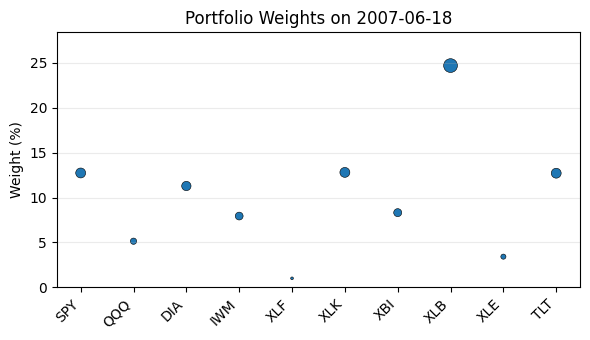


=== Rebalance on 2007-07-16 ===
Optimal portfolio
----------------------
 Investment in SPY : 11.4%
 Investment in QQQ : 5.88%
 Investment in DIA : 13.13%
 Investment in IWM : 7.42%
 Investment in XLF : 1.0%
 Investment in XLK : 1.0%
 Investment in XBI : 16.96%
 Investment in XLB : 27.13%
 Investment in XLE : 1.0%
 Investment in TLT : 15.09%
Cash: 0.0
----------------------
Exp ret = 3.299108659807757%
Expected risk = 0.0009506718846202092%


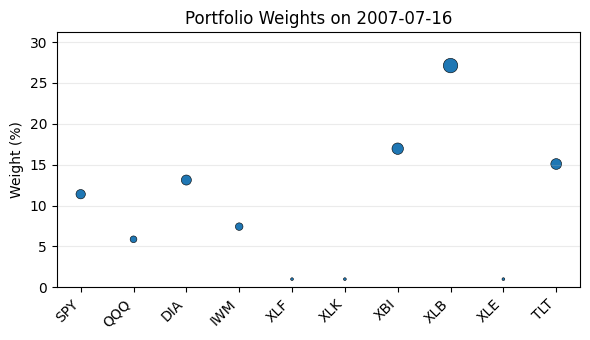


=== Rebalance on 2007-08-13 ===
Optimal portfolio
----------------------
 Investment in SPY : 9.93%
 Investment in QQQ : 3.84%
 Investment in DIA : 16.84%
 Investment in IWM : 5.71%
 Investment in XLF : 16.55%
 Investment in XLK : 11.72%
 Investment in XBI : 6.59%
 Investment in XLB : 13.83%
 Investment in XLE : 1.0%
 Investment in TLT : 13.98%
Cash: 0.0
----------------------
Exp ret = -0.09091953683322175%
Expected risk = 0.0014526967947350025%


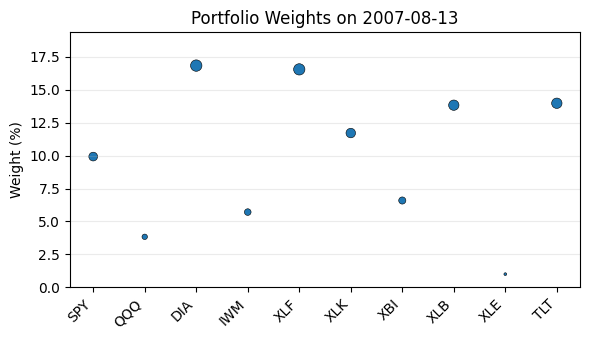


=== Rebalance on 2007-09-10 ===
Optimal portfolio
----------------------
 Investment in SPY : 6.02%
 Investment in QQQ : 1.0%
 Investment in DIA : 12.33%
 Investment in IWM : 3.25%
 Investment in XLF : 25.06%
 Investment in XLK : 29.98%
 Investment in XBI : 1.0%
 Investment in XLB : 10.07%
 Investment in XLE : 1.0%
 Investment in TLT : 10.29%
Cash: 0.0
----------------------
Exp ret = 2.1236926908135265%
Expected risk = 0.0007894424697642219%


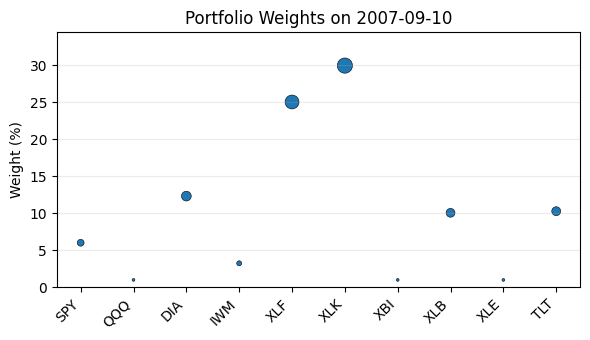


=== Rebalance on 2007-10-08 ===
Optimal portfolio
----------------------
 Investment in SPY : 7.0%
 Investment in QQQ : 5.38%
 Investment in DIA : 13.18%
 Investment in IWM : 6.73%
 Investment in XLF : 11.23%
 Investment in XLK : 30.82%
 Investment in XBI : 4.66%
 Investment in XLB : 6.33%
 Investment in XLE : 7.06%
 Investment in TLT : 7.61%
Cash: 0.0
----------------------
Exp ret = 2.518775805621039%
Expected risk = 0.0013914300609557718%


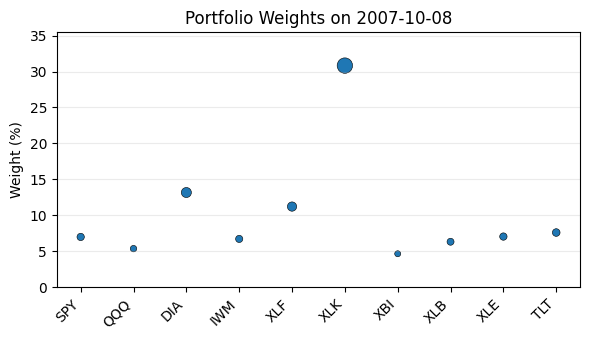


=== Rebalance on 2007-11-05 ===
Optimal portfolio
----------------------
 Investment in SPY : 1.0%
 Investment in QQQ : 1.0%
 Investment in DIA : 22.88%
 Investment in IWM : 1.36%
 Investment in XLF : 4.75%
 Investment in XLK : 16.54%
 Investment in XBI : 20.41%
 Investment in XLB : 14.77%
 Investment in XLE : 1.0%
 Investment in TLT : 16.3%
Cash: 0.0
----------------------
Exp ret = 4.969505242065128%
Expected risk = 0.001435641282021185%


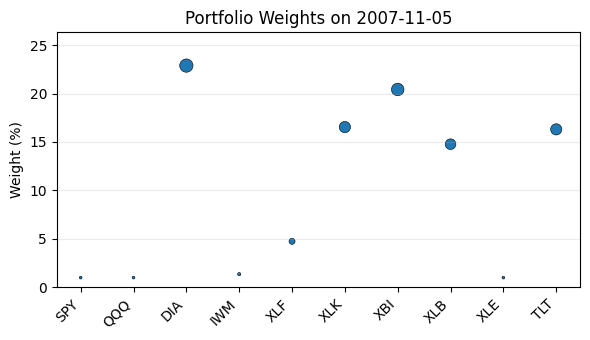


=== Rebalance on 2007-12-03 ===
Optimal portfolio
----------------------
 Investment in SPY : 6.13%
 Investment in QQQ : 2.75%
 Investment in DIA : 13.13%
 Investment in IWM : 6.07%
 Investment in XLF : 18.1%
 Investment in XLK : 18.89%
 Investment in XBI : 16.15%
 Investment in XLB : 9.19%
 Investment in XLE : 1.0%
 Investment in TLT : 8.6%
Cash: 0.0
----------------------
Exp ret = 1.653465017687566%
Expected risk = 0.001616612055278432%


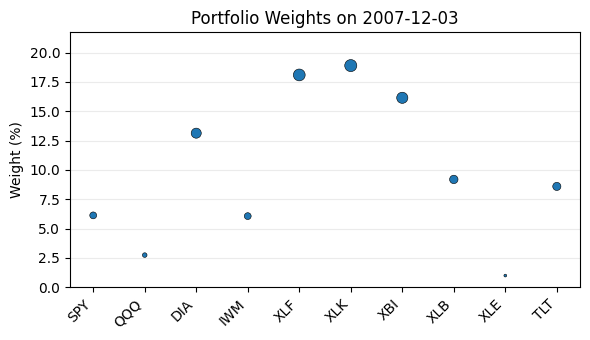


=== Rebalance on 2007-12-31 ===
Optimal portfolio
----------------------
 Investment in SPY : 4.78%
 Investment in QQQ : 1.0%
 Investment in DIA : 8.04%
 Investment in IWM : 3.96%
 Investment in XLF : 26.5%
 Investment in XLK : 13.97%
 Investment in XBI : 9.66%
 Investment in XLB : 22.02%
 Investment in XLE : 1.0%
 Investment in TLT : 9.06%
Cash: 0.0
----------------------
Exp ret = 0.5672225824525841%
Expected risk = 0.0010158289433863433%


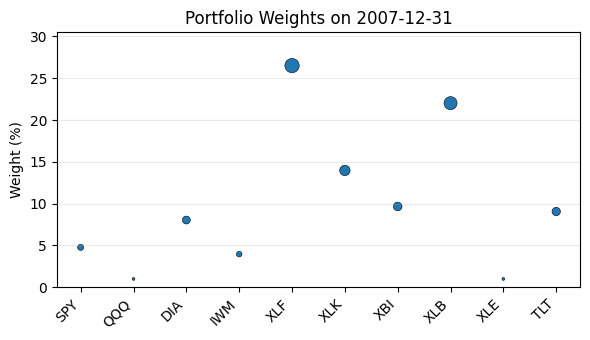


=== Rebalance on 2008-01-28 ===
Optimal portfolio
----------------------
 Investment in SPY : 12.36%
 Investment in QQQ : 3.03%
 Investment in DIA : 1.0%
 Investment in IWM : 8.07%
 Investment in XLF : 34.4%
 Investment in XLK : 13.35%
 Investment in XBI : 10.78%
 Investment in XLB : 9.48%
 Investment in XLE : 6.45%
 Investment in TLT : 1.08%
Cash: 0.0
----------------------
Exp ret = -0.8435355381729422%
Expected risk = 0.0009502421561176277%


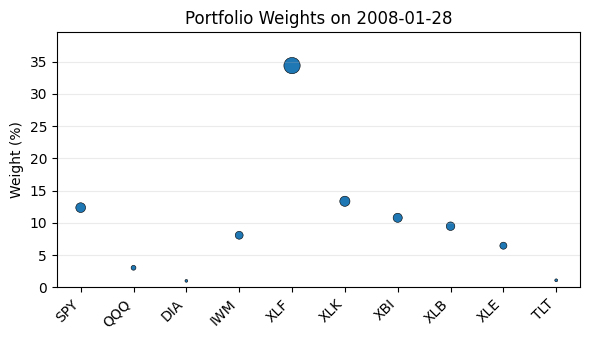


=== Rebalance on 2008-02-25 ===
Optimal portfolio
----------------------
 Investment in SPY : 9.21%
 Investment in QQQ : 4.46%
 Investment in DIA : 1.0%
 Investment in IWM : 7.33%
 Investment in XLF : 30.14%
 Investment in XLK : 1.0%
 Investment in XBI : 19.77%
 Investment in XLB : 22.9%
 Investment in XLE : 3.19%
 Investment in TLT : 1.0%
Cash: 0.0
----------------------
Exp ret = -1.0614227909330864%
Expected risk = 0.001986982895606561%


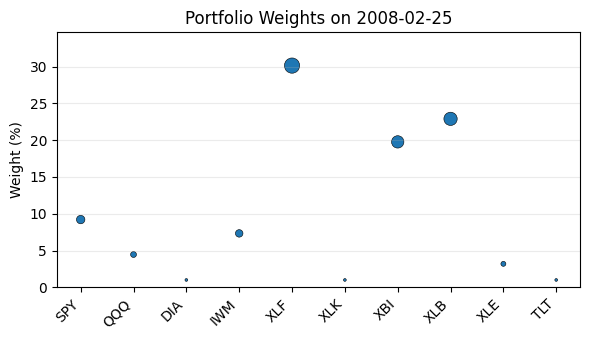


=== Rebalance on 2008-03-24 ===
Optimal portfolio
----------------------
 Investment in SPY : 14.74%
 Investment in QQQ : 9.58%
 Investment in DIA : 1.44%
 Investment in IWM : 9.38%
 Investment in XLF : 30.1%
 Investment in XLK : 1.0%
 Investment in XBI : 11.07%
 Investment in XLB : 6.62%
 Investment in XLE : 14.65%
 Investment in TLT : 1.42%
Cash: 0.0
----------------------
Exp ret = -0.8174539800138538%
Expected risk = 0.0025101813508608107%


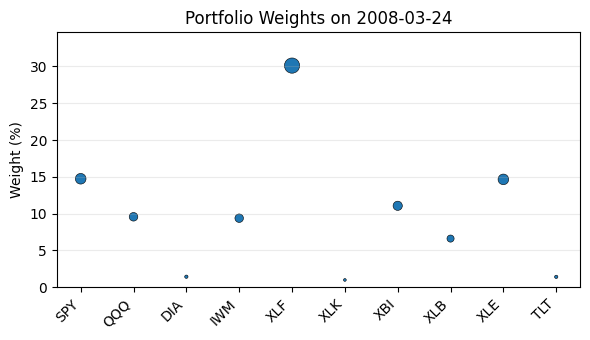


=== Rebalance on 2008-04-21 ===
Optimal portfolio
----------------------
 Investment in SPY : 7.41%
 Investment in QQQ : 3.58%
 Investment in DIA : 10.16%
 Investment in IWM : 5.22%
 Investment in XLF : 6.11%
 Investment in XLK : 4.55%
 Investment in XBI : 19.8%
 Investment in XLB : 34.89%
 Investment in XLE : 1.0%
 Investment in TLT : 7.28%
Cash: 0.0
----------------------
Exp ret = 2.9858488628491457%
Expected risk = 0.003551408765601638%


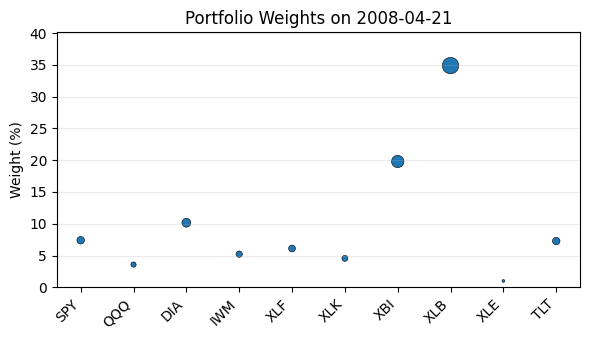


=== Rebalance on 2008-05-19 ===
Optimal portfolio
----------------------
 Investment in SPY : 3.21%
 Investment in QQQ : 5.7%
 Investment in DIA : 20.9%
 Investment in IWM : 5.29%
 Investment in XLF : 1.0%
 Investment in XLK : 8.45%
 Investment in XBI : 14.38%
 Investment in XLB : 21.99%
 Investment in XLE : 1.0%
 Investment in TLT : 18.09%
Cash: 0.0
----------------------
Exp ret = 4.919531566183053%
Expected risk = 0.00300661157697153%


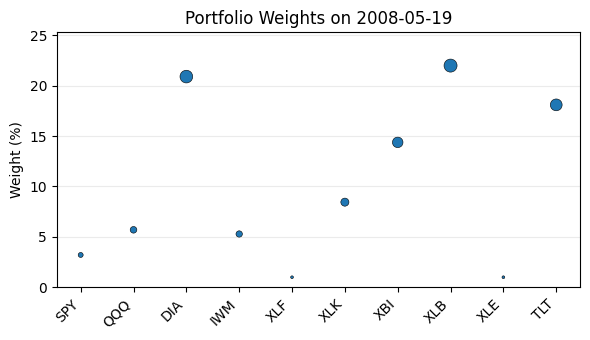


=== Rebalance on 2008-06-16 ===
Optimal portfolio
----------------------
 Investment in SPY : 1.0%
 Investment in QQQ : 9.74%
 Investment in DIA : 15.51%
 Investment in IWM : 2.49%
 Investment in XLF : 1.0%
 Investment in XLK : 15.66%
 Investment in XBI : 14.61%
 Investment in XLB : 26.98%
 Investment in XLE : 1.0%
 Investment in TLT : 12.01%
Cash: 0.0
----------------------
Exp ret = 4.288074408489118%
Expected risk = 0.003234798602252056%


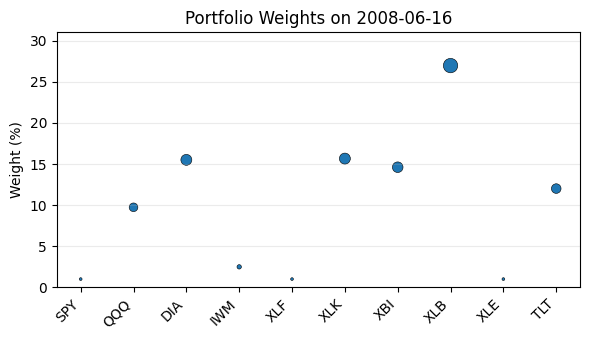


=== Rebalance on 2008-07-14 ===
Optimal portfolio
----------------------
 Investment in SPY : 1.0%
 Investment in QQQ : 7.57%
 Investment in DIA : 8.72%
 Investment in IWM : 1.0%
 Investment in XLF : 22.05%
 Investment in XLK : 34.81%
 Investment in XBI : 1.0%
 Investment in XLB : 17.39%
 Investment in XLE : 1.0%
 Investment in TLT : 5.45%
Cash: 0.0
----------------------
Exp ret = 0.5382740675302384%
Expected risk = 0.0007145779064272503%


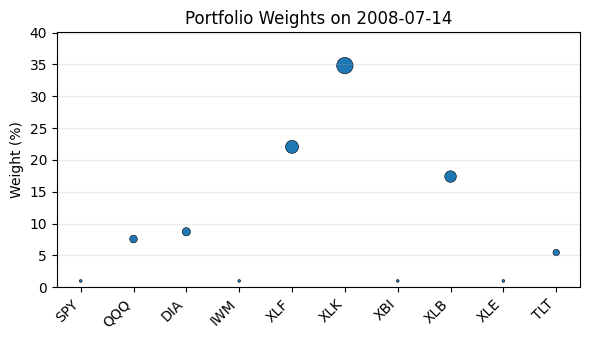


=== Rebalance on 2008-08-11 ===
Optimal portfolio
----------------------
 Investment in SPY : 2.65%
 Investment in QQQ : 15.78%
 Investment in DIA : 9.87%
 Investment in IWM : 2.83%
 Investment in XLF : 16.24%
 Investment in XLK : 44.38%
 Investment in XBI : 1.0%
 Investment in XLB : 1.0%
 Investment in XLE : 1.0%
 Investment in TLT : 5.26%
Cash: 0.0
----------------------
Exp ret = 2.70054716030597%
Expected risk = 0.0010320115610559489%


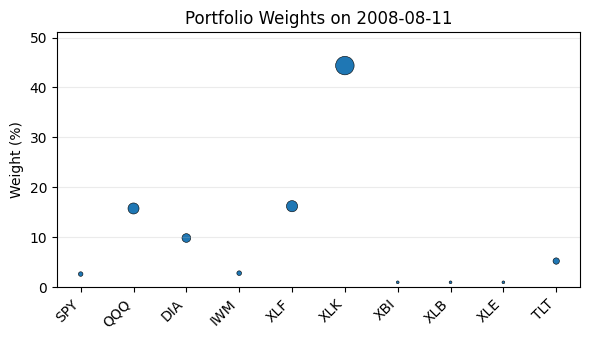


=== Rebalance on 2008-09-08 ===
Optimal portfolio
----------------------
 Investment in SPY : 6.66%
 Investment in QQQ : 12.84%
 Investment in DIA : 1.0%
 Investment in IWM : 5.46%
 Investment in XLF : 27.99%
 Investment in XLK : 29.28%
 Investment in XBI : 1.0%
 Investment in XLB : 1.0%
 Investment in XLE : 13.76%
 Investment in TLT : 1.0%
Cash: 0.0
----------------------
Exp ret = 1.2357220278878844%
Expected risk = 0.0008451861510148315%


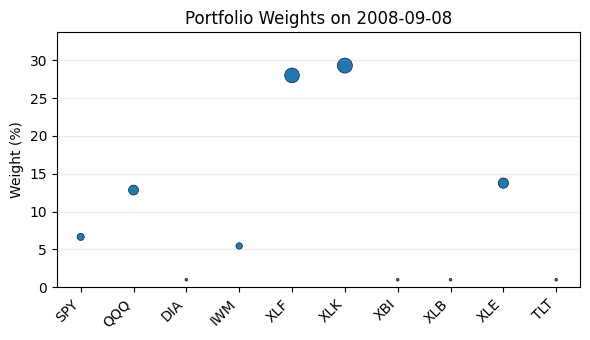


=== Rebalance on 2008-10-06 ===
Optimal portfolio
----------------------
 Investment in SPY : 9.91%
 Investment in QQQ : 11.58%
 Investment in DIA : 1.0%
 Investment in IWM : 5.3%
 Investment in XLF : 44.12%
 Investment in XLK : 12.16%
 Investment in XBI : 1.0%
 Investment in XLB : 1.0%
 Investment in XLE : 12.93%
 Investment in TLT : 1.0%
Cash: 0.0
----------------------
Exp ret = -0.5693135163807904%
Expected risk = 0.001071999767272195%


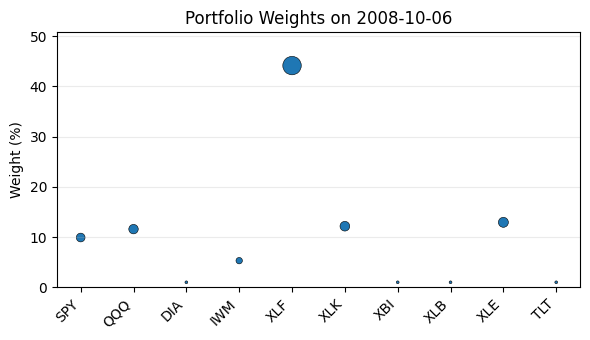


=== Rebalance on 2008-11-03 ===
Optimal portfolio
----------------------
 Investment in SPY : 16.83%
 Investment in QQQ : 1.0%
 Investment in DIA : 1.0%
 Investment in IWM : 4.33%
 Investment in XLF : 57.69%
 Investment in XLK : 10.08%
 Investment in XBI : 1.0%
 Investment in XLB : 3.64%
 Investment in XLE : 3.42%
 Investment in TLT : 1.0%
Cash: 0.0
----------------------
Exp ret = -3.1395149622090694%
Expected risk = 0.003157078384374496%


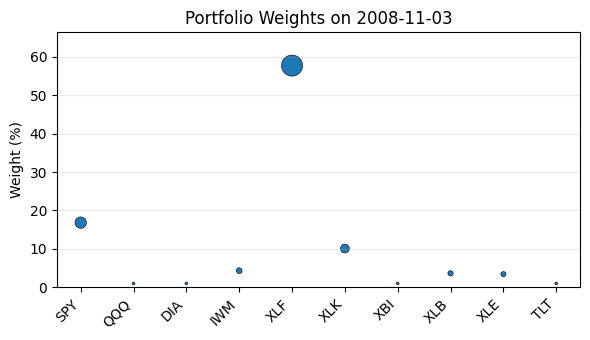


=== Rebalance on 2008-12-01 ===
Optimal portfolio
----------------------
 Investment in SPY : 7.89%
 Investment in QQQ : 1.0%
 Investment in DIA : 1.0%
 Investment in IWM : 1.0%
 Investment in XLF : 71.15%
 Investment in XLK : 11.79%
 Investment in XBI : 1.0%
 Investment in XLB : 3.18%
 Investment in XLE : 1.0%
 Investment in TLT : 1.0%
Cash: 0.0
----------------------
Exp ret = 0.8173002297051618%
Expected risk = 0.0029329727270811113%


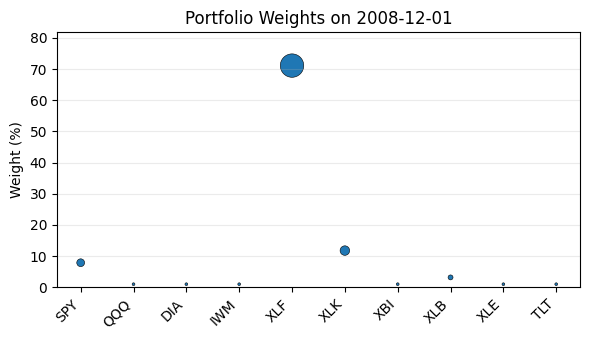


=== Performance 2007 ===
Average Monthly Return   : 0.98%
Monthly Sharpe Ratio     : 0.284
Annualized Sharpe Ratio  : 0.983
Maximum Drawdown         : 5.91%

=== Performance 2008 ===
Average Monthly Return   : 0.25%
Monthly Sharpe Ratio     : 0.057
Annualized Sharpe Ratio  : 0.196
Maximum Drawdown         : 16.16%


In [33]:
start_date = "2007-01-01"
end_date   = "2008-12-31"

# Run for L1, L2, or PBR
print("Testing L1 Regularization:")
rebalance_with_regularization(reg_type="L1", gamma=0.02, verbose=True, start_date=start_date, end_date=end_date);

[**************        30%                       ]  3 of 10 completed


Testing L2 Regularization:


[*********************100%***********************]  10 of 10 completed



=== Rebalance on 2007-03-26 ===
Optimal portfolio
----------------------
 Investment in SPY : 8.01%
 Investment in QQQ : 11.26%
 Investment in DIA : 7.33%
 Investment in IWM : 9.18%
 Investment in XLF : 8.21%
 Investment in XLK : 9.29%
 Investment in XBI : 18.55%
 Investment in XLB : 14.96%
 Investment in XLE : 6.22%
 Investment in TLT : 6.99%
Cash: 0.0
----------------------
Exp ret = 1.7492821708360358%
Expected risk = 0.002021258892115967%


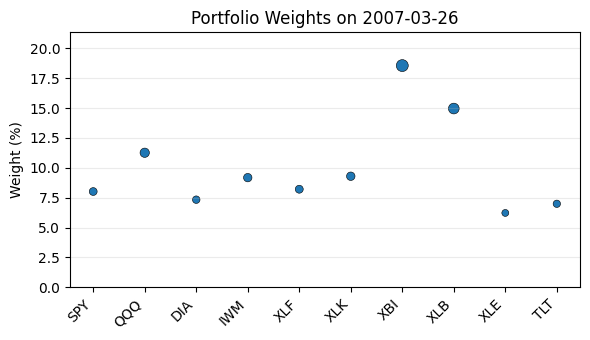


=== Rebalance on 2007-04-23 ===
Optimal portfolio
----------------------
 Investment in SPY : 8.91%
 Investment in QQQ : 8.72%
 Investment in DIA : 8.86%
 Investment in IWM : 9.08%
 Investment in XLF : 9.45%
 Investment in XLK : 14.31%
 Investment in XBI : 12.88%
 Investment in XLB : 14.03%
 Investment in XLE : 5.71%
 Investment in TLT : 8.04%
Cash: 0.0
----------------------
Exp ret = 1.770602208931931%
Expected risk = 0.001998058610354943%


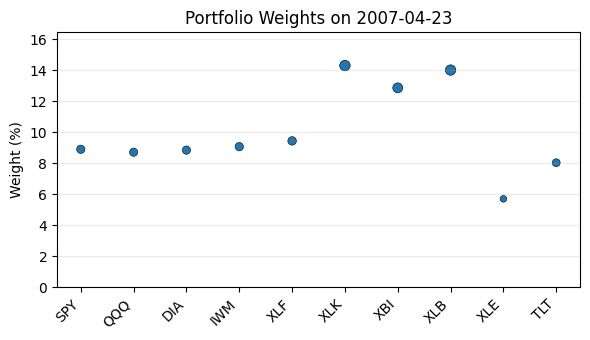


=== Rebalance on 2007-05-21 ===
Optimal portfolio
----------------------
 Investment in SPY : 11.65%
 Investment in QQQ : 5.8%
 Investment in DIA : 9.37%
 Investment in IWM : 9.75%
 Investment in XLF : 1.0%
 Investment in XLK : 14.72%
 Investment in XBI : 10.01%
 Investment in XLB : 20.29%
 Investment in XLE : 6.26%
 Investment in TLT : 11.15%
Cash: 0.0
----------------------
Exp ret = 4.644767302821868%
Expected risk = 0.0008172627091004787%


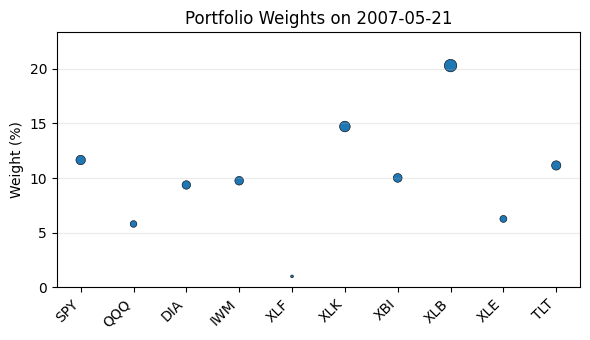


=== Rebalance on 2007-06-18 ===
Optimal portfolio
----------------------
 Investment in SPY : 12.0%
 Investment in QQQ : 7.59%
 Investment in DIA : 11.16%
 Investment in IWM : 9.22%
 Investment in XLF : 1.0%
 Investment in XLK : 12.05%
 Investment in XBI : 9.45%
 Investment in XLB : 18.97%
 Investment in XLE : 6.58%
 Investment in TLT : 11.99%
Cash: 0.0
----------------------
Exp ret = 3.728114619810366%
Expected risk = 0.0005957520057984552%


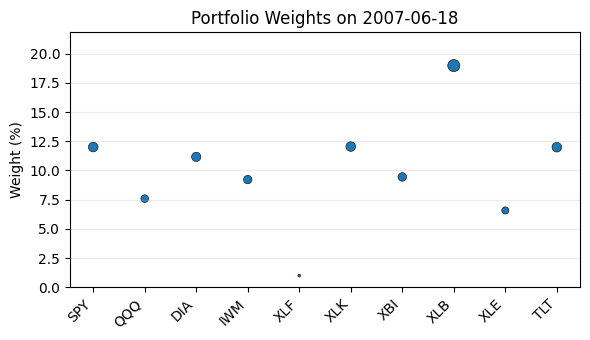


=== Rebalance on 2007-07-16 ===
Optimal portfolio
----------------------
 Investment in SPY : 11.38%
 Investment in QQQ : 8.11%
 Investment in DIA : 12.4%
 Investment in IWM : 9.03%
 Investment in XLF : 2.01%
 Investment in XLK : 4.52%
 Investment in XBI : 14.68%
 Investment in XLB : 20.7%
 Investment in XLE : 3.63%
 Investment in TLT : 13.55%
Cash: 0.0
----------------------
Exp ret = 2.829723828888682%
Expected risk = 0.000880977008271742%


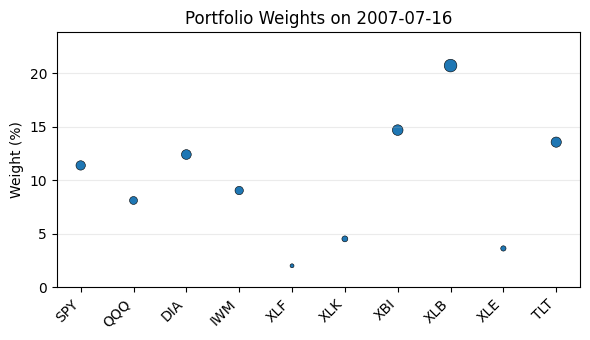


=== Rebalance on 2007-08-13 ===
Optimal portfolio
----------------------
 Investment in SPY : 10.39%
 Investment in QQQ : 6.83%
 Investment in DIA : 14.37%
 Investment in IWM : 7.95%
 Investment in XLF : 14.28%
 Investment in XLK : 11.42%
 Investment in XBI : 8.43%
 Investment in XLB : 12.6%
 Investment in XLE : 1.0%
 Investment in TLT : 12.73%
Cash: 0.0
----------------------
Exp ret = -0.23015008639726597%
Expected risk = 0.001595155606629298%


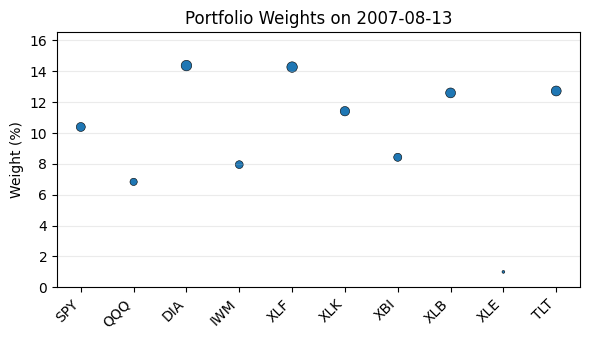


=== Rebalance on 2007-09-10 ===
Optimal portfolio
----------------------
 Investment in SPY : 8.39%
 Investment in QQQ : 3.27%
 Investment in DIA : 12.17%
 Investment in IWM : 6.7%
 Investment in XLF : 20.03%
 Investment in XLK : 22.9%
 Investment in XBI : 3.83%
 Investment in XLB : 10.77%
 Investment in XLE : 1.0%
 Investment in TLT : 10.95%
Cash: 0.0
----------------------
Exp ret = 1.5273726001083014%
Expected risk = 0.001056025876879251%


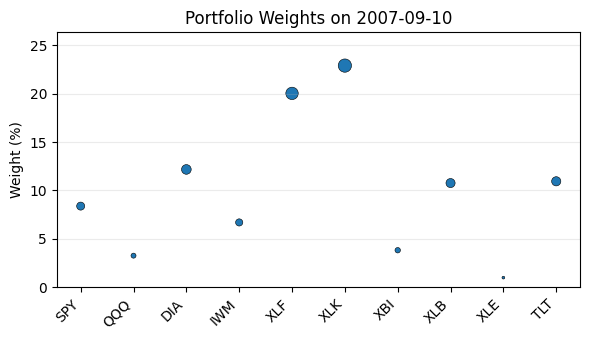


=== Rebalance on 2007-10-08 ===
Optimal portfolio
----------------------
 Investment in SPY : 8.26%
 Investment in QQQ : 7.3%
 Investment in DIA : 11.84%
 Investment in IWM : 8.1%
 Investment in XLF : 10.83%
 Investment in XLK : 22.13%
 Investment in XBI : 6.82%
 Investment in XLB : 7.83%
 Investment in XLE : 8.28%
 Investment in TLT : 8.62%
Cash: 0.0
----------------------
Exp ret = 2.0891507809691827%
Expected risk = 0.0016299571354150355%


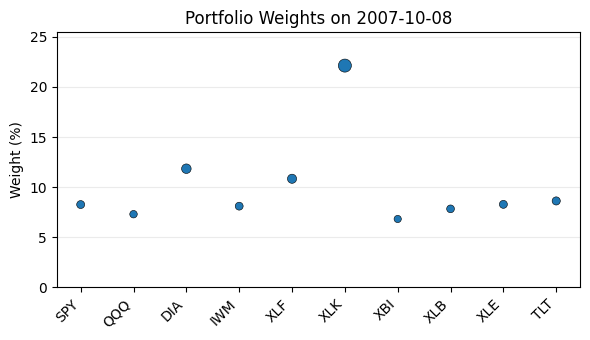


=== Rebalance on 2007-11-05 ===
Optimal portfolio
----------------------
 Investment in SPY : 5.36%
 Investment in QQQ : 2.14%
 Investment in DIA : 18.46%
 Investment in IWM : 5.62%
 Investment in XLF : 7.59%
 Investment in XLK : 14.66%
 Investment in XBI : 17.01%
 Investment in XLB : 13.62%
 Investment in XLE : 1.0%
 Investment in TLT : 14.54%
Cash: 0.0
----------------------
Exp ret = 4.500375103238154%
Expected risk = 0.0013280415952529577%


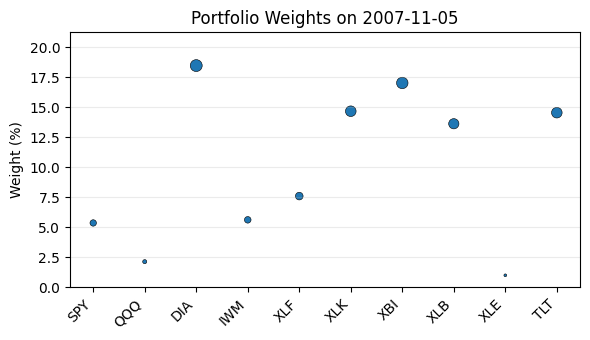


=== Rebalance on 2007-12-03 ===
Optimal portfolio
----------------------
 Investment in SPY : 8.17%
 Investment in QQQ : 6.18%
 Investment in DIA : 12.24%
 Investment in IWM : 8.13%
 Investment in XLF : 15.2%
 Investment in XLK : 15.58%
 Investment in XBI : 13.96%
 Investment in XLB : 9.94%
 Investment in XLE : 1.0%
 Investment in TLT : 9.61%
Cash: 0.0
----------------------
Exp ret = 1.4446141785273408%
Expected risk = 0.0017779229477565587%


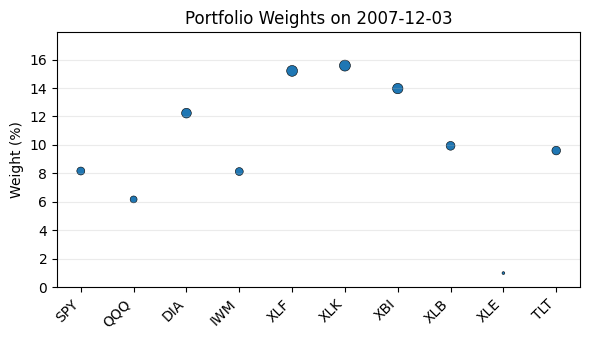


=== Rebalance on 2007-12-31 ===
Optimal portfolio
----------------------
 Investment in SPY : 7.5%
 Investment in QQQ : 3.27%
 Investment in DIA : 9.43%
 Investment in IWM : 7.03%
 Investment in XLF : 20.58%
 Investment in XLK : 12.96%
 Investment in XBI : 10.39%
 Investment in XLB : 17.8%
 Investment in XLE : 1.0%
 Investment in TLT : 10.04%
Cash: 0.0
----------------------
Exp ret = 0.1597801258145675%
Expected risk = 0.0013104880044056135%


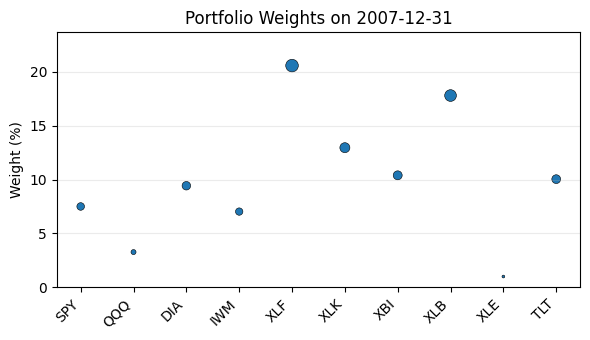


=== Rebalance on 2008-01-28 ===
Optimal portfolio
----------------------
 Investment in SPY : 11.42%
 Investment in QQQ : 5.85%
 Investment in DIA : 4.36%
 Investment in IWM : 8.88%
 Investment in XLF : 24.71%
 Investment in XLK : 12.09%
 Investment in XBI : 10.45%
 Investment in XLB : 9.68%
 Investment in XLE : 7.85%
 Investment in TLT : 4.71%
Cash: 0.0
----------------------
Exp ret = -1.4782428380922097%
Expected risk = 0.0013279301534576265%


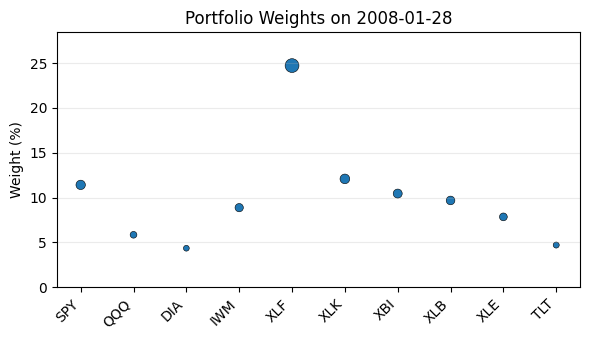


=== Rebalance on 2008-02-25 ===
Optimal portfolio
----------------------
 Investment in SPY : 10.37%
 Investment in QQQ : 7.43%
 Investment in DIA : 1.33%
 Investment in IWM : 9.22%
 Investment in XLF : 23.25%
 Investment in XLK : 4.55%
 Investment in XBI : 16.78%
 Investment in XLB : 18.73%
 Investment in XLE : 6.57%
 Investment in TLT : 1.78%
Cash: 0.0
----------------------
Exp ret = -1.6719693292633147%
Expected risk = 0.0023335954910842305%


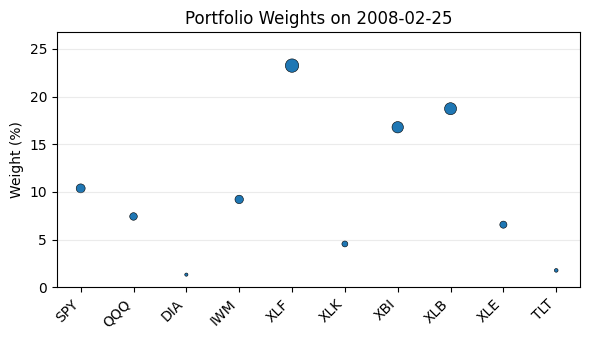


=== Rebalance on 2008-03-24 ===
Optimal portfolio
----------------------
 Investment in SPY : 13.05%
 Investment in QQQ : 10.01%
 Investment in DIA : 5.2%
 Investment in IWM : 9.87%
 Investment in XLF : 22.21%
 Investment in XLK : 2.47%
 Investment in XBI : 10.84%
 Investment in XLB : 8.18%
 Investment in XLE : 13.01%
 Investment in TLT : 5.17%
Cash: 0.0
----------------------
Exp ret = -1.3358589995634804%
Expected risk = 0.002635798258140949%


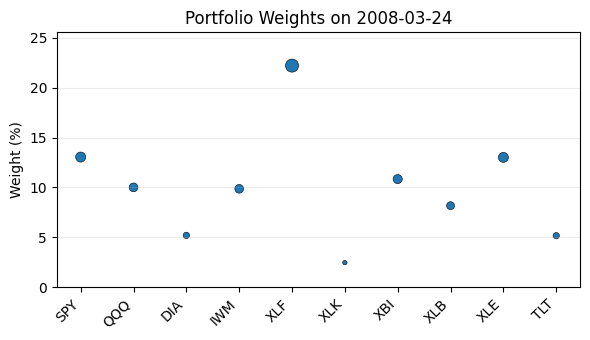


=== Rebalance on 2008-04-21 ===
Optimal portfolio
----------------------
 Investment in SPY : 8.77%
 Investment in QQQ : 6.5%
 Investment in DIA : 10.46%
 Investment in IWM : 7.48%
 Investment in XLF : 7.89%
 Investment in XLK : 7.07%
 Investment in XBI : 16.53%
 Investment in XLB : 25.59%
 Investment in XLE : 1.0%
 Investment in TLT : 8.71%
Cash: 0.0
----------------------
Exp ret = 2.286139377596162%
Expected risk = 0.003045855876633607%


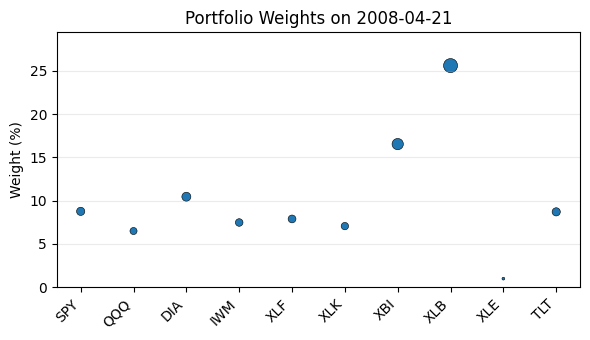


=== Rebalance on 2008-05-19 ===
Optimal portfolio
----------------------
 Investment in SPY : 6.42%
 Investment in QQQ : 7.92%
 Investment in DIA : 16.87%
 Investment in IWM : 7.67%
 Investment in XLF : 1.0%
 Investment in XLK : 9.55%
 Investment in XBI : 13.3%
 Investment in XLB : 17.78%
 Investment in XLE : 4.27%
 Investment in TLT : 15.23%
Cash: 0.0
----------------------
Exp ret = 4.503375557864547%
Expected risk = 0.0028736639102346392%


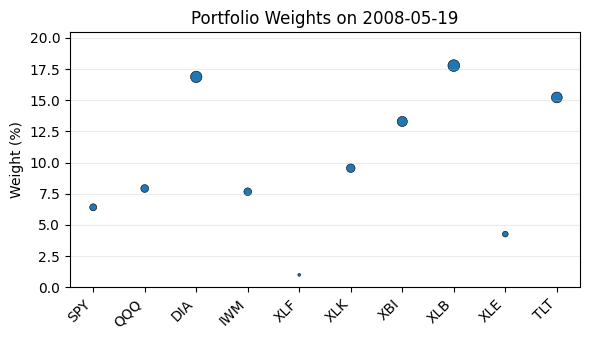


=== Rebalance on 2008-06-16 ===
Optimal portfolio
----------------------
 Investment in SPY : 4.13%
 Investment in QQQ : 10.92%
 Investment in DIA : 14.36%
 Investment in IWM : 6.56%
 Investment in XLF : 1.0%
 Investment in XLK : 14.48%
 Investment in XBI : 13.93%
 Investment in XLB : 21.36%
 Investment in XLE : 1.0%
 Investment in TLT : 12.27%
Cash: 0.0
----------------------
Exp ret = 3.92107121701801%
Expected risk = 0.0031416101947099274%


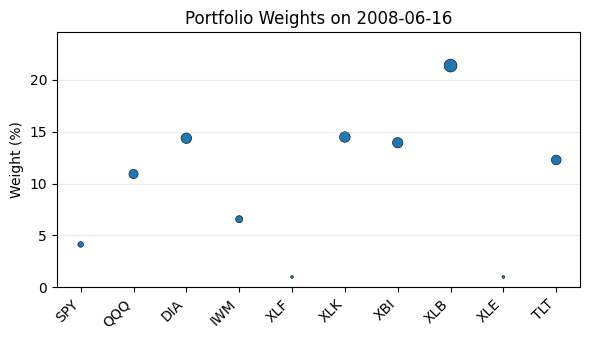


=== Rebalance on 2008-07-14 ===
Optimal portfolio
----------------------
 Investment in SPY : 1.0%
 Investment in QQQ : 9.54%
 Investment in DIA : 10.25%
 Investment in IWM : 3.93%
 Investment in XLF : 18.65%
 Investment in XLK : 26.45%
 Investment in XBI : 5.32%
 Investment in XLB : 15.63%
 Investment in XLE : 1.0%
 Investment in TLT : 8.24%
Cash: 0.0
----------------------
Exp ret = -0.1605563455794152%
Expected risk = 0.0008484901780122101%


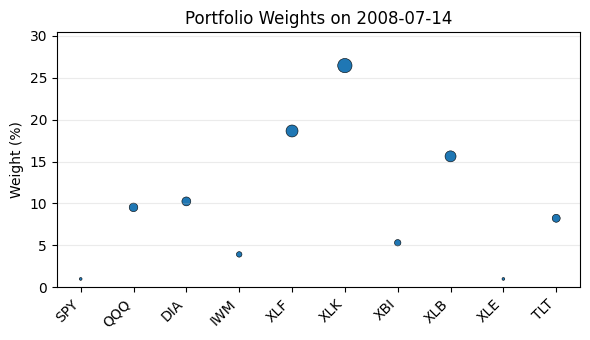


=== Rebalance on 2008-08-11 ===
Optimal portfolio
----------------------
 Investment in SPY : 6.54%
 Investment in QQQ : 14.96%
 Investment in DIA : 11.15%
 Investment in IWM : 6.71%
 Investment in XLF : 15.36%
 Investment in XLK : 33.26%
 Investment in XBI : 1.0%
 Investment in XLB : 1.0%
 Investment in XLE : 1.82%
 Investment in TLT : 8.18%
Cash: 0.0
----------------------
Exp ret = 1.739273072115735%
Expected risk = 0.000977965042425493%


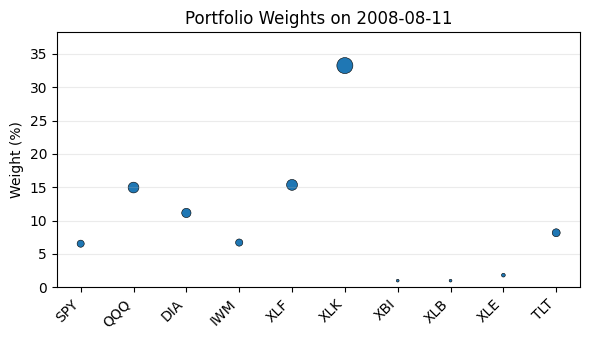


=== Rebalance on 2008-09-08 ===
Optimal portfolio
----------------------
 Investment in SPY : 9.13%
 Investment in QQQ : 12.98%
 Investment in DIA : 4.65%
 Investment in IWM : 8.43%
 Investment in XLF : 22.42%
 Investment in XLK : 23.25%
 Investment in XBI : 1.0%
 Investment in XLB : 1.0%
 Investment in XLE : 13.49%
 Investment in TLT : 3.64%
Cash: 0.0
----------------------
Exp ret = 0.6207025990027004%
Expected risk = 0.0009327543116410066%


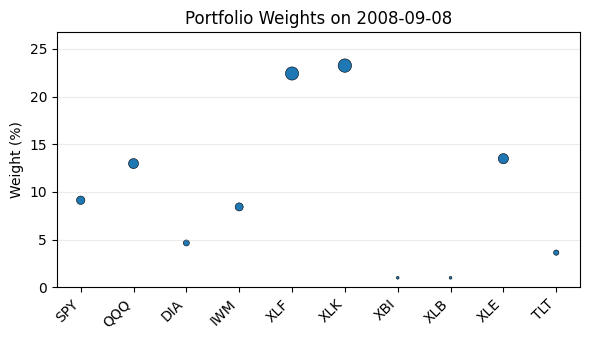


=== Rebalance on 2008-10-06 ===
Optimal portfolio
----------------------
 Investment in SPY : 12.03%
 Investment in QQQ : 12.92%
 Investment in DIA : 1.0%
 Investment in IWM : 9.05%
 Investment in XLF : 34.19%
 Investment in XLK : 13.43%
 Investment in XBI : 1.0%
 Investment in XLB : 1.0%
 Investment in XLE : 13.83%
 Investment in TLT : 1.55%
Cash: 0.0
----------------------
Exp ret = -1.240801529579083%
Expected risk = 0.001584699324424157%


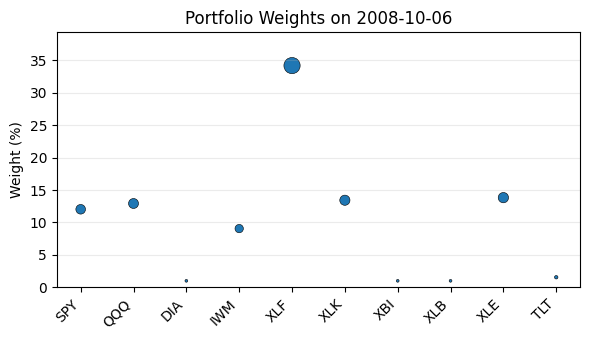


=== Rebalance on 2008-11-03 ===
Optimal portfolio
----------------------
 Investment in SPY : 15.84%
 Investment in QQQ : 3.53%
 Investment in DIA : 1.0%
 Investment in IWM : 7.39%
 Investment in XLF : 45.93%
 Investment in XLK : 11.59%
 Investment in XBI : 1.0%
 Investment in XLB : 5.92%
 Investment in XLE : 6.37%
 Investment in TLT : 1.43%
Cash: 0.0
----------------------
Exp ret = -4.247650881518159%
Expected risk = 0.005664566099546746%


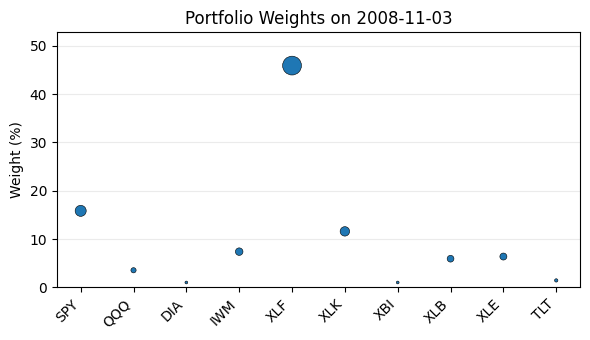


=== Rebalance on 2008-12-01 ===
Optimal portfolio
----------------------
 Investment in SPY : 11.36%
 Investment in QQQ : 1.0%
 Investment in DIA : 1.0%
 Investment in IWM : 2.82%
 Investment in XLF : 60.02%
 Investment in XLK : 13.99%
 Investment in XBI : 1.0%
 Investment in XLB : 6.82%
 Investment in XLE : 1.0%
 Investment in TLT : 1.0%
Cash: 0.0
----------------------
Exp ret = -0.5471801050177002%
Expected risk = 0.004547335249932596%


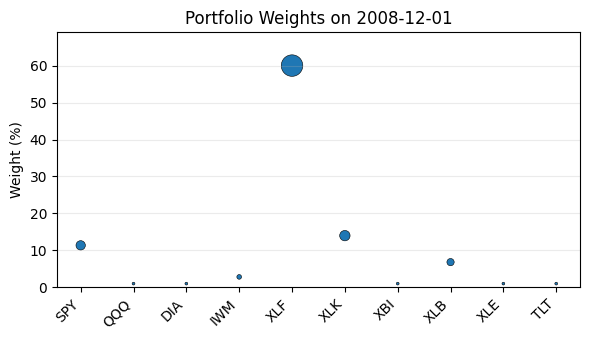


=== Performance 2007 ===
Average Monthly Return   : 0.78%
Monthly Sharpe Ratio     : 0.222
Annualized Sharpe Ratio  : 0.770
Maximum Drawdown         : 5.85%

=== Performance 2008 ===
Average Monthly Return   : 0.07%
Monthly Sharpe Ratio     : 0.015
Annualized Sharpe Ratio  : 0.052
Maximum Drawdown         : 16.59%


In [34]:
print("\nTesting L2 Regularization:")
rebalance_with_regularization(reg_type="L2", gamma=0.05, verbose=True, start_date=start_date, end_date=end_date);


Testing PBR Regularization:


[*********************100%***********************]  10 of 10 completed



=== Rebalance on 2007-03-26 ===
Optimal portfolio
----------------------
 Investment in SPY : 9.15%
 Investment in QQQ : 10.56%
 Investment in DIA : 8.85%
 Investment in IWM : 9.65%
 Investment in XLF : 9.21%
 Investment in XLK : 9.7%
 Investment in XBI : 13.67%
 Investment in XLB : 12.14%
 Investment in XLE : 8.37%
 Investment in TLT : 8.7%
Cash: 0.0
----------------------
Exp ret = 1.4690525877688503%
Expected risk = 0.0019576970074598452%


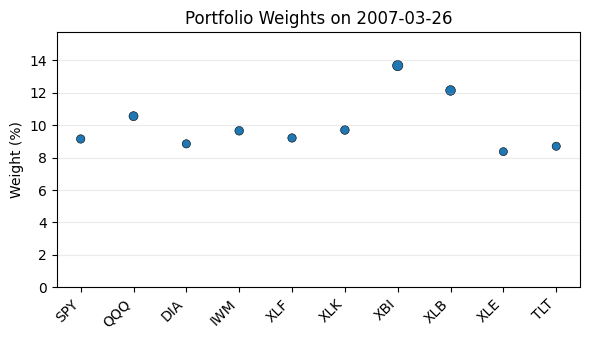


=== Rebalance on 2007-04-23 ===
Optimal portfolio
----------------------
 Investment in SPY : 9.52%
 Investment in QQQ : 9.45%
 Investment in DIA : 9.51%
 Investment in IWM : 9.6%
 Investment in XLF : 9.74%
 Investment in XLK : 11.89%
 Investment in XBI : 11.26%
 Investment in XLB : 11.75%
 Investment in XLE : 8.11%
 Investment in TLT : 9.15%
Cash: 0.0
----------------------
Exp ret = 1.6239813624182378%
Expected risk = 0.0019331422899289507%


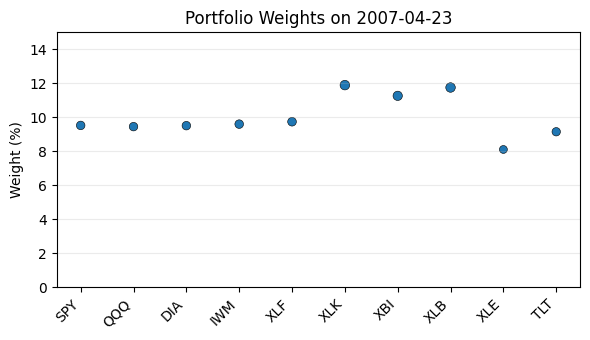


=== Rebalance on 2007-05-21 ===
Optimal portfolio
----------------------
 Investment in SPY : 10.88%
 Investment in QQQ : 8.44%
 Investment in DIA : 9.93%
 Investment in IWM : 10.1%
 Investment in XLF : 4.56%
 Investment in XLK : 12.15%
 Investment in XBI : 10.2%
 Investment in XLB : 14.44%
 Investment in XLE : 8.63%
 Investment in TLT : 10.67%
Cash: 0.0
----------------------
Exp ret = 4.1484633968550195%
Expected risk = 0.0007093013047290433%


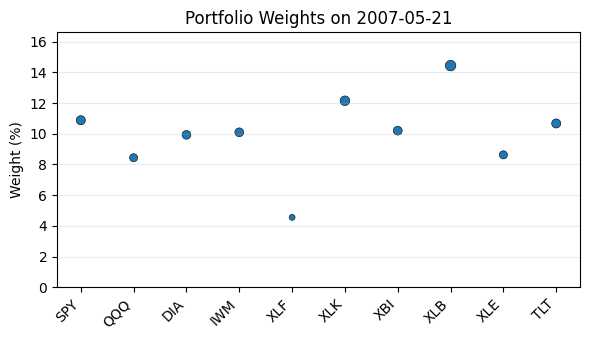


=== Rebalance on 2007-06-18 ===
Optimal portfolio
----------------------
 Investment in SPY : 11.03%
 Investment in QQQ : 9.16%
 Investment in DIA : 10.67%
 Investment in IWM : 9.86%
 Investment in XLF : 4.59%
 Investment in XLK : 11.05%
 Investment in XBI : 9.96%
 Investment in XLB : 13.94%
 Investment in XLE : 8.73%
 Investment in TLT : 11.02%
Cash: 0.0
----------------------
Exp ret = 3.342766532652439%
Expected risk = 0.0005511768701516412%


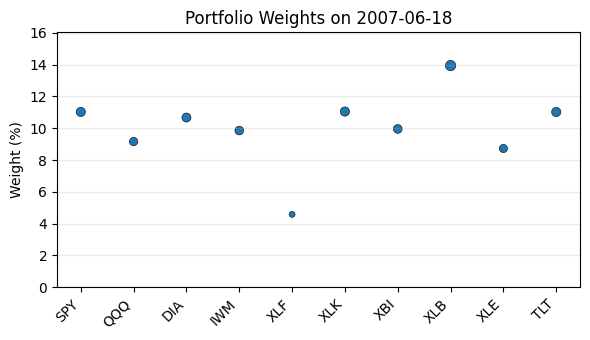


=== Rebalance on 2007-07-16 ===
Optimal portfolio
----------------------
 Investment in SPY : 10.59%
 Investment in QQQ : 9.22%
 Investment in DIA : 11.02%
 Investment in IWM : 9.61%
 Investment in XLF : 6.61%
 Investment in XLK : 7.71%
 Investment in XBI : 11.97%
 Investment in XLB : 14.45%
 Investment in XLE : 7.33%
 Investment in TLT : 11.5%
Cash: 0.0
----------------------
Exp ret = 2.235746558882129%
Expected risk = 0.0007686426596354723%


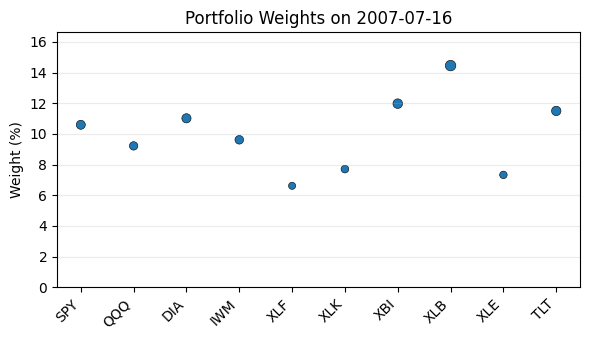


=== Rebalance on 2007-08-13 ===
Optimal portfolio
----------------------
 Investment in SPY : 10.2%
 Investment in QQQ : 8.6%
 Investment in DIA : 11.93%
 Investment in IWM : 9.12%
 Investment in XLF : 11.92%
 Investment in XLK : 10.62%
 Investment in XBI : 9.32%
 Investment in XLB : 11.13%
 Investment in XLE : 5.93%
 Investment in TLT : 11.22%
Cash: 0.0
----------------------
Exp ret = -0.5114163663110957%
Expected risk = 0.0017268093872166198%


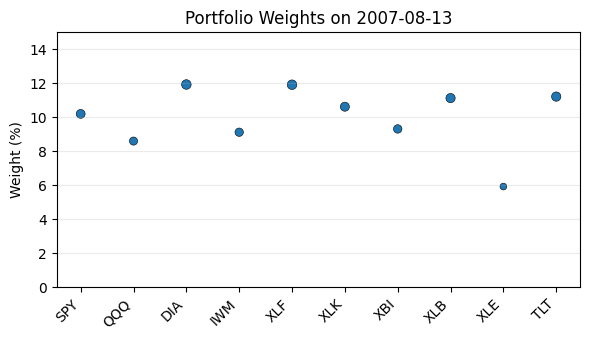


=== Rebalance on 2007-09-10 ===
Optimal portfolio
----------------------
 Investment in SPY : 9.43%
 Investment in QQQ : 7.24%
 Investment in DIA : 11.0%
 Investment in IWM : 8.72%
 Investment in XLF : 14.28%
 Investment in XLK : 15.38%
 Investment in XBI : 7.45%
 Investment in XLB : 10.38%
 Investment in XLE : 5.63%
 Investment in TLT : 10.49%
Cash: 0.0
----------------------
Exp ret = 0.6844535256503499%
Expected risk = 0.0014189472518811098%


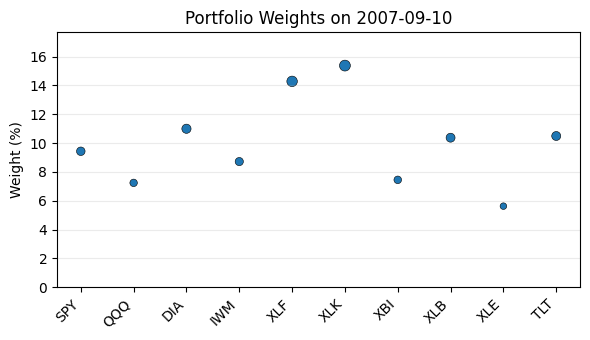


=== Rebalance on 2007-10-08 ===
Optimal portfolio
----------------------
 Investment in SPY : 9.27%
 Investment in QQQ : 8.84%
 Investment in DIA : 10.79%
 Investment in IWM : 9.2%
 Investment in XLF : 10.4%
 Investment in XLK : 15.15%
 Investment in XBI : 8.6%
 Investment in XLB : 9.07%
 Investment in XLE : 9.26%
 Investment in TLT : 9.42%
Cash: 0.0
----------------------
Exp ret = 1.744114949444065%
Expected risk = 0.0018537172687997474%


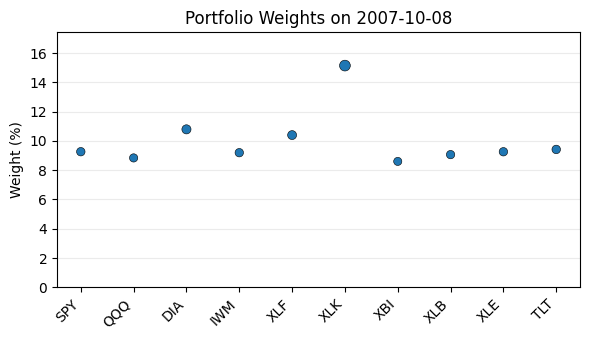


=== Rebalance on 2007-11-05 ===
Optimal portfolio
----------------------
 Investment in SPY : 8.47%
 Investment in QQQ : 7.1%
 Investment in DIA : 13.82%
 Investment in IWM : 8.57%
 Investment in XLF : 9.39%
 Investment in XLK : 12.27%
 Investment in XBI : 13.23%
 Investment in XLB : 11.85%
 Investment in XLE : 3.07%
 Investment in TLT : 12.24%
Cash: 0.0
----------------------
Exp ret = 3.8306677324461385%
Expected risk = 0.001359358121647917%


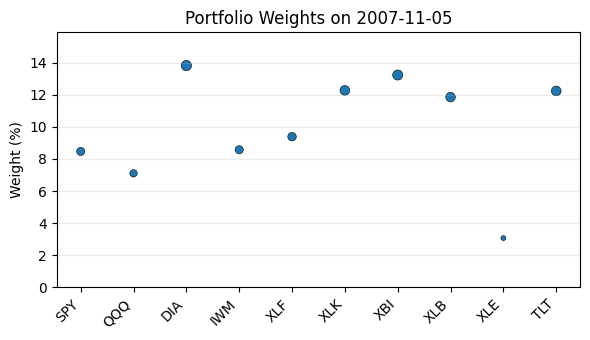


=== Rebalance on 2007-12-03 ===
Optimal portfolio
----------------------
 Investment in SPY : 9.3%
 Investment in QQQ : 8.4%
 Investment in DIA : 11.07%
 Investment in IWM : 9.29%
 Investment in XLF : 12.38%
 Investment in XLK : 12.48%
 Investment in XBI : 11.77%
 Investment in XLB : 10.08%
 Investment in XLE : 5.29%
 Investment in TLT : 9.94%
Cash: 0.0
----------------------
Exp ret = 1.1165560439149924%
Expected risk = 0.0020597364392324394%


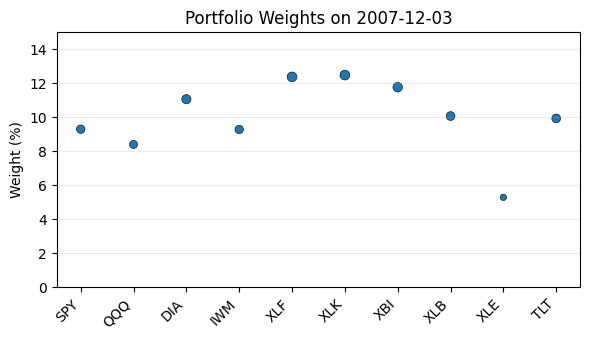


=== Rebalance on 2007-12-31 ===
Optimal portfolio
----------------------
 Investment in SPY : 9.32%
 Investment in QQQ : 7.46%
 Investment in DIA : 10.14%
 Investment in IWM : 9.12%
 Investment in XLF : 14.93%
 Investment in XLK : 11.64%
 Investment in XBI : 10.54%
 Investment in XLB : 13.7%
 Investment in XLE : 2.74%
 Investment in TLT : 10.41%
Cash: 0.0
----------------------
Exp ret = -0.3628370559742247%
Expected risk = 0.0016867119735370691%


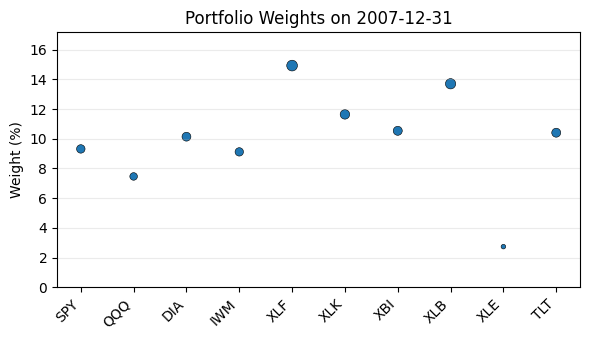


=== Rebalance on 2008-01-28 ===
Optimal portfolio
----------------------
 Investment in SPY : 10.63%
 Investment in QQQ : 8.19%
 Investment in DIA : 7.55%
 Investment in IWM : 9.54%
 Investment in XLF : 16.38%
 Investment in XLK : 10.94%
 Investment in XBI : 10.18%
 Investment in XLB : 9.87%
 Investment in XLE : 9.03%
 Investment in TLT : 7.7%
Cash: 0.0
----------------------
Exp ret = -2.026888696202463%
Expected risk = 0.0017392198362260706%


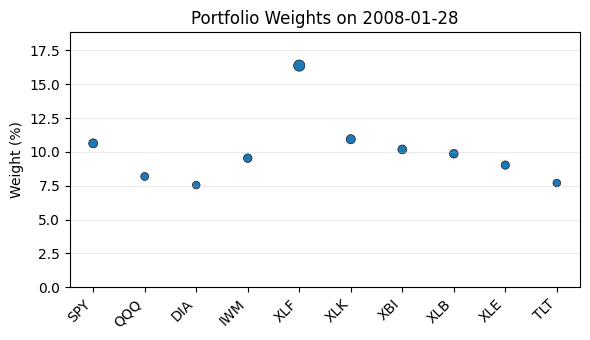


=== Rebalance on 2008-02-25 ===
Optimal portfolio
----------------------
 Investment in SPY : 10.2%
 Investment in QQQ : 8.9%
 Investment in DIA : 6.3%
 Investment in IWM : 9.7%
 Investment in XLF : 15.66%
 Investment in XLK : 7.67%
 Investment in XBI : 12.89%
 Investment in XLB : 13.71%
 Investment in XLE : 8.48%
 Investment in TLT : 6.49%
Cash: 0.0
----------------------
Exp ret = -2.5670796581560578%
Expected risk = 0.002661824411106512%


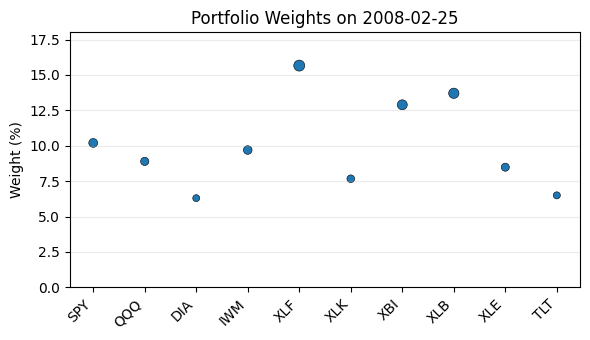


=== Rebalance on 2008-03-24 ===
Optimal portfolio
----------------------
 Investment in SPY : 11.35%
 Investment in QQQ : 10.03%
 Investment in DIA : 7.92%
 Investment in IWM : 9.96%
 Investment in XLF : 15.31%
 Investment in XLK : 6.67%
 Investment in XBI : 10.37%
 Investment in XLB : 9.2%
 Investment in XLE : 11.28%
 Investment in TLT : 7.91%
Cash: 0.0
----------------------
Exp ret = -1.8559378038383725%
Expected risk = 0.0027197836338237135%


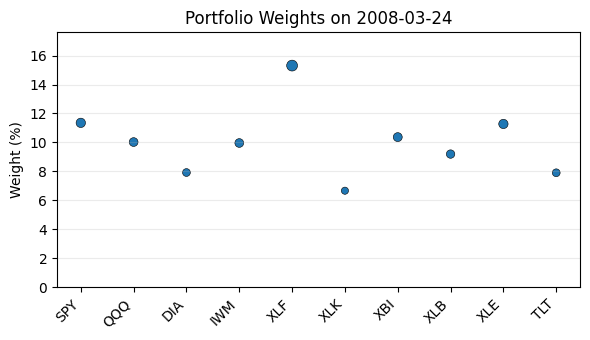


=== Rebalance on 2008-04-21 ===
Optimal portfolio
----------------------
 Investment in SPY : 9.65%
 Investment in QQQ : 8.7%
 Investment in DIA : 10.35%
 Investment in IWM : 9.12%
 Investment in XLF : 9.26%
 Investment in XLK : 8.94%
 Investment in XBI : 13.01%
 Investment in XLB : 16.69%
 Investment in XLE : 4.66%
 Investment in TLT : 9.62%
Cash: 0.0
----------------------
Exp ret = 1.4834227489235172%
Expected risk = 0.002806364501492419%


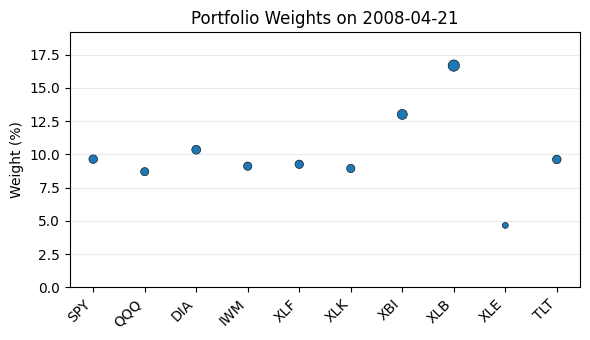


=== Rebalance on 2008-05-19 ===
Optimal portfolio
----------------------
 Investment in SPY : 8.53%
 Investment in QQQ : 9.19%
 Investment in DIA : 12.88%
 Investment in IWM : 9.07%
 Investment in XLF : 5.9%
 Investment in XLK : 9.86%
 Investment in XBI : 11.52%
 Investment in XLB : 13.35%
 Investment in XLE : 7.5%
 Investment in TLT : 12.2%
Cash: 0.0
----------------------
Exp ret = 3.908132563899558%
Expected risk = 0.0025222727988754084%


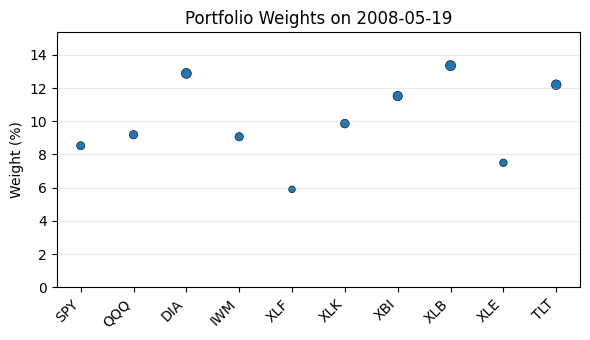


=== Rebalance on 2008-06-16 ===
Optimal portfolio
----------------------
 Investment in SPY : 7.87%
 Investment in QQQ : 10.69%
 Investment in DIA : 12.09%
 Investment in IWM : 8.89%
 Investment in XLF : 5.28%
 Investment in XLK : 12.14%
 Investment in XBI : 11.96%
 Investment in XLB : 14.96%
 Investment in XLE : 4.87%
 Investment in TLT : 11.24%
Cash: 0.0
----------------------
Exp ret = 3.105658391268137%
Expected risk = 0.002844421007498626%


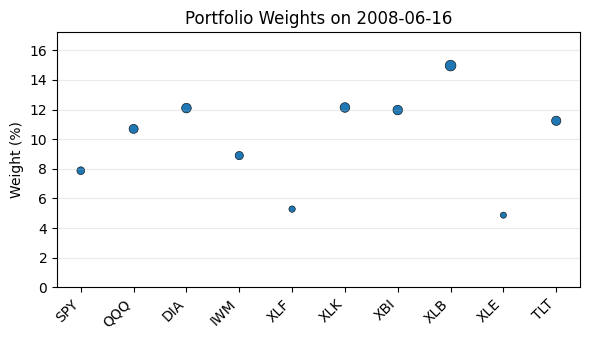


=== Rebalance on 2008-07-14 ===
Optimal portfolio
----------------------
 Investment in SPY : 6.82%
 Investment in QQQ : 10.41%
 Investment in DIA : 10.69%
 Investment in IWM : 8.07%
 Investment in XLF : 14.25%
 Investment in XLK : 17.33%
 Investment in XBI : 8.63%
 Investment in XLB : 12.94%
 Investment in XLE : 1.0%
 Investment in TLT : 9.86%
Cash: 0.0
----------------------
Exp ret = -1.1209216523873033%
Expected risk = 0.0010304387116360607%


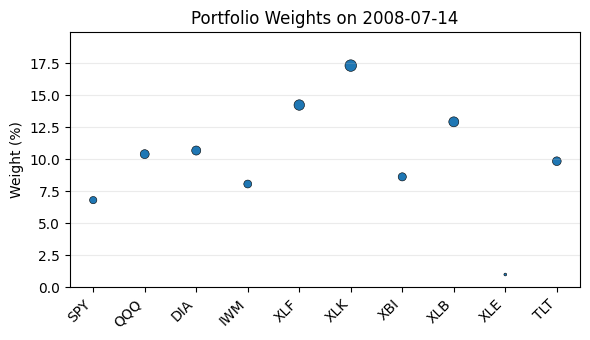


=== Rebalance on 2008-08-11 ===
Optimal portfolio
----------------------
 Investment in SPY : 9.01%
 Investment in QQQ : 12.42%
 Investment in DIA : 10.9%
 Investment in IWM : 9.11%
 Investment in XLF : 12.65%
 Investment in XLK : 19.57%
 Investment in XBI : 6.08%
 Investment in XLB : 3.58%
 Investment in XLE : 6.99%
 Investment in TLT : 9.68%
Cash: 0.0
----------------------
Exp ret = 0.1361160553960731%
Expected risk = 0.0010333820352408242%


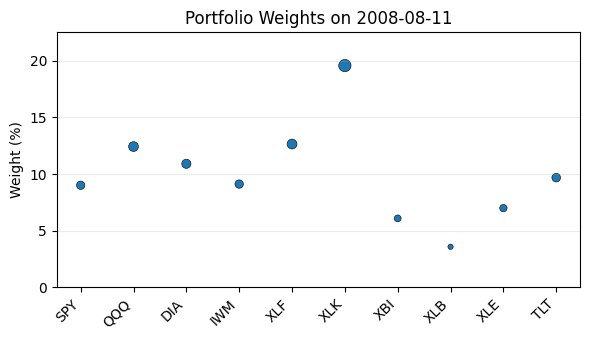


=== Rebalance on 2008-09-08 ===
Optimal portfolio
----------------------
 Investment in SPY : 10.18%
 Investment in QQQ : 11.77%
 Investment in DIA : 8.3%
 Investment in IWM : 9.91%
 Investment in XLF : 15.65%
 Investment in XLK : 15.99%
 Investment in XBI : 5.56%
 Investment in XLB : 2.81%
 Investment in XLE : 11.96%
 Investment in TLT : 7.87%
Cash: 0.0
----------------------
Exp ret = -0.43529759047561556%
Expected risk = 0.00105394869474006%


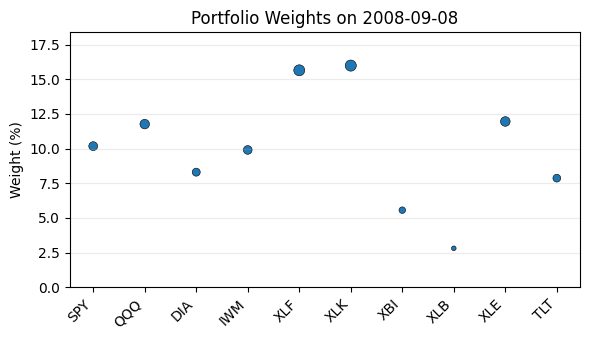


=== Rebalance on 2008-10-06 ===
Optimal portfolio
----------------------
 Investment in SPY : 11.53%
 Investment in QQQ : 11.79%
 Investment in DIA : 6.58%
 Investment in IWM : 10.3%
 Investment in XLF : 20.48%
 Investment in XLK : 12.09%
 Investment in XBI : 4.11%
 Investment in XLB : 3.75%
 Investment in XLE : 12.23%
 Investment in TLT : 7.15%
Cash: 0.0
----------------------
Exp ret = -2.8510750751353604%
Expected risk = 0.002692056184892731%


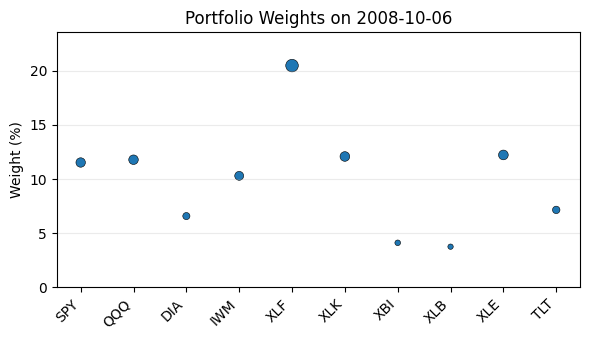


=== Rebalance on 2008-11-03 ===
Optimal portfolio
----------------------
 Investment in SPY : 12.74%
 Investment in QQQ : 7.53%
 Investment in DIA : 5.58%
 Investment in IWM : 9.3%
 Investment in XLF : 26.07%
 Investment in XLK : 11.21%
 Investment in XBI : 4.14%
 Investment in XLB : 7.99%
 Investment in XLE : 8.53%
 Investment in TLT : 6.91%
Cash: 0.0
----------------------
Exp ret = -6.562803857959758%
Expected risk = 0.011239037454756469%


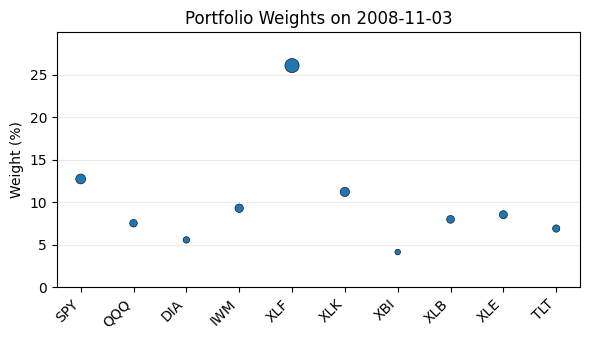


=== Rebalance on 2008-12-01 ===
Optimal portfolio
----------------------
 Investment in SPY : 12.37%
 Investment in QQQ : 4.92%
 Investment in DIA : 6.15%
 Investment in IWM : 8.76%
 Investment in XLF : 32.91%
 Investment in XLK : 13.24%
 Investment in XBI : 1.89%
 Investment in XLB : 9.59%
 Investment in XLE : 1.94%
 Investment in TLT : 8.21%
Cash: 0.0
----------------------
Exp ret = -4.710707538761759%
Expected risk = 0.012206773112712949%


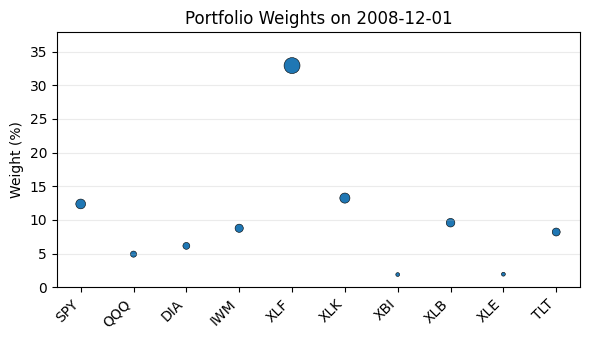


=== Performance 2007 ===
Average Monthly Return   : 0.62%
Monthly Sharpe Ratio     : 0.176
Annualized Sharpe Ratio  : 0.608
Maximum Drawdown         : 5.88%

=== Performance 2008 ===
Average Monthly Return   : -0.22%
Monthly Sharpe Ratio     : -0.048
Annualized Sharpe Ratio  : -0.166
Maximum Drawdown         : 16.95%


In [35]:
print("\nTesting PBR Regularization:")
rebalance_with_regularization(reg_type="PBR", gamma=0.03, epsilon=0.45, verbose=True, start_date=start_date, end_date=end_date);


Testing CVaR PBR Regularization:


[*********************100%***********************]  10 of 10 completed



=== Rebalance on 2007-03-26 ===
Optimal portfolio
----------------------
 Investment in SPY : 9.12%
 Investment in QQQ : 10.67%
 Investment in DIA : 8.94%
 Investment in IWM : 9.67%
 Investment in XLF : 8.63%
 Investment in XLK : 9.96%
 Investment in XBI : 13.7%
 Investment in XLB : 12.19%
 Investment in XLE : 8.39%
 Investment in TLT : 8.73%
Cash: 0.0
----------------------
Exp ret = 1.4766421205976332%
Expected risk = 0.0019947381488034646%


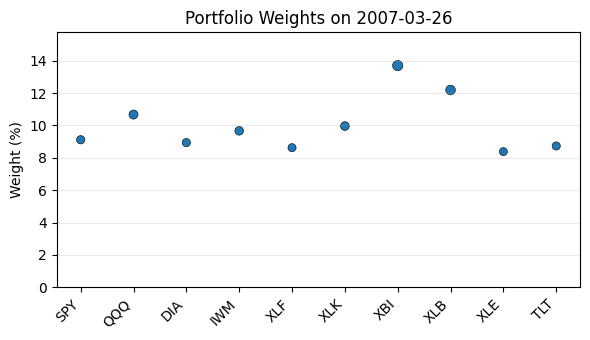


=== Rebalance on 2007-04-23 ===
Optimal portfolio
----------------------
 Investment in SPY : 9.52%
 Investment in QQQ : 9.53%
 Investment in DIA : 9.58%
 Investment in IWM : 9.62%
 Investment in XLF : 9.18%
 Investment in XLK : 12.12%
 Investment in XBI : 11.28%
 Investment in XLB : 11.84%
 Investment in XLE : 8.16%
 Investment in TLT : 9.18%
Cash: 0.0
----------------------
Exp ret = 1.6315629000954273%
Expected risk = 0.0019661650966688845%


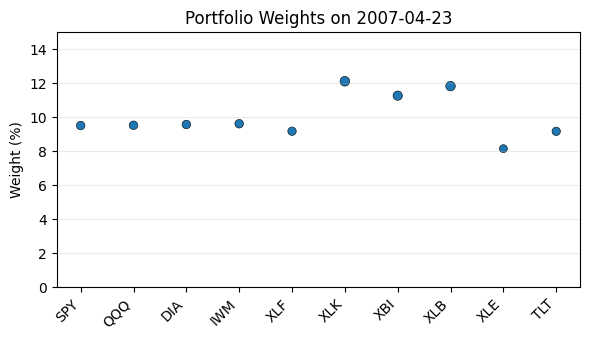


=== Rebalance on 2007-05-21 ===
Optimal portfolio
----------------------
 Investment in SPY : 10.9%
 Investment in QQQ : 8.46%
 Investment in DIA : 9.93%
 Investment in IWM : 10.13%
 Investment in XLF : 4.37%
 Investment in XLK : 12.17%
 Investment in XBI : 10.17%
 Investment in XLB : 14.54%
 Investment in XLE : 8.68%
 Investment in TLT : 10.65%
Cash: 0.0
----------------------
Exp ret = 4.160277675126085%
Expected risk = 0.0007137956068667441%


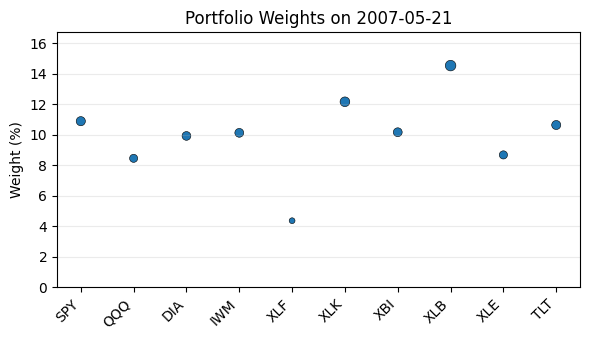


=== Rebalance on 2007-06-18 ===
Optimal portfolio
----------------------
 Investment in SPY : 11.02%
 Investment in QQQ : 9.16%
 Investment in DIA : 10.67%
 Investment in IWM : 9.86%
 Investment in XLF : 4.51%
 Investment in XLK : 11.13%
 Investment in XBI : 9.96%
 Investment in XLB : 13.96%
 Investment in XLE : 8.72%
 Investment in TLT : 11.01%
Cash: 0.0
----------------------
Exp ret = 3.3473665756322863%
Expected risk = 0.0005522506531250536%


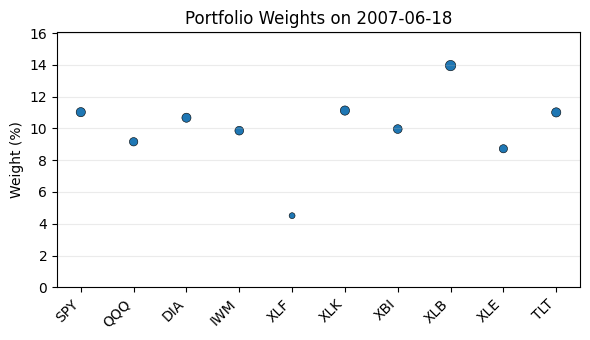


=== Rebalance on 2007-07-16 ===
Optimal portfolio
----------------------
 Investment in SPY : 10.58%
 Investment in QQQ : 9.22%
 Investment in DIA : 11.0%
 Investment in IWM : 9.6%
 Investment in XLF : 6.45%
 Investment in XLK : 7.82%
 Investment in XBI : 12.01%
 Investment in XLB : 14.55%
 Investment in XLE : 7.3%
 Investment in TLT : 11.48%
Cash: 0.0
----------------------
Exp ret = 2.242990891497909%
Expected risk = 0.0007732043902199027%


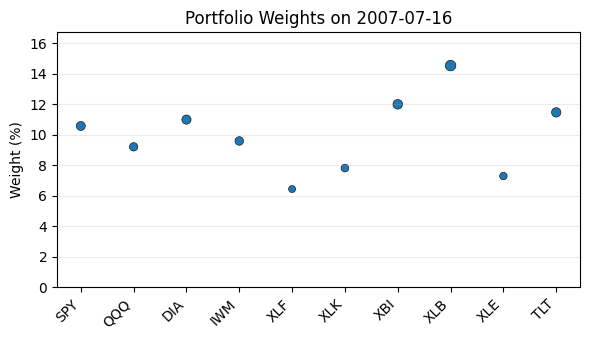


=== Rebalance on 2007-08-13 ===
Optimal portfolio
----------------------
 Investment in SPY : 10.14%
 Investment in QQQ : 8.78%
 Investment in DIA : 11.89%
 Investment in IWM : 9.11%
 Investment in XLF : 11.38%
 Investment in XLK : 10.62%
 Investment in XBI : 9.55%
 Investment in XLB : 11.39%
 Investment in XLE : 5.97%
 Investment in TLT : 11.16%
Cash: 0.0
----------------------
Exp ret = -0.5194642091036186%
Expected risk = 0.0017643151257141412%


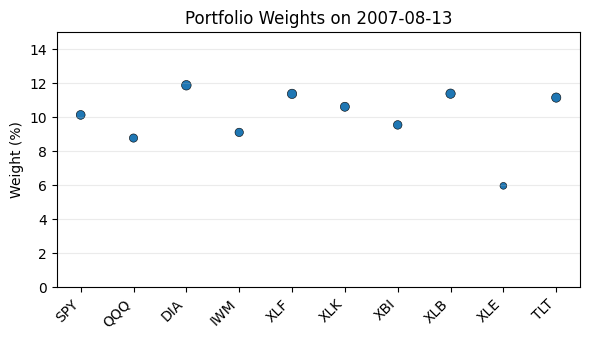


=== Rebalance on 2007-09-10 ===
Optimal portfolio
----------------------
 Investment in SPY : 9.39%
 Investment in QQQ : 7.36%
 Investment in DIA : 11.01%
 Investment in IWM : 8.72%
 Investment in XLF : 13.81%
 Investment in XLK : 15.26%
 Investment in XBI : 7.79%
 Investment in XLB : 10.57%
 Investment in XLE : 5.62%
 Investment in TLT : 10.49%
Cash: 0.0
----------------------
Exp ret = 0.6584455932042783%
Expected risk = 0.0014518049096112085%


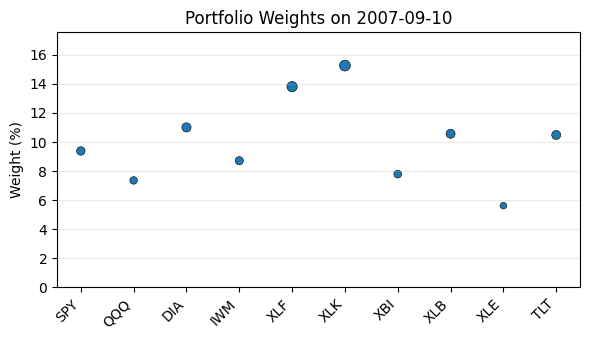


=== Rebalance on 2007-10-08 ===
Optimal portfolio
----------------------
 Investment in SPY : 9.21%
 Investment in QQQ : 9.06%
 Investment in DIA : 10.8%
 Investment in IWM : 9.2%
 Investment in XLF : 9.79%
 Investment in XLK : 14.96%
 Investment in XBI : 8.99%
 Investment in XLB : 9.23%
 Investment in XLE : 9.35%
 Investment in TLT : 9.4%
Cash: 0.0
----------------------
Exp ret = 1.7317167316744664%
Expected risk = 0.001908477796559992%


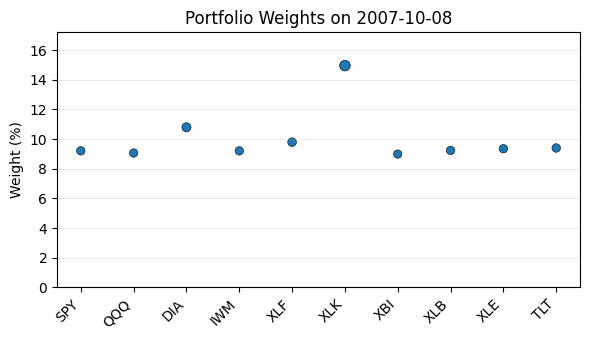


=== Rebalance on 2007-11-05 ===
Optimal portfolio
----------------------
 Investment in SPY : 8.51%
 Investment in QQQ : 7.28%
 Investment in DIA : 13.77%
 Investment in IWM : 8.61%
 Investment in XLF : 8.87%
 Investment in XLK : 12.15%
 Investment in XBI : 13.42%
 Investment in XLB : 11.87%
 Investment in XLE : 3.34%
 Investment in TLT : 12.19%
Cash: 0.0
----------------------
Exp ret = 3.817393094322938%
Expected risk = 0.0013951476848610093%


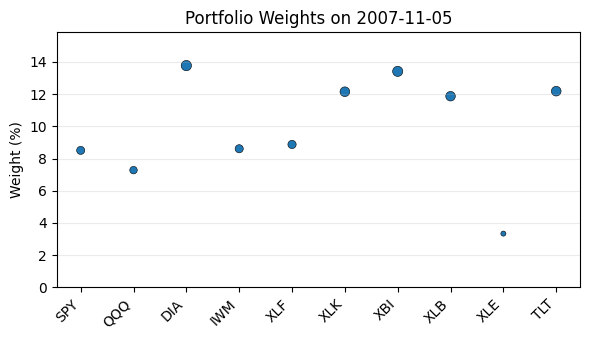


=== Rebalance on 2007-12-03 ===
Optimal portfolio
----------------------
 Investment in SPY : 9.34%
 Investment in QQQ : 8.55%
 Investment in DIA : 11.19%
 Investment in IWM : 9.31%
 Investment in XLF : 11.65%
 Investment in XLK : 12.45%
 Investment in XBI : 11.9%
 Investment in XLB : 9.9%
 Investment in XLE : 5.69%
 Investment in TLT : 10.02%
Cash: 0.0
----------------------
Exp ret = 1.094152038424896%
Expected risk = 0.002123675372699301%


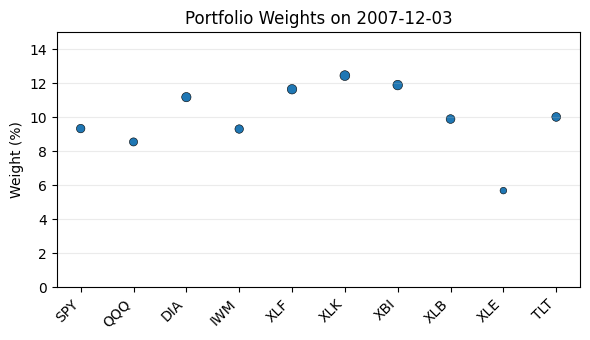


=== Rebalance on 2007-12-31 ===
Optimal portfolio
----------------------
 Investment in SPY : 9.34%
 Investment in QQQ : 7.62%
 Investment in DIA : 10.26%
 Investment in IWM : 9.13%
 Investment in XLF : 14.33%
 Investment in XLK : 11.65%
 Investment in XBI : 10.6%
 Investment in XLB : 13.57%
 Investment in XLE : 3.05%
 Investment in TLT : 10.45%
Cash: 0.0
----------------------
Exp ret = -0.4065796035874326%
Expected risk = 0.0017268157824065849%


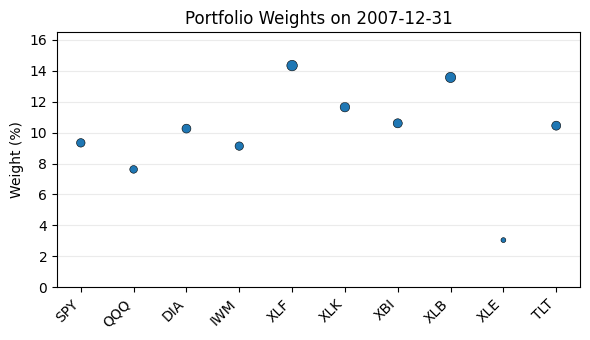


=== Rebalance on 2008-01-28 ===
Optimal portfolio
----------------------
 Investment in SPY : 10.64%
 Investment in QQQ : 8.31%
 Investment in DIA : 7.58%
 Investment in IWM : 9.58%
 Investment in XLF : 15.78%
 Investment in XLK : 10.82%
 Investment in XBI : 10.33%
 Investment in XLB : 9.91%
 Investment in XLE : 9.33%
 Investment in TLT : 7.72%
Cash: 0.0
----------------------
Exp ret = -2.0588075183668475%
Expected risk = 0.0017782124123437715%


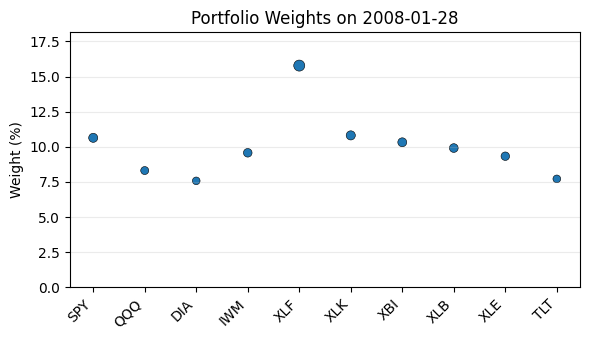


=== Rebalance on 2008-02-25 ===
Optimal portfolio
----------------------
 Investment in SPY : 10.19%
 Investment in QQQ : 9.09%
 Investment in DIA : 6.25%
 Investment in IWM : 9.78%
 Investment in XLF : 14.84%
 Investment in XLK : 7.39%
 Investment in XBI : 13.03%
 Investment in XLB : 13.86%
 Investment in XLE : 9.06%
 Investment in TLT : 6.52%
Cash: 0.0
----------------------
Exp ret = -2.589346424881502%
Expected risk = 0.0027535513161904787%


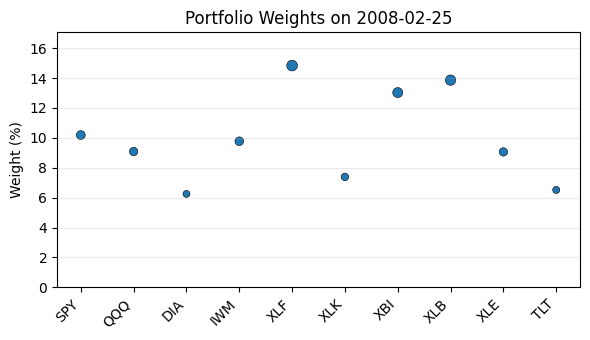


=== Rebalance on 2008-03-24 ===
Optimal portfolio
----------------------
 Investment in SPY : 11.39%
 Investment in QQQ : 10.13%
 Investment in DIA : 7.78%
 Investment in IWM : 10.05%
 Investment in XLF : 14.68%
 Investment in XLK : 6.48%
 Investment in XBI : 10.43%
 Investment in XLB : 9.19%
 Investment in XLE : 12.03%
 Investment in TLT : 7.84%
Cash: 0.0
----------------------
Exp ret = -1.8572263441755075%
Expected risk = 0.002802842294269723%


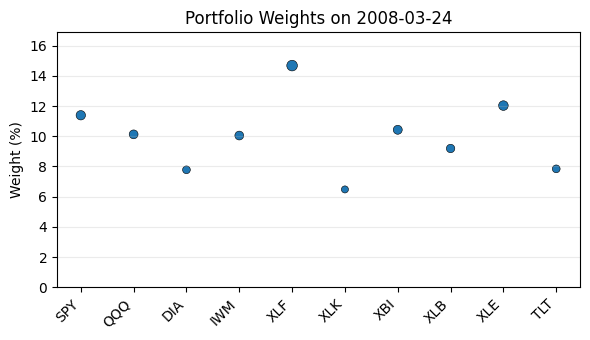


=== Rebalance on 2008-04-21 ===
Optimal portfolio
----------------------
 Investment in SPY : 9.59%
 Investment in QQQ : 8.77%
 Investment in DIA : 10.45%
 Investment in IWM : 9.12%
 Investment in XLF : 8.51%
 Investment in XLK : 8.94%
 Investment in XBI : 13.15%
 Investment in XLB : 16.8%
 Investment in XLE : 5.06%
 Investment in TLT : 9.63%
Cash: 0.0
----------------------
Exp ret = 1.4868392413300764%
Expected risk = 0.0028687172844240765%


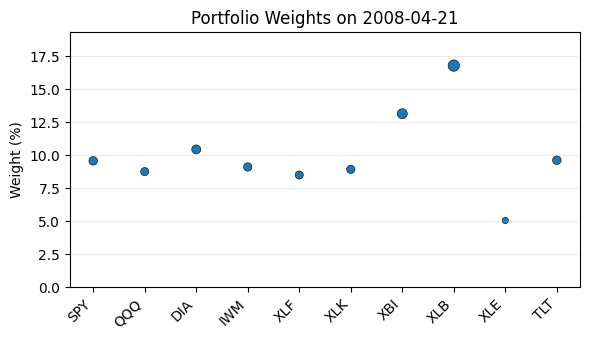


=== Rebalance on 2008-05-19 ===
Optimal portfolio
----------------------
 Investment in SPY : 8.46%
 Investment in QQQ : 9.3%
 Investment in DIA : 12.98%
 Investment in IWM : 9.07%
 Investment in XLF : 5.23%
 Investment in XLK : 9.84%
 Investment in XBI : 11.68%
 Investment in XLB : 13.46%
 Investment in XLE : 7.83%
 Investment in TLT : 12.15%
Cash: 0.0
----------------------
Exp ret = 3.9353345865659235%
Expected risk = 0.002574871523296899%


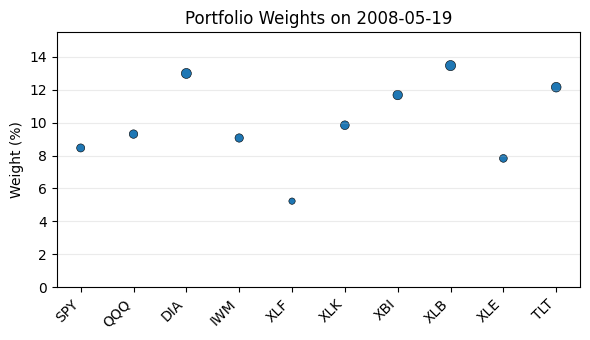


=== Rebalance on 2008-06-16 ===
Optimal portfolio
----------------------
 Investment in SPY : 7.82%
 Investment in QQQ : 10.73%
 Investment in DIA : 12.3%
 Investment in IWM : 8.92%
 Investment in XLF : 4.45%
 Investment in XLK : 12.0%
 Investment in XBI : 12.13%
 Investment in XLB : 15.01%
 Investment in XLE : 5.29%
 Investment in TLT : 11.35%
Cash: 0.0
----------------------
Exp ret = 3.1354435981468756%
Expected risk = 0.002926089613518131%


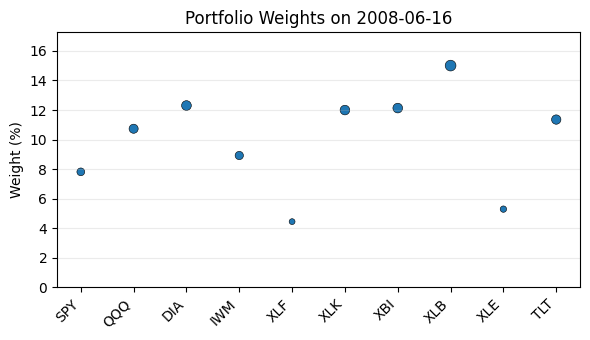


=== Rebalance on 2008-07-14 ===
Optimal portfolio
----------------------
 Investment in SPY : 6.8%
 Investment in QQQ : 10.49%
 Investment in DIA : 10.83%
 Investment in IWM : 8.1%
 Investment in XLF : 13.88%
 Investment in XLK : 17.27%
 Investment in XBI : 8.77%
 Investment in XLB : 12.88%
 Investment in XLE : 1.0%
 Investment in TLT : 9.99%
Cash: 0.0
----------------------
Exp ret = -1.1372558736598064%
Expected risk = 0.0010462422798587893%


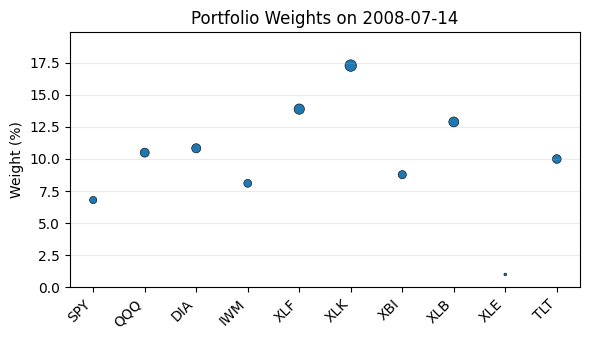


=== Rebalance on 2008-08-11 ===
Optimal portfolio
----------------------
 Investment in SPY : 9.09%
 Investment in QQQ : 12.55%
 Investment in DIA : 11.0%
 Investment in IWM : 9.15%
 Investment in XLF : 12.3%
 Investment in XLK : 19.54%
 Investment in XBI : 6.04%
 Investment in XLB : 3.13%
 Investment in XLE : 7.38%
 Investment in TLT : 9.82%
Cash: 0.0
----------------------
Exp ret = 0.14654165541247027%
Expected risk = 0.001074936591190612%


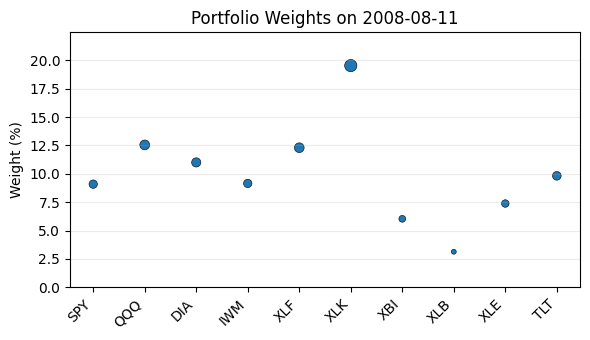


=== Rebalance on 2008-09-08 ===
Optimal portfolio
----------------------
 Investment in SPY : 10.2%
 Investment in QQQ : 11.91%
 Investment in DIA : 8.42%
 Investment in IWM : 9.9%
 Investment in XLF : 15.3%
 Investment in XLK : 16.0%
 Investment in XBI : 5.59%
 Investment in XLB : 2.46%
 Investment in XLE : 12.19%
 Investment in TLT : 8.02%
Cash: 0.0
----------------------
Exp ret = -0.4278338190421168%
Expected risk = 0.0010819187566311267%


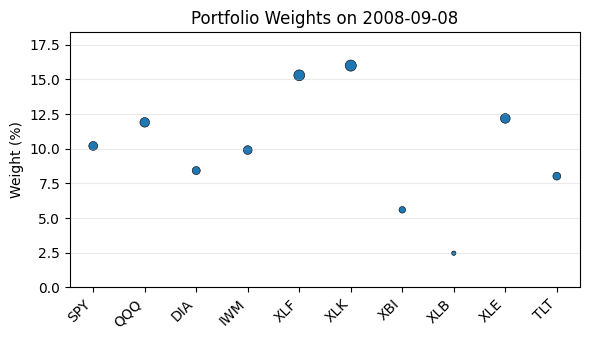


=== Rebalance on 2008-10-06 ===
Optimal portfolio
----------------------
 Investment in SPY : 11.33%
 Investment in QQQ : 12.05%
 Investment in DIA : 6.84%
 Investment in IWM : 10.22%
 Investment in XLF : 19.47%
 Investment in XLK : 12.03%
 Investment in XBI : 4.47%
 Investment in XLB : 3.98%
 Investment in XLE : 12.4%
 Investment in TLT : 7.2%
Cash: 0.0
----------------------
Exp ret = -2.954986208599904%
Expected risk = 0.0028061645088890016%


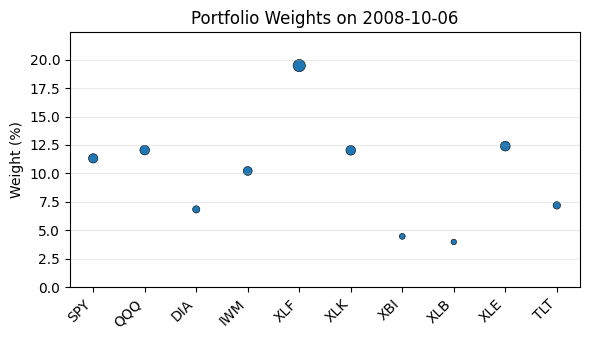


=== Rebalance on 2008-11-03 ===
Optimal portfolio
----------------------
 Investment in SPY : 13.12%
 Investment in QQQ : 7.94%
 Investment in DIA : 5.42%
 Investment in IWM : 9.8%
 Investment in XLF : 21.6%
 Investment in XLK : 11.02%
 Investment in XBI : 4.57%
 Investment in XLB : 10.22%
 Investment in XLE : 9.57%
 Investment in TLT : 6.75%
Cash: 0.0
----------------------
Exp ret = -6.9610724021862%
Expected risk = 0.013325591764373836%


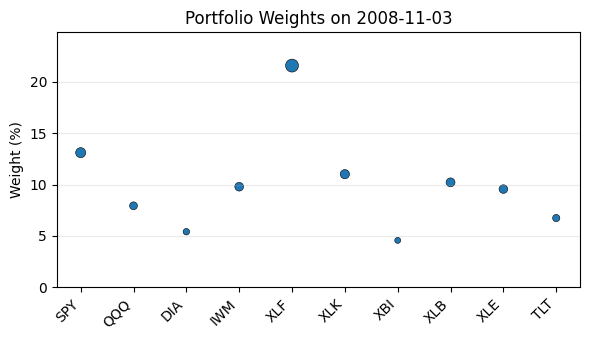


=== Rebalance on 2008-12-01 ===
Optimal portfolio
----------------------
 Investment in SPY : 12.33%
 Investment in QQQ : 5.72%
 Investment in DIA : 5.65%
 Investment in IWM : 9.28%
 Investment in XLF : 27.42%
 Investment in XLK : 12.85%
 Investment in XBI : 2.49%
 Investment in XLB : 11.4%
 Investment in XLE : 5.11%
 Investment in TLT : 7.73%
Cash: 0.0
----------------------
Exp ret = -5.5861976416513315%
Expected risk = 0.015502002027927769%


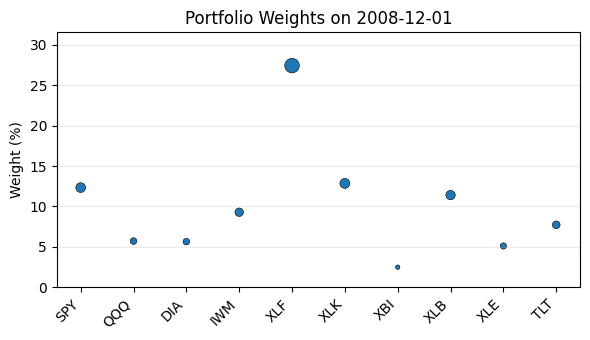


=== Performance 2007 ===
Average Monthly Return   : 0.61%
Monthly Sharpe Ratio     : 0.174
Annualized Sharpe Ratio  : 0.601
Maximum Drawdown         : 5.95%

=== Performance 2008 ===
Average Monthly Return   : -0.29%
Monthly Sharpe Ratio     : -0.064
Annualized Sharpe Ratio  : -0.222
Maximum Drawdown         : 17.08%


In [36]:
print("\nTesting CVaR PBR Regularization:")
rebalance_with_regularization(reg_type="CVAR_PBR", gamma=0.045, epsilon=0.4, verbose=True, start_date=start_date, end_date=end_date);



*   Testing portfolio on the COVID-19 pandemic, where there are extreme market volatility, especially during February–March 2020.


[*******************   40%                       ]  4 of 10 completed

Testing L1 Regularization:


[*********************100%***********************]  10 of 10 completed



=== Rebalance on 2019-03-26 ===
Optimal portfolio
----------------------
 Investment in SPY : 9.81%
 Investment in QQQ : 7.46%
 Investment in DIA : 16.57%
 Investment in IWM : 11.89%
 Investment in XLF : 1.36%
 Investment in XLK : 12.35%
 Investment in XBI : 4.61%
 Investment in XLB : 9.07%
 Investment in XLE : 1.88%
 Investment in TLT : 25.0%
Cash: 0.0
----------------------
Exp ret = 4.219096279523067%
Expected risk = 0.0014906466253842216%


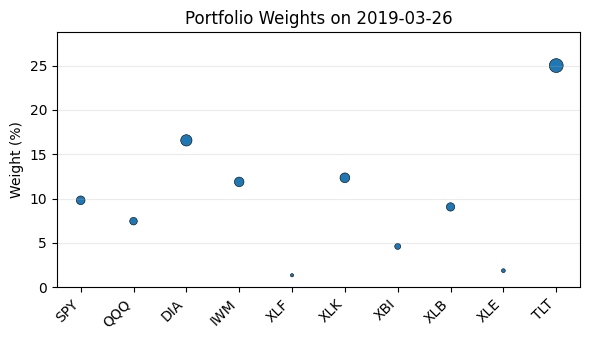


=== Rebalance on 2019-04-23 ===
Optimal portfolio
----------------------
 Investment in SPY : 8.29%
 Investment in QQQ : 3.89%
 Investment in DIA : 17.89%
 Investment in IWM : 11.21%
 Investment in XLF : 3.39%
 Investment in XLK : 1.0%
 Investment in XBI : 12.49%
 Investment in XLB : 9.67%
 Investment in XLE : 6.83%
 Investment in TLT : 25.34%
Cash: 0.0
----------------------
Exp ret = 3.324320948936441%
Expected risk = 0.0006952941141318338%


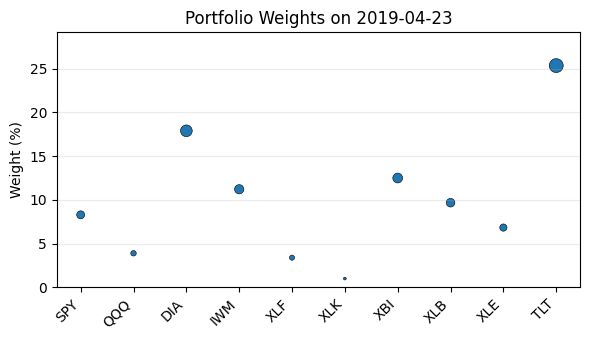


=== Rebalance on 2019-05-21 ===
Optimal portfolio
----------------------
 Investment in SPY : 8.41%
 Investment in QQQ : 3.63%
 Investment in DIA : 14.96%
 Investment in IWM : 12.77%
 Investment in XLF : 20.69%
 Investment in XLK : 1.0%
 Investment in XBI : 5.46%
 Investment in XLB : 3.26%
 Investment in XLE : 12.75%
 Investment in TLT : 17.06%
Cash: 0.0
----------------------
Exp ret = 0.9974965389516686%
Expected risk = 0.0009596422754311874%


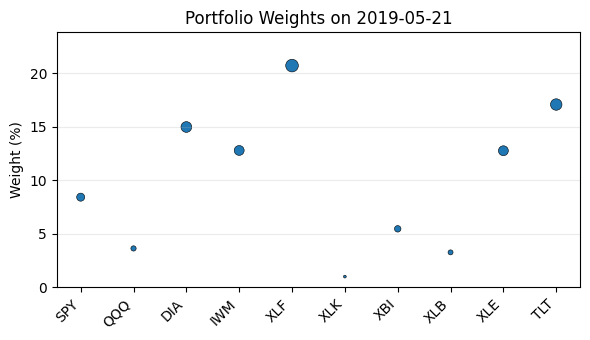


=== Rebalance on 2019-06-18 ===
Optimal portfolio
----------------------
 Investment in SPY : 9.2%
 Investment in QQQ : 6.2%
 Investment in DIA : 10.65%
 Investment in IWM : 11.32%
 Investment in XLF : 22.75%
 Investment in XLK : 1.0%
 Investment in XBI : 12.55%
 Investment in XLB : 1.0%
 Investment in XLE : 13.6%
 Investment in TLT : 11.72%
Cash: 0.0
----------------------
Exp ret = 0.933012296337259%
Expected risk = 0.0012983765284451413%


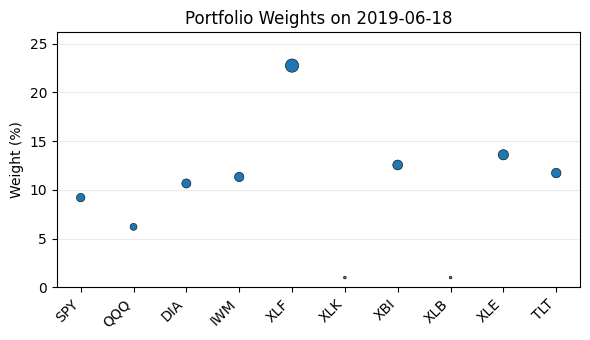


=== Rebalance on 2019-07-16 ===
Optimal portfolio
----------------------
 Investment in SPY : 12.84%
 Investment in QQQ : 2.79%
 Investment in DIA : 9.59%
 Investment in IWM : 11.48%
 Investment in XLF : 21.22%
 Investment in XLK : 5.89%
 Investment in XBI : 12.27%
 Investment in XLB : 2.06%
 Investment in XLE : 8.56%
 Investment in TLT : 13.3%
Cash: 0.0
----------------------
Exp ret = 1.3461972924670045%
Expected risk = 0.001485692483485497%


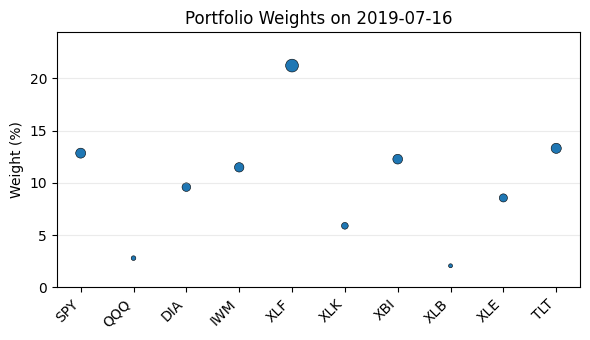


=== Rebalance on 2019-08-13 ===
Optimal portfolio
----------------------
 Investment in SPY : 7.52%
 Investment in QQQ : 2.78%
 Investment in DIA : 11.22%
 Investment in IWM : 8.81%
 Investment in XLF : 29.08%
 Investment in XLK : 4.14%
 Investment in XBI : 15.86%
 Investment in XLB : 1.0%
 Investment in XLE : 4.21%
 Investment in TLT : 15.37%
Cash: 0.0
----------------------
Exp ret = 2.3781601737169202%
Expected risk = 0.0011795517091587548%


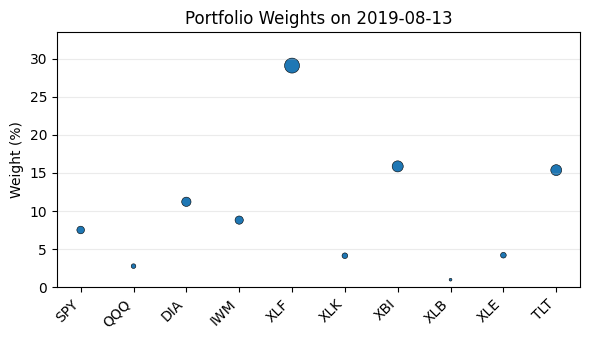


=== Rebalance on 2019-09-10 ===
Optimal portfolio
----------------------
 Investment in SPY : 9.88%
 Investment in QQQ : 7.48%
 Investment in DIA : 10.9%
 Investment in IWM : 11.3%
 Investment in XLF : 24.88%
 Investment in XLK : 1.0%
 Investment in XBI : 5.77%
 Investment in XLB : 1.35%
 Investment in XLE : 13.63%
 Investment in TLT : 13.81%
Cash: 0.0
----------------------
Exp ret = 1.351126875156471%
Expected risk = 0.0009424417907074876%


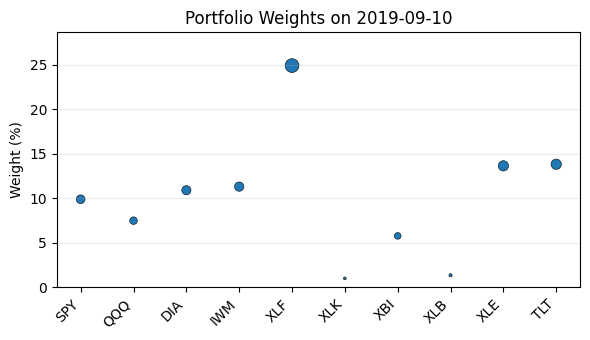


=== Rebalance on 2019-10-08 ===
Optimal portfolio
----------------------
 Investment in SPY : 9.5%
 Investment in QQQ : 8.28%
 Investment in DIA : 9.37%
 Investment in IWM : 10.93%
 Investment in XLF : 32.37%
 Investment in XLK : 1.0%
 Investment in XBI : 7.27%
 Investment in XLB : 1.0%
 Investment in XLE : 9.75%
 Investment in TLT : 10.54%
Cash: 0.0
----------------------
Exp ret = 0.7389233518053626%
Expected risk = 0.0005977878610614755%


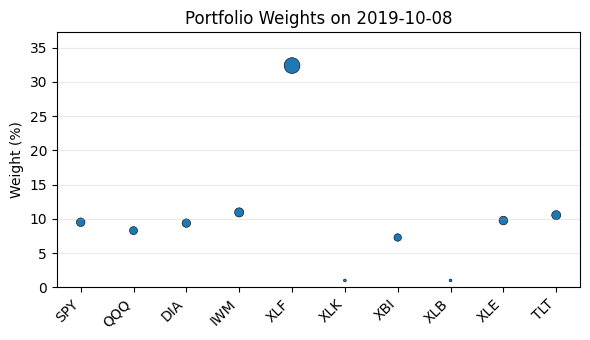


=== Rebalance on 2019-11-05 ===
Optimal portfolio
----------------------
 Investment in SPY : 10.92%
 Investment in QQQ : 11.74%
 Investment in DIA : 12.19%
 Investment in IWM : 10.81%
 Investment in XLF : 1.0%
 Investment in XLK : 1.0%
 Investment in XBI : 9.09%
 Investment in XLB : 11.07%
 Investment in XLE : 18.13%
 Investment in TLT : 14.05%
Cash: 0.0
----------------------
Exp ret = 2.440526985078951%
Expected risk = 0.0010630575339396519%


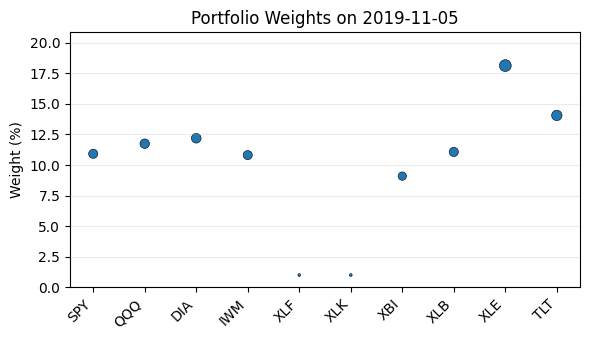


=== Rebalance on 2019-12-03 ===
Optimal portfolio
----------------------
 Investment in SPY : 8.17%
 Investment in QQQ : 5.56%
 Investment in DIA : 13.41%
 Investment in IWM : 10.26%
 Investment in XLF : 4.14%
 Investment in XLK : 20.37%
 Investment in XBI : 7.58%
 Investment in XLB : 1.0%
 Investment in XLE : 13.31%
 Investment in TLT : 16.21%
Cash: 0.0
----------------------
Exp ret = 2.174633617391592%
Expected risk = 0.0006884451277324715%


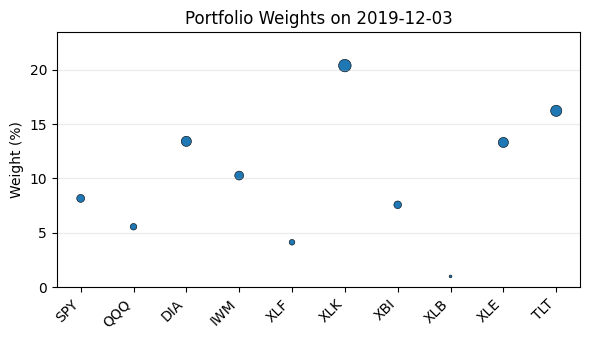


=== Rebalance on 2019-12-31 ===
Optimal portfolio
----------------------
 Investment in SPY : 4.22%
 Investment in QQQ : 11.11%
 Investment in DIA : 11.86%
 Investment in IWM : 8.01%
 Investment in XLF : 1.0%
 Investment in XLK : 31.08%
 Investment in XBI : 5.82%
 Investment in XLB : 1.0%
 Investment in XLE : 11.99%
 Investment in TLT : 13.91%
Cash: 0.0
----------------------
Exp ret = 5.013013851510011%
Expected risk = 0.0005532550704150033%


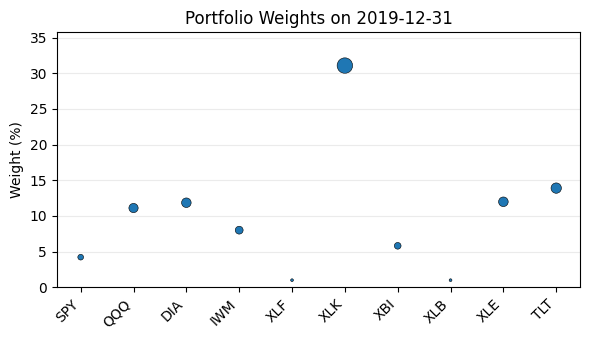


=== Rebalance on 2020-01-28 ===
Optimal portfolio
----------------------
 Investment in SPY : 7.8%
 Investment in QQQ : 7.49%
 Investment in DIA : 17.0%
 Investment in IWM : 11.19%
 Investment in XLF : 15.37%
 Investment in XLK : 15.37%
 Investment in XBI : 1.0%
 Investment in XLB : 1.0%
 Investment in XLE : 3.39%
 Investment in TLT : 20.4%
Cash: 0.0
----------------------
Exp ret = 2.587890060253686%
Expected risk = 0.0006160435913194037%


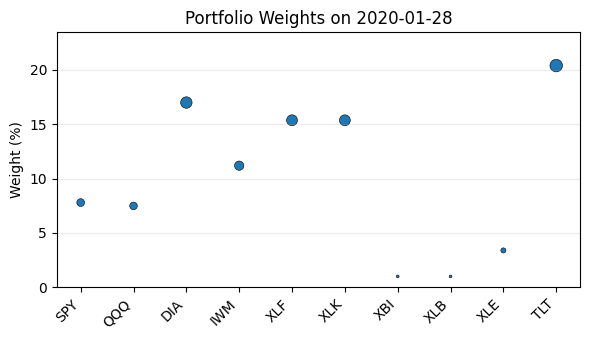


=== Rebalance on 2020-02-25 ===
Optimal portfolio
----------------------
 Investment in SPY : 5.89%
 Investment in QQQ : 5.77%
 Investment in DIA : 20.68%
 Investment in IWM : 11.17%
 Investment in XLF : 23.03%
 Investment in XLK : 4.6%
 Investment in XBI : 2.57%
 Investment in XLB : 1.0%
 Investment in XLE : 3.2%
 Investment in TLT : 22.08%
Cash: 0.0
----------------------
Exp ret = 2.2828523463021373%
Expected risk = 0.0010701807017754633%


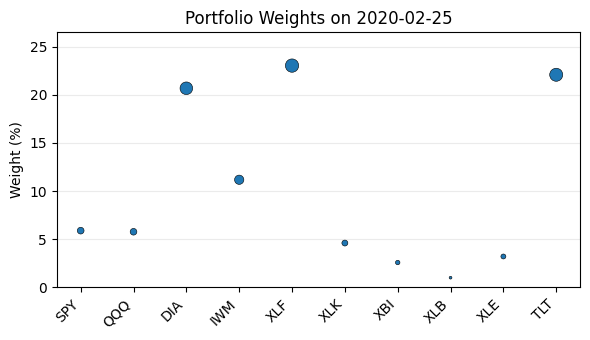


=== Rebalance on 2020-03-24 ===
Optimal portfolio
----------------------
 Investment in SPY : 1.0%
 Investment in QQQ : 1.0%
 Investment in DIA : 9.59%
 Investment in IWM : 1.0%
 Investment in XLF : 79.46%
 Investment in XLK : 1.0%
 Investment in XBI : 1.0%
 Investment in XLB : 1.0%
 Investment in XLE : 1.0%
 Investment in TLT : 3.95%
Cash: 0.0
----------------------
Exp ret = 3.6184447951182244%
Expected risk = 0.003978692849935185%


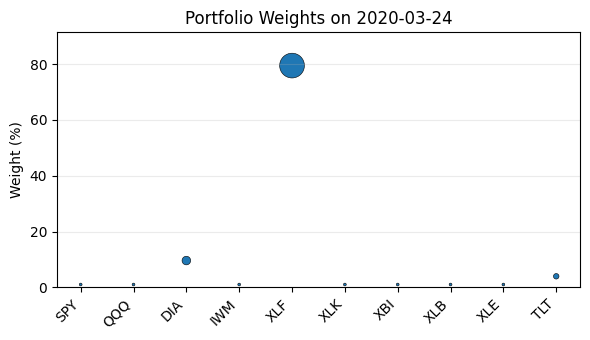


=== Rebalance on 2020-04-21 ===
Optimal portfolio
----------------------
 Investment in SPY : 1.0%
 Investment in QQQ : 1.0%
 Investment in DIA : 11.75%
 Investment in IWM : 1.0%
 Investment in XLF : 52.84%
 Investment in XLK : 24.99%
 Investment in XBI : 1.0%
 Investment in XLB : 1.0%
 Investment in XLE : 1.0%
 Investment in TLT : 4.43%
Cash: 0.0
----------------------
Exp ret = 3.621509004189293%
Expected risk = 0.00864410398163741%


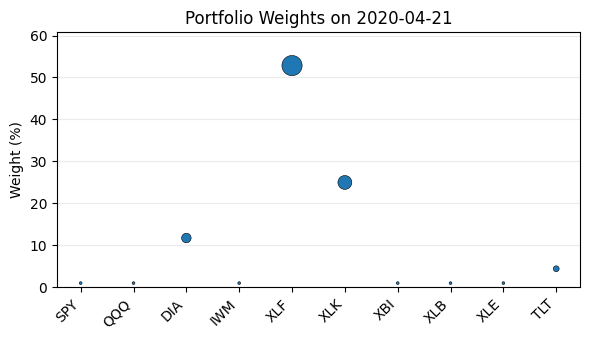


=== Rebalance on 2020-05-19 ===
Optimal portfolio
----------------------
 Investment in SPY : 1.0%
 Investment in QQQ : 1.0%
 Investment in DIA : 16.91%
 Investment in IWM : 1.0%
 Investment in XLF : 32.14%
 Investment in XLK : 28.24%
 Investment in XBI : 4.49%
 Investment in XLB : 1.0%
 Investment in XLE : 1.0%
 Investment in TLT : 13.22%
Cash: 0.0
----------------------
Exp ret = 3.617043891410723%
Expected risk = 0.015303758731923772%


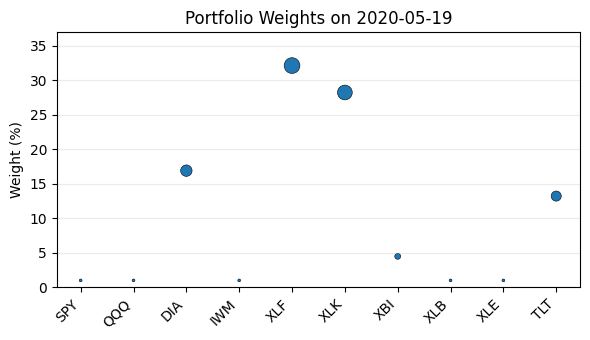


=== Rebalance on 2020-06-16 ===
Optimal portfolio
----------------------
 Investment in SPY : 1.0%
 Investment in QQQ : 8.14%
 Investment in DIA : 13.16%
 Investment in IWM : 1.0%
 Investment in XLF : 1.0%
 Investment in XLK : 26.11%
 Investment in XBI : 7.05%
 Investment in XLB : 31.41%
 Investment in XLE : 1.0%
 Investment in TLT : 10.13%
Cash: 0.0
----------------------
Exp ret = 10.738167340003937%
Expected risk = 0.007800369995037923%


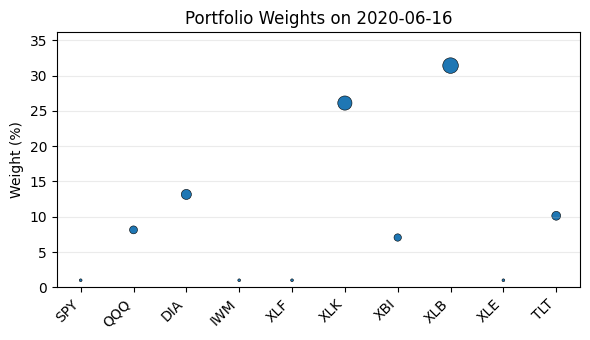


=== Rebalance on 2020-07-14 ===
Optimal portfolio
----------------------
 Investment in SPY : 5.39%
 Investment in QQQ : 7.39%
 Investment in DIA : 24.7%
 Investment in IWM : 7.81%
 Investment in XLF : 1.0%
 Investment in XLK : 15.0%
 Investment in XBI : 14.36%
 Investment in XLB : 1.0%
 Investment in XLE : 1.0%
 Investment in TLT : 22.35%
Cash: 0.0
----------------------
Exp ret = 5.53747320615328%
Expected risk = 0.0032763367475418534%


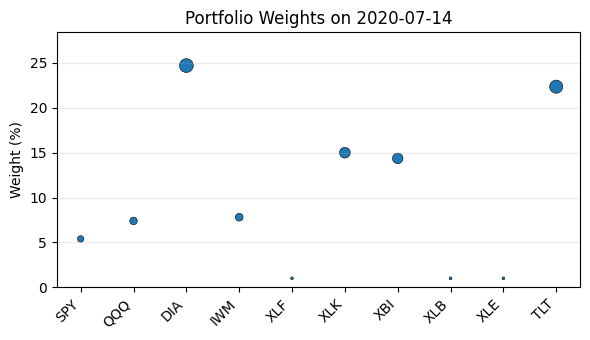


=== Rebalance on 2020-08-11 ===
Optimal portfolio
----------------------
 Investment in SPY : 9.36%
 Investment in QQQ : 14.71%
 Investment in DIA : 17.63%
 Investment in IWM : 9.9%
 Investment in XLF : 1.0%
 Investment in XLK : 1.46%
 Investment in XBI : 16.81%
 Investment in XLB : 1.0%
 Investment in XLE : 10.57%
 Investment in TLT : 17.54%
Cash: 0.0
----------------------
Exp ret = 5.980902587279403%
Expected risk = 0.004555269006179016%


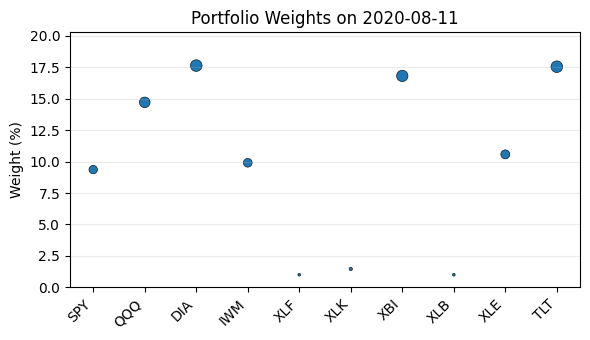


=== Rebalance on 2020-09-08 ===
Optimal portfolio
----------------------
 Investment in SPY : 9.71%
 Investment in QQQ : 7.16%
 Investment in DIA : 20.01%
 Investment in IWM : 12.69%
 Investment in XLF : 1.0%
 Investment in XLK : 1.0%
 Investment in XBI : 21.6%
 Investment in XLB : 1.0%
 Investment in XLE : 7.45%
 Investment in TLT : 18.38%
Cash: 0.0
----------------------
Exp ret = 4.369253688697637%
Expected risk = 0.0014997502484508489%


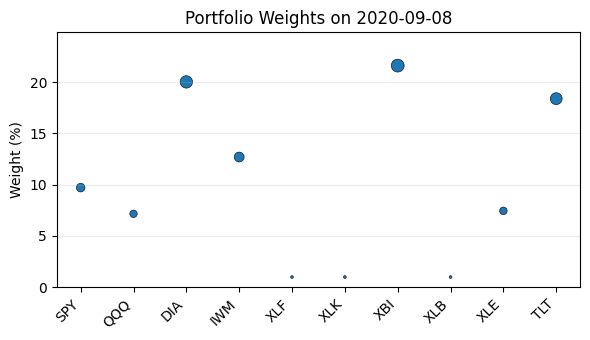


=== Rebalance on 2020-10-06 ===
Optimal portfolio
----------------------
 Investment in SPY : 13.53%
 Investment in QQQ : 17.01%
 Investment in DIA : 11.95%
 Investment in IWM : 11.93%
 Investment in XLF : 1.0%
 Investment in XLK : 1.0%
 Investment in XBI : 15.9%
 Investment in XLB : 1.0%
 Investment in XLE : 10.32%
 Investment in TLT : 16.36%
Cash: 0.0
----------------------
Exp ret = 2.2428659073228356%
Expected risk = 0.001364224224597804%


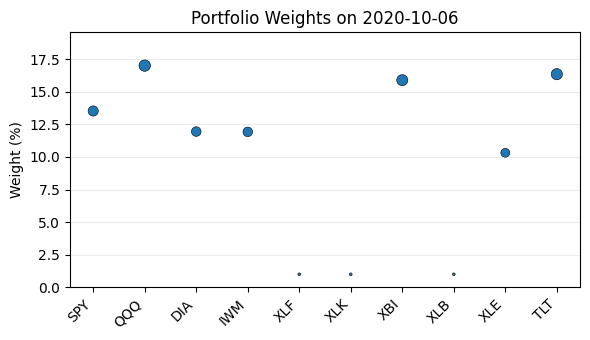


=== Rebalance on 2020-11-03 ===
Optimal portfolio
----------------------
 Investment in SPY : 7.54%
 Investment in QQQ : 11.29%
 Investment in DIA : 9.6%
 Investment in IWM : 9.51%
 Investment in XLF : 9.23%
 Investment in XLK : 11.98%
 Investment in XBI : 21.12%
 Investment in XLB : 1.0%
 Investment in XLE : 10.79%
 Investment in TLT : 7.94%
Cash: 0.0
----------------------
Exp ret = -0.13743275451121084%
Expected risk = 0.001506122618548426%


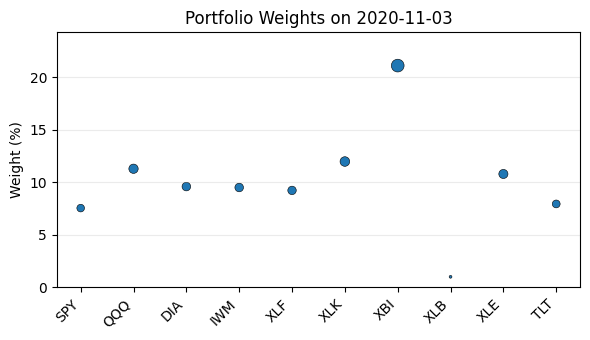


=== Rebalance on 2020-12-01 ===
Optimal portfolio
----------------------
 Investment in SPY : 2.31%
 Investment in QQQ : 22.86%
 Investment in DIA : 7.16%
 Investment in IWM : 4.45%
 Investment in XLF : 1.0%
 Investment in XLK : 24.82%
 Investment in XBI : 6.23%
 Investment in XLB : 15.47%
 Investment in XLE : 11.56%
 Investment in TLT : 4.15%
Cash: 0.0
----------------------
Exp ret = 5.324287575183767%
Expected risk = 0.004797614791789369%


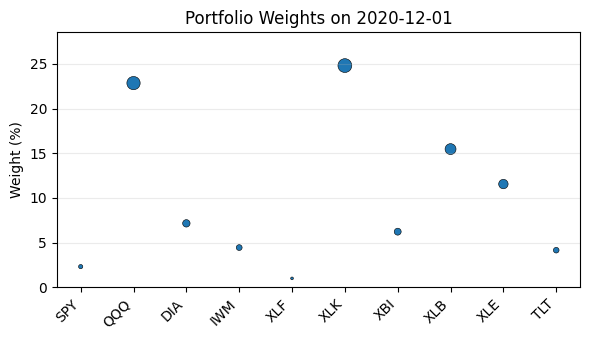


=== Performance 2019 ===
Average Monthly Return   : 0.70%
Monthly Sharpe Ratio     : 0.309
Annualized Sharpe Ratio  : 1.072
Maximum Drawdown         : 4.59%

=== Performance 2020 ===
Average Monthly Return   : -0.92%
Monthly Sharpe Ratio     : -0.125
Annualized Sharpe Ratio  : -0.435
Maximum Drawdown         : 21.73%


In [37]:
start_date = "2019-01-01"
end_date   = "2020-12-31"

# Run for L1, L2, or PBR
print("Testing L1 Regularization:")
rebalance_with_regularization(reg_type="L1", gamma=0.02, verbose=True, start_date=start_date, end_date=end_date);


Testing L2 Regularization:


[*********************100%***********************]  10 of 10 completed



=== Rebalance on 2019-03-26 ===
Optimal portfolio
----------------------
 Investment in SPY : 9.89%
 Investment in QQQ : 8.53%
 Investment in DIA : 13.79%
 Investment in IWM : 11.09%
 Investment in XLF : 4.99%
 Investment in XLK : 11.39%
 Investment in XBI : 6.88%
 Investment in XLB : 9.49%
 Investment in XLE : 5.31%
 Investment in TLT : 18.64%
Cash: 0.0
----------------------
Exp ret = 3.8233369968717352%
Expected risk = 0.001379890862431363%


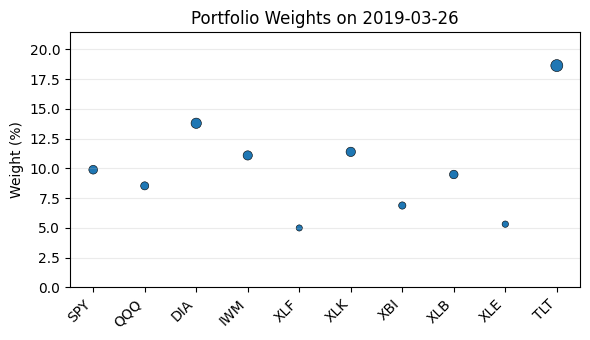


=== Rebalance on 2019-04-23 ===
Optimal portfolio
----------------------
 Investment in SPY : 9.12%
 Investment in QQQ : 6.56%
 Investment in DIA : 14.68%
 Investment in IWM : 10.81%
 Investment in XLF : 6.3%
 Investment in XLK : 3.8%
 Investment in XBI : 11.54%
 Investment in XLB : 9.93%
 Investment in XLE : 8.27%
 Investment in TLT : 18.99%
Cash: 0.0
----------------------
Exp ret = 2.9324570474750122%
Expected risk = 0.0007339059554887804%


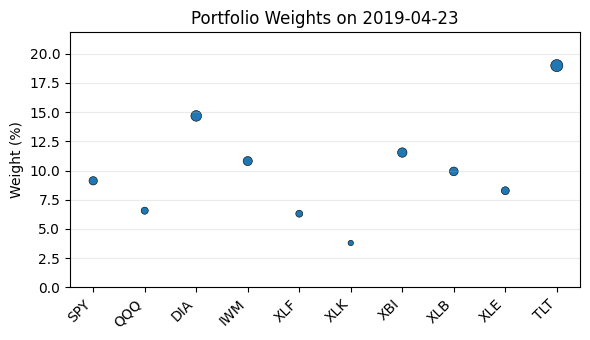


=== Rebalance on 2019-05-21 ===
Optimal portfolio
----------------------
 Investment in SPY : 9.5%
 Investment in QQQ : 6.71%
 Investment in DIA : 13.31%
 Investment in IWM : 12.03%
 Investment in XLF : 16.68%
 Investment in XLK : 1.0%
 Investment in XBI : 7.77%
 Investment in XLB : 6.49%
 Investment in XLE : 11.99%
 Investment in TLT : 14.52%
Cash: 0.0
----------------------
Exp ret = 0.7509698662971316%
Expected risk = 0.0010385654005319077%


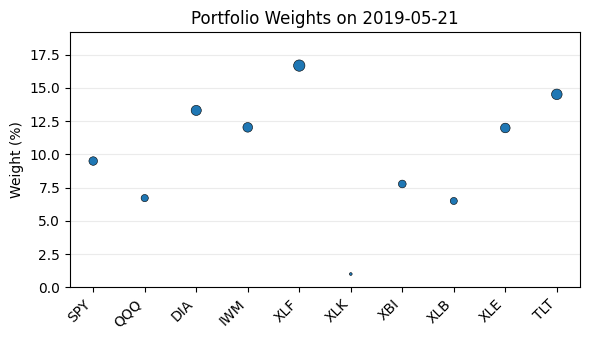


=== Rebalance on 2019-06-18 ===
Optimal portfolio
----------------------
 Investment in SPY : 9.99%
 Investment in QQQ : 8.23%
 Investment in DIA : 10.78%
 Investment in IWM : 11.21%
 Investment in XLF : 17.96%
 Investment in XLK : 4.37%
 Investment in XBI : 11.96%
 Investment in XLB : 1.54%
 Investment in XLE : 12.54%
 Investment in TLT : 11.41%
Cash: 0.0
----------------------
Exp ret = 0.7185195120726515%
Expected risk = 0.0015412810274764628%


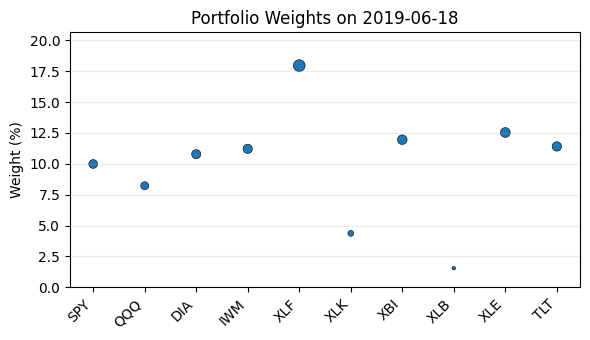


=== Rebalance on 2019-07-16 ===
Optimal portfolio
----------------------
 Investment in SPY : 11.62%
 Investment in QQQ : 5.88%
 Investment in DIA : 9.73%
 Investment in IWM : 10.84%
 Investment in XLF : 16.51%
 Investment in XLK : 7.62%
 Investment in XBI : 11.31%
 Investment in XLB : 5.47%
 Investment in XLE : 9.17%
 Investment in TLT : 11.84%
Cash: 0.0
----------------------
Exp ret = 1.121931983416741%
Expected risk = 0.0016890236491999512%


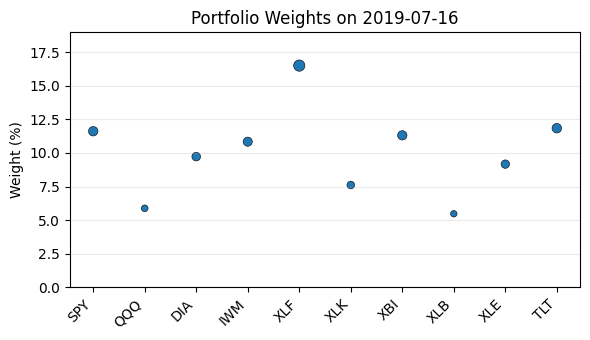


=== Rebalance on 2019-08-13 ===
Optimal portfolio
----------------------
 Investment in SPY : 8.78%
 Investment in QQQ : 6.0%
 Investment in DIA : 10.88%
 Investment in IWM : 9.53%
 Investment in XLF : 21.76%
 Investment in XLK : 6.8%
 Investment in XBI : 13.72%
 Investment in XLB : 2.43%
 Investment in XLE : 6.81%
 Investment in TLT : 13.3%
Cash: 0.0
----------------------
Exp ret = 1.9284572791478856%
Expected risk = 0.0015392764304726398%


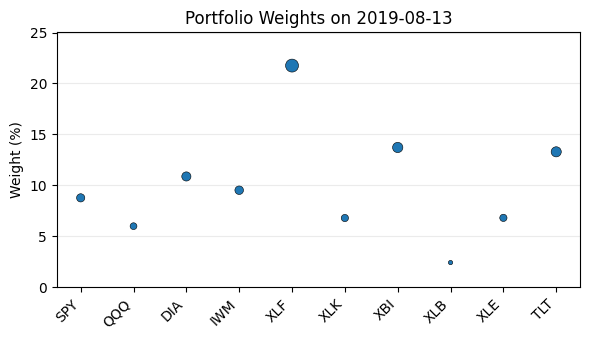


=== Rebalance on 2019-09-10 ===
Optimal portfolio
----------------------
 Investment in SPY : 10.22%
 Investment in QQQ : 8.81%
 Investment in DIA : 10.78%
 Investment in IWM : 11.03%
 Investment in XLF : 19.11%
 Investment in XLK : 2.18%
 Investment in XBI : 7.84%
 Investment in XLB : 5.22%
 Investment in XLE : 12.34%
 Investment in TLT : 12.45%
Cash: 0.0
----------------------
Exp ret = 1.0564329490014441%
Expected risk = 0.0011835220441948268%


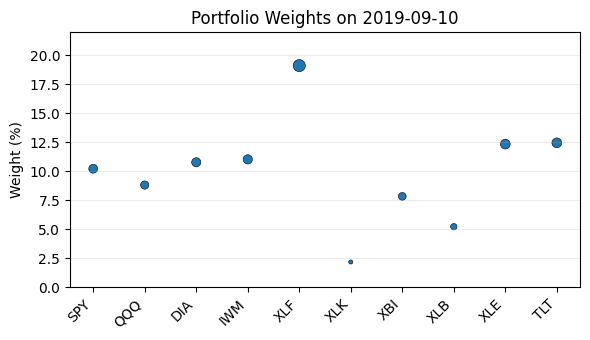


=== Rebalance on 2019-10-08 ===
Optimal portfolio
----------------------
 Investment in SPY : 10.37%
 Investment in QQQ : 9.59%
 Investment in DIA : 10.26%
 Investment in IWM : 11.21%
 Investment in XLF : 24.34%
 Investment in XLK : 1.0%
 Investment in XBI : 9.04%
 Investment in XLB : 2.81%
 Investment in XLE : 10.45%
 Investment in TLT : 10.94%
Cash: 0.0
----------------------
Exp ret = 0.337676880749393%
Expected risk = 0.0008622648897570633%


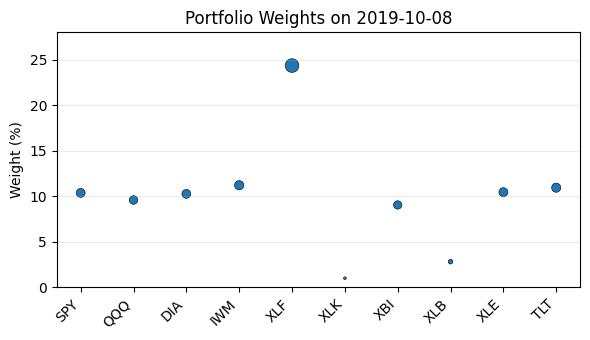


=== Rebalance on 2019-11-05 ===
Optimal portfolio
----------------------
 Investment in SPY : 10.82%
 Investment in QQQ : 11.26%
 Investment in DIA : 11.54%
 Investment in IWM : 10.75%
 Investment in XLF : 2.49%
 Investment in XLK : 4.92%
 Investment in XBI : 9.77%
 Investment in XLB : 10.9%
 Investment in XLE : 14.95%
 Investment in TLT : 12.61%
Cash: 0.0
----------------------
Exp ret = 2.2548081464183216%
Expected risk = 0.0010387281553573492%


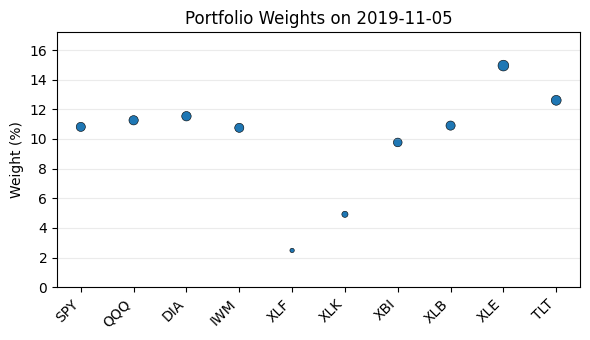


=== Rebalance on 2019-12-03 ===
Optimal portfolio
----------------------
 Investment in SPY : 9.35%
 Investment in QQQ : 7.88%
 Investment in DIA : 12.39%
 Investment in IWM : 10.56%
 Investment in XLF : 6.99%
 Investment in XLK : 16.51%
 Investment in XBI : 9.0%
 Investment in XLB : 1.0%
 Investment in XLE : 12.33%
 Investment in TLT : 14.0%
Cash: 0.0
----------------------
Exp ret = 1.9764335677680296%
Expected risk = 0.0005755410599523281%


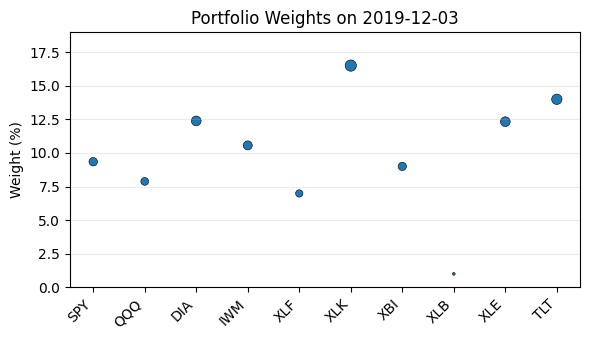


=== Rebalance on 2019-12-31 ===
Optimal portfolio
----------------------
 Investment in SPY : 7.07%
 Investment in QQQ : 11.18%
 Investment in DIA : 11.59%
 Investment in IWM : 9.32%
 Investment in XLF : 1.0%
 Investment in XLK : 23.1%
 Investment in XBI : 8.0%
 Investment in XLB : 4.27%
 Investment in XLE : 11.68%
 Investment in TLT : 12.79%
Cash: 0.0
----------------------
Exp ret = 4.526187113587428%
Expected risk = 0.00042807303450867007%


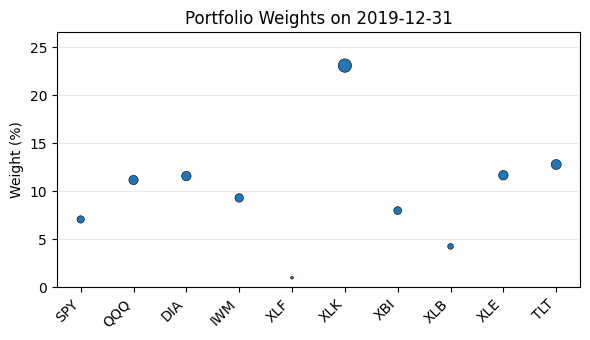


=== Rebalance on 2020-01-28 ===
Optimal portfolio
----------------------
 Investment in SPY : 9.35%
 Investment in QQQ : 9.16%
 Investment in DIA : 14.73%
 Investment in IWM : 11.33%
 Investment in XLF : 13.79%
 Investment in XLK : 13.77%
 Investment in XBI : 3.39%
 Investment in XLB : 1.0%
 Investment in XLE : 6.77%
 Investment in TLT : 16.71%
Cash: 0.0
----------------------
Exp ret = 2.3262659514496926%
Expected risk = 0.0006135947610067307%


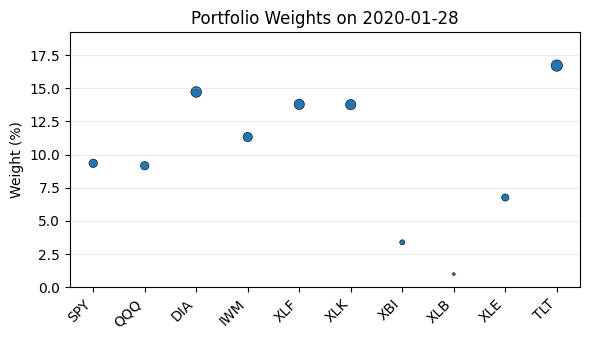


=== Rebalance on 2020-02-25 ===
Optimal portfolio
----------------------
 Investment in SPY : 7.98%
 Investment in QQQ : 7.9%
 Investment in DIA : 16.71%
 Investment in IWM : 11.1%
 Investment in XLF : 18.23%
 Investment in XLK : 7.15%
 Investment in XBI : 6.0%
 Investment in XLB : 1.0%
 Investment in XLE : 6.39%
 Investment in TLT : 17.54%
Cash: 0.0
----------------------
Exp ret = 1.8175442242980386%
Expected risk = 0.001202527324603782%


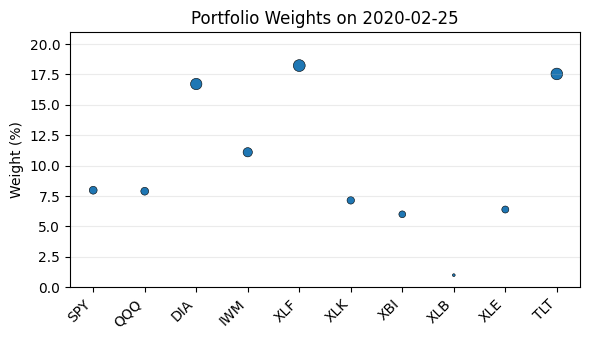


=== Rebalance on 2020-03-24 ===
Optimal portfolio
----------------------
 Investment in SPY : 1.0%
 Investment in QQQ : 1.0%
 Investment in DIA : 13.57%
 Investment in IWM : 1.0%
 Investment in XLF : 67.06%
 Investment in XLK : 4.02%
 Investment in XBI : 1.0%
 Investment in XLB : 1.0%
 Investment in XLE : 1.0%
 Investment in TLT : 9.35%
Cash: 0.0
----------------------
Exp ret = 1.642336612768014%
Expected risk = 0.0033103442770104465%


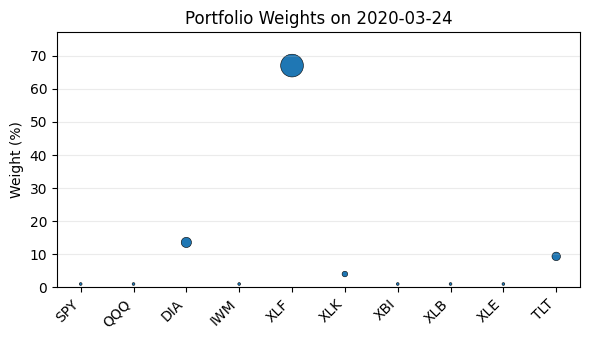


=== Rebalance on 2020-04-21 ===
Optimal portfolio
----------------------
 Investment in SPY : 1.0%
 Investment in QQQ : 1.0%
 Investment in DIA : 14.33%
 Investment in IWM : 4.0%
 Investment in XLF : 44.32%
 Investment in XLK : 23.21%
 Investment in XBI : 1.0%
 Investment in XLB : 1.0%
 Investment in XLE : 1.0%
 Investment in TLT : 9.14%
Cash: 0.0
----------------------
Exp ret = 2.8281369700832495%
Expected risk = 0.010045670116190689%


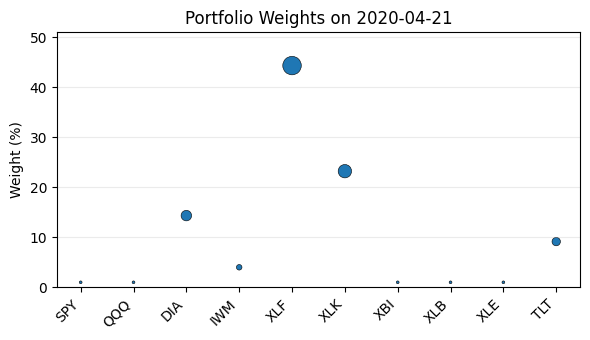


=== Rebalance on 2020-05-19 ===
Optimal portfolio
----------------------
 Investment in SPY : 1.39%
 Investment in QQQ : 1.0%
 Investment in DIA : 16.52%
 Investment in IWM : 6.04%
 Investment in XLF : 27.23%
 Investment in XLK : 23.88%
 Investment in XBI : 8.02%
 Investment in XLB : 1.0%
 Investment in XLE : 1.0%
 Investment in TLT : 13.93%
Cash: 0.0
----------------------
Exp ret = 3.2008481784707015%
Expected risk = 0.01650184373825329%


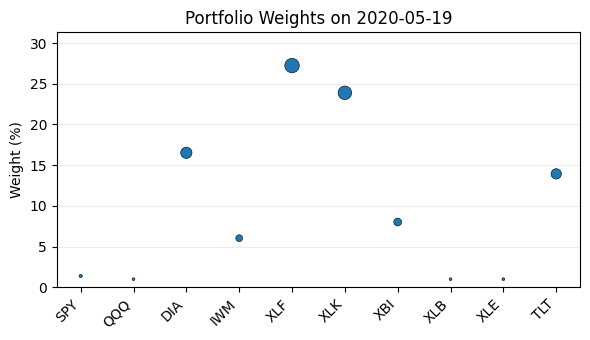


=== Rebalance on 2020-06-16 ===
Optimal portfolio
----------------------
 Investment in SPY : 3.49%
 Investment in QQQ : 10.01%
 Investment in DIA : 13.03%
 Investment in IWM : 5.09%
 Investment in XLF : 1.0%
 Investment in XLK : 21.11%
 Investment in XBI : 9.29%
 Investment in XLB : 24.79%
 Investment in XLE : 1.0%
 Investment in TLT : 11.19%
Cash: 0.0
----------------------
Exp ret = 10.025160854286847%
Expected risk = 0.006807921929665743%


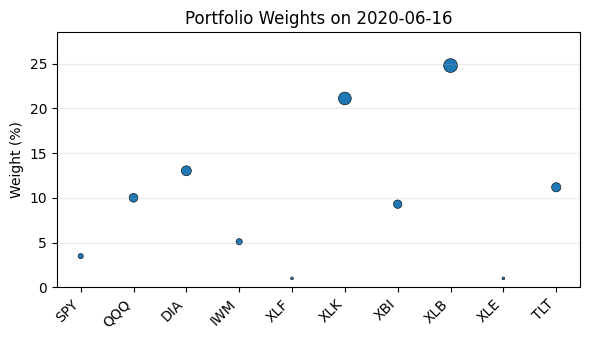


=== Rebalance on 2020-07-14 ===
Optimal portfolio
----------------------
 Investment in SPY : 7.96%
 Investment in QQQ : 9.15%
 Investment in DIA : 19.71%
 Investment in IWM : 9.48%
 Investment in XLF : 1.94%
 Investment in XLK : 14.04%
 Investment in XBI : 13.3%
 Investment in XLB : 1.11%
 Investment in XLE : 5.01%
 Investment in TLT : 18.29%
Cash: 0.0
----------------------
Exp ret = 5.142676149367642%
Expected risk = 0.0034946050434746423%


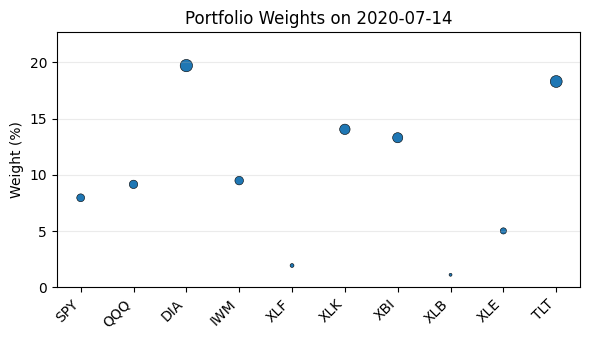


=== Rebalance on 2020-08-11 ===
Optimal portfolio
----------------------
 Investment in SPY : 10.4%
 Investment in QQQ : 13.54%
 Investment in DIA : 15.18%
 Investment in IWM : 10.7%
 Investment in XLF : 2.5%
 Investment in XLK : 5.62%
 Investment in XBI : 14.76%
 Investment in XLB : 1.0%
 Investment in XLE : 11.18%
 Investment in TLT : 15.13%
Cash: 0.0
----------------------
Exp ret = 5.726881552185667%
Expected risk = 0.004287533581440435%


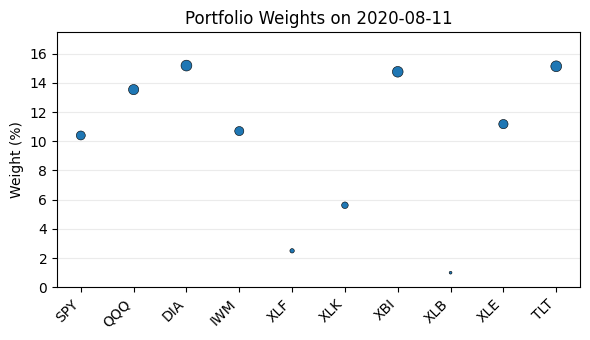


=== Rebalance on 2020-09-08 ===
Optimal portfolio
----------------------
 Investment in SPY : 11.06%
 Investment in QQQ : 9.52%
 Investment in DIA : 17.29%
 Investment in IWM : 12.87%
 Investment in XLF : 3.12%
 Investment in XLK : 1.0%
 Investment in XBI : 18.16%
 Investment in XLB : 1.0%
 Investment in XLE : 9.68%
 Investment in TLT : 16.3%
Cash: 0.0
----------------------
Exp ret = 4.102884632756778%
Expected risk = 0.0013533014280021991%


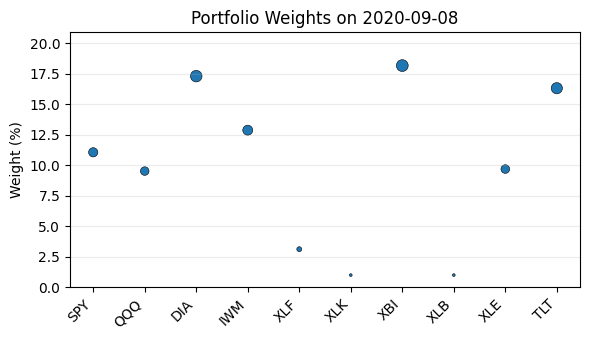


=== Rebalance on 2020-10-06 ===
Optimal portfolio
----------------------
 Investment in SPY : 13.01%
 Investment in QQQ : 15.05%
 Investment in DIA : 12.09%
 Investment in IWM : 12.07%
 Investment in XLF : 2.88%
 Investment in XLK : 3.71%
 Investment in XBI : 14.39%
 Investment in XLB : 1.0%
 Investment in XLE : 11.13%
 Investment in TLT : 14.67%
Cash: 0.0
----------------------
Exp ret = 2.04486410754272%
Expected risk = 0.0012517811844467354%


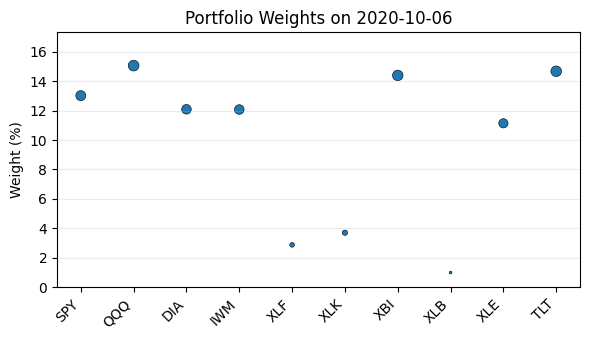


=== Rebalance on 2020-11-03 ===
Optimal portfolio
----------------------
 Investment in SPY : 9.01%
 Investment in QQQ : 11.18%
 Investment in DIA : 10.15%
 Investment in IWM : 10.13%
 Investment in XLF : 10.0%
 Investment in XLK : 11.58%
 Investment in XBI : 16.85%
 Investment in XLB : 1.0%
 Investment in XLE : 10.89%
 Investment in TLT : 9.2%
Cash: 0.0
----------------------
Exp ret = -0.24504675488663483%
Expected risk = 0.0015471192595539606%


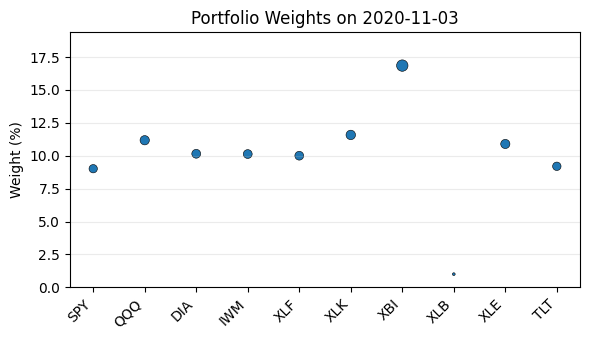


=== Rebalance on 2020-12-01 ===
Optimal portfolio
----------------------
 Investment in SPY : 5.87%
 Investment in QQQ : 18.01%
 Investment in DIA : 8.69%
 Investment in IWM : 7.11%
 Investment in XLF : 1.0%
 Investment in XLK : 19.18%
 Investment in XBI : 8.17%
 Investment in XLB : 13.74%
 Investment in XLE : 11.32%
 Investment in TLT : 6.91%
Cash: 0.0
----------------------
Exp ret = 4.861576372791148%
Expected risk = 0.004695876355049161%


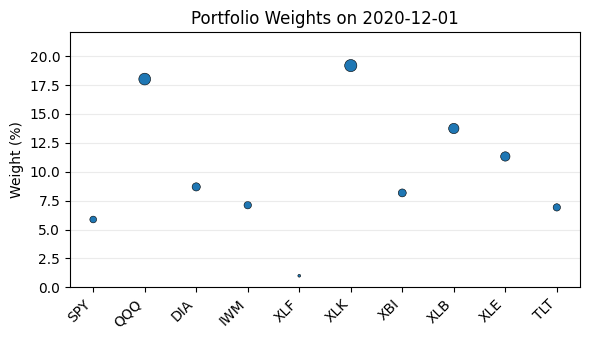


=== Performance 2019 ===
Average Monthly Return   : 0.62%
Monthly Sharpe Ratio     : 0.266
Annualized Sharpe Ratio  : 0.923
Maximum Drawdown         : 4.30%

=== Performance 2020 ===
Average Monthly Return   : -0.79%
Monthly Sharpe Ratio     : -0.104
Annualized Sharpe Ratio  : -0.361
Maximum Drawdown         : 22.64%


In [38]:
print("\nTesting L2 Regularization:")
rebalance_with_regularization(reg_type="L2", gamma=0.05, verbose=True, start_date=start_date, end_date=end_date);

[*******************   40%                       ]  4 of 10 completed


Testing PBR Regularization:


[*********************100%***********************]  10 of 10 completed



=== Rebalance on 2019-03-26 ===
Optimal portfolio
----------------------
 Investment in SPY : 9.96%
 Investment in QQQ : 9.38%
 Investment in DIA : 11.62%
 Investment in IWM : 10.47%
 Investment in XLF : 7.85%
 Investment in XLK : 10.6%
 Investment in XBI : 8.67%
 Investment in XLB : 9.8%
 Investment in XLE : 8.0%
 Investment in TLT : 13.64%
Cash: 0.0
----------------------
Exp ret = 3.512087396312903%
Expected risk = 0.0012991991513880902%


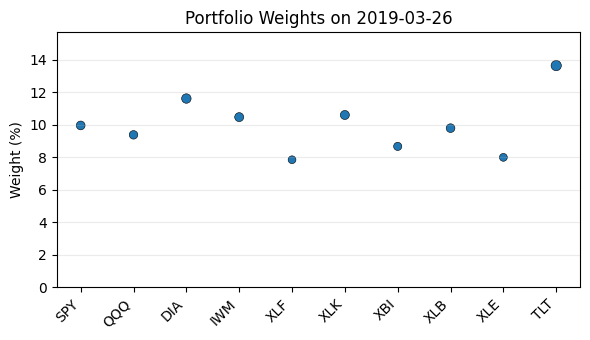


=== Rebalance on 2019-04-23 ===
Optimal portfolio
----------------------
 Investment in SPY : 9.64%
 Investment in QQQ : 8.54%
 Investment in DIA : 12.0%
 Investment in IWM : 10.36%
 Investment in XLF : 8.44%
 Investment in XLK : 7.31%
 Investment in XBI : 10.66%
 Investment in XLB : 9.98%
 Investment in XLE : 9.27%
 Investment in TLT : 13.8%
Cash: 0.0
----------------------
Exp ret = 2.59344854789751%
Expected risk = 0.0007916042373359254%


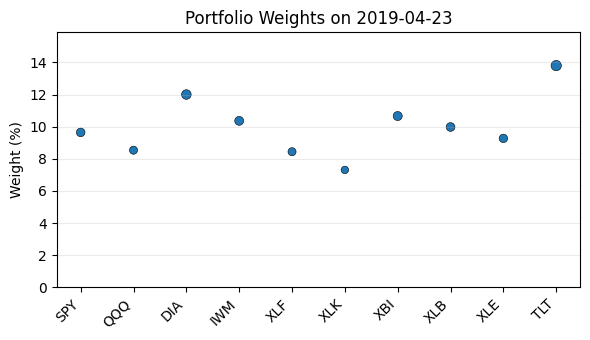


=== Rebalance on 2019-05-21 ===
Optimal portfolio
----------------------
 Investment in SPY : 9.94%
 Investment in QQQ : 8.72%
 Investment in DIA : 11.58%
 Investment in IWM : 11.04%
 Investment in XLF : 13.04%
 Investment in XLK : 4.78%
 Investment in XBI : 9.19%
 Investment in XLB : 8.63%
 Investment in XLE : 10.99%
 Investment in TLT : 12.09%
Cash: 0.0
----------------------
Exp ret = 0.3911810291450991%
Expected risk = 0.0011850505142614095%


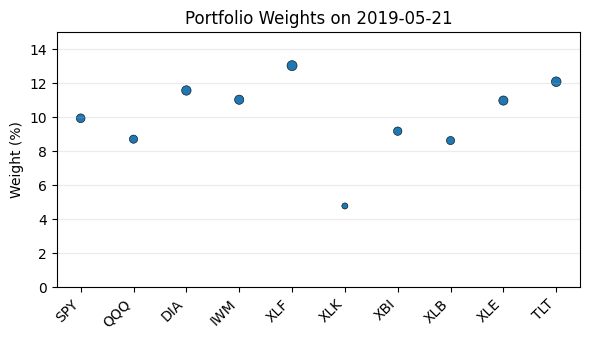


=== Rebalance on 2019-06-18 ===
Optimal portfolio
----------------------
 Investment in SPY : 10.01%
 Investment in QQQ : 9.25%
 Investment in DIA : 10.33%
 Investment in IWM : 10.54%
 Investment in XLF : 13.47%
 Investment in XLK : 7.53%
 Investment in XBI : 10.86%
 Investment in XLB : 6.31%
 Investment in XLE : 11.12%
 Investment in TLT : 10.59%
Cash: 0.0
----------------------
Exp ret = 0.3765090288035171%
Expected risk = 0.0017129683846170817%


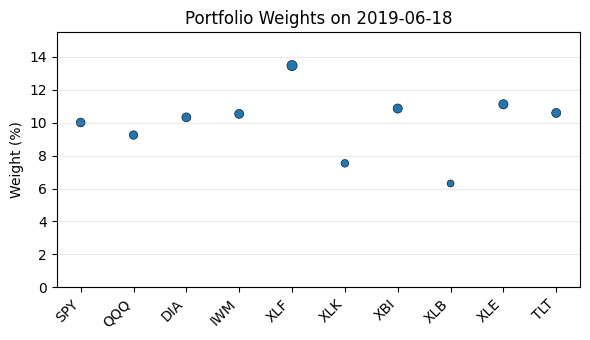


=== Rebalance on 2019-07-16 ===
Optimal portfolio
----------------------
 Investment in SPY : 10.72%
 Investment in QQQ : 8.2%
 Investment in DIA : 9.87%
 Investment in IWM : 10.38%
 Investment in XLF : 12.87%
 Investment in XLK : 8.95%
 Investment in XBI : 10.58%
 Investment in XLB : 8.01%
 Investment in XLE : 9.64%
 Investment in TLT : 10.78%
Cash: 0.0
----------------------
Exp ret = 0.9524628631473379%
Expected risk = 0.0018635248952497503%


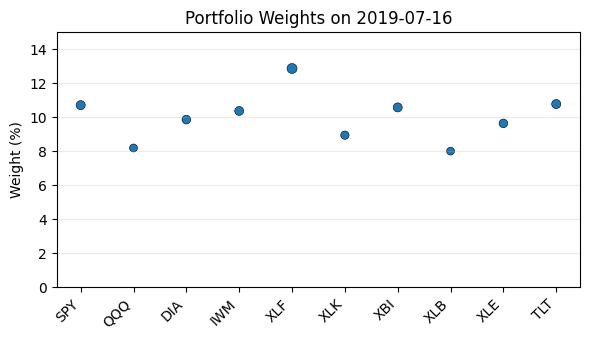


=== Rebalance on 2019-08-13 ===
Optimal portfolio
----------------------
 Investment in SPY : 9.49%
 Investment in QQQ : 8.31%
 Investment in DIA : 10.35%
 Investment in IWM : 9.81%
 Investment in XLF : 15.03%
 Investment in XLK : 8.65%
 Investment in XBI : 11.6%
 Investment in XLB : 6.77%
 Investment in XLE : 8.65%
 Investment in TLT : 11.35%
Cash: 0.0
----------------------
Exp ret = 1.457446945554039%
Expected risk = 0.0019309751710117405%


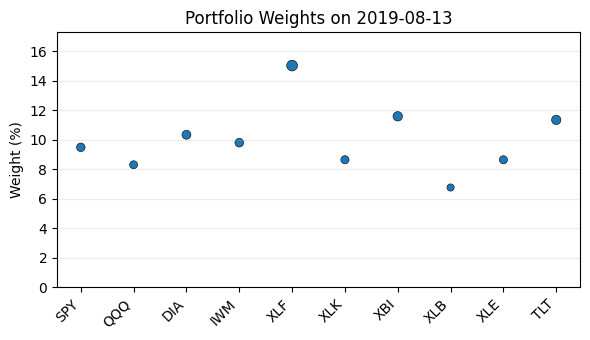


=== Rebalance on 2019-09-10 ===
Optimal portfolio
----------------------
 Investment in SPY : 10.11%
 Investment in QQQ : 9.5%
 Investment in DIA : 10.34%
 Investment in IWM : 10.46%
 Investment in XLF : 13.94%
 Investment in XLK : 6.6%
 Investment in XBI : 9.08%
 Investment in XLB : 7.92%
 Investment in XLE : 11.0%
 Investment in TLT : 11.06%
Cash: 0.0
----------------------
Exp ret = 0.7146095544476095%
Expected risk = 0.001420944906114889%


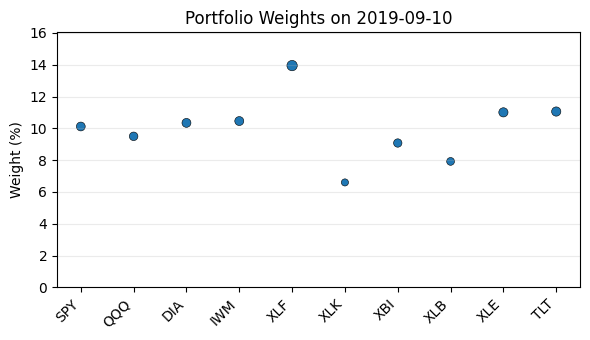


=== Rebalance on 2019-10-08 ===
Optimal portfolio
----------------------
 Investment in SPY : 10.19%
 Investment in QQQ : 9.81%
 Investment in DIA : 10.13%
 Investment in IWM : 10.55%
 Investment in XLF : 16.16%
 Investment in XLK : 6.06%
 Investment in XBI : 9.62%
 Investment in XLB : 6.87%
 Investment in XLE : 10.19%
 Investment in TLT : 10.42%
Cash: 0.0
----------------------
Exp ret = -0.28714995434130813%
Expected risk = 0.0012366856204817766%


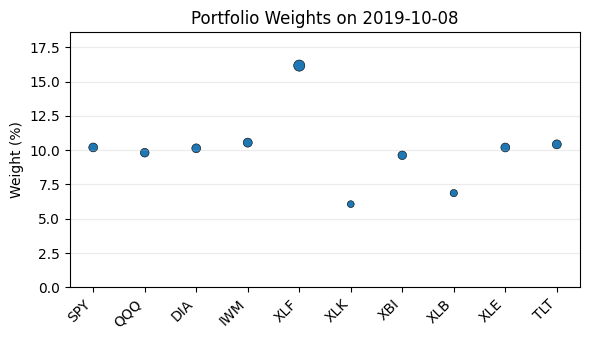


=== Rebalance on 2019-11-05 ===
Optimal portfolio
----------------------
 Investment in SPY : 10.36%
 Investment in QQQ : 10.56%
 Investment in DIA : 10.67%
 Investment in IWM : 10.34%
 Investment in XLF : 6.69%
 Investment in XLK : 7.78%
 Investment in XBI : 9.91%
 Investment in XLB : 10.41%
 Investment in XLE : 12.14%
 Investment in TLT : 11.13%
Cash: 0.0
----------------------
Exp ret = 2.006962416364543%
Expected risk = 0.0009170048519483741%


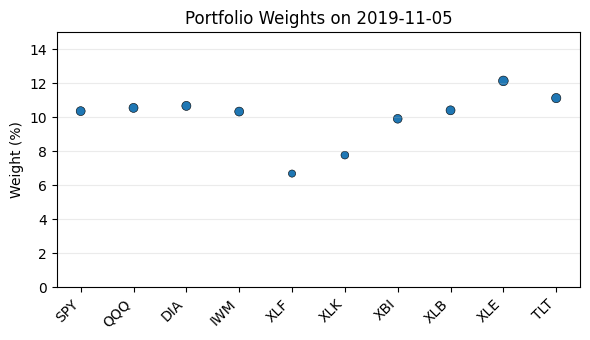


=== Rebalance on 2019-12-03 ===
Optimal portfolio
----------------------
 Investment in SPY : 9.78%
 Investment in QQQ : 9.16%
 Investment in DIA : 11.09%
 Investment in IWM : 10.31%
 Investment in XLF : 8.75%
 Investment in XLK : 12.85%
 Investment in XBI : 9.62%
 Investment in XLB : 5.61%
 Investment in XLE : 11.06%
 Investment in TLT : 11.77%
Cash: 0.0
----------------------
Exp ret = 1.642714576186153%
Expected risk = 0.0005348635225057439%


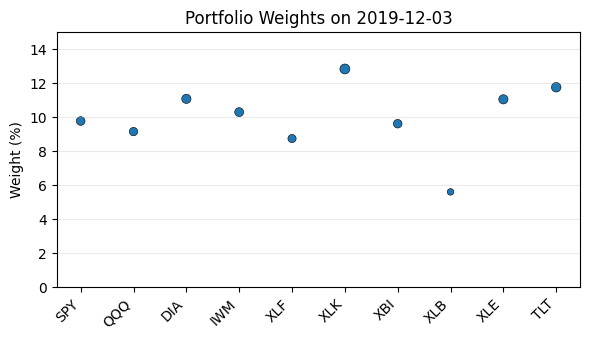


=== Rebalance on 2019-12-31 ===
Optimal portfolio
----------------------
 Investment in SPY : 8.97%
 Investment in QQQ : 10.68%
 Investment in DIA : 10.84%
 Investment in IWM : 9.9%
 Investment in XLF : 4.73%
 Investment in XLK : 15.54%
 Investment in XBI : 9.34%
 Investment in XLB : 7.8%
 Investment in XLE : 10.88%
 Investment in TLT : 11.32%
Cash: 0.0
----------------------
Exp ret = 3.894225007372797%
Expected risk = 0.0003372510364741556%


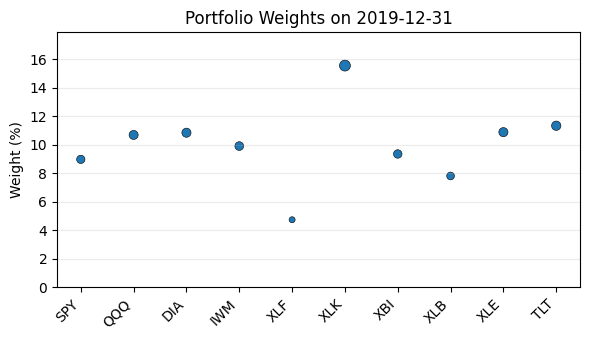


=== Rebalance on 2020-01-28 ===
Optimal portfolio
----------------------
 Investment in SPY : 9.77%
 Investment in QQQ : 9.69%
 Investment in DIA : 12.04%
 Investment in IWM : 10.61%
 Investment in XLF : 11.66%
 Investment in XLK : 11.61%
 Investment in XBI : 7.22%
 Investment in XLB : 5.85%
 Investment in XLE : 8.67%
 Investment in TLT : 12.87%
Cash: 0.0
----------------------
Exp ret = 1.8689060194644933%
Expected risk = 0.00066710273407237%


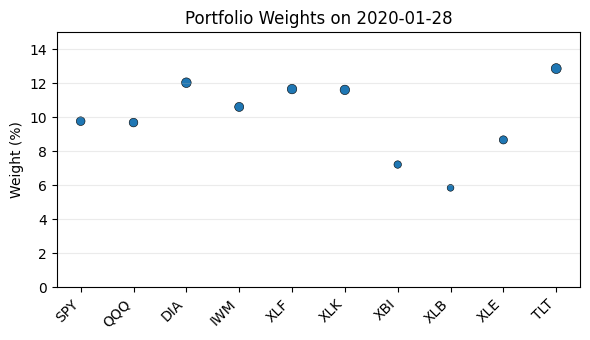


=== Rebalance on 2020-02-25 ===
Optimal portfolio
----------------------
 Investment in SPY : 9.34%
 Investment in QQQ : 9.3%
 Investment in DIA : 13.0%
 Investment in IWM : 10.66%
 Investment in XLF : 13.67%
 Investment in XLK : 8.94%
 Investment in XBI : 8.5%
 Investment in XLB : 4.57%
 Investment in XLE : 8.67%
 Investment in TLT : 13.34%
Cash: 0.0
----------------------
Exp ret = 1.2578407307991142%
Expected risk = 0.00137827380297427%


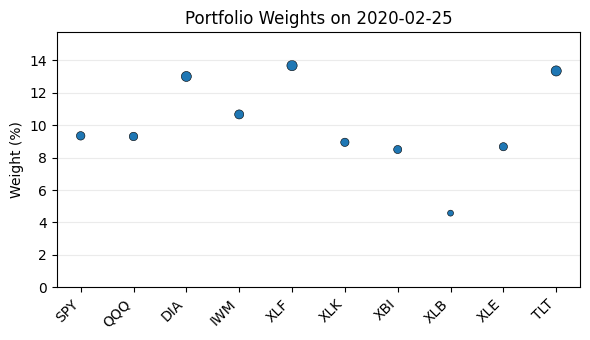


=== Rebalance on 2020-03-24 ===
Optimal portfolio
----------------------
 Investment in SPY : 6.15%
 Investment in QQQ : 2.87%
 Investment in DIA : 14.81%
 Investment in IWM : 8.75%
 Investment in XLF : 35.12%
 Investment in XLK : 11.14%
 Investment in XBI : 5.83%
 Investment in XLB : 1.0%
 Investment in XLE : 1.2%
 Investment in TLT : 13.14%
Cash: 0.0
----------------------
Exp ret = -4.467504685396408%
Expected risk = 0.004987450260931653%


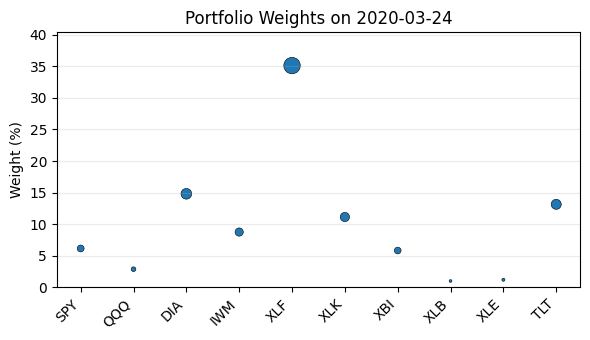


=== Rebalance on 2020-04-21 ===
Optimal portfolio
----------------------
 Investment in SPY : 7.47%
 Investment in QQQ : 2.41%
 Investment in DIA : 13.99%
 Investment in IWM : 9.55%
 Investment in XLF : 26.58%
 Investment in XLK : 17.51%
 Investment in XBI : 7.78%
 Investment in XLB : 1.0%
 Investment in XLE : 2.06%
 Investment in TLT : 11.66%
Cash: 0.0
----------------------
Exp ret = 0.48532412441655787%
Expected risk = 0.015178508316292296%


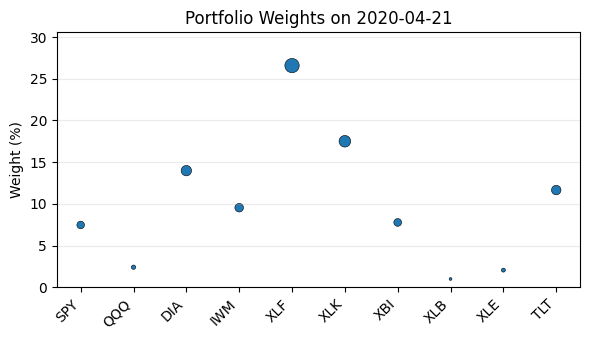


=== Rebalance on 2020-05-19 ===
Optimal portfolio
----------------------
 Investment in SPY : 7.42%
 Investment in QQQ : 5.35%
 Investment in DIA : 13.99%
 Investment in IWM : 9.37%
 Investment in XLF : 18.8%
 Investment in XLK : 17.27%
 Investment in XBI : 9.99%
 Investment in XLB : 4.08%
 Investment in XLE : 1.05%
 Investment in TLT : 12.68%
Cash: 0.0
----------------------
Exp ret = 2.1924602960762494%
Expected risk = 0.020881852547254224%


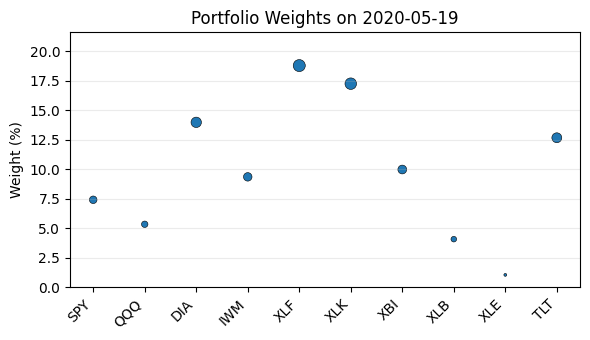


=== Rebalance on 2020-06-16 ===
Optimal portfolio
----------------------
 Investment in SPY : 8.01%
 Investment in QQQ : 10.58%
 Investment in DIA : 11.67%
 Investment in IWM : 8.62%
 Investment in XLF : 1.96%
 Investment in XLK : 14.84%
 Investment in XBI : 10.25%
 Investment in XLB : 16.49%
 Investment in XLE : 6.62%
 Investment in TLT : 10.97%
Cash: 0.0
----------------------
Exp ret = 8.88913365480266%
Expected risk = 0.005998839718775024%


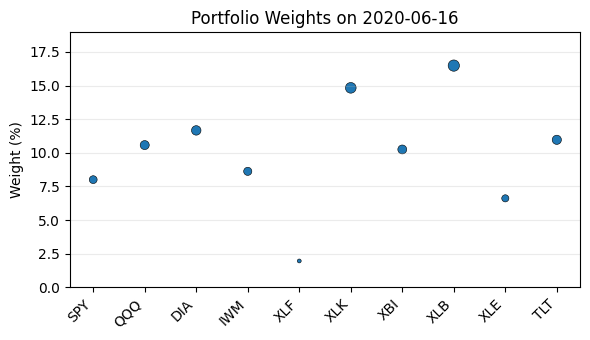


=== Rebalance on 2020-07-14 ===
Optimal portfolio
----------------------
 Investment in SPY : 9.16%
 Investment in QQQ : 9.65%
 Investment in DIA : 14.05%
 Investment in IWM : 9.84%
 Investment in XLF : 6.74%
 Investment in XLK : 11.82%
 Investment in XBI : 11.35%
 Investment in XLB : 6.1%
 Investment in XLE : 7.83%
 Investment in TLT : 13.46%
Cash: 0.0
----------------------
Exp ret = 4.449904043086164%
Expected risk = 0.003713944615335134%


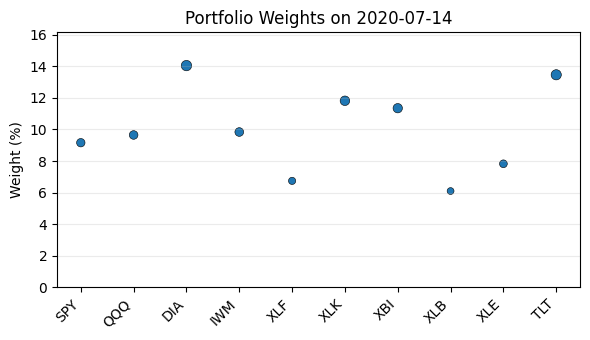


=== Rebalance on 2020-08-11 ===
Optimal portfolio
----------------------
 Investment in SPY : 10.35%
 Investment in QQQ : 11.65%
 Investment in DIA : 12.31%
 Investment in IWM : 10.48%
 Investment in XLF : 6.93%
 Investment in XLK : 8.3%
 Investment in XBI : 12.14%
 Investment in XLB : 4.87%
 Investment in XLE : 10.67%
 Investment in TLT : 12.29%
Cash: 0.0
----------------------
Exp ret = 5.214480142379201%
Expected risk = 0.004054140891663634%


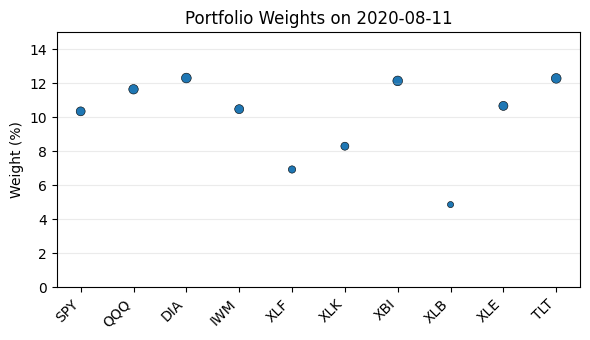


=== Rebalance on 2020-09-08 ===
Optimal portfolio
----------------------
 Investment in SPY : 11.13%
 Investment in QQQ : 10.48%
 Investment in DIA : 13.7%
 Investment in IWM : 11.89%
 Investment in XLF : 7.81%
 Investment in XLK : 4.51%
 Investment in XBI : 13.99%
 Investment in XLB : 2.65%
 Investment in XLE : 10.56%
 Investment in TLT : 13.29%
Cash: 0.0
----------------------
Exp ret = 3.420496056984172%
Expected risk = 0.0011784117696880194%


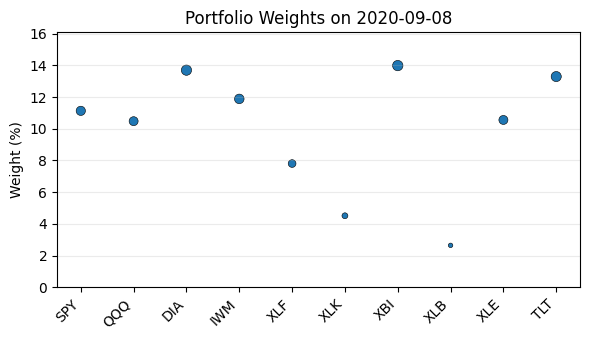


=== Rebalance on 2020-10-06 ===
Optimal portfolio
----------------------
 Investment in SPY : 11.75%
 Investment in QQQ : 12.6%
 Investment in DIA : 11.37%
 Investment in IWM : 11.36%
 Investment in XLF : 7.39%
 Investment in XLK : 7.72%
 Investment in XBI : 12.31%
 Investment in XLB : 2.08%
 Investment in XLE : 10.96%
 Investment in TLT : 12.45%
Cash: 0.0
----------------------
Exp ret = 1.622611246860127%
Expected risk = 0.0010362083701478267%


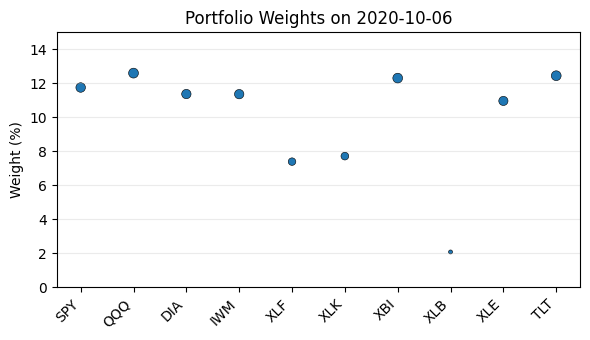


=== Rebalance on 2020-11-03 ===
Optimal portfolio
----------------------
 Investment in SPY : 10.09%
 Investment in QQQ : 11.03%
 Investment in DIA : 10.55%
 Investment in IWM : 10.57%
 Investment in XLF : 10.53%
 Investment in XLK : 11.2%
 Investment in XBI : 13.52%
 Investment in XLB : 1.47%
 Investment in XLE : 10.92%
 Investment in TLT : 10.13%
Cash: 0.0
----------------------
Exp ret = -0.3633043988364372%
Expected risk = 0.001575296028421197%


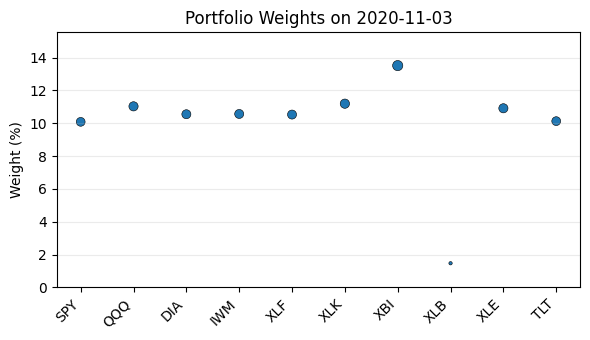


=== Rebalance on 2020-12-01 ===
Optimal portfolio
----------------------
 Investment in SPY : 8.39%
 Investment in QQQ : 13.43%
 Investment in DIA : 9.56%
 Investment in IWM : 8.9%
 Investment in XLF : 5.36%
 Investment in XLK : 13.9%
 Investment in XBI : 9.34%
 Investment in XLB : 11.65%
 Investment in XLE : 10.66%
 Investment in TLT : 8.81%
Cash: 0.0
----------------------
Exp ret = 4.243194037341824%
Expected risk = 0.004215653630476784%


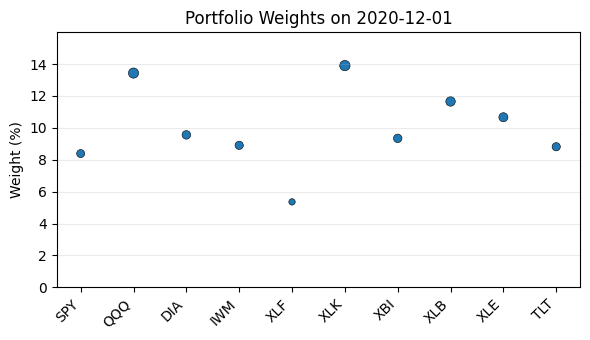


=== Performance 2019 ===
Average Monthly Return   : 0.54%
Monthly Sharpe Ratio     : 0.225
Annualized Sharpe Ratio  : 0.778
Maximum Drawdown         : 4.05%

=== Performance 2020 ===
Average Monthly Return   : -0.55%
Monthly Sharpe Ratio     : -0.069
Annualized Sharpe Ratio  : -0.240
Maximum Drawdown         : 23.78%


In [39]:
print("\nTesting PBR Regularization:")
rebalance_with_regularization(reg_type="PBR", gamma=0.03, epsilon=0.45, verbose=True, start_date=start_date, end_date=end_date);


Testing CVaR PBR Regularization:


[*********************100%***********************]  10 of 10 completed



=== Rebalance on 2019-03-26 ===
Optimal portfolio
----------------------
 Investment in SPY : 9.96%
 Investment in QQQ : 9.45%
 Investment in DIA : 11.59%
 Investment in IWM : 10.45%
 Investment in XLF : 7.42%
 Investment in XLK : 10.86%
 Investment in XBI : 8.63%
 Investment in XLB : 9.92%
 Investment in XLE : 8.11%
 Investment in TLT : 13.62%
Cash: 0.0
----------------------
Exp ret = 3.5199211466328957%
Expected risk = 0.0013231673174335088%


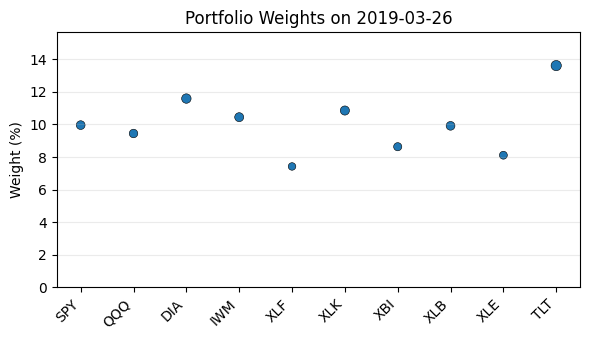


=== Rebalance on 2019-04-23 ===
Optimal portfolio
----------------------
 Investment in SPY : 9.63%
 Investment in QQQ : 8.61%
 Investment in DIA : 11.92%
 Investment in IWM : 10.32%
 Investment in XLF : 8.16%
 Investment in XLK : 7.5%
 Investment in XBI : 10.72%
 Investment in XLB : 10.02%
 Investment in XLE : 9.39%
 Investment in TLT : 13.74%
Cash: 0.0
----------------------
Exp ret = 2.5897697508834283%
Expected risk = 0.0008040452885538204%


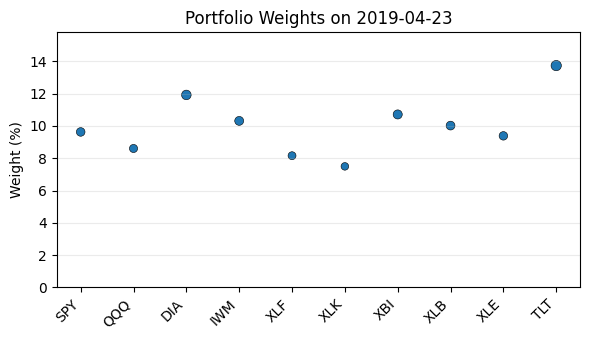


=== Rebalance on 2019-05-21 ===
Optimal portfolio
----------------------
 Investment in SPY : 9.92%
 Investment in QQQ : 8.81%
 Investment in DIA : 11.63%
 Investment in IWM : 11.01%
 Investment in XLF : 12.61%
 Investment in XLK : 5.03%
 Investment in XBI : 9.17%
 Investment in XLB : 8.54%
 Investment in XLE : 11.11%
 Investment in TLT : 12.18%
Cash: 0.0
----------------------
Exp ret = 0.37617870566388634%
Expected risk = 0.0012088503783989854%


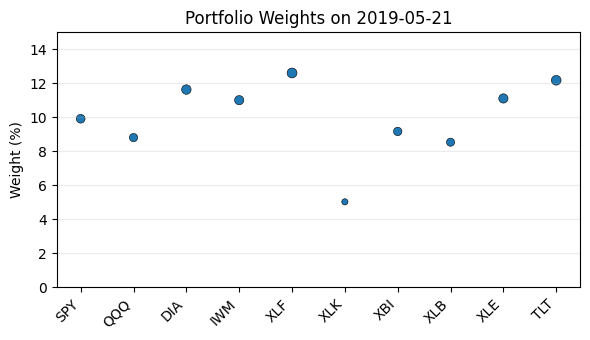


=== Rebalance on 2019-06-18 ===
Optimal portfolio
----------------------
 Investment in SPY : 10.03%
 Investment in QQQ : 9.29%
 Investment in DIA : 10.59%
 Investment in IWM : 10.58%
 Investment in XLF : 12.83%
 Investment in XLK : 7.65%
 Investment in XBI : 10.83%
 Investment in XLB : 6.17%
 Investment in XLE : 11.13%
 Investment in TLT : 10.9%
Cash: 0.0
----------------------
Exp ret = 0.3671847385764719%
Expected risk = 0.0017630145019910293%


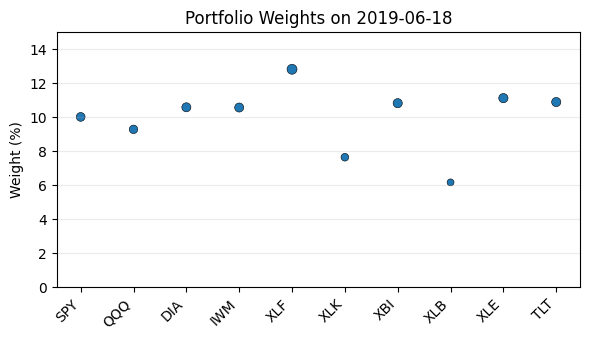


=== Rebalance on 2019-07-16 ===
Optimal portfolio
----------------------
 Investment in SPY : 10.74%
 Investment in QQQ : 8.23%
 Investment in DIA : 10.13%
 Investment in IWM : 10.41%
 Investment in XLF : 12.18%
 Investment in XLK : 9.05%
 Investment in XBI : 10.55%
 Investment in XLB : 7.94%
 Investment in XLE : 9.66%
 Investment in TLT : 11.12%
Cash: 0.0
----------------------
Exp ret = 0.9436999528538926%
Expected risk = 0.001919665925480892%


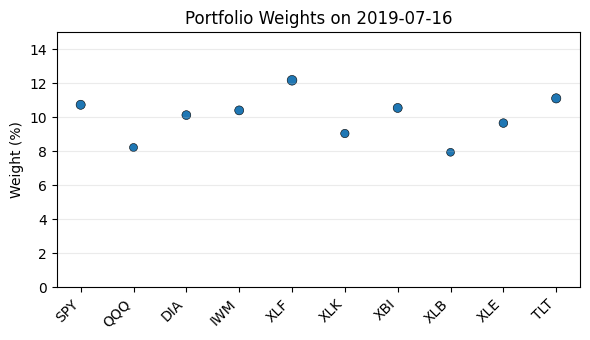


=== Rebalance on 2019-08-13 ===
Optimal portfolio
----------------------
 Investment in SPY : 9.55%
 Investment in QQQ : 8.31%
 Investment in DIA : 10.64%
 Investment in IWM : 9.9%
 Investment in XLF : 14.16%
 Investment in XLK : 8.6%
 Investment in XBI : 11.57%
 Investment in XLB : 6.79%
 Investment in XLE : 8.72%
 Investment in TLT : 11.75%
Cash: 0.0
----------------------
Exp ret = 1.4337667326504662%
Expected risk = 0.0020171554917728235%


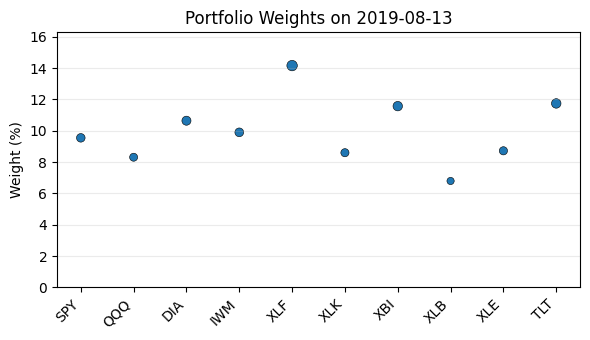


=== Rebalance on 2019-09-10 ===
Optimal portfolio
----------------------
 Investment in SPY : 10.1%
 Investment in QQQ : 9.52%
 Investment in DIA : 10.47%
 Investment in IWM : 10.5%
 Investment in XLF : 13.32%
 Investment in XLK : 6.62%
 Investment in XBI : 9.09%
 Investment in XLB : 8.02%
 Investment in XLE : 11.11%
 Investment in TLT : 11.24%
Cash: 0.0
----------------------
Exp ret = 0.6988802501618101%
Expected risk = 0.001459980711002987%


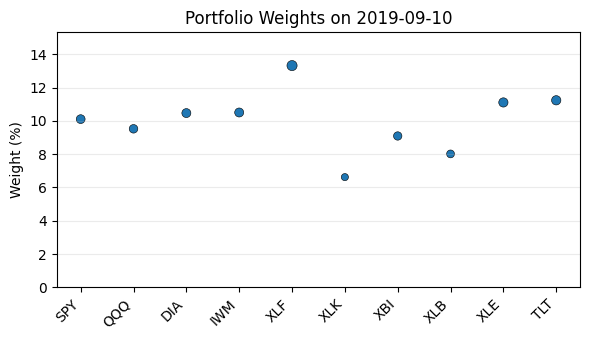


=== Rebalance on 2019-10-08 ===
Optimal portfolio
----------------------
 Investment in SPY : 10.19%
 Investment in QQQ : 9.86%
 Investment in DIA : 10.23%
 Investment in IWM : 10.58%
 Investment in XLF : 15.55%
 Investment in XLK : 6.1%
 Investment in XBI : 9.65%
 Investment in XLB : 7.01%
 Investment in XLE : 10.28%
 Investment in TLT : 10.55%
Cash: 0.0
----------------------
Exp ret = -0.31835178075937876%
Expected risk = 0.0012726769710114496%


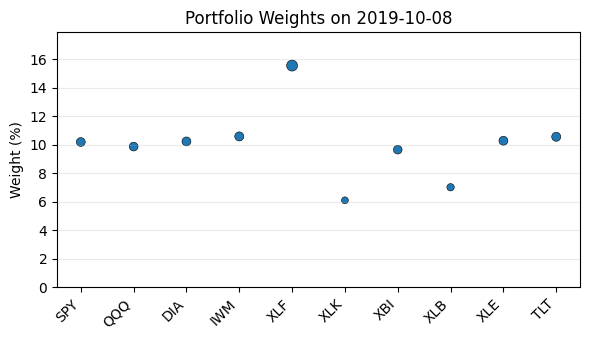


=== Rebalance on 2019-11-05 ===
Optimal portfolio
----------------------
 Investment in SPY : 10.3%
 Investment in QQQ : 10.63%
 Investment in DIA : 10.64%
 Investment in IWM : 10.29%
 Investment in XLF : 6.31%
 Investment in XLK : 7.92%
 Investment in XBI : 9.97%
 Investment in XLB : 10.67%
 Investment in XLE : 12.2%
 Investment in TLT : 11.07%
Cash: 0.0
----------------------
Exp ret = 2.017730569896089%
Expected risk = 0.0009385399728026233%


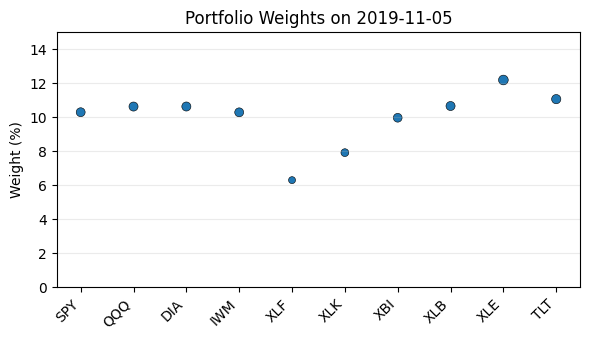


=== Rebalance on 2019-12-03 ===
Optimal portfolio
----------------------
 Investment in SPY : 9.74%
 Investment in QQQ : 9.21%
 Investment in DIA : 11.06%
 Investment in IWM : 10.27%
 Investment in XLF : 8.58%
 Investment in XLK : 13.03%
 Investment in XBI : 9.6%
 Investment in XLB : 5.72%
 Investment in XLE : 11.07%
 Investment in TLT : 11.73%
Cash: 0.0
----------------------
Exp ret = 1.6448094990288757%
Expected risk = 0.0005417864690774724%


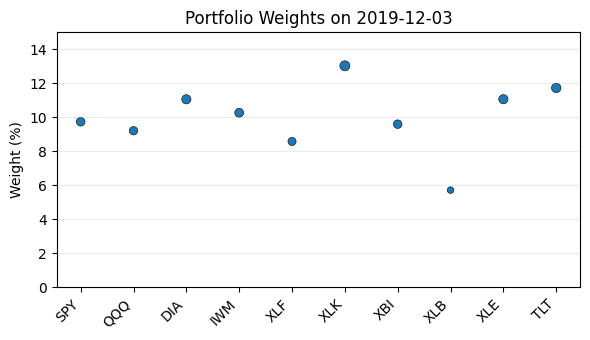


=== Rebalance on 2019-12-31 ===
Optimal portfolio
----------------------
 Investment in SPY : 8.93%
 Investment in QQQ : 10.69%
 Investment in DIA : 10.82%
 Investment in IWM : 9.87%
 Investment in XLF : 4.69%
 Investment in XLK : 15.64%
 Investment in XBI : 9.3%
 Investment in XLB : 7.88%
 Investment in XLE : 10.86%
 Investment in TLT : 11.32%
Cash: 0.0
----------------------
Exp ret = 3.9001744039440713%
Expected risk = 0.00033920549899831747%


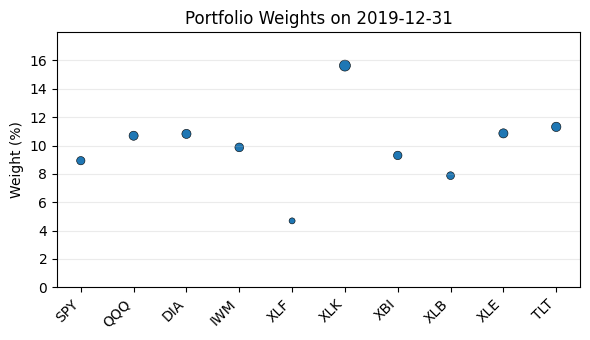


=== Rebalance on 2020-01-28 ===
Optimal portfolio
----------------------
 Investment in SPY : 9.75%
 Investment in QQQ : 9.7%
 Investment in DIA : 12.02%
 Investment in IWM : 10.58%
 Investment in XLF : 11.39%
 Investment in XLK : 11.83%
 Investment in XBI : 7.22%
 Investment in XLB : 5.98%
 Investment in XLE : 8.66%
 Investment in TLT : 12.86%
Cash: 0.0
----------------------
Exp ret = 1.8647190264627675%
Expected risk = 0.0006785911522717089%


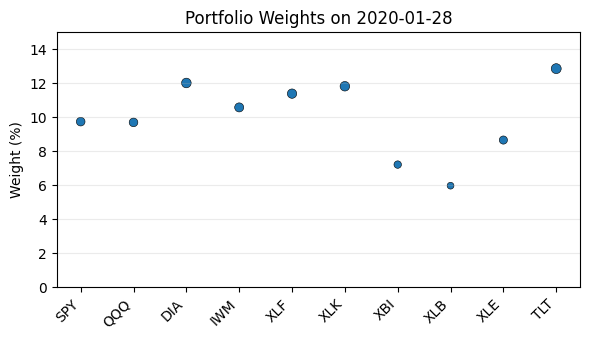


=== Rebalance on 2020-02-25 ===
Optimal portfolio
----------------------
 Investment in SPY : 9.38%
 Investment in QQQ : 9.27%
 Investment in DIA : 13.12%
 Investment in IWM : 10.69%
 Investment in XLF : 13.03%
 Investment in XLK : 9.13%
 Investment in XBI : 8.47%
 Investment in XLB : 4.7%
 Investment in XLE : 8.69%
 Investment in TLT : 13.51%
Cash: 0.0
----------------------
Exp ret = 1.2435965643729496%
Expected risk = 0.001421443956660564%


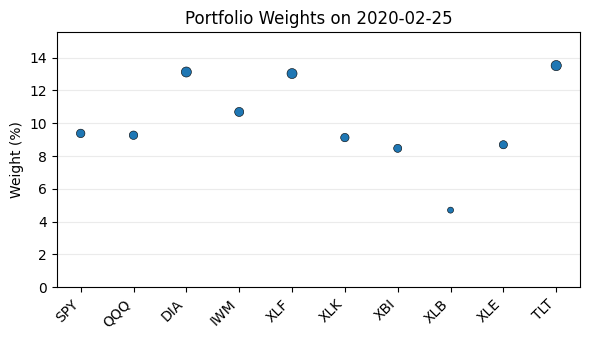


=== Rebalance on 2020-03-24 ===
Optimal portfolio
----------------------
 Investment in SPY : 6.28%
 Investment in QQQ : 3.54%
 Investment in DIA : 14.81%
 Investment in IWM : 8.67%
 Investment in XLF : 33.5%
 Investment in XLK : 11.89%
 Investment in XBI : 5.91%
 Investment in XLB : 1.0%
 Investment in XLE : 1.25%
 Investment in TLT : 13.13%
Cash: 0.0
----------------------
Exp ret = -4.793858536837159%
Expected risk = 0.005250192173916385%


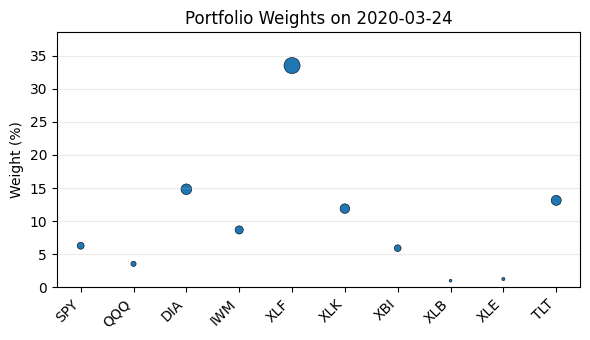


=== Rebalance on 2020-04-21 ===
Optimal portfolio
----------------------
 Investment in SPY : 8.3%
 Investment in QQQ : 3.36%
 Investment in DIA : 13.65%
 Investment in IWM : 9.85%
 Investment in XLF : 21.79%
 Investment in XLK : 18.59%
 Investment in XBI : 8.49%
 Investment in XLB : 1.0%
 Investment in XLE : 3.22%
 Investment in TLT : 11.75%
Cash: 0.0
----------------------
Exp ret = -0.025498650919766407%
Expected risk = 0.017431560474370347%


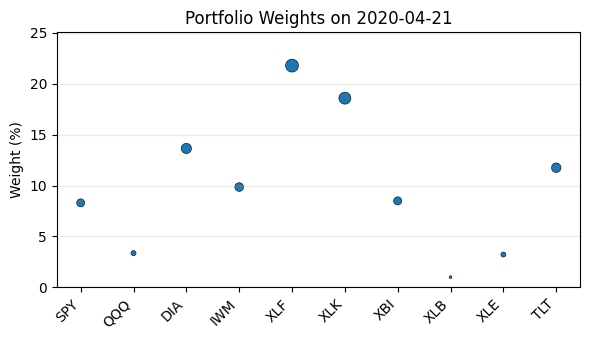


=== Rebalance on 2020-05-19 ===
Optimal portfolio
----------------------
 Investment in SPY : 7.96%
 Investment in QQQ : 6.24%
 Investment in DIA : 13.16%
 Investment in IWM : 9.35%
 Investment in XLF : 12.82%
 Investment in XLK : 18.09%
 Investment in XBI : 10.53%
 Investment in XLB : 7.3%
 Investment in XLE : 2.15%
 Investment in TLT : 12.4%
Cash: 0.0
----------------------
Exp ret = 1.9387138300165898%
Expected risk = 0.025533321204327462%


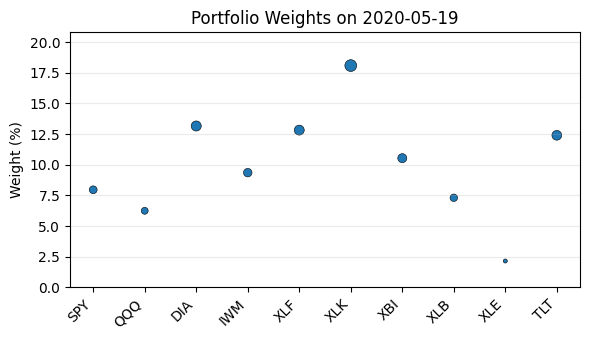


=== Rebalance on 2020-06-16 ===
Optimal portfolio
----------------------
 Investment in SPY : 8.08%
 Investment in QQQ : 10.98%
 Investment in DIA : 11.04%
 Investment in IWM : 8.47%
 Investment in XLF : 1.0%
 Investment in XLK : 14.31%
 Investment in XBI : 10.5%
 Investment in XLB : 17.93%
 Investment in XLE : 7.32%
 Investment in TLT : 10.37%
Cash: 0.0
----------------------
Exp ret = 9.030731783473442%
Expected risk = 0.006564532650087025%


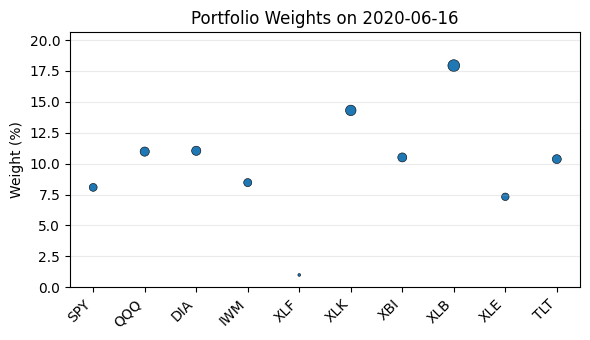


=== Rebalance on 2020-07-14 ===
Optimal portfolio
----------------------
 Investment in SPY : 9.32%
 Investment in QQQ : 9.98%
 Investment in DIA : 13.76%
 Investment in IWM : 9.83%
 Investment in XLF : 5.26%
 Investment in XLK : 11.51%
 Investment in XBI : 11.5%
 Investment in XLB : 7.24%
 Investment in XLE : 8.4%
 Investment in TLT : 13.2%
Cash: 0.0
----------------------
Exp ret = 4.456354821685822%
Expected risk = 0.004081928128339017%


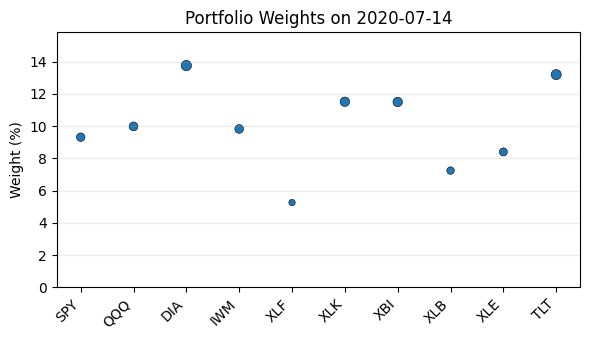


=== Rebalance on 2020-08-11 ===
Optimal portfolio
----------------------
 Investment in SPY : 10.53%
 Investment in QQQ : 12.01%
 Investment in DIA : 11.92%
 Investment in IWM : 10.45%
 Investment in XLF : 5.44%
 Investment in XLK : 7.84%
 Investment in XBI : 12.37%
 Investment in XLB : 6.19%
 Investment in XLE : 11.32%
 Investment in TLT : 11.93%
Cash: 0.0
----------------------
Exp ret = 5.245342937160994%
Expected risk = 0.004511043967093119%


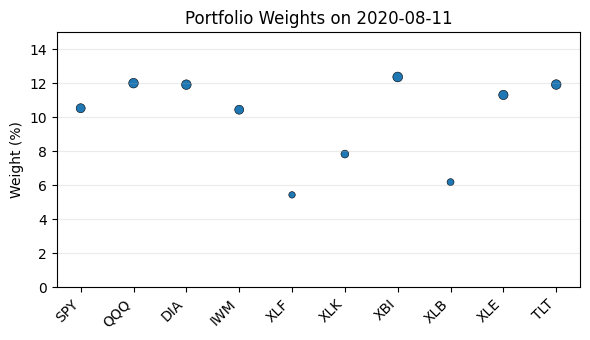


=== Rebalance on 2020-09-08 ===
Optimal portfolio
----------------------
 Investment in SPY : 11.11%
 Investment in QQQ : 10.52%
 Investment in DIA : 13.83%
 Investment in IWM : 11.92%
 Investment in XLF : 7.43%
 Investment in XLK : 4.69%
 Investment in XBI : 13.93%
 Investment in XLB : 2.71%
 Investment in XLE : 10.47%
 Investment in TLT : 13.41%
Cash: 0.0
----------------------
Exp ret = 3.4230756375189784%
Expected risk = 0.0011968725531874818%


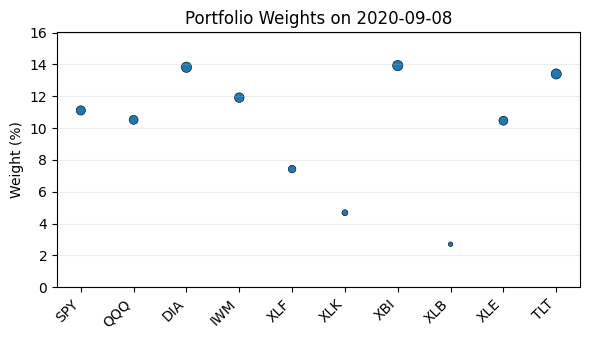


=== Rebalance on 2020-10-06 ===
Optimal portfolio
----------------------
 Investment in SPY : 11.81%
 Investment in QQQ : 12.72%
 Investment in DIA : 11.48%
 Investment in IWM : 11.43%
 Investment in XLF : 7.1%
 Investment in XLK : 7.64%
 Investment in XBI : 12.24%
 Investment in XLB : 2.0%
 Investment in XLE : 11.01%
 Investment in TLT : 12.57%
Cash: 0.0
----------------------
Exp ret = 1.6427670763099003%
Expected risk = 0.0010493754363507053%


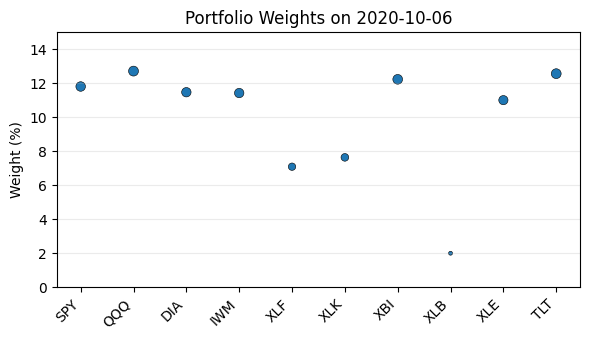


=== Rebalance on 2020-11-03 ===
Optimal portfolio
----------------------
 Investment in SPY : 10.1%
 Investment in QQQ : 11.13%
 Investment in DIA : 10.79%
 Investment in IWM : 10.67%
 Investment in XLF : 10.12%
 Investment in XLK : 11.25%
 Investment in XBI : 13.4%
 Investment in XLB : 1.2%
 Investment in XLE : 10.94%
 Investment in TLT : 10.4%
Cash: 0.0
----------------------
Exp ret = -0.344429965383167%
Expected risk = 0.0016072002946353164%


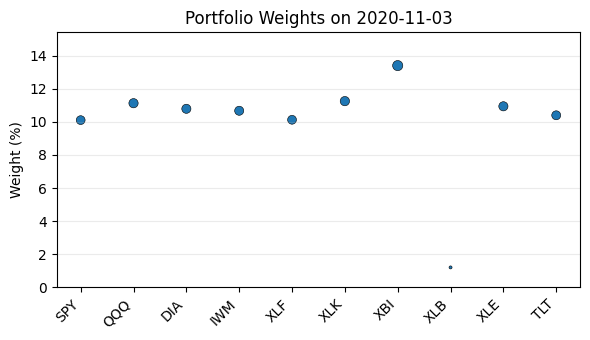


=== Rebalance on 2020-12-01 ===
Optimal portfolio
----------------------
 Investment in SPY : 8.48%
 Investment in QQQ : 13.62%
 Investment in DIA : 9.63%
 Investment in IWM : 8.96%
 Investment in XLF : 4.35%
 Investment in XLK : 13.84%
 Investment in XBI : 9.16%
 Investment in XLB : 11.95%
 Investment in XLE : 10.97%
 Investment in TLT : 9.04%
Cash: 0.0
----------------------
Exp ret = 4.298254986166699%
Expected risk = 0.004328394446691663%


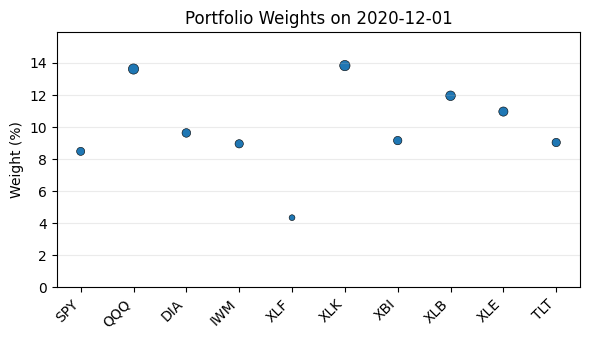


=== Performance 2019 ===
Average Monthly Return   : 0.53%
Monthly Sharpe Ratio     : 0.218
Annualized Sharpe Ratio  : 0.756
Maximum Drawdown         : 4.08%

=== Performance 2020 ===
Average Monthly Return   : -0.54%
Monthly Sharpe Ratio     : -0.067
Annualized Sharpe Ratio  : -0.232
Maximum Drawdown         : 23.87%


In [40]:
print("\nTesting CVaR PBR Regularization:")
rebalance_with_regularization(reg_type="CVAR_PBR", gamma=0.045, epsilon=0.4, verbose=True, start_date=start_date, end_date=end_date);

## Manual Parameter Testing & Sensitivity Analysis

In [41]:
gamma_val   = 0.01   # e.g. 0.005, 0.01, 0.015, 0.02, 0.025, 0.03, 0.035, 0.04, 0.045, 0.05
epsilon_val = 0.3    # e.g. 0.10, 0.15, 0.20, 0.25, 0.30, 0.35, 0.40, 0.45, 0.500

models = ["L1", "L2", "PBR", "CVAR_PBR"]
records = []

for model in models:
    rets, weights = rebalance_with_regularization(reg_type=model,
                                                   gamma=gamma_val,
                                                   epsilon=epsilon_val)
    # true out-of-sample monthly Sharpe (annualized via √12)
    sr_m = np.mean(rets) / np.std(rets)
    sr_a = sr_m * np.sqrt(12)

    # sparsity = fraction of zero weights
    sparsity = np.sum(weights == 0) / len(weights)

    records.append({
        "model":        model,
        "gamma":        gamma_val,
        "epsilon":      epsilon_val,
        "SharpeRatio":  round(sr_a,   3),
        "sparsity":     round(sparsity, 3)
    })

df_results = pd.DataFrame(records)
print(df_results)

[*********************100%***********************]  10 of 10 completed
[*********************100%***********************]  10 of 10 completed
[*********************100%***********************]  10 of 10 completed
[*********************100%***********************]  10 of 10 completed


      model  gamma  epsilon  SharpeRatio  sparsity
0        L1   0.01      0.3        0.817       0.0
1        L2   0.01      0.3        0.825       0.0
2       PBR   0.01      0.3        0.873       0.0
3  CVAR_PBR   0.01      0.3        0.868       0.0


## Metrics Across all Regularization Strategies

In [42]:
# Best hyperparameters for each regularized strategy
best_params = {
    "L1 Reg.":       {"reg_type": "L1",        "gamma":   0.02},
    "L2 Reg.":       {"reg_type": "L2",        "gamma":   0.05},
    "BPR Reg.":      {"reg_type": "PBR",       "gamma":   0.01,  "epsilon": 0.3},
    "CVaR BPR Reg.": {"reg_type": "CVAR_PBR",  "gamma":   0.045, "epsilon": 0.4}
}

records = []

for label, params in best_params.items():
    rt, wt = (
        rebalance_with_regularization(reg_type=params["reg_type"],
                                      gamma=params["gamma"])
        if params["reg_type"] in ["L1", "L2"]
        else
        rebalance_with_regularization(reg_type=params["reg_type"],
                                      gamma=params["gamma"],
                                      epsilon=params["epsilon"])
    )
    avg_ret    = np.mean(rt)
    monthly_sr = avg_ret / np.std(rt)
    annual_sr  = monthly_sr * np.sqrt(12)

    records.append({
        "Model":                   label,
        "Avg Monthly Return":      round(avg_ret,           7),
        "Monthly Sharpe Ratio":    round(monthly_sr,        7),
        "Annualized Sharpe Ratio": round(annual_sr,         7)
    })

df_summary = pd.DataFrame(records)
print(df_summary)

[*********************100%***********************]  10 of 10 completed
[*********************100%***********************]  10 of 10 completed
[*********************100%***********************]  10 of 10 completed
[*********************100%***********************]  10 of 10 completed


           Model  Avg Monthly Return  Monthly Sharpe Ratio  \
0        L1 Reg.            0.007702              0.235811   
1        L2 Reg.            0.007433              0.242904   
2       BPR Reg.            0.007202              0.252132   
3  CVaR BPR Reg.            0.007203              0.250644   

   Annualized Sharpe Ratio  
0                 0.816871  
1                 0.841444  
2                 0.873410  
3                 0.868257  
